In [409]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
from matplotlib import dates
import datetime

## 댓글 데이터가 존재하는 게임 리스트

In [59]:
inven_data = pd.read_csv('InvenComment_with_label.csv')
steam_data = pd.read_csv('SteamComment_with_label.csv')
youtube_data = pd.read_csv('YoutubeComment_with_label.csv')

In [35]:
game_list = inven_data['GameName'].unique().tolist() + steam_data['GameName'].unique().tolist() + youtube_data['GameName'].unique().tolist()

In [38]:
game_list = set(game_list)
game_list

{'APEX LEGENDS',
 "Conqueror's Blade",
 'Counter-Strike : Global Offensive',
 'DJMAX RESPECT V',
 'Dead by Daylight',
 'Destiny: Guardians',
 'Escape from Tarkov',
 'FIFA 온라인 4',
 'Monster Hunter : World',
 'R2',
 'Rust',
 'War Thunder',
 '거상',
 '검은사막',
 '겟앰프드',
 '넷마블 바둑',
 '넷마블 바둑nTV',
 '던전앤파이터',
 '디아블로2',
 '디아블로2: 레저렉션',
 '디아블로3',
 '라그나로크',
 '라테일',
 '레인보우식스 시즈',
 '로스트아크',
 '리그 오브 레전드',
 '리니지2',
 '마구마구',
 '마비노기',
 '마비노기 영웅전',
 '메이플스토리',
 '몬스터헌터',
 '뮤 온라인',
 '바람의 나라',
 '발로란트',
 '블레이드 & 소울',
 '사이퍼즈',
 '서든어택',
 '소울워커',
 '스타크래프트 리마스터',
 '스페셜포스',
 '아바',
 '아키에이지',
 '엘리온',
 '엘소드',
 '오디션',
 '오로바둑',
 '오버워치',
 '워크래프트3 리포지드',
 '월드 오브 워크래프트',
 '월드 오브 탱크',
 '이카루스',
 '이터널 리턴',
 '천애명월도',
 '카발온라인',
 '카운터-스트라이크 온라인',
 '카트라이더',
 '콜 오브 듀티: 모던 워페어',
 '크레이지아케이드',
 '클로저스',
 '테라',
 '테일즈런너',
 '패스 오브 엑자일',
 '피망 고스톱',
 '하스스톤',
 '한게임 라스베가스 포커',
 '한게임 로우바둑이',
 '한게임 신맞고',
 '히어로즈 오브 더 스톰'}

In [88]:
len(game_list)

69

## 각 댓글 데이터 시간 정리
- 더 로그 데이터의 시간인 2016.06월 - 2021.10월 까지만 이용
- 일별 데이터 월별로 정리
- 각 게임 마다 월별 인벤, 스팀, 유튜브 댓글의 부정 댓글 및 긍정 댓글 수를 데이터 프레임으로 제작

In [60]:
inven_data['date'] = pd.to_datetime(inven_data['date'])
steam_data['date'] = pd.to_datetime(steam_data['date'])
youtube_data['date'] = pd.to_datetime(youtube_data['date'])

print(type(inven_data['date'][0]))
print(type(steam_data['date'][0]))
print(type(youtube_data['date'][0]))

<class 'pandas._libs.tslibs.timestamps.Timestamp'>
<class 'pandas._libs.tslibs.timestamps.Timestamp'>
<class 'pandas._libs.tslibs.timestamps.Timestamp'>


In [75]:
start_date = datetime.datetime(2016, 5, 31)
end_date = datetime.datetime(2021, 11, 1)


inven_data = inven_data.sort_values(by='date')
inven_data = inven_data[(inven_data['date'] > start_date) & (inven_data['date'] < end_date)]

inven_data = inven_data.reset_index (drop = True)
inven_data

,date,text,GameName,score,label
0,2016-06-01,사스가 없데이트,블레이드 & 소울,0.327772,negative
1,2016-06-01,입장권이 뭐시 중헌디 뭐시 중헌디 시즌제로 바꺼 시벌럼아,블레이드 & 소울,0.355365,negative
2,2016-06-01,뒤바뀐 이벤트 할 때 남케들 저거 줘도 되니까 여케들도 남케 옷 줘랑,블레이드 & 소울,0.613071,positive
3,2016-06-01,없데이트라니 수영복있는데요,블레이드 & 소울,0.451858,negative
4,2016-06-01,최소 200원부터,FIFA 온라인 4,0.444777,negative
...,...,...,...,...,...
366919,2021-10-31,처음에는 야생카드들 정규에 들어올때는 신선했는데 그것도 잠시 뿐이고 메타가 또 고착...,하스스톤,0.047513,negative
366920,2021-10-31,스톰윈드인플레는 심해도 너무 심한수준이 맞다는거 누구나 인정하는 부분이고 이걸 템포...,하스스톤,0.146890,negative
366921,2021-10-31,요번에 제대로 못챙겨보고 있는데 앤디브루는 안나온건가요,월드 오브 워크래프트,0.742533,positive
366922,2021-10-31,중국 9티어 헤비 111 14를 줄여서 114라 부르고 있었는데 진짜 114가 나...,월드 오브 탱크,0.857040,positive


In [76]:
steam_data = steam_data.sort_values(by='date')
steam_data = steam_data[(steam_data['date'] > start_date) & (steam_data['date'] < end_date)]

steam_data = steam_data.reset_index (drop = True)
steam_data

,date,text,GameName,score,label
0,2016-06-01,시바 갓핵,Counter-Strike : Global Offensive,0.402081,negative
1,2016-06-01,너무 어려움 근데 개꿀잼 욕많이먹고오래살거같음 핵쟁이많음 다죽여버려야됨 극혐수준임,Counter-Strike : Global Offensive,0.095243,negative
2,2016-06-01,콜오브듀티 모던갓페어,콜 오브 듀티: 모던 워페어,0.729646,positive
3,2016-06-02,중소기업 겜 치고는 썩 쾐찮은 게임,War Thunder,0.338298,negative
4,2016-06-02,절대로 스킨을 사거나 상자를 열지 마세요 스킨을 사고싶어 장터에 들어가거나 열쇠를 ...,Counter-Strike : Global Offensive,0.107412,negative
...,...,...,...,...,...
51670,2021-10-31,베타때랑 시즌1때 하다가 짱깨핵쟁이새끼들땜에 접었다가 최근에 복귀했는데 재밌습니다 ...,APEX LEGENDS,0.176383,negative
51671,2021-10-31,타다다다다다당 와우,레인보우식스 시즈,0.577882,positive
51672,2021-10-31,혁신적이게 즐거운 플레이와 거지같이 엿먹이는 서버의 혼합,APEX LEGENDS,0.608853,positive
51673,2021-10-31,나도이제 챔피언에디션,APEX LEGENDS,0.509802,positive


In [77]:
youtube_data = youtube_data.sort_values(by='date') # 인벤 데이터 2010-07-10 부터 2021-11-13 까지
youtube_data = youtube_data[(youtube_data['date'] > start_date) & (youtube_data['date'] < end_date)]

youtube_data = youtube_data.reset_index (drop = True)
youtube_data

,date,text,GameName,score,label
0,2016-06-01,특이점이 온 로드호그,리그 오브 레전드,0.678990,positive
1,2016-06-01,장막을 들추고 미래를 보았지만 그곳에는 오직 망각뿐이었어,리그 오브 레전드,0.204618,negative
2,2016-06-01,내가 쓰레쉬유저이긴한데 후기보니까 이스킨끼면 당분간 좀 고생한다던데 그랩같은게 달라...,리그 오브 레전드,0.767173,positive
3,2016-06-01,오 쓸쉬 신스킨 개이득이다,리그 오브 레전드,0.895330,positive
4,2016-06-01,이야블츠도레전더리없는데 부럽네,리그 오브 레전드,0.703471,positive
...,...,...,...,...,...
863097,2021-10-31,왜 징크스는 버프 맥이고 제이스는 그대로냐,리그 오브 레전드,0.054263,negative
863098,2021-10-31,더빙으로 볼까 원어로 볼까 고민되네,리그 오브 레전드,0.907115,positive
863099,2021-10-31,와 개잘만들었는데,리그 오브 레전드,0.409338,negative
863100,2021-10-31,징크스 본명이 파우더 아 빨리 보고싶다,리그 오브 레전드,0.833778,positive


In [155]:
# 인벤, 스팀, 유튜브 댓글을 통합한 새 데이터 프레임 구축

comment_data = pd.DataFrame(columns=['Year', 'Month', 'GameName', 
                             'Inven_positive', 'Inven_negative', 
                             'Steam_positive', 'Steam_negative', 
                             'Youtube_positive', 'Youtube_negative'])

game_list = list(game_list)
years = [2016, 2017, 2018, 2019, 2020, 2021]
months = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

for year in years:
    for month in months:
        for game in game_list:
            comment_data = comment_data.append({'Year' : year, 'Month' : month, 'GameName' : game,
                                              'Inven_positive' : 0, 'Inven_negative' : 0,
                                              'Steam_positive' : 0, 'Steam_negative' : 0,
                                              'Youtube_positive' : 0, 'Youtube_negative' : 0}, ignore_index=True)
        

In [156]:
comment_data

,Year,Month,GameName,Inven_positive,Inven_negative,Steam_positive,Steam_negative,Youtube_positive,Youtube_negative
0,2016,1,리그 오브 레전드,0,0,0,0,0,0
1,2016,1,겟앰프드,0,0,0,0,0,0
2,2016,1,테라,0,0,0,0,0,0
3,2016,1,Destiny: Guardians,0,0,0,0,0,0
4,2016,1,리니지2,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
4963,2021,12,클로저스,0,0,0,0,0,0
4964,2021,12,테일즈런너,0,0,0,0,0,0
4965,2021,12,라그나로크,0,0,0,0,0,0
4966,2021,12,월드 오브 탱크,0,0,0,0,0,0


In [157]:
for i in inven_data.index:
    print(i)
    year = inven_data.iloc[i]['date'].year
    month = inven_data.iloc[i]['date'].month
    game_name = inven_data.iloc[i]['GameName']
    
    index = comment_data[(comment_data['Year'] == year) & 
                         (comment_data['Month'] == month) &
                         (comment_data['GameName'] == game_name)].index
    
    if inven_data.iloc[i]['label'] == 'positive':
        comment_data.loc[index, 'Inven_positive'] = comment_data.loc[index, 'Inven_positive'] + 1
    else:
        comment_data.loc[index, 'Inven_negative'] = comment_data.loc[index, 'Inven_negative'] + 1
            

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084


3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743
3744
3745
3746
3747
3748
3749
3750
3751
3752
3753
3754
3755
3756
3757
3758
3759
3760
3761
3762
3763
3764
3765
3766
3767
3768
3769
3770


5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379
5380
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390
5391
5392
5393
5394
5395
5396
5397
5398
5399
5400
5401
5402
5403
5404
5405
5406
5407
5408
5409
5410
5411
5412
5413
5414
5415
5416
5417
5418
5419
5420
5421
5422
5423
5424
5425
5426
5427
5428
5429
5430
5431
5432
5433
5434
5435
5436
5437
5438
5439
5440
5441
5442
5443
5444
5445
5446
5447
5448
5449
5450
5451
5452
5453
5454


6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987
6988
6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000
7001
7002
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7025
7026
7027
7028
7029
7030
7031
7032
7033
7034
7035
7036
7037
7038
7039
7040
7041
7042
7043
7044
7045
7046
7047
7048
7049
7050
7051
7052
7053
7054
7055
7056
7057
7058
7059
7060
7061
7062
7063
7064
7065
7066
7067
7068
7069
7070
7071
7072
7073
7074
7075
7076
7077
7078
7079
7080
7081
7082
7083
7084
7085
7086
7087
7088
7089
7090
7091
7092
7093
7094
7095
7096
7097
7098
7099
7100
7101
7102
7103
7104
7105
7106
7107
7108
7109
7110
7111
7112
7113
7114
7115
7116
7117
7118
7119
7120
7121
7122
7123
7124
7125
7126
7127
7128
7129
7130
7131
7132
7133
7134
7135
7136
7137
7138
7139
7140
7141
7142
7143
7144
7145
7146
7147


8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658
8659
8660
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670
8671
8672
8673
8674
8675
8676
8677
8678
8679
8680
8681
8682
8683
8684
8685
8686
8687
8688
8689
8690
8691
8692
8693
8694
8695
8696
8697
8698
8699
8700
8701
8702
8703
8704
8705
8706
8707
8708
8709
8710
8711
8712
8713
8714
8715
8716
8717
8718
8719
8720
8721
8722
8723
8724
8725
8726
8727
8728
8729
8730
8731
8732
8733
8734
8735
8736
8737
8738
8739
8740
8741
8742
8743
8744
8745
8746
8747
8748
8749
8750
8751
8752
8753
8754
8755
8756
8757
8758
8759
8760
8761
8762
8763
8764
8765
8766
8767
8768
8769
8770
8771
8772
8773
8774
8775
8776
8777
8778
8779
8780
8781
8782
8783
8784
8785
8786
8787
8788
8789
8790
8791
8792
8793
8794
8795
8796
8797
8798
8799
8800
8801
8802
8803
8804
8805
8806
8807
8808
8809
8810
8811
8812
8813
8814
8815
8816
8817
8818
8819
8820
8821
8822
8823
8824
8825
8826
8827
8828
8829
8830
8831
8832
8833
8834
8835
8836
8837
8838
8839
8840
8841
8842
8843
8844


10275
10276
10277
10278
10279
10280
10281
10282
10283
10284
10285
10286
10287
10288
10289
10290
10291
10292
10293
10294
10295
10296
10297
10298
10299
10300
10301
10302
10303
10304
10305
10306
10307
10308
10309
10310
10311
10312
10313
10314
10315
10316
10317
10318
10319
10320
10321
10322
10323
10324
10325
10326
10327
10328
10329
10330
10331
10332
10333
10334
10335
10336
10337
10338
10339
10340
10341
10342
10343
10344
10345
10346
10347
10348
10349
10350
10351
10352
10353
10354
10355
10356
10357
10358
10359
10360
10361
10362
10363
10364
10365
10366
10367
10368
10369
10370
10371
10372
10373
10374
10375
10376
10377
10378
10379
10380
10381
10382
10383
10384
10385
10386
10387
10388
10389
10390
10391
10392
10393
10394
10395
10396
10397
10398
10399
10400
10401
10402
10403
10404
10405
10406
10407
10408
10409
10410
10411
10412
10413
10414
10415
10416
10417
10418
10419
10420
10421
10422
10423
10424
10425
10426
10427
10428
10429
10430
10431
10432
10433
10434
10435
10436
10437
10438
10439
10440
1044

11684
11685
11686
11687
11688
11689
11690
11691
11692
11693
11694
11695
11696
11697
11698
11699
11700
11701
11702
11703
11704
11705
11706
11707
11708
11709
11710
11711
11712
11713
11714
11715
11716
11717
11718
11719
11720
11721
11722
11723
11724
11725
11726
11727
11728
11729
11730
11731
11732
11733
11734
11735
11736
11737
11738
11739
11740
11741
11742
11743
11744
11745
11746
11747
11748
11749
11750
11751
11752
11753
11754
11755
11756
11757
11758
11759
11760
11761
11762
11763
11764
11765
11766
11767
11768
11769
11770
11771
11772
11773
11774
11775
11776
11777
11778
11779
11780
11781
11782
11783
11784
11785
11786
11787
11788
11789
11790
11791
11792
11793
11794
11795
11796
11797
11798
11799
11800
11801
11802
11803
11804
11805
11806
11807
11808
11809
11810
11811
11812
11813
11814
11815
11816
11817
11818
11819
11820
11821
11822
11823
11824
11825
11826
11827
11828
11829
11830
11831
11832
11833
11834
11835
11836
11837
11838
11839
11840
11841
11842
11843
11844
11845
11846
11847
11848
11849
1185

13065
13066
13067
13068
13069
13070
13071
13072
13073
13074
13075
13076
13077
13078
13079
13080
13081
13082
13083
13084
13085
13086
13087
13088
13089
13090
13091
13092
13093
13094
13095
13096
13097
13098
13099
13100
13101
13102
13103
13104
13105
13106
13107
13108
13109
13110
13111
13112
13113
13114
13115
13116
13117
13118
13119
13120
13121
13122
13123
13124
13125
13126
13127
13128
13129
13130
13131
13132
13133
13134
13135
13136
13137
13138
13139
13140
13141
13142
13143
13144
13145
13146
13147
13148
13149
13150
13151
13152
13153
13154
13155
13156
13157
13158
13159
13160
13161
13162
13163
13164
13165
13166
13167
13168
13169
13170
13171
13172
13173
13174
13175
13176
13177
13178
13179
13180
13181
13182
13183
13184
13185
13186
13187
13188
13189
13190
13191
13192
13193
13194
13195
13196
13197
13198
13199
13200
13201
13202
13203
13204
13205
13206
13207
13208
13209
13210
13211
13212
13213
13214
13215
13216
13217
13218
13219
13220
13221
13222
13223
13224
13225
13226
13227
13228
13229
13230
1323

14445
14446
14447
14448
14449
14450
14451
14452
14453
14454
14455
14456
14457
14458
14459
14460
14461
14462
14463
14464
14465
14466
14467
14468
14469
14470
14471
14472
14473
14474
14475
14476
14477
14478
14479
14480
14481
14482
14483
14484
14485
14486
14487
14488
14489
14490
14491
14492
14493
14494
14495
14496
14497
14498
14499
14500
14501
14502
14503
14504
14505
14506
14507
14508
14509
14510
14511
14512
14513
14514
14515
14516
14517
14518
14519
14520
14521
14522
14523
14524
14525
14526
14527
14528
14529
14530
14531
14532
14533
14534
14535
14536
14537
14538
14539
14540
14541
14542
14543
14544
14545
14546
14547
14548
14549
14550
14551
14552
14553
14554
14555
14556
14557
14558
14559
14560
14561
14562
14563
14564
14565
14566
14567
14568
14569
14570
14571
14572
14573
14574
14575
14576
14577
14578
14579
14580
14581
14582
14583
14584
14585
14586
14587
14588
14589
14590
14591
14592
14593
14594
14595
14596
14597
14598
14599
14600
14601
14602
14603
14604
14605
14606
14607
14608
14609
14610
1461

15840
15841
15842
15843
15844
15845
15846
15847
15848
15849
15850
15851
15852
15853
15854
15855
15856
15857
15858
15859
15860
15861
15862
15863
15864
15865
15866
15867
15868
15869
15870
15871
15872
15873
15874
15875
15876
15877
15878
15879
15880
15881
15882
15883
15884
15885
15886
15887
15888
15889
15890
15891
15892
15893
15894
15895
15896
15897
15898
15899
15900
15901
15902
15903
15904
15905
15906
15907
15908
15909
15910
15911
15912
15913
15914
15915
15916
15917
15918
15919
15920
15921
15922
15923
15924
15925
15926
15927
15928
15929
15930
15931
15932
15933
15934
15935
15936
15937
15938
15939
15940
15941
15942
15943
15944
15945
15946
15947
15948
15949
15950
15951
15952
15953
15954
15955
15956
15957
15958
15959
15960
15961
15962
15963
15964
15965
15966
15967
15968
15969
15970
15971
15972
15973
15974
15975
15976
15977
15978
15979
15980
15981
15982
15983
15984
15985
15986
15987
15988
15989
15990
15991
15992
15993
15994
15995
15996
15997
15998
15999
16000
16001
16002
16003
16004
16005
1600

17243
17244
17245
17246
17247
17248
17249
17250
17251
17252
17253
17254
17255
17256
17257
17258
17259
17260
17261
17262
17263
17264
17265
17266
17267
17268
17269
17270
17271
17272
17273
17274
17275
17276
17277
17278
17279
17280
17281
17282
17283
17284
17285
17286
17287
17288
17289
17290
17291
17292
17293
17294
17295
17296
17297
17298
17299
17300
17301
17302
17303
17304
17305
17306
17307
17308
17309
17310
17311
17312
17313
17314
17315
17316
17317
17318
17319
17320
17321
17322
17323
17324
17325
17326
17327
17328
17329
17330
17331
17332
17333
17334
17335
17336
17337
17338
17339
17340
17341
17342
17343
17344
17345
17346
17347
17348
17349
17350
17351
17352
17353
17354
17355
17356
17357
17358
17359
17360
17361
17362
17363
17364
17365
17366
17367
17368
17369
17370
17371
17372
17373
17374
17375
17376
17377
17378
17379
17380
17381
17382
17383
17384
17385
17386
17387
17388
17389
17390
17391
17392
17393
17394
17395
17396
17397
17398
17399
17400
17401
17402
17403
17404
17405
17406
17407
17408
1740

18621
18622
18623
18624
18625
18626
18627
18628
18629
18630
18631
18632
18633
18634
18635
18636
18637
18638
18639
18640
18641
18642
18643
18644
18645
18646
18647
18648
18649
18650
18651
18652
18653
18654
18655
18656
18657
18658
18659
18660
18661
18662
18663
18664
18665
18666
18667
18668
18669
18670
18671
18672
18673
18674
18675
18676
18677
18678
18679
18680
18681
18682
18683
18684
18685
18686
18687
18688
18689
18690
18691
18692
18693
18694
18695
18696
18697
18698
18699
18700
18701
18702
18703
18704
18705
18706
18707
18708
18709
18710
18711
18712
18713
18714
18715
18716
18717
18718
18719
18720
18721
18722
18723
18724
18725
18726
18727
18728
18729
18730
18731
18732
18733
18734
18735
18736
18737
18738
18739
18740
18741
18742
18743
18744
18745
18746
18747
18748
18749
18750
18751
18752
18753
18754
18755
18756
18757
18758
18759
18760
18761
18762
18763
18764
18765
18766
18767
18768
18769
18770
18771
18772
18773
18774
18775
18776
18777
18778
18779
18780
18781
18782
18783
18784
18785
18786
1878

20034
20035
20036
20037
20038
20039
20040
20041
20042
20043
20044
20045
20046
20047
20048
20049
20050
20051
20052
20053
20054
20055
20056
20057
20058
20059
20060
20061
20062
20063
20064
20065
20066
20067
20068
20069
20070
20071
20072
20073
20074
20075
20076
20077
20078
20079
20080
20081
20082
20083
20084
20085
20086
20087
20088
20089
20090
20091
20092
20093
20094
20095
20096
20097
20098
20099
20100
20101
20102
20103
20104
20105
20106
20107
20108
20109
20110
20111
20112
20113
20114
20115
20116
20117
20118
20119
20120
20121
20122
20123
20124
20125
20126
20127
20128
20129
20130
20131
20132
20133
20134
20135
20136
20137
20138
20139
20140
20141
20142
20143
20144
20145
20146
20147
20148
20149
20150
20151
20152
20153
20154
20155
20156
20157
20158
20159
20160
20161
20162
20163
20164
20165
20166
20167
20168
20169
20170
20171
20172
20173
20174
20175
20176
20177
20178
20179
20180
20181
20182
20183
20184
20185
20186
20187
20188
20189
20190
20191
20192
20193
20194
20195
20196
20197
20198
20199
2020

21409
21410
21411
21412
21413
21414
21415
21416
21417
21418
21419
21420
21421
21422
21423
21424
21425
21426
21427
21428
21429
21430
21431
21432
21433
21434
21435
21436
21437
21438
21439
21440
21441
21442
21443
21444
21445
21446
21447
21448
21449
21450
21451
21452
21453
21454
21455
21456
21457
21458
21459
21460
21461
21462
21463
21464
21465
21466
21467
21468
21469
21470
21471
21472
21473
21474
21475
21476
21477
21478
21479
21480
21481
21482
21483
21484
21485
21486
21487
21488
21489
21490
21491
21492
21493
21494
21495
21496
21497
21498
21499
21500
21501
21502
21503
21504
21505
21506
21507
21508
21509
21510
21511
21512
21513
21514
21515
21516
21517
21518
21519
21520
21521
21522
21523
21524
21525
21526
21527
21528
21529
21530
21531
21532
21533
21534
21535
21536
21537
21538
21539
21540
21541
21542
21543
21544
21545
21546
21547
21548
21549
21550
21551
21552
21553
21554
21555
21556
21557
21558
21559
21560
21561
21562
21563
21564
21565
21566
21567
21568
21569
21570
21571
21572
21573
21574
2157

22790
22791
22792
22793
22794
22795
22796
22797
22798
22799
22800
22801
22802
22803
22804
22805
22806
22807
22808
22809
22810
22811
22812
22813
22814
22815
22816
22817
22818
22819
22820
22821
22822
22823
22824
22825
22826
22827
22828
22829
22830
22831
22832
22833
22834
22835
22836
22837
22838
22839
22840
22841
22842
22843
22844
22845
22846
22847
22848
22849
22850
22851
22852
22853
22854
22855
22856
22857
22858
22859
22860
22861
22862
22863
22864
22865
22866
22867
22868
22869
22870
22871
22872
22873
22874
22875
22876
22877
22878
22879
22880
22881
22882
22883
22884
22885
22886
22887
22888
22889
22890
22891
22892
22893
22894
22895
22896
22897
22898
22899
22900
22901
22902
22903
22904
22905
22906
22907
22908
22909
22910
22911
22912
22913
22914
22915
22916
22917
22918
22919
22920
22921
22922
22923
22924
22925
22926
22927
22928
22929
22930
22931
22932
22933
22934
22935
22936
22937
22938
22939
22940
22941
22942
22943
22944
22945
22946
22947
22948
22949
22950
22951
22952
22953
22954
22955
2295

24198
24199
24200
24201
24202
24203
24204
24205
24206
24207
24208
24209
24210
24211
24212
24213
24214
24215
24216
24217
24218
24219
24220
24221
24222
24223
24224
24225
24226
24227
24228
24229
24230
24231
24232
24233
24234
24235
24236
24237
24238
24239
24240
24241
24242
24243
24244
24245
24246
24247
24248
24249
24250
24251
24252
24253
24254
24255
24256
24257
24258
24259
24260
24261
24262
24263
24264
24265
24266
24267
24268
24269
24270
24271
24272
24273
24274
24275
24276
24277
24278
24279
24280
24281
24282
24283
24284
24285
24286
24287
24288
24289
24290
24291
24292
24293
24294
24295
24296
24297
24298
24299
24300
24301
24302
24303
24304
24305
24306
24307
24308
24309
24310
24311
24312
24313
24314
24315
24316
24317
24318
24319
24320
24321
24322
24323
24324
24325
24326
24327
24328
24329
24330
24331
24332
24333
24334
24335
24336
24337
24338
24339
24340
24341
24342
24343
24344
24345
24346
24347
24348
24349
24350
24351
24352
24353
24354
24355
24356
24357
24358
24359
24360
24361
24362
24363
2436

25582
25583
25584
25585
25586
25587
25588
25589
25590
25591
25592
25593
25594
25595
25596
25597
25598
25599
25600
25601
25602
25603
25604
25605
25606
25607
25608
25609
25610
25611
25612
25613
25614
25615
25616
25617
25618
25619
25620
25621
25622
25623
25624
25625
25626
25627
25628
25629
25630
25631
25632
25633
25634
25635
25636
25637
25638
25639
25640
25641
25642
25643
25644
25645
25646
25647
25648
25649
25650
25651
25652
25653
25654
25655
25656
25657
25658
25659
25660
25661
25662
25663
25664
25665
25666
25667
25668
25669
25670
25671
25672
25673
25674
25675
25676
25677
25678
25679
25680
25681
25682
25683
25684
25685
25686
25687
25688
25689
25690
25691
25692
25693
25694
25695
25696
25697
25698
25699
25700
25701
25702
25703
25704
25705
25706
25707
25708
25709
25710
25711
25712
25713
25714
25715
25716
25717
25718
25719
25720
25721
25722
25723
25724
25725
25726
25727
25728
25729
25730
25731
25732
25733
25734
25735
25736
25737
25738
25739
25740
25741
25742
25743
25744
25745
25746
25747
2574

26974
26975
26976
26977
26978
26979
26980
26981
26982
26983
26984
26985
26986
26987
26988
26989
26990
26991
26992
26993
26994
26995
26996
26997
26998
26999
27000
27001
27002
27003
27004
27005
27006
27007
27008
27009
27010
27011
27012
27013
27014
27015
27016
27017
27018
27019
27020
27021
27022
27023
27024
27025
27026
27027
27028
27029
27030
27031
27032
27033
27034
27035
27036
27037
27038
27039
27040
27041
27042
27043
27044
27045
27046
27047
27048
27049
27050
27051
27052
27053
27054
27055
27056
27057
27058
27059
27060
27061
27062
27063
27064
27065
27066
27067
27068
27069
27070
27071
27072
27073
27074
27075
27076
27077
27078
27079
27080
27081
27082
27083
27084
27085
27086
27087
27088
27089
27090
27091
27092
27093
27094
27095
27096
27097
27098
27099
27100
27101
27102
27103
27104
27105
27106
27107
27108
27109
27110
27111
27112
27113
27114
27115
27116
27117
27118
27119
27120
27121
27122
27123
27124
27125
27126
27127
27128
27129
27130
27131
27132
27133
27134
27135
27136
27137
27138
27139
2714

28341
28342
28343
28344
28345
28346
28347
28348
28349
28350
28351
28352
28353
28354
28355
28356
28357
28358
28359
28360
28361
28362
28363
28364
28365
28366
28367
28368
28369
28370
28371
28372
28373
28374
28375
28376
28377
28378
28379
28380
28381
28382
28383
28384
28385
28386
28387
28388
28389
28390
28391
28392
28393
28394
28395
28396
28397
28398
28399
28400
28401
28402
28403
28404
28405
28406
28407
28408
28409
28410
28411
28412
28413
28414
28415
28416
28417
28418
28419
28420
28421
28422
28423
28424
28425
28426
28427
28428
28429
28430
28431
28432
28433
28434
28435
28436
28437
28438
28439
28440
28441
28442
28443
28444
28445
28446
28447
28448
28449
28450
28451
28452
28453
28454
28455
28456
28457
28458
28459
28460
28461
28462
28463
28464
28465
28466
28467
28468
28469
28470
28471
28472
28473
28474
28475
28476
28477
28478
28479
28480
28481
28482
28483
28484
28485
28486
28487
28488
28489
28490
28491
28492
28493
28494
28495
28496
28497
28498
28499
28500
28501
28502
28503
28504
28505
28506
2850

29707
29708
29709
29710
29711
29712
29713
29714
29715
29716
29717
29718
29719
29720
29721
29722
29723
29724
29725
29726
29727
29728
29729
29730
29731
29732
29733
29734
29735
29736
29737
29738
29739
29740
29741
29742
29743
29744
29745
29746
29747
29748
29749
29750
29751
29752
29753
29754
29755
29756
29757
29758
29759
29760
29761
29762
29763
29764
29765
29766
29767
29768
29769
29770
29771
29772
29773
29774
29775
29776
29777
29778
29779
29780
29781
29782
29783
29784
29785
29786
29787
29788
29789
29790
29791
29792
29793
29794
29795
29796
29797
29798
29799
29800
29801
29802
29803
29804
29805
29806
29807
29808
29809
29810
29811
29812
29813
29814
29815
29816
29817
29818
29819
29820
29821
29822
29823
29824
29825
29826
29827
29828
29829
29830
29831
29832
29833
29834
29835
29836
29837
29838
29839
29840
29841
29842
29843
29844
29845
29846
29847
29848
29849
29850
29851
29852
29853
29854
29855
29856
29857
29858
29859
29860
29861
29862
29863
29864
29865
29866
29867
29868
29869
29870
29871
29872
2987

31074
31075
31076
31077
31078
31079
31080
31081
31082
31083
31084
31085
31086
31087
31088
31089
31090
31091
31092
31093
31094
31095
31096
31097
31098
31099
31100
31101
31102
31103
31104
31105
31106
31107
31108
31109
31110
31111
31112
31113
31114
31115
31116
31117
31118
31119
31120
31121
31122
31123
31124
31125
31126
31127
31128
31129
31130
31131
31132
31133
31134
31135
31136
31137
31138
31139
31140
31141
31142
31143
31144
31145
31146
31147
31148
31149
31150
31151
31152
31153
31154
31155
31156
31157
31158
31159
31160
31161
31162
31163
31164
31165
31166
31167
31168
31169
31170
31171
31172
31173
31174
31175
31176
31177
31178
31179
31180
31181
31182
31183
31184
31185
31186
31187
31188
31189
31190
31191
31192
31193
31194
31195
31196
31197
31198
31199
31200
31201
31202
31203
31204
31205
31206
31207
31208
31209
31210
31211
31212
31213
31214
31215
31216
31217
31218
31219
31220
31221
31222
31223
31224
31225
31226
31227
31228
31229
31230
31231
31232
31233
31234
31235
31236
31237
31238
31239
3124

32502
32503
32504
32505
32506
32507
32508
32509
32510
32511
32512
32513
32514
32515
32516
32517
32518
32519
32520
32521
32522
32523
32524
32525
32526
32527
32528
32529
32530
32531
32532
32533
32534
32535
32536
32537
32538
32539
32540
32541
32542
32543
32544
32545
32546
32547
32548
32549
32550
32551
32552
32553
32554
32555
32556
32557
32558
32559
32560
32561
32562
32563
32564
32565
32566
32567
32568
32569
32570
32571
32572
32573
32574
32575
32576
32577
32578
32579
32580
32581
32582
32583
32584
32585
32586
32587
32588
32589
32590
32591
32592
32593
32594
32595
32596
32597
32598
32599
32600
32601
32602
32603
32604
32605
32606
32607
32608
32609
32610
32611
32612
32613
32614
32615
32616
32617
32618
32619
32620
32621
32622
32623
32624
32625
32626
32627
32628
32629
32630
32631
32632
32633
32634
32635
32636
32637
32638
32639
32640
32641
32642
32643
32644
32645
32646
32647
32648
32649
32650
32651
32652
32653
32654
32655
32656
32657
32658
32659
32660
32661
32662
32663
32664
32665
32666
32667
3266

33923
33924
33925
33926
33927
33928
33929
33930
33931
33932
33933
33934
33935
33936
33937
33938
33939
33940
33941
33942
33943
33944
33945
33946
33947
33948
33949
33950
33951
33952
33953
33954
33955
33956
33957
33958
33959
33960
33961
33962
33963
33964
33965
33966
33967
33968
33969
33970
33971
33972
33973
33974
33975
33976
33977
33978
33979
33980
33981
33982
33983
33984
33985
33986
33987
33988
33989
33990
33991
33992
33993
33994
33995
33996
33997
33998
33999
34000
34001
34002
34003
34004
34005
34006
34007
34008
34009
34010
34011
34012
34013
34014
34015
34016
34017
34018
34019
34020
34021
34022
34023
34024
34025
34026
34027
34028
34029
34030
34031
34032
34033
34034
34035
34036
34037
34038
34039
34040
34041
34042
34043
34044
34045
34046
34047
34048
34049
34050
34051
34052
34053
34054
34055
34056
34057
34058
34059
34060
34061
34062
34063
34064
34065
34066
34067
34068
34069
34070
34071
34072
34073
34074
34075
34076
34077
34078
34079
34080
34081
34082
34083
34084
34085
34086
34087
34088
3408

35337
35338
35339
35340
35341
35342
35343
35344
35345
35346
35347
35348
35349
35350
35351
35352
35353
35354
35355
35356
35357
35358
35359
35360
35361
35362
35363
35364
35365
35366
35367
35368
35369
35370
35371
35372
35373
35374
35375
35376
35377
35378
35379
35380
35381
35382
35383
35384
35385
35386
35387
35388
35389
35390
35391
35392
35393
35394
35395
35396
35397
35398
35399
35400
35401
35402
35403
35404
35405
35406
35407
35408
35409
35410
35411
35412
35413
35414
35415
35416
35417
35418
35419
35420
35421
35422
35423
35424
35425
35426
35427
35428
35429
35430
35431
35432
35433
35434
35435
35436
35437
35438
35439
35440
35441
35442
35443
35444
35445
35446
35447
35448
35449
35450
35451
35452
35453
35454
35455
35456
35457
35458
35459
35460
35461
35462
35463
35464
35465
35466
35467
35468
35469
35470
35471
35472
35473
35474
35475
35476
35477
35478
35479
35480
35481
35482
35483
35484
35485
35486
35487
35488
35489
35490
35491
35492
35493
35494
35495
35496
35497
35498
35499
35500
35501
35502
3550

36757
36758
36759
36760
36761
36762
36763
36764
36765
36766
36767
36768
36769
36770
36771
36772
36773
36774
36775
36776
36777
36778
36779
36780
36781
36782
36783
36784
36785
36786
36787
36788
36789
36790
36791
36792
36793
36794
36795
36796
36797
36798
36799
36800
36801
36802
36803
36804
36805
36806
36807
36808
36809
36810
36811
36812
36813
36814
36815
36816
36817
36818
36819
36820
36821
36822
36823
36824
36825
36826
36827
36828
36829
36830
36831
36832
36833
36834
36835
36836
36837
36838
36839
36840
36841
36842
36843
36844
36845
36846
36847
36848
36849
36850
36851
36852
36853
36854
36855
36856
36857
36858
36859
36860
36861
36862
36863
36864
36865
36866
36867
36868
36869
36870
36871
36872
36873
36874
36875
36876
36877
36878
36879
36880
36881
36882
36883
36884
36885
36886
36887
36888
36889
36890
36891
36892
36893
36894
36895
36896
36897
36898
36899
36900
36901
36902
36903
36904
36905
36906
36907
36908
36909
36910
36911
36912
36913
36914
36915
36916
36917
36918
36919
36920
36921
36922
3692

38165
38166
38167
38168
38169
38170
38171
38172
38173
38174
38175
38176
38177
38178
38179
38180
38181
38182
38183
38184
38185
38186
38187
38188
38189
38190
38191
38192
38193
38194
38195
38196
38197
38198
38199
38200
38201
38202
38203
38204
38205
38206
38207
38208
38209
38210
38211
38212
38213
38214
38215
38216
38217
38218
38219
38220
38221
38222
38223
38224
38225
38226
38227
38228
38229
38230
38231
38232
38233
38234
38235
38236
38237
38238
38239
38240
38241
38242
38243
38244
38245
38246
38247
38248
38249
38250
38251
38252
38253
38254
38255
38256
38257
38258
38259
38260
38261
38262
38263
38264
38265
38266
38267
38268
38269
38270
38271
38272
38273
38274
38275
38276
38277
38278
38279
38280
38281
38282
38283
38284
38285
38286
38287
38288
38289
38290
38291
38292
38293
38294
38295
38296
38297
38298
38299
38300
38301
38302
38303
38304
38305
38306
38307
38308
38309
38310
38311
38312
38313
38314
38315
38316
38317
38318
38319
38320
38321
38322
38323
38324
38325
38326
38327
38328
38329
38330
3833

39584
39585
39586
39587
39588
39589
39590
39591
39592
39593
39594
39595
39596
39597
39598
39599
39600
39601
39602
39603
39604
39605
39606
39607
39608
39609
39610
39611
39612
39613
39614
39615
39616
39617
39618
39619
39620
39621
39622
39623
39624
39625
39626
39627
39628
39629
39630
39631
39632
39633
39634
39635
39636
39637
39638
39639
39640
39641
39642
39643
39644
39645
39646
39647
39648
39649
39650
39651
39652
39653
39654
39655
39656
39657
39658
39659
39660
39661
39662
39663
39664
39665
39666
39667
39668
39669
39670
39671
39672
39673
39674
39675
39676
39677
39678
39679
39680
39681
39682
39683
39684
39685
39686
39687
39688
39689
39690
39691
39692
39693
39694
39695
39696
39697
39698
39699
39700
39701
39702
39703
39704
39705
39706
39707
39708
39709
39710
39711
39712
39713
39714
39715
39716
39717
39718
39719
39720
39721
39722
39723
39724
39725
39726
39727
39728
39729
39730
39731
39732
39733
39734
39735
39736
39737
39738
39739
39740
39741
39742
39743
39744
39745
39746
39747
39748
39749
3975

40950
40951
40952
40953
40954
40955
40956
40957
40958
40959
40960
40961
40962
40963
40964
40965
40966
40967
40968
40969
40970
40971
40972
40973
40974
40975
40976
40977
40978
40979
40980
40981
40982
40983
40984
40985
40986
40987
40988
40989
40990
40991
40992
40993
40994
40995
40996
40997
40998
40999
41000
41001
41002
41003
41004
41005
41006
41007
41008
41009
41010
41011
41012
41013
41014
41015
41016
41017
41018
41019
41020
41021
41022
41023
41024
41025
41026
41027
41028
41029
41030
41031
41032
41033
41034
41035
41036
41037
41038
41039
41040
41041
41042
41043
41044
41045
41046
41047
41048
41049
41050
41051
41052
41053
41054
41055
41056
41057
41058
41059
41060
41061
41062
41063
41064
41065
41066
41067
41068
41069
41070
41071
41072
41073
41074
41075
41076
41077
41078
41079
41080
41081
41082
41083
41084
41085
41086
41087
41088
41089
41090
41091
41092
41093
41094
41095
41096
41097
41098
41099
41100
41101
41102
41103
41104
41105
41106
41107
41108
41109
41110
41111
41112
41113
41114
41115
4111

42352
42353
42354
42355
42356
42357
42358
42359
42360
42361
42362
42363
42364
42365
42366
42367
42368
42369
42370
42371
42372
42373
42374
42375
42376
42377
42378
42379
42380
42381
42382
42383
42384
42385
42386
42387
42388
42389
42390
42391
42392
42393
42394
42395
42396
42397
42398
42399
42400
42401
42402
42403
42404
42405
42406
42407
42408
42409
42410
42411
42412
42413
42414
42415
42416
42417
42418
42419
42420
42421
42422
42423
42424
42425
42426
42427
42428
42429
42430
42431
42432
42433
42434
42435
42436
42437
42438
42439
42440
42441
42442
42443
42444
42445
42446
42447
42448
42449
42450
42451
42452
42453
42454
42455
42456
42457
42458
42459
42460
42461
42462
42463
42464
42465
42466
42467
42468
42469
42470
42471
42472
42473
42474
42475
42476
42477
42478
42479
42480
42481
42482
42483
42484
42485
42486
42487
42488
42489
42490
42491
42492
42493
42494
42495
42496
42497
42498
42499
42500
42501
42502
42503
42504
42505
42506
42507
42508
42509
42510
42511
42512
42513
42514
42515
42516
42517
4251

43744
43745
43746
43747
43748
43749
43750
43751
43752
43753
43754
43755
43756
43757
43758
43759
43760
43761
43762
43763
43764
43765
43766
43767
43768
43769
43770
43771
43772
43773
43774
43775
43776
43777
43778
43779
43780
43781
43782
43783
43784
43785
43786
43787
43788
43789
43790
43791
43792
43793
43794
43795
43796
43797
43798
43799
43800
43801
43802
43803
43804
43805
43806
43807
43808
43809
43810
43811
43812
43813
43814
43815
43816
43817
43818
43819
43820
43821
43822
43823
43824
43825
43826
43827
43828
43829
43830
43831
43832
43833
43834
43835
43836
43837
43838
43839
43840
43841
43842
43843
43844
43845
43846
43847
43848
43849
43850
43851
43852
43853
43854
43855
43856
43857
43858
43859
43860
43861
43862
43863
43864
43865
43866
43867
43868
43869
43870
43871
43872
43873
43874
43875
43876
43877
43878
43879
43880
43881
43882
43883
43884
43885
43886
43887
43888
43889
43890
43891
43892
43893
43894
43895
43896
43897
43898
43899
43900
43901
43902
43903
43904
43905
43906
43907
43908
43909
4391

45126
45127
45128
45129
45130
45131
45132
45133
45134
45135
45136
45137
45138
45139
45140
45141
45142
45143
45144
45145
45146
45147
45148
45149
45150
45151
45152
45153
45154
45155
45156
45157
45158
45159
45160
45161
45162
45163
45164
45165
45166
45167
45168
45169
45170
45171
45172
45173
45174
45175
45176
45177
45178
45179
45180
45181
45182
45183
45184
45185
45186
45187
45188
45189
45190
45191
45192
45193
45194
45195
45196
45197
45198
45199
45200
45201
45202
45203
45204
45205
45206
45207
45208
45209
45210
45211
45212
45213
45214
45215
45216
45217
45218
45219
45220
45221
45222
45223
45224
45225
45226
45227
45228
45229
45230
45231
45232
45233
45234
45235
45236
45237
45238
45239
45240
45241
45242
45243
45244
45245
45246
45247
45248
45249
45250
45251
45252
45253
45254
45255
45256
45257
45258
45259
45260
45261
45262
45263
45264
45265
45266
45267
45268
45269
45270
45271
45272
45273
45274
45275
45276
45277
45278
45279
45280
45281
45282
45283
45284
45285
45286
45287
45288
45289
45290
45291
4529

46541
46542
46543
46544
46545
46546
46547
46548
46549
46550
46551
46552
46553
46554
46555
46556
46557
46558
46559
46560
46561
46562
46563
46564
46565
46566
46567
46568
46569
46570
46571
46572
46573
46574
46575
46576
46577
46578
46579
46580
46581
46582
46583
46584
46585
46586
46587
46588
46589
46590
46591
46592
46593
46594
46595
46596
46597
46598
46599
46600
46601
46602
46603
46604
46605
46606
46607
46608
46609
46610
46611
46612
46613
46614
46615
46616
46617
46618
46619
46620
46621
46622
46623
46624
46625
46626
46627
46628
46629
46630
46631
46632
46633
46634
46635
46636
46637
46638
46639
46640
46641
46642
46643
46644
46645
46646
46647
46648
46649
46650
46651
46652
46653
46654
46655
46656
46657
46658
46659
46660
46661
46662
46663
46664
46665
46666
46667
46668
46669
46670
46671
46672
46673
46674
46675
46676
46677
46678
46679
46680
46681
46682
46683
46684
46685
46686
46687
46688
46689
46690
46691
46692
46693
46694
46695
46696
46697
46698
46699
46700
46701
46702
46703
46704
46705
46706
4670

47908
47909
47910
47911
47912
47913
47914
47915
47916
47917
47918
47919
47920
47921
47922
47923
47924
47925
47926
47927
47928
47929
47930
47931
47932
47933
47934
47935
47936
47937
47938
47939
47940
47941
47942
47943
47944
47945
47946
47947
47948
47949
47950
47951
47952
47953
47954
47955
47956
47957
47958
47959
47960
47961
47962
47963
47964
47965
47966
47967
47968
47969
47970
47971
47972
47973
47974
47975
47976
47977
47978
47979
47980
47981
47982
47983
47984
47985
47986
47987
47988
47989
47990
47991
47992
47993
47994
47995
47996
47997
47998
47999
48000
48001
48002
48003
48004
48005
48006
48007
48008
48009
48010
48011
48012
48013
48014
48015
48016
48017
48018
48019
48020
48021
48022
48023
48024
48025
48026
48027
48028
48029
48030
48031
48032
48033
48034
48035
48036
48037
48038
48039
48040
48041
48042
48043
48044
48045
48046
48047
48048
48049
48050
48051
48052
48053
48054
48055
48056
48057
48058
48059
48060
48061
48062
48063
48064
48065
48066
48067
48068
48069
48070
48071
48072
48073
4807

49314
49315
49316
49317
49318
49319
49320
49321
49322
49323
49324
49325
49326
49327
49328
49329
49330
49331
49332
49333
49334
49335
49336
49337
49338
49339
49340
49341
49342
49343
49344
49345
49346
49347
49348
49349
49350
49351
49352
49353
49354
49355
49356
49357
49358
49359
49360
49361
49362
49363
49364
49365
49366
49367
49368
49369
49370
49371
49372
49373
49374
49375
49376
49377
49378
49379
49380
49381
49382
49383
49384
49385
49386
49387
49388
49389
49390
49391
49392
49393
49394
49395
49396
49397
49398
49399
49400
49401
49402
49403
49404
49405
49406
49407
49408
49409
49410
49411
49412
49413
49414
49415
49416
49417
49418
49419
49420
49421
49422
49423
49424
49425
49426
49427
49428
49429
49430
49431
49432
49433
49434
49435
49436
49437
49438
49439
49440
49441
49442
49443
49444
49445
49446
49447
49448
49449
49450
49451
49452
49453
49454
49455
49456
49457
49458
49459
49460
49461
49462
49463
49464
49465
49466
49467
49468
49469
49470
49471
49472
49473
49474
49475
49476
49477
49478
49479
4948

50687
50688
50689
50690
50691
50692
50693
50694
50695
50696
50697
50698
50699
50700
50701
50702
50703
50704
50705
50706
50707
50708
50709
50710
50711
50712
50713
50714
50715
50716
50717
50718
50719
50720
50721
50722
50723
50724
50725
50726
50727
50728
50729
50730
50731
50732
50733
50734
50735
50736
50737
50738
50739
50740
50741
50742
50743
50744
50745
50746
50747
50748
50749
50750
50751
50752
50753
50754
50755
50756
50757
50758
50759
50760
50761
50762
50763
50764
50765
50766
50767
50768
50769
50770
50771
50772
50773
50774
50775
50776
50777
50778
50779
50780
50781
50782
50783
50784
50785
50786
50787
50788
50789
50790
50791
50792
50793
50794
50795
50796
50797
50798
50799
50800
50801
50802
50803
50804
50805
50806
50807
50808
50809
50810
50811
50812
50813
50814
50815
50816
50817
50818
50819
50820
50821
50822
50823
50824
50825
50826
50827
50828
50829
50830
50831
50832
50833
50834
50835
50836
50837
50838
50839
50840
50841
50842
50843
50844
50845
50846
50847
50848
50849
50850
50851
50852
5085

52142
52143
52144
52145
52146
52147
52148
52149
52150
52151
52152
52153
52154
52155
52156
52157
52158
52159
52160
52161
52162
52163
52164
52165
52166
52167
52168
52169
52170
52171
52172
52173
52174
52175
52176
52177
52178
52179
52180
52181
52182
52183
52184
52185
52186
52187
52188
52189
52190
52191
52192
52193
52194
52195
52196
52197
52198
52199
52200
52201
52202
52203
52204
52205
52206
52207
52208
52209
52210
52211
52212
52213
52214
52215
52216
52217
52218
52219
52220
52221
52222
52223
52224
52225
52226
52227
52228
52229
52230
52231
52232
52233
52234
52235
52236
52237
52238
52239
52240
52241
52242
52243
52244
52245
52246
52247
52248
52249
52250
52251
52252
52253
52254
52255
52256
52257
52258
52259
52260
52261
52262
52263
52264
52265
52266
52267
52268
52269
52270
52271
52272
52273
52274
52275
52276
52277
52278
52279
52280
52281
52282
52283
52284
52285
52286
52287
52288
52289
52290
52291
52292
52293
52294
52295
52296
52297
52298
52299
52300
52301
52302
52303
52304
52305
52306
52307
5230

53549
53550
53551
53552
53553
53554
53555
53556
53557
53558
53559
53560
53561
53562
53563
53564
53565
53566
53567
53568
53569
53570
53571
53572
53573
53574
53575
53576
53577
53578
53579
53580
53581
53582
53583
53584
53585
53586
53587
53588
53589
53590
53591
53592
53593
53594
53595
53596
53597
53598
53599
53600
53601
53602
53603
53604
53605
53606
53607
53608
53609
53610
53611
53612
53613
53614
53615
53616
53617
53618
53619
53620
53621
53622
53623
53624
53625
53626
53627
53628
53629
53630
53631
53632
53633
53634
53635
53636
53637
53638
53639
53640
53641
53642
53643
53644
53645
53646
53647
53648
53649
53650
53651
53652
53653
53654
53655
53656
53657
53658
53659
53660
53661
53662
53663
53664
53665
53666
53667
53668
53669
53670
53671
53672
53673
53674
53675
53676
53677
53678
53679
53680
53681
53682
53683
53684
53685
53686
53687
53688
53689
53690
53691
53692
53693
53694
53695
53696
53697
53698
53699
53700
53701
53702
53703
53704
53705
53706
53707
53708
53709
53710
53711
53712
53713
53714
5371

54927
54928
54929
54930
54931
54932
54933
54934
54935
54936
54937
54938
54939
54940
54941
54942
54943
54944
54945
54946
54947
54948
54949
54950
54951
54952
54953
54954
54955
54956
54957
54958
54959
54960
54961
54962
54963
54964
54965
54966
54967
54968
54969
54970
54971
54972
54973
54974
54975
54976
54977
54978
54979
54980
54981
54982
54983
54984
54985
54986
54987
54988
54989
54990
54991
54992
54993
54994
54995
54996
54997
54998
54999
55000
55001
55002
55003
55004
55005
55006
55007
55008
55009
55010
55011
55012
55013
55014
55015
55016
55017
55018
55019
55020
55021
55022
55023
55024
55025
55026
55027
55028
55029
55030
55031
55032
55033
55034
55035
55036
55037
55038
55039
55040
55041
55042
55043
55044
55045
55046
55047
55048
55049
55050
55051
55052
55053
55054
55055
55056
55057
55058
55059
55060
55061
55062
55063
55064
55065
55066
55067
55068
55069
55070
55071
55072
55073
55074
55075
55076
55077
55078
55079
55080
55081
55082
55083
55084
55085
55086
55087
55088
55089
55090
55091
55092
5509

56331
56332
56333
56334
56335
56336
56337
56338
56339
56340
56341
56342
56343
56344
56345
56346
56347
56348
56349
56350
56351
56352
56353
56354
56355
56356
56357
56358
56359
56360
56361
56362
56363
56364
56365
56366
56367
56368
56369
56370
56371
56372
56373
56374
56375
56376
56377
56378
56379
56380
56381
56382
56383
56384
56385
56386
56387
56388
56389
56390
56391
56392
56393
56394
56395
56396
56397
56398
56399
56400
56401
56402
56403
56404
56405
56406
56407
56408
56409
56410
56411
56412
56413
56414
56415
56416
56417
56418
56419
56420
56421
56422
56423
56424
56425
56426
56427
56428
56429
56430
56431
56432
56433
56434
56435
56436
56437
56438
56439
56440
56441
56442
56443
56444
56445
56446
56447
56448
56449
56450
56451
56452
56453
56454
56455
56456
56457
56458
56459
56460
56461
56462
56463
56464
56465
56466
56467
56468
56469
56470
56471
56472
56473
56474
56475
56476
56477
56478
56479
56480
56481
56482
56483
56484
56485
56486
56487
56488
56489
56490
56491
56492
56493
56494
56495
56496
5649

57724
57725
57726
57727
57728
57729
57730
57731
57732
57733
57734
57735
57736
57737
57738
57739
57740
57741
57742
57743
57744
57745
57746
57747
57748
57749
57750
57751
57752
57753
57754
57755
57756
57757
57758
57759
57760
57761
57762
57763
57764
57765
57766
57767
57768
57769
57770
57771
57772
57773
57774
57775
57776
57777
57778
57779
57780
57781
57782
57783
57784
57785
57786
57787
57788
57789
57790
57791
57792
57793
57794
57795
57796
57797
57798
57799
57800
57801
57802
57803
57804
57805
57806
57807
57808
57809
57810
57811
57812
57813
57814
57815
57816
57817
57818
57819
57820
57821
57822
57823
57824
57825
57826
57827
57828
57829
57830
57831
57832
57833
57834
57835
57836
57837
57838
57839
57840
57841
57842
57843
57844
57845
57846
57847
57848
57849
57850
57851
57852
57853
57854
57855
57856
57857
57858
57859
57860
57861
57862
57863
57864
57865
57866
57867
57868
57869
57870
57871
57872
57873
57874
57875
57876
57877
57878
57879
57880
57881
57882
57883
57884
57885
57886
57887
57888
57889
5789

59109
59110
59111
59112
59113
59114
59115
59116
59117
59118
59119
59120
59121
59122
59123
59124
59125
59126
59127
59128
59129
59130
59131
59132
59133
59134
59135
59136
59137
59138
59139
59140
59141
59142
59143
59144
59145
59146
59147
59148
59149
59150
59151
59152
59153
59154
59155
59156
59157
59158
59159
59160
59161
59162
59163
59164
59165
59166
59167
59168
59169
59170
59171
59172
59173
59174
59175
59176
59177
59178
59179
59180
59181
59182
59183
59184
59185
59186
59187
59188
59189
59190
59191
59192
59193
59194
59195
59196
59197
59198
59199
59200
59201
59202
59203
59204
59205
59206
59207
59208
59209
59210
59211
59212
59213
59214
59215
59216
59217
59218
59219
59220
59221
59222
59223
59224
59225
59226
59227
59228
59229
59230
59231
59232
59233
59234
59235
59236
59237
59238
59239
59240
59241
59242
59243
59244
59245
59246
59247
59248
59249
59250
59251
59252
59253
59254
59255
59256
59257
59258
59259
59260
59261
59262
59263
59264
59265
59266
59267
59268
59269
59270
59271
59272
59273
59274
5927

60530
60531
60532
60533
60534
60535
60536
60537
60538
60539
60540
60541
60542
60543
60544
60545
60546
60547
60548
60549
60550
60551
60552
60553
60554
60555
60556
60557
60558
60559
60560
60561
60562
60563
60564
60565
60566
60567
60568
60569
60570
60571
60572
60573
60574
60575
60576
60577
60578
60579
60580
60581
60582
60583
60584
60585
60586
60587
60588
60589
60590
60591
60592
60593
60594
60595
60596
60597
60598
60599
60600
60601
60602
60603
60604
60605
60606
60607
60608
60609
60610
60611
60612
60613
60614
60615
60616
60617
60618
60619
60620
60621
60622
60623
60624
60625
60626
60627
60628
60629
60630
60631
60632
60633
60634
60635
60636
60637
60638
60639
60640
60641
60642
60643
60644
60645
60646
60647
60648
60649
60650
60651
60652
60653
60654
60655
60656
60657
60658
60659
60660
60661
60662
60663
60664
60665
60666
60667
60668
60669
60670
60671
60672
60673
60674
60675
60676
60677
60678
60679
60680
60681
60682
60683
60684
60685
60686
60687
60688
60689
60690
60691
60692
60693
60694
60695
6069

61936
61937
61938
61939
61940
61941
61942
61943
61944
61945
61946
61947
61948
61949
61950
61951
61952
61953
61954
61955
61956
61957
61958
61959
61960
61961
61962
61963
61964
61965
61966
61967
61968
61969
61970
61971
61972
61973
61974
61975
61976
61977
61978
61979
61980
61981
61982
61983
61984
61985
61986
61987
61988
61989
61990
61991
61992
61993
61994
61995
61996
61997
61998
61999
62000
62001
62002
62003
62004
62005
62006
62007
62008
62009
62010
62011
62012
62013
62014
62015
62016
62017
62018
62019
62020
62021
62022
62023
62024
62025
62026
62027
62028
62029
62030
62031
62032
62033
62034
62035
62036
62037
62038
62039
62040
62041
62042
62043
62044
62045
62046
62047
62048
62049
62050
62051
62052
62053
62054
62055
62056
62057
62058
62059
62060
62061
62062
62063
62064
62065
62066
62067
62068
62069
62070
62071
62072
62073
62074
62075
62076
62077
62078
62079
62080
62081
62082
62083
62084
62085
62086
62087
62088
62089
62090
62091
62092
62093
62094
62095
62096
62097
62098
62099
62100
62101
6210

63351
63352
63353
63354
63355
63356
63357
63358
63359
63360
63361
63362
63363
63364
63365
63366
63367
63368
63369
63370
63371
63372
63373
63374
63375
63376
63377
63378
63379
63380
63381
63382
63383
63384
63385
63386
63387
63388
63389
63390
63391
63392
63393
63394
63395
63396
63397
63398
63399
63400
63401
63402
63403
63404
63405
63406
63407
63408
63409
63410
63411
63412
63413
63414
63415
63416
63417
63418
63419
63420
63421
63422
63423
63424
63425
63426
63427
63428
63429
63430
63431
63432
63433
63434
63435
63436
63437
63438
63439
63440
63441
63442
63443
63444
63445
63446
63447
63448
63449
63450
63451
63452
63453
63454
63455
63456
63457
63458
63459
63460
63461
63462
63463
63464
63465
63466
63467
63468
63469
63470
63471
63472
63473
63474
63475
63476
63477
63478
63479
63480
63481
63482
63483
63484
63485
63486
63487
63488
63489
63490
63491
63492
63493
63494
63495
63496
63497
63498
63499
63500
63501
63502
63503
63504
63505
63506
63507
63508
63509
63510
63511
63512
63513
63514
63515
63516
6351

64758
64759
64760
64761
64762
64763
64764
64765
64766
64767
64768
64769
64770
64771
64772
64773
64774
64775
64776
64777
64778
64779
64780
64781
64782
64783
64784
64785
64786
64787
64788
64789
64790
64791
64792
64793
64794
64795
64796
64797
64798
64799
64800
64801
64802
64803
64804
64805
64806
64807
64808
64809
64810
64811
64812
64813
64814
64815
64816
64817
64818
64819
64820
64821
64822
64823
64824
64825
64826
64827
64828
64829
64830
64831
64832
64833
64834
64835
64836
64837
64838
64839
64840
64841
64842
64843
64844
64845
64846
64847
64848
64849
64850
64851
64852
64853
64854
64855
64856
64857
64858
64859
64860
64861
64862
64863
64864
64865
64866
64867
64868
64869
64870
64871
64872
64873
64874
64875
64876
64877
64878
64879
64880
64881
64882
64883
64884
64885
64886
64887
64888
64889
64890
64891
64892
64893
64894
64895
64896
64897
64898
64899
64900
64901
64902
64903
64904
64905
64906
64907
64908
64909
64910
64911
64912
64913
64914
64915
64916
64917
64918
64919
64920
64921
64922
64923
6492

66151
66152
66153
66154
66155
66156
66157
66158
66159
66160
66161
66162
66163
66164
66165
66166
66167
66168
66169
66170
66171
66172
66173
66174
66175
66176
66177
66178
66179
66180
66181
66182
66183
66184
66185
66186
66187
66188
66189
66190
66191
66192
66193
66194
66195
66196
66197
66198
66199
66200
66201
66202
66203
66204
66205
66206
66207
66208
66209
66210
66211
66212
66213
66214
66215
66216
66217
66218
66219
66220
66221
66222
66223
66224
66225
66226
66227
66228
66229
66230
66231
66232
66233
66234
66235
66236
66237
66238
66239
66240
66241
66242
66243
66244
66245
66246
66247
66248
66249
66250
66251
66252
66253
66254
66255
66256
66257
66258
66259
66260
66261
66262
66263
66264
66265
66266
66267
66268
66269
66270
66271
66272
66273
66274
66275
66276
66277
66278
66279
66280
66281
66282
66283
66284
66285
66286
66287
66288
66289
66290
66291
66292
66293
66294
66295
66296
66297
66298
66299
66300
66301
66302
66303
66304
66305
66306
66307
66308
66309
66310
66311
66312
66313
66314
66315
66316
6631

67534
67535
67536
67537
67538
67539
67540
67541
67542
67543
67544
67545
67546
67547
67548
67549
67550
67551
67552
67553
67554
67555
67556
67557
67558
67559
67560
67561
67562
67563
67564
67565
67566
67567
67568
67569
67570
67571
67572
67573
67574
67575
67576
67577
67578
67579
67580
67581
67582
67583
67584
67585
67586
67587
67588
67589
67590
67591
67592
67593
67594
67595
67596
67597
67598
67599
67600
67601
67602
67603
67604
67605
67606
67607
67608
67609
67610
67611
67612
67613
67614
67615
67616
67617
67618
67619
67620
67621
67622
67623
67624
67625
67626
67627
67628
67629
67630
67631
67632
67633
67634
67635
67636
67637
67638
67639
67640
67641
67642
67643
67644
67645
67646
67647
67648
67649
67650
67651
67652
67653
67654
67655
67656
67657
67658
67659
67660
67661
67662
67663
67664
67665
67666
67667
67668
67669
67670
67671
67672
67673
67674
67675
67676
67677
67678
67679
67680
67681
67682
67683
67684
67685
67686
67687
67688
67689
67690
67691
67692
67693
67694
67695
67696
67697
67698
67699
6770

68914
68915
68916
68917
68918
68919
68920
68921
68922
68923
68924
68925
68926
68927
68928
68929
68930
68931
68932
68933
68934
68935
68936
68937
68938
68939
68940
68941
68942
68943
68944
68945
68946
68947
68948
68949
68950
68951
68952
68953
68954
68955
68956
68957
68958
68959
68960
68961
68962
68963
68964
68965
68966
68967
68968
68969
68970
68971
68972
68973
68974
68975
68976
68977
68978
68979
68980
68981
68982
68983
68984
68985
68986
68987
68988
68989
68990
68991
68992
68993
68994
68995
68996
68997
68998
68999
69000
69001
69002
69003
69004
69005
69006
69007
69008
69009
69010
69011
69012
69013
69014
69015
69016
69017
69018
69019
69020
69021
69022
69023
69024
69025
69026
69027
69028
69029
69030
69031
69032
69033
69034
69035
69036
69037
69038
69039
69040
69041
69042
69043
69044
69045
69046
69047
69048
69049
69050
69051
69052
69053
69054
69055
69056
69057
69058
69059
69060
69061
69062
69063
69064
69065
69066
69067
69068
69069
69070
69071
69072
69073
69074
69075
69076
69077
69078
69079
6908

70320
70321
70322
70323
70324
70325
70326
70327
70328
70329
70330
70331
70332
70333
70334
70335
70336
70337
70338
70339
70340
70341
70342
70343
70344
70345
70346
70347
70348
70349
70350
70351
70352
70353
70354
70355
70356
70357
70358
70359
70360
70361
70362
70363
70364
70365
70366
70367
70368
70369
70370
70371
70372
70373
70374
70375
70376
70377
70378
70379
70380
70381
70382
70383
70384
70385
70386
70387
70388
70389
70390
70391
70392
70393
70394
70395
70396
70397
70398
70399
70400
70401
70402
70403
70404
70405
70406
70407
70408
70409
70410
70411
70412
70413
70414
70415
70416
70417
70418
70419
70420
70421
70422
70423
70424
70425
70426
70427
70428
70429
70430
70431
70432
70433
70434
70435
70436
70437
70438
70439
70440
70441
70442
70443
70444
70445
70446
70447
70448
70449
70450
70451
70452
70453
70454
70455
70456
70457
70458
70459
70460
70461
70462
70463
70464
70465
70466
70467
70468
70469
70470
70471
70472
70473
70474
70475
70476
70477
70478
70479
70480
70481
70482
70483
70484
70485
7048

71735
71736
71737
71738
71739
71740
71741
71742
71743
71744
71745
71746
71747
71748
71749
71750
71751
71752
71753
71754
71755
71756
71757
71758
71759
71760
71761
71762
71763
71764
71765
71766
71767
71768
71769
71770
71771
71772
71773
71774
71775
71776
71777
71778
71779
71780
71781
71782
71783
71784
71785
71786
71787
71788
71789
71790
71791
71792
71793
71794
71795
71796
71797
71798
71799
71800
71801
71802
71803
71804
71805
71806
71807
71808
71809
71810
71811
71812
71813
71814
71815
71816
71817
71818
71819
71820
71821
71822
71823
71824
71825
71826
71827
71828
71829
71830
71831
71832
71833
71834
71835
71836
71837
71838
71839
71840
71841
71842
71843
71844
71845
71846
71847
71848
71849
71850
71851
71852
71853
71854
71855
71856
71857
71858
71859
71860
71861
71862
71863
71864
71865
71866
71867
71868
71869
71870
71871
71872
71873
71874
71875
71876
71877
71878
71879
71880
71881
71882
71883
71884
71885
71886
71887
71888
71889
71890
71891
71892
71893
71894
71895
71896
71897
71898
71899
71900
7190

73138
73139
73140
73141
73142
73143
73144
73145
73146
73147
73148
73149
73150
73151
73152
73153
73154
73155
73156
73157
73158
73159
73160
73161
73162
73163
73164
73165
73166
73167
73168
73169
73170
73171
73172
73173
73174
73175
73176
73177
73178
73179
73180
73181
73182
73183
73184
73185
73186
73187
73188
73189
73190
73191
73192
73193
73194
73195
73196
73197
73198
73199
73200
73201
73202
73203
73204
73205
73206
73207
73208
73209
73210
73211
73212
73213
73214
73215
73216
73217
73218
73219
73220
73221
73222
73223
73224
73225
73226
73227
73228
73229
73230
73231
73232
73233
73234
73235
73236
73237
73238
73239
73240
73241
73242
73243
73244
73245
73246
73247
73248
73249
73250
73251
73252
73253
73254
73255
73256
73257
73258
73259
73260
73261
73262
73263
73264
73265
73266
73267
73268
73269
73270
73271
73272
73273
73274
73275
73276
73277
73278
73279
73280
73281
73282
73283
73284
73285
73286
73287
73288
73289
73290
73291
73292
73293
73294
73295
73296
73297
73298
73299
73300
73301
73302
73303
7330

74546
74547
74548
74549
74550
74551
74552
74553
74554
74555
74556
74557
74558
74559
74560
74561
74562
74563
74564
74565
74566
74567
74568
74569
74570
74571
74572
74573
74574
74575
74576
74577
74578
74579
74580
74581
74582
74583
74584
74585
74586
74587
74588
74589
74590
74591
74592
74593
74594
74595
74596
74597
74598
74599
74600
74601
74602
74603
74604
74605
74606
74607
74608
74609
74610
74611
74612
74613
74614
74615
74616
74617
74618
74619
74620
74621
74622
74623
74624
74625
74626
74627
74628
74629
74630
74631
74632
74633
74634
74635
74636
74637
74638
74639
74640
74641
74642
74643
74644
74645
74646
74647
74648
74649
74650
74651
74652
74653
74654
74655
74656
74657
74658
74659
74660
74661
74662
74663
74664
74665
74666
74667
74668
74669
74670
74671
74672
74673
74674
74675
74676
74677
74678
74679
74680
74681
74682
74683
74684
74685
74686
74687
74688
74689
74690
74691
74692
74693
74694
74695
74696
74697
74698
74699
74700
74701
74702
74703
74704
74705
74706
74707
74708
74709
74710
74711
7471

75932
75933
75934
75935
75936
75937
75938
75939
75940
75941
75942
75943
75944
75945
75946
75947
75948
75949
75950
75951
75952
75953
75954
75955
75956
75957
75958
75959
75960
75961
75962
75963
75964
75965
75966
75967
75968
75969
75970
75971
75972
75973
75974
75975
75976
75977
75978
75979
75980
75981
75982
75983
75984
75985
75986
75987
75988
75989
75990
75991
75992
75993
75994
75995
75996
75997
75998
75999
76000
76001
76002
76003
76004
76005
76006
76007
76008
76009
76010
76011
76012
76013
76014
76015
76016
76017
76018
76019
76020
76021
76022
76023
76024
76025
76026
76027
76028
76029
76030
76031
76032
76033
76034
76035
76036
76037
76038
76039
76040
76041
76042
76043
76044
76045
76046
76047
76048
76049
76050
76051
76052
76053
76054
76055
76056
76057
76058
76059
76060
76061
76062
76063
76064
76065
76066
76067
76068
76069
76070
76071
76072
76073
76074
76075
76076
76077
76078
76079
76080
76081
76082
76083
76084
76085
76086
76087
76088
76089
76090
76091
76092
76093
76094
76095
76096
76097
7609

77327
77328
77329
77330
77331
77332
77333
77334
77335
77336
77337
77338
77339
77340
77341
77342
77343
77344
77345
77346
77347
77348
77349
77350
77351
77352
77353
77354
77355
77356
77357
77358
77359
77360
77361
77362
77363
77364
77365
77366
77367
77368
77369
77370
77371
77372
77373
77374
77375
77376
77377
77378
77379
77380
77381
77382
77383
77384
77385
77386
77387
77388
77389
77390
77391
77392
77393
77394
77395
77396
77397
77398
77399
77400
77401
77402
77403
77404
77405
77406
77407
77408
77409
77410
77411
77412
77413
77414
77415
77416
77417
77418
77419
77420
77421
77422
77423
77424
77425
77426
77427
77428
77429
77430
77431
77432
77433
77434
77435
77436
77437
77438
77439
77440
77441
77442
77443
77444
77445
77446
77447
77448
77449
77450
77451
77452
77453
77454
77455
77456
77457
77458
77459
77460
77461
77462
77463
77464
77465
77466
77467
77468
77469
77470
77471
77472
77473
77474
77475
77476
77477
77478
77479
77480
77481
77482
77483
77484
77485
77486
77487
77488
77489
77490
77491
77492
7749

78741
78742
78743
78744
78745
78746
78747
78748
78749
78750
78751
78752
78753
78754
78755
78756
78757
78758
78759
78760
78761
78762
78763
78764
78765
78766
78767
78768
78769
78770
78771
78772
78773
78774
78775
78776
78777
78778
78779
78780
78781
78782
78783
78784
78785
78786
78787
78788
78789
78790
78791
78792
78793
78794
78795
78796
78797
78798
78799
78800
78801
78802
78803
78804
78805
78806
78807
78808
78809
78810
78811
78812
78813
78814
78815
78816
78817
78818
78819
78820
78821
78822
78823
78824
78825
78826
78827
78828
78829
78830
78831
78832
78833
78834
78835
78836
78837
78838
78839
78840
78841
78842
78843
78844
78845
78846
78847
78848
78849
78850
78851
78852
78853
78854
78855
78856
78857
78858
78859
78860
78861
78862
78863
78864
78865
78866
78867
78868
78869
78870
78871
78872
78873
78874
78875
78876
78877
78878
78879
78880
78881
78882
78883
78884
78885
78886
78887
78888
78889
78890
78891
78892
78893
78894
78895
78896
78897
78898
78899
78900
78901
78902
78903
78904
78905
78906
7890

80155
80156
80157
80158
80159
80160
80161
80162
80163
80164
80165
80166
80167
80168
80169
80170
80171
80172
80173
80174
80175
80176
80177
80178
80179
80180
80181
80182
80183
80184
80185
80186
80187
80188
80189
80190
80191
80192
80193
80194
80195
80196
80197
80198
80199
80200
80201
80202
80203
80204
80205
80206
80207
80208
80209
80210
80211
80212
80213
80214
80215
80216
80217
80218
80219
80220
80221
80222
80223
80224
80225
80226
80227
80228
80229
80230
80231
80232
80233
80234
80235
80236
80237
80238
80239
80240
80241
80242
80243
80244
80245
80246
80247
80248
80249
80250
80251
80252
80253
80254
80255
80256
80257
80258
80259
80260
80261
80262
80263
80264
80265
80266
80267
80268
80269
80270
80271
80272
80273
80274
80275
80276
80277
80278
80279
80280
80281
80282
80283
80284
80285
80286
80287
80288
80289
80290
80291
80292
80293
80294
80295
80296
80297
80298
80299
80300
80301
80302
80303
80304
80305
80306
80307
80308
80309
80310
80311
80312
80313
80314
80315
80316
80317
80318
80319
80320
8032

81600
81601
81602
81603
81604
81605
81606
81607
81608
81609
81610
81611
81612
81613
81614
81615
81616
81617
81618
81619
81620
81621
81622
81623
81624
81625
81626
81627
81628
81629
81630
81631
81632
81633
81634
81635
81636
81637
81638
81639
81640
81641
81642
81643
81644
81645
81646
81647
81648
81649
81650
81651
81652
81653
81654
81655
81656
81657
81658
81659
81660
81661
81662
81663
81664
81665
81666
81667
81668
81669
81670
81671
81672
81673
81674
81675
81676
81677
81678
81679
81680
81681
81682
81683
81684
81685
81686
81687
81688
81689
81690
81691
81692
81693
81694
81695
81696
81697
81698
81699
81700
81701
81702
81703
81704
81705
81706
81707
81708
81709
81710
81711
81712
81713
81714
81715
81716
81717
81718
81719
81720
81721
81722
81723
81724
81725
81726
81727
81728
81729
81730
81731
81732
81733
81734
81735
81736
81737
81738
81739
81740
81741
81742
81743
81744
81745
81746
81747
81748
81749
81750
81751
81752
81753
81754
81755
81756
81757
81758
81759
81760
81761
81762
81763
81764
81765
8176

82999
83000
83001
83002
83003
83004
83005
83006
83007
83008
83009
83010
83011
83012
83013
83014
83015
83016
83017
83018
83019
83020
83021
83022
83023
83024
83025
83026
83027
83028
83029
83030
83031
83032
83033
83034
83035
83036
83037
83038
83039
83040
83041
83042
83043
83044
83045
83046
83047
83048
83049
83050
83051
83052
83053
83054
83055
83056
83057
83058
83059
83060
83061
83062
83063
83064
83065
83066
83067
83068
83069
83070
83071
83072
83073
83074
83075
83076
83077
83078
83079
83080
83081
83082
83083
83084
83085
83086
83087
83088
83089
83090
83091
83092
83093
83094
83095
83096
83097
83098
83099
83100
83101
83102
83103
83104
83105
83106
83107
83108
83109
83110
83111
83112
83113
83114
83115
83116
83117
83118
83119
83120
83121
83122
83123
83124
83125
83126
83127
83128
83129
83130
83131
83132
83133
83134
83135
83136
83137
83138
83139
83140
83141
83142
83143
83144
83145
83146
83147
83148
83149
83150
83151
83152
83153
83154
83155
83156
83157
83158
83159
83160
83161
83162
83163
83164
8316

84373
84374
84375
84376
84377
84378
84379
84380
84381
84382
84383
84384
84385
84386
84387
84388
84389
84390
84391
84392
84393
84394
84395
84396
84397
84398
84399
84400
84401
84402
84403
84404
84405
84406
84407
84408
84409
84410
84411
84412
84413
84414
84415
84416
84417
84418
84419
84420
84421
84422
84423
84424
84425
84426
84427
84428
84429
84430
84431
84432
84433
84434
84435
84436
84437
84438
84439
84440
84441
84442
84443
84444
84445
84446
84447
84448
84449
84450
84451
84452
84453
84454
84455
84456
84457
84458
84459
84460
84461
84462
84463
84464
84465
84466
84467
84468
84469
84470
84471
84472
84473
84474
84475
84476
84477
84478
84479
84480
84481
84482
84483
84484
84485
84486
84487
84488
84489
84490
84491
84492
84493
84494
84495
84496
84497
84498
84499
84500
84501
84502
84503
84504
84505
84506
84507
84508
84509
84510
84511
84512
84513
84514
84515
84516
84517
84518
84519
84520
84521
84522
84523
84524
84525
84526
84527
84528
84529
84530
84531
84532
84533
84534
84535
84536
84537
84538
8453

85792
85793
85794
85795
85796
85797
85798
85799
85800
85801
85802
85803
85804
85805
85806
85807
85808
85809
85810
85811
85812
85813
85814
85815
85816
85817
85818
85819
85820
85821
85822
85823
85824
85825
85826
85827
85828
85829
85830
85831
85832
85833
85834
85835
85836
85837
85838
85839
85840
85841
85842
85843
85844
85845
85846
85847
85848
85849
85850
85851
85852
85853
85854
85855
85856
85857
85858
85859
85860
85861
85862
85863
85864
85865
85866
85867
85868
85869
85870
85871
85872
85873
85874
85875
85876
85877
85878
85879
85880
85881
85882
85883
85884
85885
85886
85887
85888
85889
85890
85891
85892
85893
85894
85895
85896
85897
85898
85899
85900
85901
85902
85903
85904
85905
85906
85907
85908
85909
85910
85911
85912
85913
85914
85915
85916
85917
85918
85919
85920
85921
85922
85923
85924
85925
85926
85927
85928
85929
85930
85931
85932
85933
85934
85935
85936
85937
85938
85939
85940
85941
85942
85943
85944
85945
85946
85947
85948
85949
85950
85951
85952
85953
85954
85955
85956
85957
8595

87159
87160
87161
87162
87163
87164
87165
87166
87167
87168
87169
87170
87171
87172
87173
87174
87175
87176
87177
87178
87179
87180
87181
87182
87183
87184
87185
87186
87187
87188
87189
87190
87191
87192
87193
87194
87195
87196
87197
87198
87199
87200
87201
87202
87203
87204
87205
87206
87207
87208
87209
87210
87211
87212
87213
87214
87215
87216
87217
87218
87219
87220
87221
87222
87223
87224
87225
87226
87227
87228
87229
87230
87231
87232
87233
87234
87235
87236
87237
87238
87239
87240
87241
87242
87243
87244
87245
87246
87247
87248
87249
87250
87251
87252
87253
87254
87255
87256
87257
87258
87259
87260
87261
87262
87263
87264
87265
87266
87267
87268
87269
87270
87271
87272
87273
87274
87275
87276
87277
87278
87279
87280
87281
87282
87283
87284
87285
87286
87287
87288
87289
87290
87291
87292
87293
87294
87295
87296
87297
87298
87299
87300
87301
87302
87303
87304
87305
87306
87307
87308
87309
87310
87311
87312
87313
87314
87315
87316
87317
87318
87319
87320
87321
87322
87323
87324
8732

88553
88554
88555
88556
88557
88558
88559
88560
88561
88562
88563
88564
88565
88566
88567
88568
88569
88570
88571
88572
88573
88574
88575
88576
88577
88578
88579
88580
88581
88582
88583
88584
88585
88586
88587
88588
88589
88590
88591
88592
88593
88594
88595
88596
88597
88598
88599
88600
88601
88602
88603
88604
88605
88606
88607
88608
88609
88610
88611
88612
88613
88614
88615
88616
88617
88618
88619
88620
88621
88622
88623
88624
88625
88626
88627
88628
88629
88630
88631
88632
88633
88634
88635
88636
88637
88638
88639
88640
88641
88642
88643
88644
88645
88646
88647
88648
88649
88650
88651
88652
88653
88654
88655
88656
88657
88658
88659
88660
88661
88662
88663
88664
88665
88666
88667
88668
88669
88670
88671
88672
88673
88674
88675
88676
88677
88678
88679
88680
88681
88682
88683
88684
88685
88686
88687
88688
88689
88690
88691
88692
88693
88694
88695
88696
88697
88698
88699
88700
88701
88702
88703
88704
88705
88706
88707
88708
88709
88710
88711
88712
88713
88714
88715
88716
88717
88718
8871

89920
89921
89922
89923
89924
89925
89926
89927
89928
89929
89930
89931
89932
89933
89934
89935
89936
89937
89938
89939
89940
89941
89942
89943
89944
89945
89946
89947
89948
89949
89950
89951
89952
89953
89954
89955
89956
89957
89958
89959
89960
89961
89962
89963
89964
89965
89966
89967
89968
89969
89970
89971
89972
89973
89974
89975
89976
89977
89978
89979
89980
89981
89982
89983
89984
89985
89986
89987
89988
89989
89990
89991
89992
89993
89994
89995
89996
89997
89998
89999
90000
90001
90002
90003
90004
90005
90006
90007
90008
90009
90010
90011
90012
90013
90014
90015
90016
90017
90018
90019
90020
90021
90022
90023
90024
90025
90026
90027
90028
90029
90030
90031
90032
90033
90034
90035
90036
90037
90038
90039
90040
90041
90042
90043
90044
90045
90046
90047
90048
90049
90050
90051
90052
90053
90054
90055
90056
90057
90058
90059
90060
90061
90062
90063
90064
90065
90066
90067
90068
90069
90070
90071
90072
90073
90074
90075
90076
90077
90078
90079
90080
90081
90082
90083
90084
90085
9008

91287
91288
91289
91290
91291
91292
91293
91294
91295
91296
91297
91298
91299
91300
91301
91302
91303
91304
91305
91306
91307
91308
91309
91310
91311
91312
91313
91314
91315
91316
91317
91318
91319
91320
91321
91322
91323
91324
91325
91326
91327
91328
91329
91330
91331
91332
91333
91334
91335
91336
91337
91338
91339
91340
91341
91342
91343
91344
91345
91346
91347
91348
91349
91350
91351
91352
91353
91354
91355
91356
91357
91358
91359
91360
91361
91362
91363
91364
91365
91366
91367
91368
91369
91370
91371
91372
91373
91374
91375
91376
91377
91378
91379
91380
91381
91382
91383
91384
91385
91386
91387
91388
91389
91390
91391
91392
91393
91394
91395
91396
91397
91398
91399
91400
91401
91402
91403
91404
91405
91406
91407
91408
91409
91410
91411
91412
91413
91414
91415
91416
91417
91418
91419
91420
91421
91422
91423
91424
91425
91426
91427
91428
91429
91430
91431
91432
91433
91434
91435
91436
91437
91438
91439
91440
91441
91442
91443
91444
91445
91446
91447
91448
91449
91450
91451
91452
9145

92710
92711
92712
92713
92714
92715
92716
92717
92718
92719
92720
92721
92722
92723
92724
92725
92726
92727
92728
92729
92730
92731
92732
92733
92734
92735
92736
92737
92738
92739
92740
92741
92742
92743
92744
92745
92746
92747
92748
92749
92750
92751
92752
92753
92754
92755
92756
92757
92758
92759
92760
92761
92762
92763
92764
92765
92766
92767
92768
92769
92770
92771
92772
92773
92774
92775
92776
92777
92778
92779
92780
92781
92782
92783
92784
92785
92786
92787
92788
92789
92790
92791
92792
92793
92794
92795
92796
92797
92798
92799
92800
92801
92802
92803
92804
92805
92806
92807
92808
92809
92810
92811
92812
92813
92814
92815
92816
92817
92818
92819
92820
92821
92822
92823
92824
92825
92826
92827
92828
92829
92830
92831
92832
92833
92834
92835
92836
92837
92838
92839
92840
92841
92842
92843
92844
92845
92846
92847
92848
92849
92850
92851
92852
92853
92854
92855
92856
92857
92858
92859
92860
92861
92862
92863
92864
92865
92866
92867
92868
92869
92870
92871
92872
92873
92874
92875
9287

94125
94126
94127
94128
94129
94130
94131
94132
94133
94134
94135
94136
94137
94138
94139
94140
94141
94142
94143
94144
94145
94146
94147
94148
94149
94150
94151
94152
94153
94154
94155
94156
94157
94158
94159
94160
94161
94162
94163
94164
94165
94166
94167
94168
94169
94170
94171
94172
94173
94174
94175
94176
94177
94178
94179
94180
94181
94182
94183
94184
94185
94186
94187
94188
94189
94190
94191
94192
94193
94194
94195
94196
94197
94198
94199
94200
94201
94202
94203
94204
94205
94206
94207
94208
94209
94210
94211
94212
94213
94214
94215
94216
94217
94218
94219
94220
94221
94222
94223
94224
94225
94226
94227
94228
94229
94230
94231
94232
94233
94234
94235
94236
94237
94238
94239
94240
94241
94242
94243
94244
94245
94246
94247
94248
94249
94250
94251
94252
94253
94254
94255
94256
94257
94258
94259
94260
94261
94262
94263
94264
94265
94266
94267
94268
94269
94270
94271
94272
94273
94274
94275
94276
94277
94278
94279
94280
94281
94282
94283
94284
94285
94286
94287
94288
94289
94290
9429

95493
95494
95495
95496
95497
95498
95499
95500
95501
95502
95503
95504
95505
95506
95507
95508
95509
95510
95511
95512
95513
95514
95515
95516
95517
95518
95519
95520
95521
95522
95523
95524
95525
95526
95527
95528
95529
95530
95531
95532
95533
95534
95535
95536
95537
95538
95539
95540
95541
95542
95543
95544
95545
95546
95547
95548
95549
95550
95551
95552
95553
95554
95555
95556
95557
95558
95559
95560
95561
95562
95563
95564
95565
95566
95567
95568
95569
95570
95571
95572
95573
95574
95575
95576
95577
95578
95579
95580
95581
95582
95583
95584
95585
95586
95587
95588
95589
95590
95591
95592
95593
95594
95595
95596
95597
95598
95599
95600
95601
95602
95603
95604
95605
95606
95607
95608
95609
95610
95611
95612
95613
95614
95615
95616
95617
95618
95619
95620
95621
95622
95623
95624
95625
95626
95627
95628
95629
95630
95631
95632
95633
95634
95635
95636
95637
95638
95639
95640
95641
95642
95643
95644
95645
95646
95647
95648
95649
95650
95651
95652
95653
95654
95655
95656
95657
95658
9565

96868
96869
96870
96871
96872
96873
96874
96875
96876
96877
96878
96879
96880
96881
96882
96883
96884
96885
96886
96887
96888
96889
96890
96891
96892
96893
96894
96895
96896
96897
96898
96899
96900
96901
96902
96903
96904
96905
96906
96907
96908
96909
96910
96911
96912
96913
96914
96915
96916
96917
96918
96919
96920
96921
96922
96923
96924
96925
96926
96927
96928
96929
96930
96931
96932
96933
96934
96935
96936
96937
96938
96939
96940
96941
96942
96943
96944
96945
96946
96947
96948
96949
96950
96951
96952
96953
96954
96955
96956
96957
96958
96959
96960
96961
96962
96963
96964
96965
96966
96967
96968
96969
96970
96971
96972
96973
96974
96975
96976
96977
96978
96979
96980
96981
96982
96983
96984
96985
96986
96987
96988
96989
96990
96991
96992
96993
96994
96995
96996
96997
96998
96999
97000
97001
97002
97003
97004
97005
97006
97007
97008
97009
97010
97011
97012
97013
97014
97015
97016
97017
97018
97019
97020
97021
97022
97023
97024
97025
97026
97027
97028
97029
97030
97031
97032
97033
9703

98252
98253
98254
98255
98256
98257
98258
98259
98260
98261
98262
98263
98264
98265
98266
98267
98268
98269
98270
98271
98272
98273
98274
98275
98276
98277
98278
98279
98280
98281
98282
98283
98284
98285
98286
98287
98288
98289
98290
98291
98292
98293
98294
98295
98296
98297
98298
98299
98300
98301
98302
98303
98304
98305
98306
98307
98308
98309
98310
98311
98312
98313
98314
98315
98316
98317
98318
98319
98320
98321
98322
98323
98324
98325
98326
98327
98328
98329
98330
98331
98332
98333
98334
98335
98336
98337
98338
98339
98340
98341
98342
98343
98344
98345
98346
98347
98348
98349
98350
98351
98352
98353
98354
98355
98356
98357
98358
98359
98360
98361
98362
98363
98364
98365
98366
98367
98368
98369
98370
98371
98372
98373
98374
98375
98376
98377
98378
98379
98380
98381
98382
98383
98384
98385
98386
98387
98388
98389
98390
98391
98392
98393
98394
98395
98396
98397
98398
98399
98400
98401
98402
98403
98404
98405
98406
98407
98408
98409
98410
98411
98412
98413
98414
98415
98416
98417
9841

99643
99644
99645
99646
99647
99648
99649
99650
99651
99652
99653
99654
99655
99656
99657
99658
99659
99660
99661
99662
99663
99664
99665
99666
99667
99668
99669
99670
99671
99672
99673
99674
99675
99676
99677
99678
99679
99680
99681
99682
99683
99684
99685
99686
99687
99688
99689
99690
99691
99692
99693
99694
99695
99696
99697
99698
99699
99700
99701
99702
99703
99704
99705
99706
99707
99708
99709
99710
99711
99712
99713
99714
99715
99716
99717
99718
99719
99720
99721
99722
99723
99724
99725
99726
99727
99728
99729
99730
99731
99732
99733
99734
99735
99736
99737
99738
99739
99740
99741
99742
99743
99744
99745
99746
99747
99748
99749
99750
99751
99752
99753
99754
99755
99756
99757
99758
99759
99760
99761
99762
99763
99764
99765
99766
99767
99768
99769
99770
99771
99772
99773
99774
99775
99776
99777
99778
99779
99780
99781
99782
99783
99784
99785
99786
99787
99788
99789
99790
99791
99792
99793
99794
99795
99796
99797
99798
99799
99800
99801
99802
99803
99804
99805
99806
99807
99808
9980

100938
100939
100940
100941
100942
100943
100944
100945
100946
100947
100948
100949
100950
100951
100952
100953
100954
100955
100956
100957
100958
100959
100960
100961
100962
100963
100964
100965
100966
100967
100968
100969
100970
100971
100972
100973
100974
100975
100976
100977
100978
100979
100980
100981
100982
100983
100984
100985
100986
100987
100988
100989
100990
100991
100992
100993
100994
100995
100996
100997
100998
100999
101000
101001
101002
101003
101004
101005
101006
101007
101008
101009
101010
101011
101012
101013
101014
101015
101016
101017
101018
101019
101020
101021
101022
101023
101024
101025
101026
101027
101028
101029
101030
101031
101032
101033
101034
101035
101036
101037
101038
101039
101040
101041
101042
101043
101044
101045
101046
101047
101048
101049
101050
101051
101052
101053
101054
101055
101056
101057
101058
101059
101060
101061
101062
101063
101064
101065
101066
101067
101068
101069
101070
101071
101072
101073
101074
101075
101076
101077
101078
101079
101080

102139
102140
102141
102142
102143
102144
102145
102146
102147
102148
102149
102150
102151
102152
102153
102154
102155
102156
102157
102158
102159
102160
102161
102162
102163
102164
102165
102166
102167
102168
102169
102170
102171
102172
102173
102174
102175
102176
102177
102178
102179
102180
102181
102182
102183
102184
102185
102186
102187
102188
102189
102190
102191
102192
102193
102194
102195
102196
102197
102198
102199
102200
102201
102202
102203
102204
102205
102206
102207
102208
102209
102210
102211
102212
102213
102214
102215
102216
102217
102218
102219
102220
102221
102222
102223
102224
102225
102226
102227
102228
102229
102230
102231
102232
102233
102234
102235
102236
102237
102238
102239
102240
102241
102242
102243
102244
102245
102246
102247
102248
102249
102250
102251
102252
102253
102254
102255
102256
102257
102258
102259
102260
102261
102262
102263
102264
102265
102266
102267
102268
102269
102270
102271
102272
102273
102274
102275
102276
102277
102278
102279
102280
102281

103344
103345
103346
103347
103348
103349
103350
103351
103352
103353
103354
103355
103356
103357
103358
103359
103360
103361
103362
103363
103364
103365
103366
103367
103368
103369
103370
103371
103372
103373
103374
103375
103376
103377
103378
103379
103380
103381
103382
103383
103384
103385
103386
103387
103388
103389
103390
103391
103392
103393
103394
103395
103396
103397
103398
103399
103400
103401
103402
103403
103404
103405
103406
103407
103408
103409
103410
103411
103412
103413
103414
103415
103416
103417
103418
103419
103420
103421
103422
103423
103424
103425
103426
103427
103428
103429
103430
103431
103432
103433
103434
103435
103436
103437
103438
103439
103440
103441
103442
103443
103444
103445
103446
103447
103448
103449
103450
103451
103452
103453
103454
103455
103456
103457
103458
103459
103460
103461
103462
103463
103464
103465
103466
103467
103468
103469
103470
103471
103472
103473
103474
103475
103476
103477
103478
103479
103480
103481
103482
103483
103484
103485
103486

104558
104559
104560
104561
104562
104563
104564
104565
104566
104567
104568
104569
104570
104571
104572
104573
104574
104575
104576
104577
104578
104579
104580
104581
104582
104583
104584
104585
104586
104587
104588
104589
104590
104591
104592
104593
104594
104595
104596
104597
104598
104599
104600
104601
104602
104603
104604
104605
104606
104607
104608
104609
104610
104611
104612
104613
104614
104615
104616
104617
104618
104619
104620
104621
104622
104623
104624
104625
104626
104627
104628
104629
104630
104631
104632
104633
104634
104635
104636
104637
104638
104639
104640
104641
104642
104643
104644
104645
104646
104647
104648
104649
104650
104651
104652
104653
104654
104655
104656
104657
104658
104659
104660
104661
104662
104663
104664
104665
104666
104667
104668
104669
104670
104671
104672
104673
104674
104675
104676
104677
104678
104679
104680
104681
104682
104683
104684
104685
104686
104687
104688
104689
104690
104691
104692
104693
104694
104695
104696
104697
104698
104699
104700

105730
105731
105732
105733
105734
105735
105736
105737
105738
105739
105740
105741
105742
105743
105744
105745
105746
105747
105748
105749
105750
105751
105752
105753
105754
105755
105756
105757
105758
105759
105760
105761
105762
105763
105764
105765
105766
105767
105768
105769
105770
105771
105772
105773
105774
105775
105776
105777
105778
105779
105780
105781
105782
105783
105784
105785
105786
105787
105788
105789
105790
105791
105792
105793
105794
105795
105796
105797
105798
105799
105800
105801
105802
105803
105804
105805
105806
105807
105808
105809
105810
105811
105812
105813
105814
105815
105816
105817
105818
105819
105820
105821
105822
105823
105824
105825
105826
105827
105828
105829
105830
105831
105832
105833
105834
105835
105836
105837
105838
105839
105840
105841
105842
105843
105844
105845
105846
105847
105848
105849
105850
105851
105852
105853
105854
105855
105856
105857
105858
105859
105860
105861
105862
105863
105864
105865
105866
105867
105868
105869
105870
105871
105872

106955
106956
106957
106958
106959
106960
106961
106962
106963
106964
106965
106966
106967
106968
106969
106970
106971
106972
106973
106974
106975
106976
106977
106978
106979
106980
106981
106982
106983
106984
106985
106986
106987
106988
106989
106990
106991
106992
106993
106994
106995
106996
106997
106998
106999
107000
107001
107002
107003
107004
107005
107006
107007
107008
107009
107010
107011
107012
107013
107014
107015
107016
107017
107018
107019
107020
107021
107022
107023
107024
107025
107026
107027
107028
107029
107030
107031
107032
107033
107034
107035
107036
107037
107038
107039
107040
107041
107042
107043
107044
107045
107046
107047
107048
107049
107050
107051
107052
107053
107054
107055
107056
107057
107058
107059
107060
107061
107062
107063
107064
107065
107066
107067
107068
107069
107070
107071
107072
107073
107074
107075
107076
107077
107078
107079
107080
107081
107082
107083
107084
107085
107086
107087
107088
107089
107090
107091
107092
107093
107094
107095
107096
107097

108180
108181
108182
108183
108184
108185
108186
108187
108188
108189
108190
108191
108192
108193
108194
108195
108196
108197
108198
108199
108200
108201
108202
108203
108204
108205
108206
108207
108208
108209
108210
108211
108212
108213
108214
108215
108216
108217
108218
108219
108220
108221
108222
108223
108224
108225
108226
108227
108228
108229
108230
108231
108232
108233
108234
108235
108236
108237
108238
108239
108240
108241
108242
108243
108244
108245
108246
108247
108248
108249
108250
108251
108252
108253
108254
108255
108256
108257
108258
108259
108260
108261
108262
108263
108264
108265
108266
108267
108268
108269
108270
108271
108272
108273
108274
108275
108276
108277
108278
108279
108280
108281
108282
108283
108284
108285
108286
108287
108288
108289
108290
108291
108292
108293
108294
108295
108296
108297
108298
108299
108300
108301
108302
108303
108304
108305
108306
108307
108308
108309
108310
108311
108312
108313
108314
108315
108316
108317
108318
108319
108320
108321
108322

109386
109387
109388
109389
109390
109391
109392
109393
109394
109395
109396
109397
109398
109399
109400
109401
109402
109403
109404
109405
109406
109407
109408
109409
109410
109411
109412
109413
109414
109415
109416
109417
109418
109419
109420
109421
109422
109423
109424
109425
109426
109427
109428
109429
109430
109431
109432
109433
109434
109435
109436
109437
109438
109439
109440
109441
109442
109443
109444
109445
109446
109447
109448
109449
109450
109451
109452
109453
109454
109455
109456
109457
109458
109459
109460
109461
109462
109463
109464
109465
109466
109467
109468
109469
109470
109471
109472
109473
109474
109475
109476
109477
109478
109479
109480
109481
109482
109483
109484
109485
109486
109487
109488
109489
109490
109491
109492
109493
109494
109495
109496
109497
109498
109499
109500
109501
109502
109503
109504
109505
109506
109507
109508
109509
109510
109511
109512
109513
109514
109515
109516
109517
109518
109519
109520
109521
109522
109523
109524
109525
109526
109527
109528

110571
110572
110573
110574
110575
110576
110577
110578
110579
110580
110581
110582
110583
110584
110585
110586
110587
110588
110589
110590
110591
110592
110593
110594
110595
110596
110597
110598
110599
110600
110601
110602
110603
110604
110605
110606
110607
110608
110609
110610
110611
110612
110613
110614
110615
110616
110617
110618
110619
110620
110621
110622
110623
110624
110625
110626
110627
110628
110629
110630
110631
110632
110633
110634
110635
110636
110637
110638
110639
110640
110641
110642
110643
110644
110645
110646
110647
110648
110649
110650
110651
110652
110653
110654
110655
110656
110657
110658
110659
110660
110661
110662
110663
110664
110665
110666
110667
110668
110669
110670
110671
110672
110673
110674
110675
110676
110677
110678
110679
110680
110681
110682
110683
110684
110685
110686
110687
110688
110689
110690
110691
110692
110693
110694
110695
110696
110697
110698
110699
110700
110701
110702
110703
110704
110705
110706
110707
110708
110709
110710
110711
110712
110713

111790
111791
111792
111793
111794
111795
111796
111797
111798
111799
111800
111801
111802
111803
111804
111805
111806
111807
111808
111809
111810
111811
111812
111813
111814
111815
111816
111817
111818
111819
111820
111821
111822
111823
111824
111825
111826
111827
111828
111829
111830
111831
111832
111833
111834
111835
111836
111837
111838
111839
111840
111841
111842
111843
111844
111845
111846
111847
111848
111849
111850
111851
111852
111853
111854
111855
111856
111857
111858
111859
111860
111861
111862
111863
111864
111865
111866
111867
111868
111869
111870
111871
111872
111873
111874
111875
111876
111877
111878
111879
111880
111881
111882
111883
111884
111885
111886
111887
111888
111889
111890
111891
111892
111893
111894
111895
111896
111897
111898
111899
111900
111901
111902
111903
111904
111905
111906
111907
111908
111909
111910
111911
111912
111913
111914
111915
111916
111917
111918
111919
111920
111921
111922
111923
111924
111925
111926
111927
111928
111929
111930
111931
111932

112998
112999
113000
113001
113002
113003
113004
113005
113006
113007
113008
113009
113010
113011
113012
113013
113014
113015
113016
113017
113018
113019
113020
113021
113022
113023
113024
113025
113026
113027
113028
113029
113030
113031
113032
113033
113034
113035
113036
113037
113038
113039
113040
113041
113042
113043
113044
113045
113046
113047
113048
113049
113050
113051
113052
113053
113054
113055
113056
113057
113058
113059
113060
113061
113062
113063
113064
113065
113066
113067
113068
113069
113070
113071
113072
113073
113074
113075
113076
113077
113078
113079
113080
113081
113082
113083
113084
113085
113086
113087
113088
113089
113090
113091
113092
113093
113094
113095
113096
113097
113098
113099
113100
113101
113102
113103
113104
113105
113106
113107
113108
113109
113110
113111
113112
113113
113114
113115
113116
113117
113118
113119
113120
113121
113122
113123
113124
113125
113126
113127
113128
113129
113130
113131
113132
113133
113134
113135
113136
113137
113138
113139
113140

114176
114177
114178
114179
114180
114181
114182
114183
114184
114185
114186
114187
114188
114189
114190
114191
114192
114193
114194
114195
114196
114197
114198
114199
114200
114201
114202
114203
114204
114205
114206
114207
114208
114209
114210
114211
114212
114213
114214
114215
114216
114217
114218
114219
114220
114221
114222
114223
114224
114225
114226
114227
114228
114229
114230
114231
114232
114233
114234
114235
114236
114237
114238
114239
114240
114241
114242
114243
114244
114245
114246
114247
114248
114249
114250
114251
114252
114253
114254
114255
114256
114257
114258
114259
114260
114261
114262
114263
114264
114265
114266
114267
114268
114269
114270
114271
114272
114273
114274
114275
114276
114277
114278
114279
114280
114281
114282
114283
114284
114285
114286
114287
114288
114289
114290
114291
114292
114293
114294
114295
114296
114297
114298
114299
114300
114301
114302
114303
114304
114305
114306
114307
114308
114309
114310
114311
114312
114313
114314
114315
114316
114317
114318

115400
115401
115402
115403
115404
115405
115406
115407
115408
115409
115410
115411
115412
115413
115414
115415
115416
115417
115418
115419
115420
115421
115422
115423
115424
115425
115426
115427
115428
115429
115430
115431
115432
115433
115434
115435
115436
115437
115438
115439
115440
115441
115442
115443
115444
115445
115446
115447
115448
115449
115450
115451
115452
115453
115454
115455
115456
115457
115458
115459
115460
115461
115462
115463
115464
115465
115466
115467
115468
115469
115470
115471
115472
115473
115474
115475
115476
115477
115478
115479
115480
115481
115482
115483
115484
115485
115486
115487
115488
115489
115490
115491
115492
115493
115494
115495
115496
115497
115498
115499
115500
115501
115502
115503
115504
115505
115506
115507
115508
115509
115510
115511
115512
115513
115514
115515
115516
115517
115518
115519
115520
115521
115522
115523
115524
115525
115526
115527
115528
115529
115530
115531
115532
115533
115534
115535
115536
115537
115538
115539
115540
115541
115542

116608
116609
116610
116611
116612
116613
116614
116615
116616
116617
116618
116619
116620
116621
116622
116623
116624
116625
116626
116627
116628
116629
116630
116631
116632
116633
116634
116635
116636
116637
116638
116639
116640
116641
116642
116643
116644
116645
116646
116647
116648
116649
116650
116651
116652
116653
116654
116655
116656
116657
116658
116659
116660
116661
116662
116663
116664
116665
116666
116667
116668
116669
116670
116671
116672
116673
116674
116675
116676
116677
116678
116679
116680
116681
116682
116683
116684
116685
116686
116687
116688
116689
116690
116691
116692
116693
116694
116695
116696
116697
116698
116699
116700
116701
116702
116703
116704
116705
116706
116707
116708
116709
116710
116711
116712
116713
116714
116715
116716
116717
116718
116719
116720
116721
116722
116723
116724
116725
116726
116727
116728
116729
116730
116731
116732
116733
116734
116735
116736
116737
116738
116739
116740
116741
116742
116743
116744
116745
116746
116747
116748
116749
116750

117816
117817
117818
117819
117820
117821
117822
117823
117824
117825
117826
117827
117828
117829
117830
117831
117832
117833
117834
117835
117836
117837
117838
117839
117840
117841
117842
117843
117844
117845
117846
117847
117848
117849
117850
117851
117852
117853
117854
117855
117856
117857
117858
117859
117860
117861
117862
117863
117864
117865
117866
117867
117868
117869
117870
117871
117872
117873
117874
117875
117876
117877
117878
117879
117880
117881
117882
117883
117884
117885
117886
117887
117888
117889
117890
117891
117892
117893
117894
117895
117896
117897
117898
117899
117900
117901
117902
117903
117904
117905
117906
117907
117908
117909
117910
117911
117912
117913
117914
117915
117916
117917
117918
117919
117920
117921
117922
117923
117924
117925
117926
117927
117928
117929
117930
117931
117932
117933
117934
117935
117936
117937
117938
117939
117940
117941
117942
117943
117944
117945
117946
117947
117948
117949
117950
117951
117952
117953
117954
117955
117956
117957
117958

119012
119013
119014
119015
119016
119017
119018
119019
119020
119021
119022
119023
119024
119025
119026
119027
119028
119029
119030
119031
119032
119033
119034
119035
119036
119037
119038
119039
119040
119041
119042
119043
119044
119045
119046
119047
119048
119049
119050
119051
119052
119053
119054
119055
119056
119057
119058
119059
119060
119061
119062
119063
119064
119065
119066
119067
119068
119069
119070
119071
119072
119073
119074
119075
119076
119077
119078
119079
119080
119081
119082
119083
119084
119085
119086
119087
119088
119089
119090
119091
119092
119093
119094
119095
119096
119097
119098
119099
119100
119101
119102
119103
119104
119105
119106
119107
119108
119109
119110
119111
119112
119113
119114
119115
119116
119117
119118
119119
119120
119121
119122
119123
119124
119125
119126
119127
119128
119129
119130
119131
119132
119133
119134
119135
119136
119137
119138
119139
119140
119141
119142
119143
119144
119145
119146
119147
119148
119149
119150
119151
119152
119153
119154

120221
120222
120223
120224
120225
120226
120227
120228
120229
120230
120231
120232
120233
120234
120235
120236
120237
120238
120239
120240
120241
120242
120243
120244
120245
120246
120247
120248
120249
120250
120251
120252
120253
120254
120255
120256
120257
120258
120259
120260
120261
120262
120263
120264
120265
120266
120267
120268
120269
120270
120271
120272
120273
120274
120275
120276
120277
120278
120279
120280
120281
120282
120283
120284
120285
120286
120287
120288
120289
120290
120291
120292
120293
120294
120295
120296
120297
120298
120299
120300
120301
120302
120303
120304
120305
120306
120307
120308
120309
120310
120311
120312
120313
120314
120315
120316
120317
120318
120319
120320
120321
120322
120323
120324
120325
120326
120327
120328
120329
120330
120331
120332
120333
120334
120335
120336
120337
120338
120339
120340
120341
120342
120343
120344
120345
120346
120347
120348
120349
120350
120351
120352
120353
120354
120355
120356
120357
120358
120359
120360
120361
120362
120363

121414
121415
121416
121417
121418
121419
121420
121421
121422
121423
121424
121425
121426
121427
121428
121429
121430
121431
121432
121433
121434
121435
121436
121437
121438
121439
121440
121441
121442
121443
121444
121445
121446
121447
121448
121449
121450
121451
121452
121453
121454
121455
121456
121457
121458
121459
121460
121461
121462
121463
121464
121465
121466
121467
121468
121469
121470
121471
121472
121473
121474
121475
121476
121477
121478
121479
121480
121481
121482
121483
121484
121485
121486
121487
121488
121489
121490
121491
121492
121493
121494
121495
121496
121497
121498
121499
121500
121501
121502
121503
121504
121505
121506
121507
121508
121509
121510
121511
121512
121513
121514
121515
121516
121517
121518
121519
121520
121521
121522
121523
121524
121525
121526
121527
121528
121529
121530
121531
121532
121533
121534
121535
121536
121537
121538
121539
121540
121541
121542
121543
121544
121545
121546
121547
121548
121549
121550
121551
121552
121553
121554
121555
121556

122620
122621
122622
122623
122624
122625
122626
122627
122628
122629
122630
122631
122632
122633
122634
122635
122636
122637
122638
122639
122640
122641
122642
122643
122644
122645
122646
122647
122648
122649
122650
122651
122652
122653
122654
122655
122656
122657
122658
122659
122660
122661
122662
122663
122664
122665
122666
122667
122668
122669
122670
122671
122672
122673
122674
122675
122676
122677
122678
122679
122680
122681
122682
122683
122684
122685
122686
122687
122688
122689
122690
122691
122692
122693
122694
122695
122696
122697
122698
122699
122700
122701
122702
122703
122704
122705
122706
122707
122708
122709
122710
122711
122712
122713
122714
122715
122716
122717
122718
122719
122720
122721
122722
122723
122724
122725
122726
122727
122728
122729
122730
122731
122732
122733
122734
122735
122736
122737
122738
122739
122740
122741
122742
122743
122744
122745
122746
122747
122748
122749
122750
122751
122752
122753
122754
122755
122756
122757
122758
122759
122760
122761
122762

123819
123820
123821
123822
123823
123824
123825
123826
123827
123828
123829
123830
123831
123832
123833
123834
123835
123836
123837
123838
123839
123840
123841
123842
123843
123844
123845
123846
123847
123848
123849
123850
123851
123852
123853
123854
123855
123856
123857
123858
123859
123860
123861
123862
123863
123864
123865
123866
123867
123868
123869
123870
123871
123872
123873
123874
123875
123876
123877
123878
123879
123880
123881
123882
123883
123884
123885
123886
123887
123888
123889
123890
123891
123892
123893
123894
123895
123896
123897
123898
123899
123900
123901
123902
123903
123904
123905
123906
123907
123908
123909
123910
123911
123912
123913
123914
123915
123916
123917
123918
123919
123920
123921
123922
123923
123924
123925
123926
123927
123928
123929
123930
123931
123932
123933
123934
123935
123936
123937
123938
123939
123940
123941
123942
123943
123944
123945
123946
123947
123948
123949
123950
123951
123952
123953
123954
123955
123956
123957
123958
123959
123960
123961

124991
124992
124993
124994
124995
124996
124997
124998
124999
125000
125001
125002
125003
125004
125005
125006
125007
125008
125009
125010
125011
125012
125013
125014
125015
125016
125017
125018
125019
125020
125021
125022
125023
125024
125025
125026
125027
125028
125029
125030
125031
125032
125033
125034
125035
125036
125037
125038
125039
125040
125041
125042
125043
125044
125045
125046
125047
125048
125049
125050
125051
125052
125053
125054
125055
125056
125057
125058
125059
125060
125061
125062
125063
125064
125065
125066
125067
125068
125069
125070
125071
125072
125073
125074
125075
125076
125077
125078
125079
125080
125081
125082
125083
125084
125085
125086
125087
125088
125089
125090
125091
125092
125093
125094
125095
125096
125097
125098
125099
125100
125101
125102
125103
125104
125105
125106
125107
125108
125109
125110
125111
125112
125113
125114
125115
125116
125117
125118
125119
125120
125121
125122
125123
125124
125125
125126
125127
125128
125129
125130
125131
125132
125133

126181
126182
126183
126184
126185
126186
126187
126188
126189
126190
126191
126192
126193
126194
126195
126196
126197
126198
126199
126200
126201
126202
126203
126204
126205
126206
126207
126208
126209
126210
126211
126212
126213
126214
126215
126216
126217
126218
126219
126220
126221
126222
126223
126224
126225
126226
126227
126228
126229
126230
126231
126232
126233
126234
126235
126236
126237
126238
126239
126240
126241
126242
126243
126244
126245
126246
126247
126248
126249
126250
126251
126252
126253
126254
126255
126256
126257
126258
126259
126260
126261
126262
126263
126264
126265
126266
126267
126268
126269
126270
126271
126272
126273
126274
126275
126276
126277
126278
126279
126280
126281
126282
126283
126284
126285
126286
126287
126288
126289
126290
126291
126292
126293
126294
126295
126296
126297
126298
126299
126300
126301
126302
126303
126304
126305
126306
126307
126308
126309
126310
126311
126312
126313
126314
126315
126316
126317
126318
126319
126320
126321
126322
126323

127373
127374
127375
127376
127377
127378
127379
127380
127381
127382
127383
127384
127385
127386
127387
127388
127389
127390
127391
127392
127393
127394
127395
127396
127397
127398
127399
127400
127401
127402
127403
127404
127405
127406
127407
127408
127409
127410
127411
127412
127413
127414
127415
127416
127417
127418
127419
127420
127421
127422
127423
127424
127425
127426
127427
127428
127429
127430
127431
127432
127433
127434
127435
127436
127437
127438
127439
127440
127441
127442
127443
127444
127445
127446
127447
127448
127449
127450
127451
127452
127453
127454
127455
127456
127457
127458
127459
127460
127461
127462
127463
127464
127465
127466
127467
127468
127469
127470
127471
127472
127473
127474
127475
127476
127477
127478
127479
127480
127481
127482
127483
127484
127485
127486
127487
127488
127489
127490
127491
127492
127493
127494
127495
127496
127497
127498
127499
127500
127501
127502
127503
127504
127505
127506
127507
127508
127509
127510
127511
127512
127513
127514
127515

128546
128547
128548
128549
128550
128551
128552
128553
128554
128555
128556
128557
128558
128559
128560
128561
128562
128563
128564
128565
128566
128567
128568
128569
128570
128571
128572
128573
128574
128575
128576
128577
128578
128579
128580
128581
128582
128583
128584
128585
128586
128587
128588
128589
128590
128591
128592
128593
128594
128595
128596
128597
128598
128599
128600
128601
128602
128603
128604
128605
128606
128607
128608
128609
128610
128611
128612
128613
128614
128615
128616
128617
128618
128619
128620
128621
128622
128623
128624
128625
128626
128627
128628
128629
128630
128631
128632
128633
128634
128635
128636
128637
128638
128639
128640
128641
128642
128643
128644
128645
128646
128647
128648
128649
128650
128651
128652
128653
128654
128655
128656
128657
128658
128659
128660
128661
128662
128663
128664
128665
128666
128667
128668
128669
128670
128671
128672
128673
128674
128675
128676
128677
128678
128679
128680
128681
128682
128683
128684
128685
128686
128687
128688

129740
129741
129742
129743
129744
129745
129746
129747
129748
129749
129750
129751
129752
129753
129754
129755
129756
129757
129758
129759
129760
129761
129762
129763
129764
129765
129766
129767
129768
129769
129770
129771
129772
129773
129774
129775
129776
129777
129778
129779
129780
129781
129782
129783
129784
129785
129786
129787
129788
129789
129790
129791
129792
129793
129794
129795
129796
129797
129798
129799
129800
129801
129802
129803
129804
129805
129806
129807
129808
129809
129810
129811
129812
129813
129814
129815
129816
129817
129818
129819
129820
129821
129822
129823
129824
129825
129826
129827
129828
129829
129830
129831
129832
129833
129834
129835
129836
129837
129838
129839
129840
129841
129842
129843
129844
129845
129846
129847
129848
129849
129850
129851
129852
129853
129854
129855
129856
129857
129858
129859
129860
129861
129862
129863
129864
129865
129866
129867
129868
129869
129870
129871
129872
129873
129874
129875
129876
129877
129878
129879
129880
129881
129882

130960
130961
130962
130963
130964
130965
130966
130967
130968
130969
130970
130971
130972
130973
130974
130975
130976
130977
130978
130979
130980
130981
130982
130983
130984
130985
130986
130987
130988
130989
130990
130991
130992
130993
130994
130995
130996
130997
130998
130999
131000
131001
131002
131003
131004
131005
131006
131007
131008
131009
131010
131011
131012
131013
131014
131015
131016
131017
131018
131019
131020
131021
131022
131023
131024
131025
131026
131027
131028
131029
131030
131031
131032
131033
131034
131035
131036
131037
131038
131039
131040
131041
131042
131043
131044
131045
131046
131047
131048
131049
131050
131051
131052
131053
131054
131055
131056
131057
131058
131059
131060
131061
131062
131063
131064
131065
131066
131067
131068
131069
131070
131071
131072
131073
131074
131075
131076
131077
131078
131079
131080
131081
131082
131083
131084
131085
131086
131087
131088
131089
131090
131091
131092
131093
131094
131095
131096
131097
131098
131099
131100
131101
131102

132172
132173
132174
132175
132176
132177
132178
132179
132180
132181
132182
132183
132184
132185
132186
132187
132188
132189
132190
132191
132192
132193
132194
132195
132196
132197
132198
132199
132200
132201
132202
132203
132204
132205
132206
132207
132208
132209
132210
132211
132212
132213
132214
132215
132216
132217
132218
132219
132220
132221
132222
132223
132224
132225
132226
132227
132228
132229
132230
132231
132232
132233
132234
132235
132236
132237
132238
132239
132240
132241
132242
132243
132244
132245
132246
132247
132248
132249
132250
132251
132252
132253
132254
132255
132256
132257
132258
132259
132260
132261
132262
132263
132264
132265
132266
132267
132268
132269
132270
132271
132272
132273
132274
132275
132276
132277
132278
132279
132280
132281
132282
132283
132284
132285
132286
132287
132288
132289
132290
132291
132292
132293
132294
132295
132296
132297
132298
132299
132300
132301
132302
132303
132304
132305
132306
132307
132308
132309
132310
132311
132312
132313
132314

133371
133372
133373
133374
133375
133376
133377
133378
133379
133380
133381
133382
133383
133384
133385
133386
133387
133388
133389
133390
133391
133392
133393
133394
133395
133396
133397
133398
133399
133400
133401
133402
133403
133404
133405
133406
133407
133408
133409
133410
133411
133412
133413
133414
133415
133416
133417
133418
133419
133420
133421
133422
133423
133424
133425
133426
133427
133428
133429
133430
133431
133432
133433
133434
133435
133436
133437
133438
133439
133440
133441
133442
133443
133444
133445
133446
133447
133448
133449
133450
133451
133452
133453
133454
133455
133456
133457
133458
133459
133460
133461
133462
133463
133464
133465
133466
133467
133468
133469
133470
133471
133472
133473
133474
133475
133476
133477
133478
133479
133480
133481
133482
133483
133484
133485
133486
133487
133488
133489
133490
133491
133492
133493
133494
133495
133496
133497
133498
133499
133500
133501
133502
133503
133504
133505
133506
133507
133508
133509
133510
133511
133512
133513

134543
134544
134545
134546
134547
134548
134549
134550
134551
134552
134553
134554
134555
134556
134557
134558
134559
134560
134561
134562
134563
134564
134565
134566
134567
134568
134569
134570
134571
134572
134573
134574
134575
134576
134577
134578
134579
134580
134581
134582
134583
134584
134585
134586
134587
134588
134589
134590
134591
134592
134593
134594
134595
134596
134597
134598
134599
134600
134601
134602
134603
134604
134605
134606
134607
134608
134609
134610
134611
134612
134613
134614
134615
134616
134617
134618
134619
134620
134621
134622
134623
134624
134625
134626
134627
134628
134629
134630
134631
134632
134633
134634
134635
134636
134637
134638
134639
134640
134641
134642
134643
134644
134645
134646
134647
134648
134649
134650
134651
134652
134653
134654
134655
134656
134657
134658
134659
134660
134661
134662
134663
134664
134665
134666
134667
134668
134669
134670
134671
134672
134673
134674
134675
134676
134677
134678
134679
134680
134681
134682
134683
134684
134685

135753
135754
135755
135756
135757
135758
135759
135760
135761
135762
135763
135764
135765
135766
135767
135768
135769
135770
135771
135772
135773
135774
135775
135776
135777
135778
135779
135780
135781
135782
135783
135784
135785
135786
135787
135788
135789
135790
135791
135792
135793
135794
135795
135796
135797
135798
135799
135800
135801
135802
135803
135804
135805
135806
135807
135808
135809
135810
135811
135812
135813
135814
135815
135816
135817
135818
135819
135820
135821
135822
135823
135824
135825
135826
135827
135828
135829
135830
135831
135832
135833
135834
135835
135836
135837
135838
135839
135840
135841
135842
135843
135844
135845
135846
135847
135848
135849
135850
135851
135852
135853
135854
135855
135856
135857
135858
135859
135860
135861
135862
135863
135864
135865
135866
135867
135868
135869
135870
135871
135872
135873
135874
135875
135876
135877
135878
135879
135880
135881
135882
135883
135884
135885
135886
135887
135888
135889
135890
135891
135892
135893
135894
135895

136966
136967
136968
136969
136970
136971
136972
136973
136974
136975
136976
136977
136978
136979
136980
136981
136982
136983
136984
136985
136986
136987
136988
136989
136990
136991
136992
136993
136994
136995
136996
136997
136998
136999
137000
137001
137002
137003
137004
137005
137006
137007
137008
137009
137010
137011
137012
137013
137014
137015
137016
137017
137018
137019
137020
137021
137022
137023
137024
137025
137026
137027
137028
137029
137030
137031
137032
137033
137034
137035
137036
137037
137038
137039
137040
137041
137042
137043
137044
137045
137046
137047
137048
137049
137050
137051
137052
137053
137054
137055
137056
137057
137058
137059
137060
137061
137062
137063
137064
137065
137066
137067
137068
137069
137070
137071
137072
137073
137074
137075
137076
137077
137078
137079
137080
137081
137082
137083
137084
137085
137086
137087
137088
137089
137090
137091
137092
137093
137094
137095
137096
137097
137098
137099
137100
137101
137102
137103
137104
137105
137106
137107
137108

138174
138175
138176
138177
138178
138179
138180
138181
138182
138183
138184
138185
138186
138187
138188
138189
138190
138191
138192
138193
138194
138195
138196
138197
138198
138199
138200
138201
138202
138203
138204
138205
138206
138207
138208
138209
138210
138211
138212
138213
138214
138215
138216
138217
138218
138219
138220
138221
138222
138223
138224
138225
138226
138227
138228
138229
138230
138231
138232
138233
138234
138235
138236
138237
138238
138239
138240
138241
138242
138243
138244
138245
138246
138247
138248
138249
138250
138251
138252
138253
138254
138255
138256
138257
138258
138259
138260
138261
138262
138263
138264
138265
138266
138267
138268
138269
138270
138271
138272
138273
138274
138275
138276
138277
138278
138279
138280
138281
138282
138283
138284
138285
138286
138287
138288
138289
138290
138291
138292
138293
138294
138295
138296
138297
138298
138299
138300
138301
138302
138303
138304
138305
138306
138307
138308
138309
138310
138311
138312
138313
138314
138315
138316

139353
139354
139355
139356
139357
139358
139359
139360
139361
139362
139363
139364
139365
139366
139367
139368
139369
139370
139371
139372
139373
139374
139375
139376
139377
139378
139379
139380
139381
139382
139383
139384
139385
139386
139387
139388
139389
139390
139391
139392
139393
139394
139395
139396
139397
139398
139399
139400
139401
139402
139403
139404
139405
139406
139407
139408
139409
139410
139411
139412
139413
139414
139415
139416
139417
139418
139419
139420
139421
139422
139423
139424
139425
139426
139427
139428
139429
139430
139431
139432
139433
139434
139435
139436
139437
139438
139439
139440
139441
139442
139443
139444
139445
139446
139447
139448
139449
139450
139451
139452
139453
139454
139455
139456
139457
139458
139459
139460
139461
139462
139463
139464
139465
139466
139467
139468
139469
139470
139471
139472
139473
139474
139475
139476
139477
139478
139479
139480
139481
139482
139483
139484
139485
139486
139487
139488
139489
139490
139491
139492
139493
139494
139495

140562
140563
140564
140565
140566
140567
140568
140569
140570
140571
140572
140573
140574
140575
140576
140577
140578
140579
140580
140581
140582
140583
140584
140585
140586
140587
140588
140589
140590
140591
140592
140593
140594
140595
140596
140597
140598
140599
140600
140601
140602
140603
140604
140605
140606
140607
140608
140609
140610
140611
140612
140613
140614
140615
140616
140617
140618
140619
140620
140621
140622
140623
140624
140625
140626
140627
140628
140629
140630
140631
140632
140633
140634
140635
140636
140637
140638
140639
140640
140641
140642
140643
140644
140645
140646
140647
140648
140649
140650
140651
140652
140653
140654
140655
140656
140657
140658
140659
140660
140661
140662
140663
140664
140665
140666
140667
140668
140669
140670
140671
140672
140673
140674
140675
140676
140677
140678
140679
140680
140681
140682
140683
140684
140685
140686
140687
140688
140689
140690
140691
140692
140693
140694
140695
140696
140697
140698
140699
140700
140701
140702
140703
140704

141772
141773
141774
141775
141776
141777
141778
141779
141780
141781
141782
141783
141784
141785
141786
141787
141788
141789
141790
141791
141792
141793
141794
141795
141796
141797
141798
141799
141800
141801
141802
141803
141804
141805
141806
141807
141808
141809
141810
141811
141812
141813
141814
141815
141816
141817
141818
141819
141820
141821
141822
141823
141824
141825
141826
141827
141828
141829
141830
141831
141832
141833
141834
141835
141836
141837
141838
141839
141840
141841
141842
141843
141844
141845
141846
141847
141848
141849
141850
141851
141852
141853
141854
141855
141856
141857
141858
141859
141860
141861
141862
141863
141864
141865
141866
141867
141868
141869
141870
141871
141872
141873
141874
141875
141876
141877
141878
141879
141880
141881
141882
141883
141884
141885
141886
141887
141888
141889
141890
141891
141892
141893
141894
141895
141896
141897
141898
141899
141900
141901
141902
141903
141904
141905
141906
141907
141908
141909
141910
141911
141912
141913
141914

142944
142945
142946
142947
142948
142949
142950
142951
142952
142953
142954
142955
142956
142957
142958
142959
142960
142961
142962
142963
142964
142965
142966
142967
142968
142969
142970
142971
142972
142973
142974
142975
142976
142977
142978
142979
142980
142981
142982
142983
142984
142985
142986
142987
142988
142989
142990
142991
142992
142993
142994
142995
142996
142997
142998
142999
143000
143001
143002
143003
143004
143005
143006
143007
143008
143009
143010
143011
143012
143013
143014
143015
143016
143017
143018
143019
143020
143021
143022
143023
143024
143025
143026
143027
143028
143029
143030
143031
143032
143033
143034
143035
143036
143037
143038
143039
143040
143041
143042
143043
143044
143045
143046
143047
143048
143049
143050
143051
143052
143053
143054
143055
143056
143057
143058
143059
143060
143061
143062
143063
143064
143065
143066
143067
143068
143069
143070
143071
143072
143073
143074
143075
143076
143077
143078
143079
143080
143081
143082
143083
143084
143085
143086

144167
144168
144169
144170
144171
144172
144173
144174
144175
144176
144177
144178
144179
144180
144181
144182
144183
144184
144185
144186
144187
144188
144189
144190
144191
144192
144193
144194
144195
144196
144197
144198
144199
144200
144201
144202
144203
144204
144205
144206
144207
144208
144209
144210
144211
144212
144213
144214
144215
144216
144217
144218
144219
144220
144221
144222
144223
144224
144225
144226
144227
144228
144229
144230
144231
144232
144233
144234
144235
144236
144237
144238
144239
144240
144241
144242
144243
144244
144245
144246
144247
144248
144249
144250
144251
144252
144253
144254
144255
144256
144257
144258
144259
144260
144261
144262
144263
144264
144265
144266
144267
144268
144269
144270
144271
144272
144273
144274
144275
144276
144277
144278
144279
144280
144281
144282
144283
144284
144285
144286
144287
144288
144289
144290
144291
144292
144293
144294
144295
144296
144297
144298
144299
144300
144301
144302
144303
144304
144305
144306
144307
144308
144309

145378
145379
145380
145381
145382
145383
145384
145385
145386
145387
145388
145389
145390
145391
145392
145393
145394
145395
145396
145397
145398
145399
145400
145401
145402
145403
145404
145405
145406
145407
145408
145409
145410
145411
145412
145413
145414
145415
145416
145417
145418
145419
145420
145421
145422
145423
145424
145425
145426
145427
145428
145429
145430
145431
145432
145433
145434
145435
145436
145437
145438
145439
145440
145441
145442
145443
145444
145445
145446
145447
145448
145449
145450
145451
145452
145453
145454
145455
145456
145457
145458
145459
145460
145461
145462
145463
145464
145465
145466
145467
145468
145469
145470
145471
145472
145473
145474
145475
145476
145477
145478
145479
145480
145481
145482
145483
145484
145485
145486
145487
145488
145489
145490
145491
145492
145493
145494
145495
145496
145497
145498
145499
145500
145501
145502
145503
145504
145505
145506
145507
145508
145509
145510
145511
145512
145513
145514
145515
145516
145517
145518
145519
145520

146568
146569
146570
146571
146572
146573
146574
146575
146576
146577
146578
146579
146580
146581
146582
146583
146584
146585
146586
146587
146588
146589
146590
146591
146592
146593
146594
146595
146596
146597
146598
146599
146600
146601
146602
146603
146604
146605
146606
146607
146608
146609
146610
146611
146612
146613
146614
146615
146616
146617
146618
146619
146620
146621
146622
146623
146624
146625
146626
146627
146628
146629
146630
146631
146632
146633
146634
146635
146636
146637
146638
146639
146640
146641
146642
146643
146644
146645
146646
146647
146648
146649
146650
146651
146652
146653
146654
146655
146656
146657
146658
146659
146660
146661
146662
146663
146664
146665
146666
146667
146668
146669
146670
146671
146672
146673
146674
146675
146676
146677
146678
146679
146680
146681
146682
146683
146684
146685
146686
146687
146688
146689
146690
146691
146692
146693
146694
146695
146696
146697
146698
146699
146700
146701
146702
146703
146704
146705
146706
146707
146708
146709
146710

147781
147782
147783
147784
147785
147786
147787
147788
147789
147790
147791
147792
147793
147794
147795
147796
147797
147798
147799
147800
147801
147802
147803
147804
147805
147806
147807
147808
147809
147810
147811
147812
147813
147814
147815
147816
147817
147818
147819
147820
147821
147822
147823
147824
147825
147826
147827
147828
147829
147830
147831
147832
147833
147834
147835
147836
147837
147838
147839
147840
147841
147842
147843
147844
147845
147846
147847
147848
147849
147850
147851
147852
147853
147854
147855
147856
147857
147858
147859
147860
147861
147862
147863
147864
147865
147866
147867
147868
147869
147870
147871
147872
147873
147874
147875
147876
147877
147878
147879
147880
147881
147882
147883
147884
147885
147886
147887
147888
147889
147890
147891
147892
147893
147894
147895
147896
147897
147898
147899
147900
147901
147902
147903
147904
147905
147906
147907
147908
147909
147910
147911
147912
147913
147914
147915
147916
147917
147918
147919
147920
147921
147922
147923

148972
148973
148974
148975
148976
148977
148978
148979
148980
148981
148982
148983
148984
148985
148986
148987
148988
148989
148990
148991
148992
148993
148994
148995
148996
148997
148998
148999
149000
149001
149002
149003
149004
149005
149006
149007
149008
149009
149010
149011
149012
149013
149014
149015
149016
149017
149018
149019
149020
149021
149022
149023
149024
149025
149026
149027
149028
149029
149030
149031
149032
149033
149034
149035
149036
149037
149038
149039
149040
149041
149042
149043
149044
149045
149046
149047
149048
149049
149050
149051
149052
149053
149054
149055
149056
149057
149058
149059
149060
149061
149062
149063
149064
149065
149066
149067
149068
149069
149070
149071
149072
149073
149074
149075
149076
149077
149078
149079
149080
149081
149082
149083
149084
149085
149086
149087
149088
149089
149090
149091
149092
149093
149094
149095
149096
149097
149098
149099
149100
149101
149102
149103
149104
149105
149106
149107
149108
149109
149110
149111
149112
149113
149114

150146
150147
150148
150149
150150
150151
150152
150153
150154
150155
150156
150157
150158
150159
150160
150161
150162
150163
150164
150165
150166
150167
150168
150169
150170
150171
150172
150173
150174
150175
150176
150177
150178
150179
150180
150181
150182
150183
150184
150185
150186
150187
150188
150189
150190
150191
150192
150193
150194
150195
150196
150197
150198
150199
150200
150201
150202
150203
150204
150205
150206
150207
150208
150209
150210
150211
150212
150213
150214
150215
150216
150217
150218
150219
150220
150221
150222
150223
150224
150225
150226
150227
150228
150229
150230
150231
150232
150233
150234
150235
150236
150237
150238
150239
150240
150241
150242
150243
150244
150245
150246
150247
150248
150249
150250
150251
150252
150253
150254
150255
150256
150257
150258
150259
150260
150261
150262
150263
150264
150265
150266
150267
150268
150269
150270
150271
150272
150273
150274
150275
150276
150277
150278
150279
150280
150281
150282
150283
150284
150285
150286
150287
150288

151346
151347
151348
151349
151350
151351
151352
151353
151354
151355
151356
151357
151358
151359
151360
151361
151362
151363
151364
151365
151366
151367
151368
151369
151370
151371
151372
151373
151374
151375
151376
151377
151378
151379
151380
151381
151382
151383
151384
151385
151386
151387
151388
151389
151390
151391
151392
151393
151394
151395
151396
151397
151398
151399
151400
151401
151402
151403
151404
151405
151406
151407
151408
151409
151410
151411
151412
151413
151414
151415
151416
151417
151418
151419
151420
151421
151422
151423
151424
151425
151426
151427
151428
151429
151430
151431
151432
151433
151434
151435
151436
151437
151438
151439
151440
151441
151442
151443
151444
151445
151446
151447
151448
151449
151450
151451
151452
151453
151454
151455
151456
151457
151458
151459
151460
151461
151462
151463
151464
151465
151466
151467
151468
151469
151470
151471
151472
151473
151474
151475
151476
151477
151478
151479
151480
151481
151482
151483
151484
151485
151486
151487
151488

152538
152539
152540
152541
152542
152543
152544
152545
152546
152547
152548
152549
152550
152551
152552
152553
152554
152555
152556
152557
152558
152559
152560
152561
152562
152563
152564
152565
152566
152567
152568
152569
152570
152571
152572
152573
152574
152575
152576
152577
152578
152579
152580
152581
152582
152583
152584
152585
152586
152587
152588
152589
152590
152591
152592
152593
152594
152595
152596
152597
152598
152599
152600
152601
152602
152603
152604
152605
152606
152607
152608
152609
152610
152611
152612
152613
152614
152615
152616
152617
152618
152619
152620
152621
152622
152623
152624
152625
152626
152627
152628
152629
152630
152631
152632
152633
152634
152635
152636
152637
152638
152639
152640
152641
152642
152643
152644
152645
152646
152647
152648
152649
152650
152651
152652
152653
152654
152655
152656
152657
152658
152659
152660
152661
152662
152663
152664
152665
152666
152667
152668
152669
152670
152671
152672
152673
152674
152675
152676
152677
152678
152679
152680

153745
153746
153747
153748
153749
153750
153751
153752
153753
153754
153755
153756
153757
153758
153759
153760
153761
153762
153763
153764
153765
153766
153767
153768
153769
153770
153771
153772
153773
153774
153775
153776
153777
153778
153779
153780
153781
153782
153783
153784
153785
153786
153787
153788
153789
153790
153791
153792
153793
153794
153795
153796
153797
153798
153799
153800
153801
153802
153803
153804
153805
153806
153807
153808
153809
153810
153811
153812
153813
153814
153815
153816
153817
153818
153819
153820
153821
153822
153823
153824
153825
153826
153827
153828
153829
153830
153831
153832
153833
153834
153835
153836
153837
153838
153839
153840
153841
153842
153843
153844
153845
153846
153847
153848
153849
153850
153851
153852
153853
153854
153855
153856
153857
153858
153859
153860
153861
153862
153863
153864
153865
153866
153867
153868
153869
153870
153871
153872
153873
153874
153875
153876
153877
153878
153879
153880
153881
153882
153883
153884
153885
153886
153887

154938
154939
154940
154941
154942
154943
154944
154945
154946
154947
154948
154949
154950
154951
154952
154953
154954
154955
154956
154957
154958
154959
154960
154961
154962
154963
154964
154965
154966
154967
154968
154969
154970
154971
154972
154973
154974
154975
154976
154977
154978
154979
154980
154981
154982
154983
154984
154985
154986
154987
154988
154989
154990
154991
154992
154993
154994
154995
154996
154997
154998
154999
155000
155001
155002
155003
155004
155005
155006
155007
155008
155009
155010
155011
155012
155013
155014
155015
155016
155017
155018
155019
155020
155021
155022
155023
155024
155025
155026
155027
155028
155029
155030
155031
155032
155033
155034
155035
155036
155037
155038
155039
155040
155041
155042
155043
155044
155045
155046
155047
155048
155049
155050
155051
155052
155053
155054
155055
155056
155057
155058
155059
155060
155061
155062
155063
155064
155065
155066
155067
155068
155069
155070
155071
155072
155073
155074
155075
155076
155077
155078
155079
155080

156120
156121
156122
156123
156124
156125
156126
156127
156128
156129
156130
156131
156132
156133
156134
156135
156136
156137
156138
156139
156140
156141
156142
156143
156144
156145
156146
156147
156148
156149
156150
156151
156152
156153
156154
156155
156156
156157
156158
156159
156160
156161
156162
156163
156164
156165
156166
156167
156168
156169
156170
156171
156172
156173
156174
156175
156176
156177
156178
156179
156180
156181
156182
156183
156184
156185
156186
156187
156188
156189
156190
156191
156192
156193
156194
156195
156196
156197
156198
156199
156200
156201
156202
156203
156204
156205
156206
156207
156208
156209
156210
156211
156212
156213
156214
156215
156216
156217
156218
156219
156220
156221
156222
156223
156224
156225
156226
156227
156228
156229
156230
156231
156232
156233
156234
156235
156236
156237
156238
156239
156240
156241
156242
156243
156244
156245
156246
156247
156248
156249
156250
156251
156252
156253
156254
156255
156256
156257
156258
156259
156260
156261
156262

157323
157324
157325
157326
157327
157328
157329
157330
157331
157332
157333
157334
157335
157336
157337
157338
157339
157340
157341
157342
157343
157344
157345
157346
157347
157348
157349
157350
157351
157352
157353
157354
157355
157356
157357
157358
157359
157360
157361
157362
157363
157364
157365
157366
157367
157368
157369
157370
157371
157372
157373
157374
157375
157376
157377
157378
157379
157380
157381
157382
157383
157384
157385
157386
157387
157388
157389
157390
157391
157392
157393
157394
157395
157396
157397
157398
157399
157400
157401
157402
157403
157404
157405
157406
157407
157408
157409
157410
157411
157412
157413
157414
157415
157416
157417
157418
157419
157420
157421
157422
157423
157424
157425
157426
157427
157428
157429
157430
157431
157432
157433
157434
157435
157436
157437
157438
157439
157440
157441
157442
157443
157444
157445
157446
157447
157448
157449
157450
157451
157452
157453
157454
157455
157456
157457
157458
157459
157460
157461
157462
157463
157464
157465

158496
158497
158498
158499
158500
158501
158502
158503
158504
158505
158506
158507
158508
158509
158510
158511
158512
158513
158514
158515
158516
158517
158518
158519
158520
158521
158522
158523
158524
158525
158526
158527
158528
158529
158530
158531
158532
158533
158534
158535
158536
158537
158538
158539
158540
158541
158542
158543
158544
158545
158546
158547
158548
158549
158550
158551
158552
158553
158554
158555
158556
158557
158558
158559
158560
158561
158562
158563
158564
158565
158566
158567
158568
158569
158570
158571
158572
158573
158574
158575
158576
158577
158578
158579
158580
158581
158582
158583
158584
158585
158586
158587
158588
158589
158590
158591
158592
158593
158594
158595
158596
158597
158598
158599
158600
158601
158602
158603
158604
158605
158606
158607
158608
158609
158610
158611
158612
158613
158614
158615
158616
158617
158618
158619
158620
158621
158622
158623
158624
158625
158626
158627
158628
158629
158630
158631
158632
158633
158634
158635
158636
158637
158638

159691
159692
159693
159694
159695
159696
159697
159698
159699
159700
159701
159702
159703
159704
159705
159706
159707
159708
159709
159710
159711
159712
159713
159714
159715
159716
159717
159718
159719
159720
159721
159722
159723
159724
159725
159726
159727
159728
159729
159730
159731
159732
159733
159734
159735
159736
159737
159738
159739
159740
159741
159742
159743
159744
159745
159746
159747
159748
159749
159750
159751
159752
159753
159754
159755
159756
159757
159758
159759
159760
159761
159762
159763
159764
159765
159766
159767
159768
159769
159770
159771
159772
159773
159774
159775
159776
159777
159778
159779
159780
159781
159782
159783
159784
159785
159786
159787
159788
159789
159790
159791
159792
159793
159794
159795
159796
159797
159798
159799
159800
159801
159802
159803
159804
159805
159806
159807
159808
159809
159810
159811
159812
159813
159814
159815
159816
159817
159818
159819
159820
159821
159822
159823
159824
159825
159826
159827
159828
159829
159830
159831
159832
159833

160866
160867
160868
160869
160870
160871
160872
160873
160874
160875
160876
160877
160878
160879
160880
160881
160882
160883
160884
160885
160886
160887
160888
160889
160890
160891
160892
160893
160894
160895
160896
160897
160898
160899
160900
160901
160902
160903
160904
160905
160906
160907
160908
160909
160910
160911
160912
160913
160914
160915
160916
160917
160918
160919
160920
160921
160922
160923
160924
160925
160926
160927
160928
160929
160930
160931
160932
160933
160934
160935
160936
160937
160938
160939
160940
160941
160942
160943
160944
160945
160946
160947
160948
160949
160950
160951
160952
160953
160954
160955
160956
160957
160958
160959
160960
160961
160962
160963
160964
160965
160966
160967
160968
160969
160970
160971
160972
160973
160974
160975
160976
160977
160978
160979
160980
160981
160982
160983
160984
160985
160986
160987
160988
160989
160990
160991
160992
160993
160994
160995
160996
160997
160998
160999
161000
161001
161002
161003
161004
161005
161006
161007
161008

162067
162068
162069
162070
162071
162072
162073
162074
162075
162076
162077
162078
162079
162080
162081
162082
162083
162084
162085
162086
162087
162088
162089
162090
162091
162092
162093
162094
162095
162096
162097
162098
162099
162100
162101
162102
162103
162104
162105
162106
162107
162108
162109
162110
162111
162112
162113
162114
162115
162116
162117
162118
162119
162120
162121
162122
162123
162124
162125
162126
162127
162128
162129
162130
162131
162132
162133
162134
162135
162136
162137
162138
162139
162140
162141
162142
162143
162144
162145
162146
162147
162148
162149
162150
162151
162152
162153
162154
162155
162156
162157
162158
162159
162160
162161
162162
162163
162164
162165
162166
162167
162168
162169
162170
162171
162172
162173
162174
162175
162176
162177
162178
162179
162180
162181
162182
162183
162184
162185
162186
162187
162188
162189
162190
162191
162192
162193
162194
162195
162196
162197
162198
162199
162200
162201
162202
162203
162204
162205
162206
162207
162208
162209

163280
163281
163282
163283
163284
163285
163286
163287
163288
163289
163290
163291
163292
163293
163294
163295
163296
163297
163298
163299
163300
163301
163302
163303
163304
163305
163306
163307
163308
163309
163310
163311
163312
163313
163314
163315
163316
163317
163318
163319
163320
163321
163322
163323
163324
163325
163326
163327
163328
163329
163330
163331
163332
163333
163334
163335
163336
163337
163338
163339
163340
163341
163342
163343
163344
163345
163346
163347
163348
163349
163350
163351
163352
163353
163354
163355
163356
163357
163358
163359
163360
163361
163362
163363
163364
163365
163366
163367
163368
163369
163370
163371
163372
163373
163374
163375
163376
163377
163378
163379
163380
163381
163382
163383
163384
163385
163386
163387
163388
163389
163390
163391
163392
163393
163394
163395
163396
163397
163398
163399
163400
163401
163402
163403
163404
163405
163406
163407
163408
163409
163410
163411
163412
163413
163414
163415
163416
163417
163418
163419
163420
163421
163422

164461
164462
164463
164464
164465
164466
164467
164468
164469
164470
164471
164472
164473
164474
164475
164476
164477
164478
164479
164480
164481
164482
164483
164484
164485
164486
164487
164488
164489
164490
164491
164492
164493
164494
164495
164496
164497
164498
164499
164500
164501
164502
164503
164504
164505
164506
164507
164508
164509
164510
164511
164512
164513
164514
164515
164516
164517
164518
164519
164520
164521
164522
164523
164524
164525
164526
164527
164528
164529
164530
164531
164532
164533
164534
164535
164536
164537
164538
164539
164540
164541
164542
164543
164544
164545
164546
164547
164548
164549
164550
164551
164552
164553
164554
164555
164556
164557
164558
164559
164560
164561
164562
164563
164564
164565
164566
164567
164568
164569
164570
164571
164572
164573
164574
164575
164576
164577
164578
164579
164580
164581
164582
164583
164584
164585
164586
164587
164588
164589
164590
164591
164592
164593
164594
164595
164596
164597
164598
164599
164600
164601
164602
164603

165635
165636
165637
165638
165639
165640
165641
165642
165643
165644
165645
165646
165647
165648
165649
165650
165651
165652
165653
165654
165655
165656
165657
165658
165659
165660
165661
165662
165663
165664
165665
165666
165667
165668
165669
165670
165671
165672
165673
165674
165675
165676
165677
165678
165679
165680
165681
165682
165683
165684
165685
165686
165687
165688
165689
165690
165691
165692
165693
165694
165695
165696
165697
165698
165699
165700
165701
165702
165703
165704
165705
165706
165707
165708
165709
165710
165711
165712
165713
165714
165715
165716
165717
165718
165719
165720
165721
165722
165723
165724
165725
165726
165727
165728
165729
165730
165731
165732
165733
165734
165735
165736
165737
165738
165739
165740
165741
165742
165743
165744
165745
165746
165747
165748
165749
165750
165751
165752
165753
165754
165755
165756
165757
165758
165759
165760
165761
165762
165763
165764
165765
165766
165767
165768
165769
165770
165771
165772
165773
165774
165775
165776
165777

166839
166840
166841
166842
166843
166844
166845
166846
166847
166848
166849
166850
166851
166852
166853
166854
166855
166856
166857
166858
166859
166860
166861
166862
166863
166864
166865
166866
166867
166868
166869
166870
166871
166872
166873
166874
166875
166876
166877
166878
166879
166880
166881
166882
166883
166884
166885
166886
166887
166888
166889
166890
166891
166892
166893
166894
166895
166896
166897
166898
166899
166900
166901
166902
166903
166904
166905
166906
166907
166908
166909
166910
166911
166912
166913
166914
166915
166916
166917
166918
166919
166920
166921
166922
166923
166924
166925
166926
166927
166928
166929
166930
166931
166932
166933
166934
166935
166936
166937
166938
166939
166940
166941
166942
166943
166944
166945
166946
166947
166948
166949
166950
166951
166952
166953
166954
166955
166956
166957
166958
166959
166960
166961
166962
166963
166964
166965
166966
166967
166968
166969
166970
166971
166972
166973
166974
166975
166976
166977
166978
166979
166980
166981

168053
168054
168055
168056
168057
168058
168059
168060
168061
168062
168063
168064
168065
168066
168067
168068
168069
168070
168071
168072
168073
168074
168075
168076
168077
168078
168079
168080
168081
168082
168083
168084
168085
168086
168087
168088
168089
168090
168091
168092
168093
168094
168095
168096
168097
168098
168099
168100
168101
168102
168103
168104
168105
168106
168107
168108
168109
168110
168111
168112
168113
168114
168115
168116
168117
168118
168119
168120
168121
168122
168123
168124
168125
168126
168127
168128
168129
168130
168131
168132
168133
168134
168135
168136
168137
168138
168139
168140
168141
168142
168143
168144
168145
168146
168147
168148
168149
168150
168151
168152
168153
168154
168155
168156
168157
168158
168159
168160
168161
168162
168163
168164
168165
168166
168167
168168
168169
168170
168171
168172
168173
168174
168175
168176
168177
168178
168179
168180
168181
168182
168183
168184
168185
168186
168187
168188
168189
168190
168191
168192
168193
168194
168195

169246
169247
169248
169249
169250
169251
169252
169253
169254
169255
169256
169257
169258
169259
169260
169261
169262
169263
169264
169265
169266
169267
169268
169269
169270
169271
169272
169273
169274
169275
169276
169277
169278
169279
169280
169281
169282
169283
169284
169285
169286
169287
169288
169289
169290
169291
169292
169293
169294
169295
169296
169297
169298
169299
169300
169301
169302
169303
169304
169305
169306
169307
169308
169309
169310
169311
169312
169313
169314
169315
169316
169317
169318
169319
169320
169321
169322
169323
169324
169325
169326
169327
169328
169329
169330
169331
169332
169333
169334
169335
169336
169337
169338
169339
169340
169341
169342
169343
169344
169345
169346
169347
169348
169349
169350
169351
169352
169353
169354
169355
169356
169357
169358
169359
169360
169361
169362
169363
169364
169365
169366
169367
169368
169369
169370
169371
169372
169373
169374
169375
169376
169377
169378
169379
169380
169381
169382
169383
169384
169385
169386
169387
169388

170463
170464
170465
170466
170467
170468
170469
170470
170471
170472
170473
170474
170475
170476
170477
170478
170479
170480
170481
170482
170483
170484
170485
170486
170487
170488
170489
170490
170491
170492
170493
170494
170495
170496
170497
170498
170499
170500
170501
170502
170503
170504
170505
170506
170507
170508
170509
170510
170511
170512
170513
170514
170515
170516
170517
170518
170519
170520
170521
170522
170523
170524
170525
170526
170527
170528
170529
170530
170531
170532
170533
170534
170535
170536
170537
170538
170539
170540
170541
170542
170543
170544
170545
170546
170547
170548
170549
170550
170551
170552
170553
170554
170555
170556
170557
170558
170559
170560
170561
170562
170563
170564
170565
170566
170567
170568
170569
170570
170571
170572
170573
170574
170575
170576
170577
170578
170579
170580
170581
170582
170583
170584
170585
170586
170587
170588
170589
170590
170591
170592
170593
170594
170595
170596
170597
170598
170599
170600
170601
170602
170603
170604
170605

171644
171645
171646
171647
171648
171649
171650
171651
171652
171653
171654
171655
171656
171657
171658
171659
171660
171661
171662
171663
171664
171665
171666
171667
171668
171669
171670
171671
171672
171673
171674
171675
171676
171677
171678
171679
171680
171681
171682
171683
171684
171685
171686
171687
171688
171689
171690
171691
171692
171693
171694
171695
171696
171697
171698
171699
171700
171701
171702
171703
171704
171705
171706
171707
171708
171709
171710
171711
171712
171713
171714
171715
171716
171717
171718
171719
171720
171721
171722
171723
171724
171725
171726
171727
171728
171729
171730
171731
171732
171733
171734
171735
171736
171737
171738
171739
171740
171741
171742
171743
171744
171745
171746
171747
171748
171749
171750
171751
171752
171753
171754
171755
171756
171757
171758
171759
171760
171761
171762
171763
171764
171765
171766
171767
171768
171769
171770
171771
171772
171773
171774
171775
171776
171777
171778
171779
171780
171781
171782
171783
171784
171785
171786

172851
172852
172853
172854
172855
172856
172857
172858
172859
172860
172861
172862
172863
172864
172865
172866
172867
172868
172869
172870
172871
172872
172873
172874
172875
172876
172877
172878
172879
172880
172881
172882
172883
172884
172885
172886
172887
172888
172889
172890
172891
172892
172893
172894
172895
172896
172897
172898
172899
172900
172901
172902
172903
172904
172905
172906
172907
172908
172909
172910
172911
172912
172913
172914
172915
172916
172917
172918
172919
172920
172921
172922
172923
172924
172925
172926
172927
172928
172929
172930
172931
172932
172933
172934
172935
172936
172937
172938
172939
172940
172941
172942
172943
172944
172945
172946
172947
172948
172949
172950
172951
172952
172953
172954
172955
172956
172957
172958
172959
172960
172961
172962
172963
172964
172965
172966
172967
172968
172969
172970
172971
172972
172973
172974
172975
172976
172977
172978
172979
172980
172981
172982
172983
172984
172985
172986
172987
172988
172989
172990
172991
172992
172993

174039
174040
174041
174042
174043
174044
174045
174046
174047
174048
174049
174050
174051
174052
174053
174054
174055
174056
174057
174058
174059
174060
174061
174062
174063
174064
174065
174066
174067
174068
174069
174070
174071
174072
174073
174074
174075
174076
174077
174078
174079
174080
174081
174082
174083
174084
174085
174086
174087
174088
174089
174090
174091
174092
174093
174094
174095
174096
174097
174098
174099
174100
174101
174102
174103
174104
174105
174106
174107
174108
174109
174110
174111
174112
174113
174114
174115
174116
174117
174118
174119
174120
174121
174122
174123
174124
174125
174126
174127
174128
174129
174130
174131
174132
174133
174134
174135
174136
174137
174138
174139
174140
174141
174142
174143
174144
174145
174146
174147
174148
174149
174150
174151
174152
174153
174154
174155
174156
174157
174158
174159
174160
174161
174162
174163
174164
174165
174166
174167
174168
174169
174170
174171
174172
174173
174174
174175
174176
174177
174178
174179
174180
174181

175267
175268
175269
175270
175271
175272
175273
175274
175275
175276
175277
175278
175279
175280
175281
175282
175283
175284
175285
175286
175287
175288
175289
175290
175291
175292
175293
175294
175295
175296
175297
175298
175299
175300
175301
175302
175303
175304
175305
175306
175307
175308
175309
175310
175311
175312
175313
175314
175315
175316
175317
175318
175319
175320
175321
175322
175323
175324
175325
175326
175327
175328
175329
175330
175331
175332
175333
175334
175335
175336
175337
175338
175339
175340
175341
175342
175343
175344
175345
175346
175347
175348
175349
175350
175351
175352
175353
175354
175355
175356
175357
175358
175359
175360
175361
175362
175363
175364
175365
175366
175367
175368
175369
175370
175371
175372
175373
175374
175375
175376
175377
175378
175379
175380
175381
175382
175383
175384
175385
175386
175387
175388
175389
175390
175391
175392
175393
175394
175395
175396
175397
175398
175399
175400
175401
175402
175403
175404
175405
175406
175407
175408
175409

176488
176489
176490
176491
176492
176493
176494
176495
176496
176497
176498
176499
176500
176501
176502
176503
176504
176505
176506
176507
176508
176509
176510
176511
176512
176513
176514
176515
176516
176517
176518
176519
176520
176521
176522
176523
176524
176525
176526
176527
176528
176529
176530
176531
176532
176533
176534
176535
176536
176537
176538
176539
176540
176541
176542
176543
176544
176545
176546
176547
176548
176549
176550
176551
176552
176553
176554
176555
176556
176557
176558
176559
176560
176561
176562
176563
176564
176565
176566
176567
176568
176569
176570
176571
176572
176573
176574
176575
176576
176577
176578
176579
176580
176581
176582
176583
176584
176585
176586
176587
176588
176589
176590
176591
176592
176593
176594
176595
176596
176597
176598
176599
176600
176601
176602
176603
176604
176605
176606
176607
176608
176609
176610
176611
176612
176613
176614
176615
176616
176617
176618
176619
176620
176621
176622
176623
176624
176625
176626
176627
176628
176629
176630

177673
177674
177675
177676
177677
177678
177679
177680
177681
177682
177683
177684
177685
177686
177687
177688
177689
177690
177691
177692
177693
177694
177695
177696
177697
177698
177699
177700
177701
177702
177703
177704
177705
177706
177707
177708
177709
177710
177711
177712
177713
177714
177715
177716
177717
177718
177719
177720
177721
177722
177723
177724
177725
177726
177727
177728
177729
177730
177731
177732
177733
177734
177735
177736
177737
177738
177739
177740
177741
177742
177743
177744
177745
177746
177747
177748
177749
177750
177751
177752
177753
177754
177755
177756
177757
177758
177759
177760
177761
177762
177763
177764
177765
177766
177767
177768
177769
177770
177771
177772
177773
177774
177775
177776
177777
177778
177779
177780
177781
177782
177783
177784
177785
177786
177787
177788
177789
177790
177791
177792
177793
177794
177795
177796
177797
177798
177799
177800
177801
177802
177803
177804
177805
177806
177807
177808
177809
177810
177811
177812
177813
177814
177815

178881
178882
178883
178884
178885
178886
178887
178888
178889
178890
178891
178892
178893
178894
178895
178896
178897
178898
178899
178900
178901
178902
178903
178904
178905
178906
178907
178908
178909
178910
178911
178912
178913
178914
178915
178916
178917
178918
178919
178920
178921
178922
178923
178924
178925
178926
178927
178928
178929
178930
178931
178932
178933
178934
178935
178936
178937
178938
178939
178940
178941
178942
178943
178944
178945
178946
178947
178948
178949
178950
178951
178952
178953
178954
178955
178956
178957
178958
178959
178960
178961
178962
178963
178964
178965
178966
178967
178968
178969
178970
178971
178972
178973
178974
178975
178976
178977
178978
178979
178980
178981
178982
178983
178984
178985
178986
178987
178988
178989
178990
178991
178992
178993
178994
178995
178996
178997
178998
178999
179000
179001
179002
179003
179004
179005
179006
179007
179008
179009
179010
179011
179012
179013
179014
179015
179016
179017
179018
179019
179020
179021
179022
179023

180059
180060
180061
180062
180063
180064
180065
180066
180067
180068
180069
180070
180071
180072
180073
180074
180075
180076
180077
180078
180079
180080
180081
180082
180083
180084
180085
180086
180087
180088
180089
180090
180091
180092
180093
180094
180095
180096
180097
180098
180099
180100
180101
180102
180103
180104
180105
180106
180107
180108
180109
180110
180111
180112
180113
180114
180115
180116
180117
180118
180119
180120
180121
180122
180123
180124
180125
180126
180127
180128
180129
180130
180131
180132
180133
180134
180135
180136
180137
180138
180139
180140
180141
180142
180143
180144
180145
180146
180147
180148
180149
180150
180151
180152
180153
180154
180155
180156
180157
180158
180159
180160
180161
180162
180163
180164
180165
180166
180167
180168
180169
180170
180171
180172
180173
180174
180175
180176
180177
180178
180179
180180
180181
180182
180183
180184
180185
180186
180187
180188
180189
180190
180191
180192
180193
180194
180195
180196
180197
180198
180199
180200
180201

181233
181234
181235
181236
181237
181238
181239
181240
181241
181242
181243
181244
181245
181246
181247
181248
181249
181250
181251
181252
181253
181254
181255
181256
181257
181258
181259
181260
181261
181262
181263
181264
181265
181266
181267
181268
181269
181270
181271
181272
181273
181274
181275
181276
181277
181278
181279
181280
181281
181282
181283
181284
181285
181286
181287
181288
181289
181290
181291
181292
181293
181294
181295
181296
181297
181298
181299
181300
181301
181302
181303
181304
181305
181306
181307
181308
181309
181310
181311
181312
181313
181314
181315
181316
181317
181318
181319
181320
181321
181322
181323
181324
181325
181326
181327
181328
181329
181330
181331
181332
181333
181334
181335
181336
181337
181338
181339
181340
181341
181342
181343
181344
181345
181346
181347
181348
181349
181350
181351
181352
181353
181354
181355
181356
181357
181358
181359
181360
181361
181362
181363
181364
181365
181366
181367
181368
181369
181370
181371
181372
181373
181374
181375

182420
182421
182422
182423
182424
182425
182426
182427
182428
182429
182430
182431
182432
182433
182434
182435
182436
182437
182438
182439
182440
182441
182442
182443
182444
182445
182446
182447
182448
182449
182450
182451
182452
182453
182454
182455
182456
182457
182458
182459
182460
182461
182462
182463
182464
182465
182466
182467
182468
182469
182470
182471
182472
182473
182474
182475
182476
182477
182478
182479
182480
182481
182482
182483
182484
182485
182486
182487
182488
182489
182490
182491
182492
182493
182494
182495
182496
182497
182498
182499
182500
182501
182502
182503
182504
182505
182506
182507
182508
182509
182510
182511
182512
182513
182514
182515
182516
182517
182518
182519
182520
182521
182522
182523
182524
182525
182526
182527
182528
182529
182530
182531
182532
182533
182534
182535
182536
182537
182538
182539
182540
182541
182542
182543
182544
182545
182546
182547
182548
182549
182550
182551
182552
182553
182554
182555
182556
182557
182558
182559
182560
182561
182562

183613
183614
183615
183616
183617
183618
183619
183620
183621
183622
183623
183624
183625
183626
183627
183628
183629
183630
183631
183632
183633
183634
183635
183636
183637
183638
183639
183640
183641
183642
183643
183644
183645
183646
183647
183648
183649
183650
183651
183652
183653
183654
183655
183656
183657
183658
183659
183660
183661
183662
183663
183664
183665
183666
183667
183668
183669
183670
183671
183672
183673
183674
183675
183676
183677
183678
183679
183680
183681
183682
183683
183684
183685
183686
183687
183688
183689
183690
183691
183692
183693
183694
183695
183696
183697
183698
183699
183700
183701
183702
183703
183704
183705
183706
183707
183708
183709
183710
183711
183712
183713
183714
183715
183716
183717
183718
183719
183720
183721
183722
183723
183724
183725
183726
183727
183728
183729
183730
183731
183732
183733
183734
183735
183736
183737
183738
183739
183740
183741
183742
183743
183744
183745
183746
183747
183748
183749
183750
183751
183752
183753
183754
183755

184807
184808
184809
184810
184811
184812
184813
184814
184815
184816
184817
184818
184819
184820
184821
184822
184823
184824
184825
184826
184827
184828
184829
184830
184831
184832
184833
184834
184835
184836
184837
184838
184839
184840
184841
184842
184843
184844
184845
184846
184847
184848
184849
184850
184851
184852
184853
184854
184855
184856
184857
184858
184859
184860
184861
184862
184863
184864
184865
184866
184867
184868
184869
184870
184871
184872
184873
184874
184875
184876
184877
184878
184879
184880
184881
184882
184883
184884
184885
184886
184887
184888
184889
184890
184891
184892
184893
184894
184895
184896
184897
184898
184899
184900
184901
184902
184903
184904
184905
184906
184907
184908
184909
184910
184911
184912
184913
184914
184915
184916
184917
184918
184919
184920
184921
184922
184923
184924
184925
184926
184927
184928
184929
184930
184931
184932
184933
184934
184935
184936
184937
184938
184939
184940
184941
184942
184943
184944
184945
184946
184947
184948
184949

185978
185979
185980
185981
185982
185983
185984
185985
185986
185987
185988
185989
185990
185991
185992
185993
185994
185995
185996
185997
185998
185999
186000
186001
186002
186003
186004
186005
186006
186007
186008
186009
186010
186011
186012
186013
186014
186015
186016
186017
186018
186019
186020
186021
186022
186023
186024
186025
186026
186027
186028
186029
186030
186031
186032
186033
186034
186035
186036
186037
186038
186039
186040
186041
186042
186043
186044
186045
186046
186047
186048
186049
186050
186051
186052
186053
186054
186055
186056
186057
186058
186059
186060
186061
186062
186063
186064
186065
186066
186067
186068
186069
186070
186071
186072
186073
186074
186075
186076
186077
186078
186079
186080
186081
186082
186083
186084
186085
186086
186087
186088
186089
186090
186091
186092
186093
186094
186095
186096
186097
186098
186099
186100
186101
186102
186103
186104
186105
186106
186107
186108
186109
186110
186111
186112
186113
186114
186115
186116
186117
186118
186119
186120

187175
187176
187177
187178
187179
187180
187181
187182
187183
187184
187185
187186
187187
187188
187189
187190
187191
187192
187193
187194
187195
187196
187197
187198
187199
187200
187201
187202
187203
187204
187205
187206
187207
187208
187209
187210
187211
187212
187213
187214
187215
187216
187217
187218
187219
187220
187221
187222
187223
187224
187225
187226
187227
187228
187229
187230
187231
187232
187233
187234
187235
187236
187237
187238
187239
187240
187241
187242
187243
187244
187245
187246
187247
187248
187249
187250
187251
187252
187253
187254
187255
187256
187257
187258
187259
187260
187261
187262
187263
187264
187265
187266
187267
187268
187269
187270
187271
187272
187273
187274
187275
187276
187277
187278
187279
187280
187281
187282
187283
187284
187285
187286
187287
187288
187289
187290
187291
187292
187293
187294
187295
187296
187297
187298
187299
187300
187301
187302
187303
187304
187305
187306
187307
187308
187309
187310
187311
187312
187313
187314
187315
187316
187317

188382
188383
188384
188385
188386
188387
188388
188389
188390
188391
188392
188393
188394
188395
188396
188397
188398
188399
188400
188401
188402
188403
188404
188405
188406
188407
188408
188409
188410
188411
188412
188413
188414
188415
188416
188417
188418
188419
188420
188421
188422
188423
188424
188425
188426
188427
188428
188429
188430
188431
188432
188433
188434
188435
188436
188437
188438
188439
188440
188441
188442
188443
188444
188445
188446
188447
188448
188449
188450
188451
188452
188453
188454
188455
188456
188457
188458
188459
188460
188461
188462
188463
188464
188465
188466
188467
188468
188469
188470
188471
188472
188473
188474
188475
188476
188477
188478
188479
188480
188481
188482
188483
188484
188485
188486
188487
188488
188489
188490
188491
188492
188493
188494
188495
188496
188497
188498
188499
188500
188501
188502
188503
188504
188505
188506
188507
188508
188509
188510
188511
188512
188513
188514
188515
188516
188517
188518
188519
188520
188521
188522
188523
188524

189556
189557
189558
189559
189560
189561
189562
189563
189564
189565
189566
189567
189568
189569
189570
189571
189572
189573
189574
189575
189576
189577
189578
189579
189580
189581
189582
189583
189584
189585
189586
189587
189588
189589
189590
189591
189592
189593
189594
189595
189596
189597
189598
189599
189600
189601
189602
189603
189604
189605
189606
189607
189608
189609
189610
189611
189612
189613
189614
189615
189616
189617
189618
189619
189620
189621
189622
189623
189624
189625
189626
189627
189628
189629
189630
189631
189632
189633
189634
189635
189636
189637
189638
189639
189640
189641
189642
189643
189644
189645
189646
189647
189648
189649
189650
189651
189652
189653
189654
189655
189656
189657
189658
189659
189660
189661
189662
189663
189664
189665
189666
189667
189668
189669
189670
189671
189672
189673
189674
189675
189676
189677
189678
189679
189680
189681
189682
189683
189684
189685
189686
189687
189688
189689
189690
189691
189692
189693
189694
189695
189696
189697
189698

190740
190741
190742
190743
190744
190745
190746
190747
190748
190749
190750
190751
190752
190753
190754
190755
190756
190757
190758
190759
190760
190761
190762
190763
190764
190765
190766
190767
190768
190769
190770
190771
190772
190773
190774
190775
190776
190777
190778
190779
190780
190781
190782
190783
190784
190785
190786
190787
190788
190789
190790
190791
190792
190793
190794
190795
190796
190797
190798
190799
190800
190801
190802
190803
190804
190805
190806
190807
190808
190809
190810
190811
190812
190813
190814
190815
190816
190817
190818
190819
190820
190821
190822
190823
190824
190825
190826
190827
190828
190829
190830
190831
190832
190833
190834
190835
190836
190837
190838
190839
190840
190841
190842
190843
190844
190845
190846
190847
190848
190849
190850
190851
190852
190853
190854
190855
190856
190857
190858
190859
190860
190861
190862
190863
190864
190865
190866
190867
190868
190869
190870
190871
190872
190873
190874
190875
190876
190877
190878
190879
190880
190881
190882

191965
191966
191967
191968
191969
191970
191971
191972
191973
191974
191975
191976
191977
191978
191979
191980
191981
191982
191983
191984
191985
191986
191987
191988
191989
191990
191991
191992
191993
191994
191995
191996
191997
191998
191999
192000
192001
192002
192003
192004
192005
192006
192007
192008
192009
192010
192011
192012
192013
192014
192015
192016
192017
192018
192019
192020
192021
192022
192023
192024
192025
192026
192027
192028
192029
192030
192031
192032
192033
192034
192035
192036
192037
192038
192039
192040
192041
192042
192043
192044
192045
192046
192047
192048
192049
192050
192051
192052
192053
192054
192055
192056
192057
192058
192059
192060
192061
192062
192063
192064
192065
192066
192067
192068
192069
192070
192071
192072
192073
192074
192075
192076
192077
192078
192079
192080
192081
192082
192083
192084
192085
192086
192087
192088
192089
192090
192091
192092
192093
192094
192095
192096
192097
192098
192099
192100
192101
192102
192103
192104
192105
192106
192107

193186
193187
193188
193189
193190
193191
193192
193193
193194
193195
193196
193197
193198
193199
193200
193201
193202
193203
193204
193205
193206
193207
193208
193209
193210
193211
193212
193213
193214
193215
193216
193217
193218
193219
193220
193221
193222
193223
193224
193225
193226
193227
193228
193229
193230
193231
193232
193233
193234
193235
193236
193237
193238
193239
193240
193241
193242
193243
193244
193245
193246
193247
193248
193249
193250
193251
193252
193253
193254
193255
193256
193257
193258
193259
193260
193261
193262
193263
193264
193265
193266
193267
193268
193269
193270
193271
193272
193273
193274
193275
193276
193277
193278
193279
193280
193281
193282
193283
193284
193285
193286
193287
193288
193289
193290
193291
193292
193293
193294
193295
193296
193297
193298
193299
193300
193301
193302
193303
193304
193305
193306
193307
193308
193309
193310
193311
193312
193313
193314
193315
193316
193317
193318
193319
193320
193321
193322
193323
193324
193325
193326
193327
193328

194411
194412
194413
194414
194415
194416
194417
194418
194419
194420
194421
194422
194423
194424
194425
194426
194427
194428
194429
194430
194431
194432
194433
194434
194435
194436
194437
194438
194439
194440
194441
194442
194443
194444
194445
194446
194447
194448
194449
194450
194451
194452
194453
194454
194455
194456
194457
194458
194459
194460
194461
194462
194463
194464
194465
194466
194467
194468
194469
194470
194471
194472
194473
194474
194475
194476
194477
194478
194479
194480
194481
194482
194483
194484
194485
194486
194487
194488
194489
194490
194491
194492
194493
194494
194495
194496
194497
194498
194499
194500
194501
194502
194503
194504
194505
194506
194507
194508
194509
194510
194511
194512
194513
194514
194515
194516
194517
194518
194519
194520
194521
194522
194523
194524
194525
194526
194527
194528
194529
194530
194531
194532
194533
194534
194535
194536
194537
194538
194539
194540
194541
194542
194543
194544
194545
194546
194547
194548
194549
194550
194551
194552
194553

195615
195616
195617
195618
195619
195620
195621
195622
195623
195624
195625
195626
195627
195628
195629
195630
195631
195632
195633
195634
195635
195636
195637
195638
195639
195640
195641
195642
195643
195644
195645
195646
195647
195648
195649
195650
195651
195652
195653
195654
195655
195656
195657
195658
195659
195660
195661
195662
195663
195664
195665
195666
195667
195668
195669
195670
195671
195672
195673
195674
195675
195676
195677
195678
195679
195680
195681
195682
195683
195684
195685
195686
195687
195688
195689
195690
195691
195692
195693
195694
195695
195696
195697
195698
195699
195700
195701
195702
195703
195704
195705
195706
195707
195708
195709
195710
195711
195712
195713
195714
195715
195716
195717
195718
195719
195720
195721
195722
195723
195724
195725
195726
195727
195728
195729
195730
195731
195732
195733
195734
195735
195736
195737
195738
195739
195740
195741
195742
195743
195744
195745
195746
195747
195748
195749
195750
195751
195752
195753
195754
195755
195756
195757

196822
196823
196824
196825
196826
196827
196828
196829
196830
196831
196832
196833
196834
196835
196836
196837
196838
196839
196840
196841
196842
196843
196844
196845
196846
196847
196848
196849
196850
196851
196852
196853
196854
196855
196856
196857
196858
196859
196860
196861
196862
196863
196864
196865
196866
196867
196868
196869
196870
196871
196872
196873
196874
196875
196876
196877
196878
196879
196880
196881
196882
196883
196884
196885
196886
196887
196888
196889
196890
196891
196892
196893
196894
196895
196896
196897
196898
196899
196900
196901
196902
196903
196904
196905
196906
196907
196908
196909
196910
196911
196912
196913
196914
196915
196916
196917
196918
196919
196920
196921
196922
196923
196924
196925
196926
196927
196928
196929
196930
196931
196932
196933
196934
196935
196936
196937
196938
196939
196940
196941
196942
196943
196944
196945
196946
196947
196948
196949
196950
196951
196952
196953
196954
196955
196956
196957
196958
196959
196960
196961
196962
196963
196964

198010
198011
198012
198013
198014
198015
198016
198017
198018
198019
198020
198021
198022
198023
198024
198025
198026
198027
198028
198029
198030
198031
198032
198033
198034
198035
198036
198037
198038
198039
198040
198041
198042
198043
198044
198045
198046
198047
198048
198049
198050
198051
198052
198053
198054
198055
198056
198057
198058
198059
198060
198061
198062
198063
198064
198065
198066
198067
198068
198069
198070
198071
198072
198073
198074
198075
198076
198077
198078
198079
198080
198081
198082
198083
198084
198085
198086
198087
198088
198089
198090
198091
198092
198093
198094
198095
198096
198097
198098
198099
198100
198101
198102
198103
198104
198105
198106
198107
198108
198109
198110
198111
198112
198113
198114
198115
198116
198117
198118
198119
198120
198121
198122
198123
198124
198125
198126
198127
198128
198129
198130
198131
198132
198133
198134
198135
198136
198137
198138
198139
198140
198141
198142
198143
198144
198145
198146
198147
198148
198149
198150
198151
198152

199208
199209
199210
199211
199212
199213
199214
199215
199216
199217
199218
199219
199220
199221
199222
199223
199224
199225
199226
199227
199228
199229
199230
199231
199232
199233
199234
199235
199236
199237
199238
199239
199240
199241
199242
199243
199244
199245
199246
199247
199248
199249
199250
199251
199252
199253
199254
199255
199256
199257
199258
199259
199260
199261
199262
199263
199264
199265
199266
199267
199268
199269
199270
199271
199272
199273
199274
199275
199276
199277
199278
199279
199280
199281
199282
199283
199284
199285
199286
199287
199288
199289
199290
199291
199292
199293
199294
199295
199296
199297
199298
199299
199300
199301
199302
199303
199304
199305
199306
199307
199308
199309
199310
199311
199312
199313
199314
199315
199316
199317
199318
199319
199320
199321
199322
199323
199324
199325
199326
199327
199328
199329
199330
199331
199332
199333
199334
199335
199336
199337
199338
199339
199340
199341
199342
199343
199344
199345
199346
199347
199348
199349
199350

200427
200428
200429
200430
200431
200432
200433
200434
200435
200436
200437
200438
200439
200440
200441
200442
200443
200444
200445
200446
200447
200448
200449
200450
200451
200452
200453
200454
200455
200456
200457
200458
200459
200460
200461
200462
200463
200464
200465
200466
200467
200468
200469
200470
200471
200472
200473
200474
200475
200476
200477
200478
200479
200480
200481
200482
200483
200484
200485
200486
200487
200488
200489
200490
200491
200492
200493
200494
200495
200496
200497
200498
200499
200500
200501
200502
200503
200504
200505
200506
200507
200508
200509
200510
200511
200512
200513
200514
200515
200516
200517
200518
200519
200520
200521
200522
200523
200524
200525
200526
200527
200528
200529
200530
200531
200532
200533
200534
200535
200536
200537
200538
200539
200540
200541
200542
200543
200544
200545
200546
200547
200548
200549
200550
200551
200552
200553
200554
200555
200556
200557
200558
200559
200560
200561
200562
200563
200564
200565
200566
200567
200568
200569

201647
201648
201649
201650
201651
201652
201653
201654
201655
201656
201657
201658
201659
201660
201661
201662
201663
201664
201665
201666
201667
201668
201669
201670
201671
201672
201673
201674
201675
201676
201677
201678
201679
201680
201681
201682
201683
201684
201685
201686
201687
201688
201689
201690
201691
201692
201693
201694
201695
201696
201697
201698
201699
201700
201701
201702
201703
201704
201705
201706
201707
201708
201709
201710
201711
201712
201713
201714
201715
201716
201717
201718
201719
201720
201721
201722
201723
201724
201725
201726
201727
201728
201729
201730
201731
201732
201733
201734
201735
201736
201737
201738
201739
201740
201741
201742
201743
201744
201745
201746
201747
201748
201749
201750
201751
201752
201753
201754
201755
201756
201757
201758
201759
201760
201761
201762
201763
201764
201765
201766
201767
201768
201769
201770
201771
201772
201773
201774
201775
201776
201777
201778
201779
201780
201781
201782
201783
201784
201785
201786
201787
201788
201789

202825
202826
202827
202828
202829
202830
202831
202832
202833
202834
202835
202836
202837
202838
202839
202840
202841
202842
202843
202844
202845
202846
202847
202848
202849
202850
202851
202852
202853
202854
202855
202856
202857
202858
202859
202860
202861
202862
202863
202864
202865
202866
202867
202868
202869
202870
202871
202872
202873
202874
202875
202876
202877
202878
202879
202880
202881
202882
202883
202884
202885
202886
202887
202888
202889
202890
202891
202892
202893
202894
202895
202896
202897
202898
202899
202900
202901
202902
202903
202904
202905
202906
202907
202908
202909
202910
202911
202912
202913
202914
202915
202916
202917
202918
202919
202920
202921
202922
202923
202924
202925
202926
202927
202928
202929
202930
202931
202932
202933
202934
202935
202936
202937
202938
202939
202940
202941
202942
202943
202944
202945
202946
202947
202948
202949
202950
202951
202952
202953
202954
202955
202956
202957
202958
202959
202960
202961
202962
202963
202964
202965
202966
202967

204019
204020
204021
204022
204023
204024
204025
204026
204027
204028
204029
204030
204031
204032
204033
204034
204035
204036
204037
204038
204039
204040
204041
204042
204043
204044
204045
204046
204047
204048
204049
204050
204051
204052
204053
204054
204055
204056
204057
204058
204059
204060
204061
204062
204063
204064
204065
204066
204067
204068
204069
204070
204071
204072
204073
204074
204075
204076
204077
204078
204079
204080
204081
204082
204083
204084
204085
204086
204087
204088
204089
204090
204091
204092
204093
204094
204095
204096
204097
204098
204099
204100
204101
204102
204103
204104
204105
204106
204107
204108
204109
204110
204111
204112
204113
204114
204115
204116
204117
204118
204119
204120
204121
204122
204123
204124
204125
204126
204127
204128
204129
204130
204131
204132
204133
204134
204135
204136
204137
204138
204139
204140
204141
204142
204143
204144
204145
204146
204147
204148
204149
204150
204151
204152
204153
204154
204155
204156
204157
204158
204159
204160
204161

205204
205205
205206
205207
205208
205209
205210
205211
205212
205213
205214
205215
205216
205217
205218
205219
205220
205221
205222
205223
205224
205225
205226
205227
205228
205229
205230
205231
205232
205233
205234
205235
205236
205237
205238
205239
205240
205241
205242
205243
205244
205245
205246
205247
205248
205249
205250
205251
205252
205253
205254
205255
205256
205257
205258
205259
205260
205261
205262
205263
205264
205265
205266
205267
205268
205269
205270
205271
205272
205273
205274
205275
205276
205277
205278
205279
205280
205281
205282
205283
205284
205285
205286
205287
205288
205289
205290
205291
205292
205293
205294
205295
205296
205297
205298
205299
205300
205301
205302
205303
205304
205305
205306
205307
205308
205309
205310
205311
205312
205313
205314
205315
205316
205317
205318
205319
205320
205321
205322
205323
205324
205325
205326
205327
205328
205329
205330
205331
205332
205333
205334
205335
205336
205337
205338
205339
205340
205341
205342
205343
205344
205345
205346

206413
206414
206415
206416
206417
206418
206419
206420
206421
206422
206423
206424
206425
206426
206427
206428
206429
206430
206431
206432
206433
206434
206435
206436
206437
206438
206439
206440
206441
206442
206443
206444
206445
206446
206447
206448
206449
206450
206451
206452
206453
206454
206455
206456
206457
206458
206459
206460
206461
206462
206463
206464
206465
206466
206467
206468
206469
206470
206471
206472
206473
206474
206475
206476
206477
206478
206479
206480
206481
206482
206483
206484
206485
206486
206487
206488
206489
206490
206491
206492
206493
206494
206495
206496
206497
206498
206499
206500
206501
206502
206503
206504
206505
206506
206507
206508
206509
206510
206511
206512
206513
206514
206515
206516
206517
206518
206519
206520
206521
206522
206523
206524
206525
206526
206527
206528
206529
206530
206531
206532
206533
206534
206535
206536
206537
206538
206539
206540
206541
206542
206543
206544
206545
206546
206547
206548
206549
206550
206551
206552
206553
206554
206555

207598
207599
207600
207601
207602
207603
207604
207605
207606
207607
207608
207609
207610
207611
207612
207613
207614
207615
207616
207617
207618
207619
207620
207621
207622
207623
207624
207625
207626
207627
207628
207629
207630
207631
207632
207633
207634
207635
207636
207637
207638
207639
207640
207641
207642
207643
207644
207645
207646
207647
207648
207649
207650
207651
207652
207653
207654
207655
207656
207657
207658
207659
207660
207661
207662
207663
207664
207665
207666
207667
207668
207669
207670
207671
207672
207673
207674
207675
207676
207677
207678
207679
207680
207681
207682
207683
207684
207685
207686
207687
207688
207689
207690
207691
207692
207693
207694
207695
207696
207697
207698
207699
207700
207701
207702
207703
207704
207705
207706
207707
207708
207709
207710
207711
207712
207713
207714
207715
207716
207717
207718
207719
207720
207721
207722
207723
207724
207725
207726
207727
207728
207729
207730
207731
207732
207733
207734
207735
207736
207737
207738
207739
207740

208816
208817
208818
208819
208820
208821
208822
208823
208824
208825
208826
208827
208828
208829
208830
208831
208832
208833
208834
208835
208836
208837
208838
208839
208840
208841
208842
208843
208844
208845
208846
208847
208848
208849
208850
208851
208852
208853
208854
208855
208856
208857
208858
208859
208860
208861
208862
208863
208864
208865
208866
208867
208868
208869
208870
208871
208872
208873
208874
208875
208876
208877
208878
208879
208880
208881
208882
208883
208884
208885
208886
208887
208888
208889
208890
208891
208892
208893
208894
208895
208896
208897
208898
208899
208900
208901
208902
208903
208904
208905
208906
208907
208908
208909
208910
208911
208912
208913
208914
208915
208916
208917
208918
208919
208920
208921
208922
208923
208924
208925
208926
208927
208928
208929
208930
208931
208932
208933
208934
208935
208936
208937
208938
208939
208940
208941
208942
208943
208944
208945
208946
208947
208948
208949
208950
208951
208952
208953
208954
208955
208956
208957
208958

209988
209989
209990
209991
209992
209993
209994
209995
209996
209997
209998
209999
210000
210001
210002
210003
210004
210005
210006
210007
210008
210009
210010
210011
210012
210013
210014
210015
210016
210017
210018
210019
210020
210021
210022
210023
210024
210025
210026
210027
210028
210029
210030
210031
210032
210033
210034
210035
210036
210037
210038
210039
210040
210041
210042
210043
210044
210045
210046
210047
210048
210049
210050
210051
210052
210053
210054
210055
210056
210057
210058
210059
210060
210061
210062
210063
210064
210065
210066
210067
210068
210069
210070
210071
210072
210073
210074
210075
210076
210077
210078
210079
210080
210081
210082
210083
210084
210085
210086
210087
210088
210089
210090
210091
210092
210093
210094
210095
210096
210097
210098
210099
210100
210101
210102
210103
210104
210105
210106
210107
210108
210109
210110
210111
210112
210113
210114
210115
210116
210117
210118
210119
210120
210121
210122
210123
210124
210125
210126
210127
210128
210129
210130

211213
211214
211215
211216
211217
211218
211219
211220
211221
211222
211223
211224
211225
211226
211227
211228
211229
211230
211231
211232
211233
211234
211235
211236
211237
211238
211239
211240
211241
211242
211243
211244
211245
211246
211247
211248
211249
211250
211251
211252
211253
211254
211255
211256
211257
211258
211259
211260
211261
211262
211263
211264
211265
211266
211267
211268
211269
211270
211271
211272
211273
211274
211275
211276
211277
211278
211279
211280
211281
211282
211283
211284
211285
211286
211287
211288
211289
211290
211291
211292
211293
211294
211295
211296
211297
211298
211299
211300
211301
211302
211303
211304
211305
211306
211307
211308
211309
211310
211311
211312
211313
211314
211315
211316
211317
211318
211319
211320
211321
211322
211323
211324
211325
211326
211327
211328
211329
211330
211331
211332
211333
211334
211335
211336
211337
211338
211339
211340
211341
211342
211343
211344
211345
211346
211347
211348
211349
211350
211351
211352
211353
211354
211355

212383
212384
212385
212386
212387
212388
212389
212390
212391
212392
212393
212394
212395
212396
212397
212398
212399
212400
212401
212402
212403
212404
212405
212406
212407
212408
212409
212410
212411
212412
212413
212414
212415
212416
212417
212418
212419
212420
212421
212422
212423
212424
212425
212426
212427
212428
212429
212430
212431
212432
212433
212434
212435
212436
212437
212438
212439
212440
212441
212442
212443
212444
212445
212446
212447
212448
212449
212450
212451
212452
212453
212454
212455
212456
212457
212458
212459
212460
212461
212462
212463
212464
212465
212466
212467
212468
212469
212470
212471
212472
212473
212474
212475
212476
212477
212478
212479
212480
212481
212482
212483
212484
212485
212486
212487
212488
212489
212490
212491
212492
212493
212494
212495
212496
212497
212498
212499
212500
212501
212502
212503
212504
212505
212506
212507
212508
212509
212510
212511
212512
212513
212514
212515
212516
212517
212518
212519
212520
212521
212522
212523
212524
212525

213585
213586
213587
213588
213589
213590
213591
213592
213593
213594
213595
213596
213597
213598
213599
213600
213601
213602
213603
213604
213605
213606
213607
213608
213609
213610
213611
213612
213613
213614
213615
213616
213617
213618
213619
213620
213621
213622
213623
213624
213625
213626
213627
213628
213629
213630
213631
213632
213633
213634
213635
213636
213637
213638
213639
213640
213641
213642
213643
213644
213645
213646
213647
213648
213649
213650
213651
213652
213653
213654
213655
213656
213657
213658
213659
213660
213661
213662
213663
213664
213665
213666
213667
213668
213669
213670
213671
213672
213673
213674
213675
213676
213677
213678
213679
213680
213681
213682
213683
213684
213685
213686
213687
213688
213689
213690
213691
213692
213693
213694
213695
213696
213697
213698
213699
213700
213701
213702
213703
213704
213705
213706
213707
213708
213709
213710
213711
213712
213713
213714
213715
213716
213717
213718
213719
213720
213721
213722
213723
213724
213725
213726
213727

214776
214777
214778
214779
214780
214781
214782
214783
214784
214785
214786
214787
214788
214789
214790
214791
214792
214793
214794
214795
214796
214797
214798
214799
214800
214801
214802
214803
214804
214805
214806
214807
214808
214809
214810
214811
214812
214813
214814
214815
214816
214817
214818
214819
214820
214821
214822
214823
214824
214825
214826
214827
214828
214829
214830
214831
214832
214833
214834
214835
214836
214837
214838
214839
214840
214841
214842
214843
214844
214845
214846
214847
214848
214849
214850
214851
214852
214853
214854
214855
214856
214857
214858
214859
214860
214861
214862
214863
214864
214865
214866
214867
214868
214869
214870
214871
214872
214873
214874
214875
214876
214877
214878
214879
214880
214881
214882
214883
214884
214885
214886
214887
214888
214889
214890
214891
214892
214893
214894
214895
214896
214897
214898
214899
214900
214901
214902
214903
214904
214905
214906
214907
214908
214909
214910
214911
214912
214913
214914
214915
214916
214917
214918

215963
215964
215965
215966
215967
215968
215969
215970
215971
215972
215973
215974
215975
215976
215977
215978
215979
215980
215981
215982
215983
215984
215985
215986
215987
215988
215989
215990
215991
215992
215993
215994
215995
215996
215997
215998
215999
216000
216001
216002
216003
216004
216005
216006
216007
216008
216009
216010
216011
216012
216013
216014
216015
216016
216017
216018
216019
216020
216021
216022
216023
216024
216025
216026
216027
216028
216029
216030
216031
216032
216033
216034
216035
216036
216037
216038
216039
216040
216041
216042
216043
216044
216045
216046
216047
216048
216049
216050
216051
216052
216053
216054
216055
216056
216057
216058
216059
216060
216061
216062
216063
216064
216065
216066
216067
216068
216069
216070
216071
216072
216073
216074
216075
216076
216077
216078
216079
216080
216081
216082
216083
216084
216085
216086
216087
216088
216089
216090
216091
216092
216093
216094
216095
216096
216097
216098
216099
216100
216101
216102
216103
216104
216105

217136
217137
217138
217139
217140
217141
217142
217143
217144
217145
217146
217147
217148
217149
217150
217151
217152
217153
217154
217155
217156
217157
217158
217159
217160
217161
217162
217163
217164
217165
217166
217167
217168
217169
217170
217171
217172
217173
217174
217175
217176
217177
217178
217179
217180
217181
217182
217183
217184
217185
217186
217187
217188
217189
217190
217191
217192
217193
217194
217195
217196
217197
217198
217199
217200
217201
217202
217203
217204
217205
217206
217207
217208
217209
217210
217211
217212
217213
217214
217215
217216
217217
217218
217219
217220
217221
217222
217223
217224
217225
217226
217227
217228
217229
217230
217231
217232
217233
217234
217235
217236
217237
217238
217239
217240
217241
217242
217243
217244
217245
217246
217247
217248
217249
217250
217251
217252
217253
217254
217255
217256
217257
217258
217259
217260
217261
217262
217263
217264
217265
217266
217267
217268
217269
217270
217271
217272
217273
217274
217275
217276
217277
217278

218342
218343
218344
218345
218346
218347
218348
218349
218350
218351
218352
218353
218354
218355
218356
218357
218358
218359
218360
218361
218362
218363
218364
218365
218366
218367
218368
218369
218370
218371
218372
218373
218374
218375
218376
218377
218378
218379
218380
218381
218382
218383
218384
218385
218386
218387
218388
218389
218390
218391
218392
218393
218394
218395
218396
218397
218398
218399
218400
218401
218402
218403
218404
218405
218406
218407
218408
218409
218410
218411
218412
218413
218414
218415
218416
218417
218418
218419
218420
218421
218422
218423
218424
218425
218426
218427
218428
218429
218430
218431
218432
218433
218434
218435
218436
218437
218438
218439
218440
218441
218442
218443
218444
218445
218446
218447
218448
218449
218450
218451
218452
218453
218454
218455
218456
218457
218458
218459
218460
218461
218462
218463
218464
218465
218466
218467
218468
218469
218470
218471
218472
218473
218474
218475
218476
218477
218478
218479
218480
218481
218482
218483
218484

219554
219555
219556
219557
219558
219559
219560
219561
219562
219563
219564
219565
219566
219567
219568
219569
219570
219571
219572
219573
219574
219575
219576
219577
219578
219579
219580
219581
219582
219583
219584
219585
219586
219587
219588
219589
219590
219591
219592
219593
219594
219595
219596
219597
219598
219599
219600
219601
219602
219603
219604
219605
219606
219607
219608
219609
219610
219611
219612
219613
219614
219615
219616
219617
219618
219619
219620
219621
219622
219623
219624
219625
219626
219627
219628
219629
219630
219631
219632
219633
219634
219635
219636
219637
219638
219639
219640
219641
219642
219643
219644
219645
219646
219647
219648
219649
219650
219651
219652
219653
219654
219655
219656
219657
219658
219659
219660
219661
219662
219663
219664
219665
219666
219667
219668
219669
219670
219671
219672
219673
219674
219675
219676
219677
219678
219679
219680
219681
219682
219683
219684
219685
219686
219687
219688
219689
219690
219691
219692
219693
219694
219695
219696

220777
220778
220779
220780
220781
220782
220783
220784
220785
220786
220787
220788
220789
220790
220791
220792
220793
220794
220795
220796
220797
220798
220799
220800
220801
220802
220803
220804
220805
220806
220807
220808
220809
220810
220811
220812
220813
220814
220815
220816
220817
220818
220819
220820
220821
220822
220823
220824
220825
220826
220827
220828
220829
220830
220831
220832
220833
220834
220835
220836
220837
220838
220839
220840
220841
220842
220843
220844
220845
220846
220847
220848
220849
220850
220851
220852
220853
220854
220855
220856
220857
220858
220859
220860
220861
220862
220863
220864
220865
220866
220867
220868
220869
220870
220871
220872
220873
220874
220875
220876
220877
220878
220879
220880
220881
220882
220883
220884
220885
220886
220887
220888
220889
220890
220891
220892
220893
220894
220895
220896
220897
220898
220899
220900
220901
220902
220903
220904
220905
220906
220907
220908
220909
220910
220911
220912
220913
220914
220915
220916
220917
220918
220919

221955
221956
221957
221958
221959
221960
221961
221962
221963
221964
221965
221966
221967
221968
221969
221970
221971
221972
221973
221974
221975
221976
221977
221978
221979
221980
221981
221982
221983
221984
221985
221986
221987
221988
221989
221990
221991
221992
221993
221994
221995
221996
221997
221998
221999
222000
222001
222002
222003
222004
222005
222006
222007
222008
222009
222010
222011
222012
222013
222014
222015
222016
222017
222018
222019
222020
222021
222022
222023
222024
222025
222026
222027
222028
222029
222030
222031
222032
222033
222034
222035
222036
222037
222038
222039
222040
222041
222042
222043
222044
222045
222046
222047
222048
222049
222050
222051
222052
222053
222054
222055
222056
222057
222058
222059
222060
222061
222062
222063
222064
222065
222066
222067
222068
222069
222070
222071
222072
222073
222074
222075
222076
222077
222078
222079
222080
222081
222082
222083
222084
222085
222086
222087
222088
222089
222090
222091
222092
222093
222094
222095
222096
222097

223140
223141
223142
223143
223144
223145
223146
223147
223148
223149
223150
223151
223152
223153
223154
223155
223156
223157
223158
223159
223160
223161
223162
223163
223164
223165
223166
223167
223168
223169
223170
223171
223172
223173
223174
223175
223176
223177
223178
223179
223180
223181
223182
223183
223184
223185
223186
223187
223188
223189
223190
223191
223192
223193
223194
223195
223196
223197
223198
223199
223200
223201
223202
223203
223204
223205
223206
223207
223208
223209
223210
223211
223212
223213
223214
223215
223216
223217
223218
223219
223220
223221
223222
223223
223224
223225
223226
223227
223228
223229
223230
223231
223232
223233
223234
223235
223236
223237
223238
223239
223240
223241
223242
223243
223244
223245
223246
223247
223248
223249
223250
223251
223252
223253
223254
223255
223256
223257
223258
223259
223260
223261
223262
223263
223264
223265
223266
223267
223268
223269
223270
223271
223272
223273
223274
223275
223276
223277
223278
223279
223280
223281
223282

224357
224358
224359
224360
224361
224362
224363
224364
224365
224366
224367
224368
224369
224370
224371
224372
224373
224374
224375
224376
224377
224378
224379
224380
224381
224382
224383
224384
224385
224386
224387
224388
224389
224390
224391
224392
224393
224394
224395
224396
224397
224398
224399
224400
224401
224402
224403
224404
224405
224406
224407
224408
224409
224410
224411
224412
224413
224414
224415
224416
224417
224418
224419
224420
224421
224422
224423
224424
224425
224426
224427
224428
224429
224430
224431
224432
224433
224434
224435
224436
224437
224438
224439
224440
224441
224442
224443
224444
224445
224446
224447
224448
224449
224450
224451
224452
224453
224454
224455
224456
224457
224458
224459
224460
224461
224462
224463
224464
224465
224466
224467
224468
224469
224470
224471
224472
224473
224474
224475
224476
224477
224478
224479
224480
224481
224482
224483
224484
224485
224486
224487
224488
224489
224490
224491
224492
224493
224494
224495
224496
224497
224498
224499

225563
225564
225565
225566
225567
225568
225569
225570
225571
225572
225573
225574
225575
225576
225577
225578
225579
225580
225581
225582
225583
225584
225585
225586
225587
225588
225589
225590
225591
225592
225593
225594
225595
225596
225597
225598
225599
225600
225601
225602
225603
225604
225605
225606
225607
225608
225609
225610
225611
225612
225613
225614
225615
225616
225617
225618
225619
225620
225621
225622
225623
225624
225625
225626
225627
225628
225629
225630
225631
225632
225633
225634
225635
225636
225637
225638
225639
225640
225641
225642
225643
225644
225645
225646
225647
225648
225649
225650
225651
225652
225653
225654
225655
225656
225657
225658
225659
225660
225661
225662
225663
225664
225665
225666
225667
225668
225669
225670
225671
225672
225673
225674
225675
225676
225677
225678
225679
225680
225681
225682
225683
225684
225685
225686
225687
225688
225689
225690
225691
225692
225693
225694
225695
225696
225697
225698
225699
225700
225701
225702
225703
225704
225705

226780
226781
226782
226783
226784
226785
226786
226787
226788
226789
226790
226791
226792
226793
226794
226795
226796
226797
226798
226799
226800
226801
226802
226803
226804
226805
226806
226807
226808
226809
226810
226811
226812
226813
226814
226815
226816
226817
226818
226819
226820
226821
226822
226823
226824
226825
226826
226827
226828
226829
226830
226831
226832
226833
226834
226835
226836
226837
226838
226839
226840
226841
226842
226843
226844
226845
226846
226847
226848
226849
226850
226851
226852
226853
226854
226855
226856
226857
226858
226859
226860
226861
226862
226863
226864
226865
226866
226867
226868
226869
226870
226871
226872
226873
226874
226875
226876
226877
226878
226879
226880
226881
226882
226883
226884
226885
226886
226887
226888
226889
226890
226891
226892
226893
226894
226895
226896
226897
226898
226899
226900
226901
226902
226903
226904
226905
226906
226907
226908
226909
226910
226911
226912
226913
226914
226915
226916
226917
226918
226919
226920
226921
226922

227985
227986
227987
227988
227989
227990
227991
227992
227993
227994
227995
227996
227997
227998
227999
228000
228001
228002
228003
228004
228005
228006
228007
228008
228009
228010
228011
228012
228013
228014
228015
228016
228017
228018
228019
228020
228021
228022
228023
228024
228025
228026
228027
228028
228029
228030
228031
228032
228033
228034
228035
228036
228037
228038
228039
228040
228041
228042
228043
228044
228045
228046
228047
228048
228049
228050
228051
228052
228053
228054
228055
228056
228057
228058
228059
228060
228061
228062
228063
228064
228065
228066
228067
228068
228069
228070
228071
228072
228073
228074
228075
228076
228077
228078
228079
228080
228081
228082
228083
228084
228085
228086
228087
228088
228089
228090
228091
228092
228093
228094
228095
228096
228097
228098
228099
228100
228101
228102
228103
228104
228105
228106
228107
228108
228109
228110
228111
228112
228113
228114
228115
228116
228117
228118
228119
228120
228121
228122
228123
228124
228125
228126
228127

229178
229179
229180
229181
229182
229183
229184
229185
229186
229187
229188
229189
229190
229191
229192
229193
229194
229195
229196
229197
229198
229199
229200
229201
229202
229203
229204
229205
229206
229207
229208
229209
229210
229211
229212
229213
229214
229215
229216
229217
229218
229219
229220
229221
229222
229223
229224
229225
229226
229227
229228
229229
229230
229231
229232
229233
229234
229235
229236
229237
229238
229239
229240
229241
229242
229243
229244
229245
229246
229247
229248
229249
229250
229251
229252
229253
229254
229255
229256
229257
229258
229259
229260
229261
229262
229263
229264
229265
229266
229267
229268
229269
229270
229271
229272
229273
229274
229275
229276
229277
229278
229279
229280
229281
229282
229283
229284
229285
229286
229287
229288
229289
229290
229291
229292
229293
229294
229295
229296
229297
229298
229299
229300
229301
229302
229303
229304
229305
229306
229307
229308
229309
229310
229311
229312
229313
229314
229315
229316
229317
229318
229319
229320

230399
230400
230401
230402
230403
230404
230405
230406
230407
230408
230409
230410
230411
230412
230413
230414
230415
230416
230417
230418
230419
230420
230421
230422
230423
230424
230425
230426
230427
230428
230429
230430
230431
230432
230433
230434
230435
230436
230437
230438
230439
230440
230441
230442
230443
230444
230445
230446
230447
230448
230449
230450
230451
230452
230453
230454
230455
230456
230457
230458
230459
230460
230461
230462
230463
230464
230465
230466
230467
230468
230469
230470
230471
230472
230473
230474
230475
230476
230477
230478
230479
230480
230481
230482
230483
230484
230485
230486
230487
230488
230489
230490
230491
230492
230493
230494
230495
230496
230497
230498
230499
230500
230501
230502
230503
230504
230505
230506
230507
230508
230509
230510
230511
230512
230513
230514
230515
230516
230517
230518
230519
230520
230521
230522
230523
230524
230525
230526
230527
230528
230529
230530
230531
230532
230533
230534
230535
230536
230537
230538
230539
230540
230541

231621
231622
231623
231624
231625
231626
231627
231628
231629
231630
231631
231632
231633
231634
231635
231636
231637
231638
231639
231640
231641
231642
231643
231644
231645
231646
231647
231648
231649
231650
231651
231652
231653
231654
231655
231656
231657
231658
231659
231660
231661
231662
231663
231664
231665
231666
231667
231668
231669
231670
231671
231672
231673
231674
231675
231676
231677
231678
231679
231680
231681
231682
231683
231684
231685
231686
231687
231688
231689
231690
231691
231692
231693
231694
231695
231696
231697
231698
231699
231700
231701
231702
231703
231704
231705
231706
231707
231708
231709
231710
231711
231712
231713
231714
231715
231716
231717
231718
231719
231720
231721
231722
231723
231724
231725
231726
231727
231728
231729
231730
231731
231732
231733
231734
231735
231736
231737
231738
231739
231740
231741
231742
231743
231744
231745
231746
231747
231748
231749
231750
231751
231752
231753
231754
231755
231756
231757
231758
231759
231760
231761
231762
231763

232818
232819
232820
232821
232822
232823
232824
232825
232826
232827
232828
232829
232830
232831
232832
232833
232834
232835
232836
232837
232838
232839
232840
232841
232842
232843
232844
232845
232846
232847
232848
232849
232850
232851
232852
232853
232854
232855
232856
232857
232858
232859
232860
232861
232862
232863
232864
232865
232866
232867
232868
232869
232870
232871
232872
232873
232874
232875
232876
232877
232878
232879
232880
232881
232882
232883
232884
232885
232886
232887
232888
232889
232890
232891
232892
232893
232894
232895
232896
232897
232898
232899
232900
232901
232902
232903
232904
232905
232906
232907
232908
232909
232910
232911
232912
232913
232914
232915
232916
232917
232918
232919
232920
232921
232922
232923
232924
232925
232926
232927
232928
232929
232930
232931
232932
232933
232934
232935
232936
232937
232938
232939
232940
232941
232942
232943
232944
232945
232946
232947
232948
232949
232950
232951
232952
232953
232954
232955
232956
232957
232958
232959
232960

234006
234007
234008
234009
234010
234011
234012
234013
234014
234015
234016
234017
234018
234019
234020
234021
234022
234023
234024
234025
234026
234027
234028
234029
234030
234031
234032
234033
234034
234035
234036
234037
234038
234039
234040
234041
234042
234043
234044
234045
234046
234047
234048
234049
234050
234051
234052
234053
234054
234055
234056
234057
234058
234059
234060
234061
234062
234063
234064
234065
234066
234067
234068
234069
234070
234071
234072
234073
234074
234075
234076
234077
234078
234079
234080
234081
234082
234083
234084
234085
234086
234087
234088
234089
234090
234091
234092
234093
234094
234095
234096
234097
234098
234099
234100
234101
234102
234103
234104
234105
234106
234107
234108
234109
234110
234111
234112
234113
234114
234115
234116
234117
234118
234119
234120
234121
234122
234123
234124
234125
234126
234127
234128
234129
234130
234131
234132
234133
234134
234135
234136
234137
234138
234139
234140
234141
234142
234143
234144
234145
234146
234147
234148

235188
235189
235190
235191
235192
235193
235194
235195
235196
235197
235198
235199
235200
235201
235202
235203
235204
235205
235206
235207
235208
235209
235210
235211
235212
235213
235214
235215
235216
235217
235218
235219
235220
235221
235222
235223
235224
235225
235226
235227
235228
235229
235230
235231
235232
235233
235234
235235
235236
235237
235238
235239
235240
235241
235242
235243
235244
235245
235246
235247
235248
235249
235250
235251
235252
235253
235254
235255
235256
235257
235258
235259
235260
235261
235262
235263
235264
235265
235266
235267
235268
235269
235270
235271
235272
235273
235274
235275
235276
235277
235278
235279
235280
235281
235282
235283
235284
235285
235286
235287
235288
235289
235290
235291
235292
235293
235294
235295
235296
235297
235298
235299
235300
235301
235302
235303
235304
235305
235306
235307
235308
235309
235310
235311
235312
235313
235314
235315
235316
235317
235318
235319
235320
235321
235322
235323
235324
235325
235326
235327
235328
235329
235330

236423
236424
236425
236426
236427
236428
236429
236430
236431
236432
236433
236434
236435
236436
236437
236438
236439
236440
236441
236442
236443
236444
236445
236446
236447
236448
236449
236450
236451
236452
236453
236454
236455
236456
236457
236458
236459
236460
236461
236462
236463
236464
236465
236466
236467
236468
236469
236470
236471
236472
236473
236474
236475
236476
236477
236478
236479
236480
236481
236482
236483
236484
236485
236486
236487
236488
236489
236490
236491
236492
236493
236494
236495
236496
236497
236498
236499
236500
236501
236502
236503
236504
236505
236506
236507
236508
236509
236510
236511
236512
236513
236514
236515
236516
236517
236518
236519
236520
236521
236522
236523
236524
236525
236526
236527
236528
236529
236530
236531
236532
236533
236534
236535
236536
236537
236538
236539
236540
236541
236542
236543
236544
236545
236546
236547
236548
236549
236550
236551
236552
236553
236554
236555
236556
236557
236558
236559
236560
236561
236562
236563
236564
236565

237621
237622
237623
237624
237625
237626
237627
237628
237629
237630
237631
237632
237633
237634
237635
237636
237637
237638
237639
237640
237641
237642
237643
237644
237645
237646
237647
237648
237649
237650
237651
237652
237653
237654
237655
237656
237657
237658
237659
237660
237661
237662
237663
237664
237665
237666
237667
237668
237669
237670
237671
237672
237673
237674
237675
237676
237677
237678
237679
237680
237681
237682
237683
237684
237685
237686
237687
237688
237689
237690
237691
237692
237693
237694
237695
237696
237697
237698
237699
237700
237701
237702
237703
237704
237705
237706
237707
237708
237709
237710
237711
237712
237713
237714
237715
237716
237717
237718
237719
237720
237721
237722
237723
237724
237725
237726
237727
237728
237729
237730
237731
237732
237733
237734
237735
237736
237737
237738
237739
237740
237741
237742
237743
237744
237745
237746
237747
237748
237749
237750
237751
237752
237753
237754
237755
237756
237757
237758
237759
237760
237761
237762
237763

238799
238800
238801
238802
238803
238804
238805
238806
238807
238808
238809
238810
238811
238812
238813
238814
238815
238816
238817
238818
238819
238820
238821
238822
238823
238824
238825
238826
238827
238828
238829
238830
238831
238832
238833
238834
238835
238836
238837
238838
238839
238840
238841
238842
238843
238844
238845
238846
238847
238848
238849
238850
238851
238852
238853
238854
238855
238856
238857
238858
238859
238860
238861
238862
238863
238864
238865
238866
238867
238868
238869
238870
238871
238872
238873
238874
238875
238876
238877
238878
238879
238880
238881
238882
238883
238884
238885
238886
238887
238888
238889
238890
238891
238892
238893
238894
238895
238896
238897
238898
238899
238900
238901
238902
238903
238904
238905
238906
238907
238908
238909
238910
238911
238912
238913
238914
238915
238916
238917
238918
238919
238920
238921
238922
238923
238924
238925
238926
238927
238928
238929
238930
238931
238932
238933
238934
238935
238936
238937
238938
238939
238940
238941

239994
239995
239996
239997
239998
239999
240000
240001
240002
240003
240004
240005
240006
240007
240008
240009
240010
240011
240012
240013
240014
240015
240016
240017
240018
240019
240020
240021
240022
240023
240024
240025
240026
240027
240028
240029
240030
240031
240032
240033
240034
240035
240036
240037
240038
240039
240040
240041
240042
240043
240044
240045
240046
240047
240048
240049
240050
240051
240052
240053
240054
240055
240056
240057
240058
240059
240060
240061
240062
240063
240064
240065
240066
240067
240068
240069
240070
240071
240072
240073
240074
240075
240076
240077
240078
240079
240080
240081
240082
240083
240084
240085
240086
240087
240088
240089
240090
240091
240092
240093
240094
240095
240096
240097
240098
240099
240100
240101
240102
240103
240104
240105
240106
240107
240108
240109
240110
240111
240112
240113
240114
240115
240116
240117
240118
240119
240120
240121
240122
240123
240124
240125
240126
240127
240128
240129
240130
240131
240132
240133
240134
240135
240136

241212
241213
241214
241215
241216
241217
241218
241219
241220
241221
241222
241223
241224
241225
241226
241227
241228
241229
241230
241231
241232
241233
241234
241235
241236
241237
241238
241239
241240
241241
241242
241243
241244
241245
241246
241247
241248
241249
241250
241251
241252
241253
241254
241255
241256
241257
241258
241259
241260
241261
241262
241263
241264
241265
241266
241267
241268
241269
241270
241271
241272
241273
241274
241275
241276
241277
241278
241279
241280
241281
241282
241283
241284
241285
241286
241287
241288
241289
241290
241291
241292
241293
241294
241295
241296
241297
241298
241299
241300
241301
241302
241303
241304
241305
241306
241307
241308
241309
241310
241311
241312
241313
241314
241315
241316
241317
241318
241319
241320
241321
241322
241323
241324
241325
241326
241327
241328
241329
241330
241331
241332
241333
241334
241335
241336
241337
241338
241339
241340
241341
241342
241343
241344
241345
241346
241347
241348
241349
241350
241351
241352
241353
241354

242415
242416
242417
242418
242419
242420
242421
242422
242423
242424
242425
242426
242427
242428
242429
242430
242431
242432
242433
242434
242435
242436
242437
242438
242439
242440
242441
242442
242443
242444
242445
242446
242447
242448
242449
242450
242451
242452
242453
242454
242455
242456
242457
242458
242459
242460
242461
242462
242463
242464
242465
242466
242467
242468
242469
242470
242471
242472
242473
242474
242475
242476
242477
242478
242479
242480
242481
242482
242483
242484
242485
242486
242487
242488
242489
242490
242491
242492
242493
242494
242495
242496
242497
242498
242499
242500
242501
242502
242503
242504
242505
242506
242507
242508
242509
242510
242511
242512
242513
242514
242515
242516
242517
242518
242519
242520
242521
242522
242523
242524
242525
242526
242527
242528
242529
242530
242531
242532
242533
242534
242535
242536
242537
242538
242539
242540
242541
242542
242543
242544
242545
242546
242547
242548
242549
242550
242551
242552
242553
242554
242555
242556
242557

243587
243588
243589
243590
243591
243592
243593
243594
243595
243596
243597
243598
243599
243600
243601
243602
243603
243604
243605
243606
243607
243608
243609
243610
243611
243612
243613
243614
243615
243616
243617
243618
243619
243620
243621
243622
243623
243624
243625
243626
243627
243628
243629
243630
243631
243632
243633
243634
243635
243636
243637
243638
243639
243640
243641
243642
243643
243644
243645
243646
243647
243648
243649
243650
243651
243652
243653
243654
243655
243656
243657
243658
243659
243660
243661
243662
243663
243664
243665
243666
243667
243668
243669
243670
243671
243672
243673
243674
243675
243676
243677
243678
243679
243680
243681
243682
243683
243684
243685
243686
243687
243688
243689
243690
243691
243692
243693
243694
243695
243696
243697
243698
243699
243700
243701
243702
243703
243704
243705
243706
243707
243708
243709
243710
243711
243712
243713
243714
243715
243716
243717
243718
243719
243720
243721
243722
243723
243724
243725
243726
243727
243728
243729

244795
244796
244797
244798
244799
244800
244801
244802
244803
244804
244805
244806
244807
244808
244809
244810
244811
244812
244813
244814
244815
244816
244817
244818
244819
244820
244821
244822
244823
244824
244825
244826
244827
244828
244829
244830
244831
244832
244833
244834
244835
244836
244837
244838
244839
244840
244841
244842
244843
244844
244845
244846
244847
244848
244849
244850
244851
244852
244853
244854
244855
244856
244857
244858
244859
244860
244861
244862
244863
244864
244865
244866
244867
244868
244869
244870
244871
244872
244873
244874
244875
244876
244877
244878
244879
244880
244881
244882
244883
244884
244885
244886
244887
244888
244889
244890
244891
244892
244893
244894
244895
244896
244897
244898
244899
244900
244901
244902
244903
244904
244905
244906
244907
244908
244909
244910
244911
244912
244913
244914
244915
244916
244917
244918
244919
244920
244921
244922
244923
244924
244925
244926
244927
244928
244929
244930
244931
244932
244933
244934
244935
244936
244937

245984
245985
245986
245987
245988
245989
245990
245991
245992
245993
245994
245995
245996
245997
245998
245999
246000
246001
246002
246003
246004
246005
246006
246007
246008
246009
246010
246011
246012
246013
246014
246015
246016
246017
246018
246019
246020
246021
246022
246023
246024
246025
246026
246027
246028
246029
246030
246031
246032
246033
246034
246035
246036
246037
246038
246039
246040
246041
246042
246043
246044
246045
246046
246047
246048
246049
246050
246051
246052
246053
246054
246055
246056
246057
246058
246059
246060
246061
246062
246063
246064
246065
246066
246067
246068
246069
246070
246071
246072
246073
246074
246075
246076
246077
246078
246079
246080
246081
246082
246083
246084
246085
246086
246087
246088
246089
246090
246091
246092
246093
246094
246095
246096
246097
246098
246099
246100
246101
246102
246103
246104
246105
246106
246107
246108
246109
246110
246111
246112
246113
246114
246115
246116
246117
246118
246119
246120
246121
246122
246123
246124
246125
246126

247207
247208
247209
247210
247211
247212
247213
247214
247215
247216
247217
247218
247219
247220
247221
247222
247223
247224
247225
247226
247227
247228
247229
247230
247231
247232
247233
247234
247235
247236
247237
247238
247239
247240
247241
247242
247243
247244
247245
247246
247247
247248
247249
247250
247251
247252
247253
247254
247255
247256
247257
247258
247259
247260
247261
247262
247263
247264
247265
247266
247267
247268
247269
247270
247271
247272
247273
247274
247275
247276
247277
247278
247279
247280
247281
247282
247283
247284
247285
247286
247287
247288
247289
247290
247291
247292
247293
247294
247295
247296
247297
247298
247299
247300
247301
247302
247303
247304
247305
247306
247307
247308
247309
247310
247311
247312
247313
247314
247315
247316
247317
247318
247319
247320
247321
247322
247323
247324
247325
247326
247327
247328
247329
247330
247331
247332
247333
247334
247335
247336
247337
247338
247339
247340
247341
247342
247343
247344
247345
247346
247347
247348
247349

248383
248384
248385
248386
248387
248388
248389
248390
248391
248392
248393
248394
248395
248396
248397
248398
248399
248400
248401
248402
248403
248404
248405
248406
248407
248408
248409
248410
248411
248412
248413
248414
248415
248416
248417
248418
248419
248420
248421
248422
248423
248424
248425
248426
248427
248428
248429
248430
248431
248432
248433
248434
248435
248436
248437
248438
248439
248440
248441
248442
248443
248444
248445
248446
248447
248448
248449
248450
248451
248452
248453
248454
248455
248456
248457
248458
248459
248460
248461
248462
248463
248464
248465
248466
248467
248468
248469
248470
248471
248472
248473
248474
248475
248476
248477
248478
248479
248480
248481
248482
248483
248484
248485
248486
248487
248488
248489
248490
248491
248492
248493
248494
248495
248496
248497
248498
248499
248500
248501
248502
248503
248504
248505
248506
248507
248508
248509
248510
248511
248512
248513
248514
248515
248516
248517
248518
248519
248520
248521
248522
248523
248524
248525

249575
249576
249577
249578
249579
249580
249581
249582
249583
249584
249585
249586
249587
249588
249589
249590
249591
249592
249593
249594
249595
249596
249597
249598
249599
249600
249601
249602
249603
249604
249605
249606
249607
249608
249609
249610
249611
249612
249613
249614
249615
249616
249617
249618
249619
249620
249621
249622
249623
249624
249625
249626
249627
249628
249629
249630
249631
249632
249633
249634
249635
249636
249637
249638
249639
249640
249641
249642
249643
249644
249645
249646
249647
249648
249649
249650
249651
249652
249653
249654
249655
249656
249657
249658
249659
249660
249661
249662
249663
249664
249665
249666
249667
249668
249669
249670
249671
249672
249673
249674
249675
249676
249677
249678
249679
249680
249681
249682
249683
249684
249685
249686
249687
249688
249689
249690
249691
249692
249693
249694
249695
249696
249697
249698
249699
249700
249701
249702
249703
249704
249705
249706
249707
249708
249709
249710
249711
249712
249713
249714
249715
249716
249717

250748
250749
250750
250751
250752
250753
250754
250755
250756
250757
250758
250759
250760
250761
250762
250763
250764
250765
250766
250767
250768
250769
250770
250771
250772
250773
250774
250775
250776
250777
250778
250779
250780
250781
250782
250783
250784
250785
250786
250787
250788
250789
250790
250791
250792
250793
250794
250795
250796
250797
250798
250799
250800
250801
250802
250803
250804
250805
250806
250807
250808
250809
250810
250811
250812
250813
250814
250815
250816
250817
250818
250819
250820
250821
250822
250823
250824
250825
250826
250827
250828
250829
250830
250831
250832
250833
250834
250835
250836
250837
250838
250839
250840
250841
250842
250843
250844
250845
250846
250847
250848
250849
250850
250851
250852
250853
250854
250855
250856
250857
250858
250859
250860
250861
250862
250863
250864
250865
250866
250867
250868
250869
250870
250871
250872
250873
250874
250875
250876
250877
250878
250879
250880
250881
250882
250883
250884
250885
250886
250887
250888
250889
250890

251941
251942
251943
251944
251945
251946
251947
251948
251949
251950
251951
251952
251953
251954
251955
251956
251957
251958
251959
251960
251961
251962
251963
251964
251965
251966
251967
251968
251969
251970
251971
251972
251973
251974
251975
251976
251977
251978
251979
251980
251981
251982
251983
251984
251985
251986
251987
251988
251989
251990
251991
251992
251993
251994
251995
251996
251997
251998
251999
252000
252001
252002
252003
252004
252005
252006
252007
252008
252009
252010
252011
252012
252013
252014
252015
252016
252017
252018
252019
252020
252021
252022
252023
252024
252025
252026
252027
252028
252029
252030
252031
252032
252033
252034
252035
252036
252037
252038
252039
252040
252041
252042
252043
252044
252045
252046
252047
252048
252049
252050
252051
252052
252053
252054
252055
252056
252057
252058
252059
252060
252061
252062
252063
252064
252065
252066
252067
252068
252069
252070
252071
252072
252073
252074
252075
252076
252077
252078
252079
252080
252081
252082
252083

253143
253144
253145
253146
253147
253148
253149
253150
253151
253152
253153
253154
253155
253156
253157
253158
253159
253160
253161
253162
253163
253164
253165
253166
253167
253168
253169
253170
253171
253172
253173
253174
253175
253176
253177
253178
253179
253180
253181
253182
253183
253184
253185
253186
253187
253188
253189
253190
253191
253192
253193
253194
253195
253196
253197
253198
253199
253200
253201
253202
253203
253204
253205
253206
253207
253208
253209
253210
253211
253212
253213
253214
253215
253216
253217
253218
253219
253220
253221
253222
253223
253224
253225
253226
253227
253228
253229
253230
253231
253232
253233
253234
253235
253236
253237
253238
253239
253240
253241
253242
253243
253244
253245
253246
253247
253248
253249
253250
253251
253252
253253
253254
253255
253256
253257
253258
253259
253260
253261
253262
253263
253264
253265
253266
253267
253268
253269
253270
253271
253272
253273
253274
253275
253276
253277
253278
253279
253280
253281
253282
253283
253284
253285

254353
254354
254355
254356
254357
254358
254359
254360
254361
254362
254363
254364
254365
254366
254367
254368
254369
254370
254371
254372
254373
254374
254375
254376
254377
254378
254379
254380
254381
254382
254383
254384
254385
254386
254387
254388
254389
254390
254391
254392
254393
254394
254395
254396
254397
254398
254399
254400
254401
254402
254403
254404
254405
254406
254407
254408
254409
254410
254411
254412
254413
254414
254415
254416
254417
254418
254419
254420
254421
254422
254423
254424
254425
254426
254427
254428
254429
254430
254431
254432
254433
254434
254435
254436
254437
254438
254439
254440
254441
254442
254443
254444
254445
254446
254447
254448
254449
254450
254451
254452
254453
254454
254455
254456
254457
254458
254459
254460
254461
254462
254463
254464
254465
254466
254467
254468
254469
254470
254471
254472
254473
254474
254475
254476
254477
254478
254479
254480
254481
254482
254483
254484
254485
254486
254487
254488
254489
254490
254491
254492
254493
254494
254495

255537
255538
255539
255540
255541
255542
255543
255544
255545
255546
255547
255548
255549
255550
255551
255552
255553
255554
255555
255556
255557
255558
255559
255560
255561
255562
255563
255564
255565
255566
255567
255568
255569
255570
255571
255572
255573
255574
255575
255576
255577
255578
255579
255580
255581
255582
255583
255584
255585
255586
255587
255588
255589
255590
255591
255592
255593
255594
255595
255596
255597
255598
255599
255600
255601
255602
255603
255604
255605
255606
255607
255608
255609
255610
255611
255612
255613
255614
255615
255616
255617
255618
255619
255620
255621
255622
255623
255624
255625
255626
255627
255628
255629
255630
255631
255632
255633
255634
255635
255636
255637
255638
255639
255640
255641
255642
255643
255644
255645
255646
255647
255648
255649
255650
255651
255652
255653
255654
255655
255656
255657
255658
255659
255660
255661
255662
255663
255664
255665
255666
255667
255668
255669
255670
255671
255672
255673
255674
255675
255676
255677
255678
255679

256738
256739
256740
256741
256742
256743
256744
256745
256746
256747
256748
256749
256750
256751
256752
256753
256754
256755
256756
256757
256758
256759
256760
256761
256762
256763
256764
256765
256766
256767
256768
256769
256770
256771
256772
256773
256774
256775
256776
256777
256778
256779
256780
256781
256782
256783
256784
256785
256786
256787
256788
256789
256790
256791
256792
256793
256794
256795
256796
256797
256798
256799
256800
256801
256802
256803
256804
256805
256806
256807
256808
256809
256810
256811
256812
256813
256814
256815
256816
256817
256818
256819
256820
256821
256822
256823
256824
256825
256826
256827
256828
256829
256830
256831
256832
256833
256834
256835
256836
256837
256838
256839
256840
256841
256842
256843
256844
256845
256846
256847
256848
256849
256850
256851
256852
256853
256854
256855
256856
256857
256858
256859
256860
256861
256862
256863
256864
256865
256866
256867
256868
256869
256870
256871
256872
256873
256874
256875
256876
256877
256878
256879
256880

257937
257938
257939
257940
257941
257942
257943
257944
257945
257946
257947
257948
257949
257950
257951
257952
257953
257954
257955
257956
257957
257958
257959
257960
257961
257962
257963
257964
257965
257966
257967
257968
257969
257970
257971
257972
257973
257974
257975
257976
257977
257978
257979
257980
257981
257982
257983
257984
257985
257986
257987
257988
257989
257990
257991
257992
257993
257994
257995
257996
257997
257998
257999
258000
258001
258002
258003
258004
258005
258006
258007
258008
258009
258010
258011
258012
258013
258014
258015
258016
258017
258018
258019
258020
258021
258022
258023
258024
258025
258026
258027
258028
258029
258030
258031
258032
258033
258034
258035
258036
258037
258038
258039
258040
258041
258042
258043
258044
258045
258046
258047
258048
258049
258050
258051
258052
258053
258054
258055
258056
258057
258058
258059
258060
258061
258062
258063
258064
258065
258066
258067
258068
258069
258070
258071
258072
258073
258074
258075
258076
258077
258078
258079

259166
259167
259168
259169
259170
259171
259172
259173
259174
259175
259176
259177
259178
259179
259180
259181
259182
259183
259184
259185
259186
259187
259188
259189
259190
259191
259192
259193
259194
259195
259196
259197
259198
259199
259200
259201
259202
259203
259204
259205
259206
259207
259208
259209
259210
259211
259212
259213
259214
259215
259216
259217
259218
259219
259220
259221
259222
259223
259224
259225
259226
259227
259228
259229
259230
259231
259232
259233
259234
259235
259236
259237
259238
259239
259240
259241
259242
259243
259244
259245
259246
259247
259248
259249
259250
259251
259252
259253
259254
259255
259256
259257
259258
259259
259260
259261
259262
259263
259264
259265
259266
259267
259268
259269
259270
259271
259272
259273
259274
259275
259276
259277
259278
259279
259280
259281
259282
259283
259284
259285
259286
259287
259288
259289
259290
259291
259292
259293
259294
259295
259296
259297
259298
259299
259300
259301
259302
259303
259304
259305
259306
259307
259308

260375
260376
260377
260378
260379
260380
260381
260382
260383
260384
260385
260386
260387
260388
260389
260390
260391
260392
260393
260394
260395
260396
260397
260398
260399
260400
260401
260402
260403
260404
260405
260406
260407
260408
260409
260410
260411
260412
260413
260414
260415
260416
260417
260418
260419
260420
260421
260422
260423
260424
260425
260426
260427
260428
260429
260430
260431
260432
260433
260434
260435
260436
260437
260438
260439
260440
260441
260442
260443
260444
260445
260446
260447
260448
260449
260450
260451
260452
260453
260454
260455
260456
260457
260458
260459
260460
260461
260462
260463
260464
260465
260466
260467
260468
260469
260470
260471
260472
260473
260474
260475
260476
260477
260478
260479
260480
260481
260482
260483
260484
260485
260486
260487
260488
260489
260490
260491
260492
260493
260494
260495
260496
260497
260498
260499
260500
260501
260502
260503
260504
260505
260506
260507
260508
260509
260510
260511
260512
260513
260514
260515
260516
260517

261593
261594
261595
261596
261597
261598
261599
261600
261601
261602
261603
261604
261605
261606
261607
261608
261609
261610
261611
261612
261613
261614
261615
261616
261617
261618
261619
261620
261621
261622
261623
261624
261625
261626
261627
261628
261629
261630
261631
261632
261633
261634
261635
261636
261637
261638
261639
261640
261641
261642
261643
261644
261645
261646
261647
261648
261649
261650
261651
261652
261653
261654
261655
261656
261657
261658
261659
261660
261661
261662
261663
261664
261665
261666
261667
261668
261669
261670
261671
261672
261673
261674
261675
261676
261677
261678
261679
261680
261681
261682
261683
261684
261685
261686
261687
261688
261689
261690
261691
261692
261693
261694
261695
261696
261697
261698
261699
261700
261701
261702
261703
261704
261705
261706
261707
261708
261709
261710
261711
261712
261713
261714
261715
261716
261717
261718
261719
261720
261721
261722
261723
261724
261725
261726
261727
261728
261729
261730
261731
261732
261733
261734
261735

262774
262775
262776
262777
262778
262779
262780
262781
262782
262783
262784
262785
262786
262787
262788
262789
262790
262791
262792
262793
262794
262795
262796
262797
262798
262799
262800
262801
262802
262803
262804
262805
262806
262807
262808
262809
262810
262811
262812
262813
262814
262815
262816
262817
262818
262819
262820
262821
262822
262823
262824
262825
262826
262827
262828
262829
262830
262831
262832
262833
262834
262835
262836
262837
262838
262839
262840
262841
262842
262843
262844
262845
262846
262847
262848
262849
262850
262851
262852
262853
262854
262855
262856
262857
262858
262859
262860
262861
262862
262863
262864
262865
262866
262867
262868
262869
262870
262871
262872
262873
262874
262875
262876
262877
262878
262879
262880
262881
262882
262883
262884
262885
262886
262887
262888
262889
262890
262891
262892
262893
262894
262895
262896
262897
262898
262899
262900
262901
262902
262903
262904
262905
262906
262907
262908
262909
262910
262911
262912
262913
262914
262915
262916

263981
263982
263983
263984
263985
263986
263987
263988
263989
263990
263991
263992
263993
263994
263995
263996
263997
263998
263999
264000
264001
264002
264003
264004
264005
264006
264007
264008
264009
264010
264011
264012
264013
264014
264015
264016
264017
264018
264019
264020
264021
264022
264023
264024
264025
264026
264027
264028
264029
264030
264031
264032
264033
264034
264035
264036
264037
264038
264039
264040
264041
264042
264043
264044
264045
264046
264047
264048
264049
264050
264051
264052
264053
264054
264055
264056
264057
264058
264059
264060
264061
264062
264063
264064
264065
264066
264067
264068
264069
264070
264071
264072
264073
264074
264075
264076
264077
264078
264079
264080
264081
264082
264083
264084
264085
264086
264087
264088
264089
264090
264091
264092
264093
264094
264095
264096
264097
264098
264099
264100
264101
264102
264103
264104
264105
264106
264107
264108
264109
264110
264111
264112
264113
264114
264115
264116
264117
264118
264119
264120
264121
264122
264123

265176
265177
265178
265179
265180
265181
265182
265183
265184
265185
265186
265187
265188
265189
265190
265191
265192
265193
265194
265195
265196
265197
265198
265199
265200
265201
265202
265203
265204
265205
265206
265207
265208
265209
265210
265211
265212
265213
265214
265215
265216
265217
265218
265219
265220
265221
265222
265223
265224
265225
265226
265227
265228
265229
265230
265231
265232
265233
265234
265235
265236
265237
265238
265239
265240
265241
265242
265243
265244
265245
265246
265247
265248
265249
265250
265251
265252
265253
265254
265255
265256
265257
265258
265259
265260
265261
265262
265263
265264
265265
265266
265267
265268
265269
265270
265271
265272
265273
265274
265275
265276
265277
265278
265279
265280
265281
265282
265283
265284
265285
265286
265287
265288
265289
265290
265291
265292
265293
265294
265295
265296
265297
265298
265299
265300
265301
265302
265303
265304
265305
265306
265307
265308
265309
265310
265311
265312
265313
265314
265315
265316
265317
265318

266366
266367
266368
266369
266370
266371
266372
266373
266374
266375
266376
266377
266378
266379
266380
266381
266382
266383
266384
266385
266386
266387
266388
266389
266390
266391
266392
266393
266394
266395
266396
266397
266398
266399
266400
266401
266402
266403
266404
266405
266406
266407
266408
266409
266410
266411
266412
266413
266414
266415
266416
266417
266418
266419
266420
266421
266422
266423
266424
266425
266426
266427
266428
266429
266430
266431
266432
266433
266434
266435
266436
266437
266438
266439
266440
266441
266442
266443
266444
266445
266446
266447
266448
266449
266450
266451
266452
266453
266454
266455
266456
266457
266458
266459
266460
266461
266462
266463
266464
266465
266466
266467
266468
266469
266470
266471
266472
266473
266474
266475
266476
266477
266478
266479
266480
266481
266482
266483
266484
266485
266486
266487
266488
266489
266490
266491
266492
266493
266494
266495
266496
266497
266498
266499
266500
266501
266502
266503
266504
266505
266506
266507
266508

267555
267556
267557
267558
267559
267560
267561
267562
267563
267564
267565
267566
267567
267568
267569
267570
267571
267572
267573
267574
267575
267576
267577
267578
267579
267580
267581
267582
267583
267584
267585
267586
267587
267588
267589
267590
267591
267592
267593
267594
267595
267596
267597
267598
267599
267600
267601
267602
267603
267604
267605
267606
267607
267608
267609
267610
267611
267612
267613
267614
267615
267616
267617
267618
267619
267620
267621
267622
267623
267624
267625
267626
267627
267628
267629
267630
267631
267632
267633
267634
267635
267636
267637
267638
267639
267640
267641
267642
267643
267644
267645
267646
267647
267648
267649
267650
267651
267652
267653
267654
267655
267656
267657
267658
267659
267660
267661
267662
267663
267664
267665
267666
267667
267668
267669
267670
267671
267672
267673
267674
267675
267676
267677
267678
267679
267680
267681
267682
267683
267684
267685
267686
267687
267688
267689
267690
267691
267692
267693
267694
267695
267696
267697

268738
268739
268740
268741
268742
268743
268744
268745
268746
268747
268748
268749
268750
268751
268752
268753
268754
268755
268756
268757
268758
268759
268760
268761
268762
268763
268764
268765
268766
268767
268768
268769
268770
268771
268772
268773
268774
268775
268776
268777
268778
268779
268780
268781
268782
268783
268784
268785
268786
268787
268788
268789
268790
268791
268792
268793
268794
268795
268796
268797
268798
268799
268800
268801
268802
268803
268804
268805
268806
268807
268808
268809
268810
268811
268812
268813
268814
268815
268816
268817
268818
268819
268820
268821
268822
268823
268824
268825
268826
268827
268828
268829
268830
268831
268832
268833
268834
268835
268836
268837
268838
268839
268840
268841
268842
268843
268844
268845
268846
268847
268848
268849
268850
268851
268852
268853
268854
268855
268856
268857
268858
268859
268860
268861
268862
268863
268864
268865
268866
268867
268868
268869
268870
268871
268872
268873
268874
268875
268876
268877
268878
268879
268880

269962
269963
269964
269965
269966
269967
269968
269969
269970
269971
269972
269973
269974
269975
269976
269977
269978
269979
269980
269981
269982
269983
269984
269985
269986
269987
269988
269989
269990
269991
269992
269993
269994
269995
269996
269997
269998
269999
270000
270001
270002
270003
270004
270005
270006
270007
270008
270009
270010
270011
270012
270013
270014
270015
270016
270017
270018
270019
270020
270021
270022
270023
270024
270025
270026
270027
270028
270029
270030
270031
270032
270033
270034
270035
270036
270037
270038
270039
270040
270041
270042
270043
270044
270045
270046
270047
270048
270049
270050
270051
270052
270053
270054
270055
270056
270057
270058
270059
270060
270061
270062
270063
270064
270065
270066
270067
270068
270069
270070
270071
270072
270073
270074
270075
270076
270077
270078
270079
270080
270081
270082
270083
270084
270085
270086
270087
270088
270089
270090
270091
270092
270093
270094
270095
270096
270097
270098
270099
270100
270101
270102
270103
270104

271165
271166
271167
271168
271169
271170
271171
271172
271173
271174
271175
271176
271177
271178
271179
271180
271181
271182
271183
271184
271185
271186
271187
271188
271189
271190
271191
271192
271193
271194
271195
271196
271197
271198
271199
271200
271201
271202
271203
271204
271205
271206
271207
271208
271209
271210
271211
271212
271213
271214
271215
271216
271217
271218
271219
271220
271221
271222
271223
271224
271225
271226
271227
271228
271229
271230
271231
271232
271233
271234
271235
271236
271237
271238
271239
271240
271241
271242
271243
271244
271245
271246
271247
271248
271249
271250
271251
271252
271253
271254
271255
271256
271257
271258
271259
271260
271261
271262
271263
271264
271265
271266
271267
271268
271269
271270
271271
271272
271273
271274
271275
271276
271277
271278
271279
271280
271281
271282
271283
271284
271285
271286
271287
271288
271289
271290
271291
271292
271293
271294
271295
271296
271297
271298
271299
271300
271301
271302
271303
271304
271305
271306
271307

272378
272379
272380
272381
272382
272383
272384
272385
272386
272387
272388
272389
272390
272391
272392
272393
272394
272395
272396
272397
272398
272399
272400
272401
272402
272403
272404
272405
272406
272407
272408
272409
272410
272411
272412
272413
272414
272415
272416
272417
272418
272419
272420
272421
272422
272423
272424
272425
272426
272427
272428
272429
272430
272431
272432
272433
272434
272435
272436
272437
272438
272439
272440
272441
272442
272443
272444
272445
272446
272447
272448
272449
272450
272451
272452
272453
272454
272455
272456
272457
272458
272459
272460
272461
272462
272463
272464
272465
272466
272467
272468
272469
272470
272471
272472
272473
272474
272475
272476
272477
272478
272479
272480
272481
272482
272483
272484
272485
272486
272487
272488
272489
272490
272491
272492
272493
272494
272495
272496
272497
272498
272499
272500
272501
272502
272503
272504
272505
272506
272507
272508
272509
272510
272511
272512
272513
272514
272515
272516
272517
272518
272519
272520

273555
273556
273557
273558
273559
273560
273561
273562
273563
273564
273565
273566
273567
273568
273569
273570
273571
273572
273573
273574
273575
273576
273577
273578
273579
273580
273581
273582
273583
273584
273585
273586
273587
273588
273589
273590
273591
273592
273593
273594
273595
273596
273597
273598
273599
273600
273601
273602
273603
273604
273605
273606
273607
273608
273609
273610
273611
273612
273613
273614
273615
273616
273617
273618
273619
273620
273621
273622
273623
273624
273625
273626
273627
273628
273629
273630
273631
273632
273633
273634
273635
273636
273637
273638
273639
273640
273641
273642
273643
273644
273645
273646
273647
273648
273649
273650
273651
273652
273653
273654
273655
273656
273657
273658
273659
273660
273661
273662
273663
273664
273665
273666
273667
273668
273669
273670
273671
273672
273673
273674
273675
273676
273677
273678
273679
273680
273681
273682
273683
273684
273685
273686
273687
273688
273689
273690
273691
273692
273693
273694
273695
273696
273697

274758
274759
274760
274761
274762
274763
274764
274765
274766
274767
274768
274769
274770
274771
274772
274773
274774
274775
274776
274777
274778
274779
274780
274781
274782
274783
274784
274785
274786
274787
274788
274789
274790
274791
274792
274793
274794
274795
274796
274797
274798
274799
274800
274801
274802
274803
274804
274805
274806
274807
274808
274809
274810
274811
274812
274813
274814
274815
274816
274817
274818
274819
274820
274821
274822
274823
274824
274825
274826
274827
274828
274829
274830
274831
274832
274833
274834
274835
274836
274837
274838
274839
274840
274841
274842
274843
274844
274845
274846
274847
274848
274849
274850
274851
274852
274853
274854
274855
274856
274857
274858
274859
274860
274861
274862
274863
274864
274865
274866
274867
274868
274869
274870
274871
274872
274873
274874
274875
274876
274877
274878
274879
274880
274881
274882
274883
274884
274885
274886
274887
274888
274889
274890
274891
274892
274893
274894
274895
274896
274897
274898
274899
274900

275964
275965
275966
275967
275968
275969
275970
275971
275972
275973
275974
275975
275976
275977
275978
275979
275980
275981
275982
275983
275984
275985
275986
275987
275988
275989
275990
275991
275992
275993
275994
275995
275996
275997
275998
275999
276000
276001
276002
276003
276004
276005
276006
276007
276008
276009
276010
276011
276012
276013
276014
276015
276016
276017
276018
276019
276020
276021
276022
276023
276024
276025
276026
276027
276028
276029
276030
276031
276032
276033
276034
276035
276036
276037
276038
276039
276040
276041
276042
276043
276044
276045
276046
276047
276048
276049
276050
276051
276052
276053
276054
276055
276056
276057
276058
276059
276060
276061
276062
276063
276064
276065
276066
276067
276068
276069
276070
276071
276072
276073
276074
276075
276076
276077
276078
276079
276080
276081
276082
276083
276084
276085
276086
276087
276088
276089
276090
276091
276092
276093
276094
276095
276096
276097
276098
276099
276100
276101
276102
276103
276104
276105
276106

277154
277155
277156
277157
277158
277159
277160
277161
277162
277163
277164
277165
277166
277167
277168
277169
277170
277171
277172
277173
277174
277175
277176
277177
277178
277179
277180
277181
277182
277183
277184
277185
277186
277187
277188
277189
277190
277191
277192
277193
277194
277195
277196
277197
277198
277199
277200
277201
277202
277203
277204
277205
277206
277207
277208
277209
277210
277211
277212
277213
277214
277215
277216
277217
277218
277219
277220
277221
277222
277223
277224
277225
277226
277227
277228
277229
277230
277231
277232
277233
277234
277235
277236
277237
277238
277239
277240
277241
277242
277243
277244
277245
277246
277247
277248
277249
277250
277251
277252
277253
277254
277255
277256
277257
277258
277259
277260
277261
277262
277263
277264
277265
277266
277267
277268
277269
277270
277271
277272
277273
277274
277275
277276
277277
277278
277279
277280
277281
277282
277283
277284
277285
277286
277287
277288
277289
277290
277291
277292
277293
277294
277295
277296

278354
278355
278356
278357
278358
278359
278360
278361
278362
278363
278364
278365
278366
278367
278368
278369
278370
278371
278372
278373
278374
278375
278376
278377
278378
278379
278380
278381
278382
278383
278384
278385
278386
278387
278388
278389
278390
278391
278392
278393
278394
278395
278396
278397
278398
278399
278400
278401
278402
278403
278404
278405
278406
278407
278408
278409
278410
278411
278412
278413
278414
278415
278416
278417
278418
278419
278420
278421
278422
278423
278424
278425
278426
278427
278428
278429
278430
278431
278432
278433
278434
278435
278436
278437
278438
278439
278440
278441
278442
278443
278444
278445
278446
278447
278448
278449
278450
278451
278452
278453
278454
278455
278456
278457
278458
278459
278460
278461
278462
278463
278464
278465
278466
278467
278468
278469
278470
278471
278472
278473
278474
278475
278476
278477
278478
278479
278480
278481
278482
278483
278484
278485
278486
278487
278488
278489
278490
278491
278492
278493
278494
278495
278496

279532
279533
279534
279535
279536
279537
279538
279539
279540
279541
279542
279543
279544
279545
279546
279547
279548
279549
279550
279551
279552
279553
279554
279555
279556
279557
279558
279559
279560
279561
279562
279563
279564
279565
279566
279567
279568
279569
279570
279571
279572
279573
279574
279575
279576
279577
279578
279579
279580
279581
279582
279583
279584
279585
279586
279587
279588
279589
279590
279591
279592
279593
279594
279595
279596
279597
279598
279599
279600
279601
279602
279603
279604
279605
279606
279607
279608
279609
279610
279611
279612
279613
279614
279615
279616
279617
279618
279619
279620
279621
279622
279623
279624
279625
279626
279627
279628
279629
279630
279631
279632
279633
279634
279635
279636
279637
279638
279639
279640
279641
279642
279643
279644
279645
279646
279647
279648
279649
279650
279651
279652
279653
279654
279655
279656
279657
279658
279659
279660
279661
279662
279663
279664
279665
279666
279667
279668
279669
279670
279671
279672
279673
279674

280709
280710
280711
280712
280713
280714
280715
280716
280717
280718
280719
280720
280721
280722
280723
280724
280725
280726
280727
280728
280729
280730
280731
280732
280733
280734
280735
280736
280737
280738
280739
280740
280741
280742
280743
280744
280745
280746
280747
280748
280749
280750
280751
280752
280753
280754
280755
280756
280757
280758
280759
280760
280761
280762
280763
280764
280765
280766
280767
280768
280769
280770
280771
280772
280773
280774
280775
280776
280777
280778
280779
280780
280781
280782
280783
280784
280785
280786
280787
280788
280789
280790
280791
280792
280793
280794
280795
280796
280797
280798
280799
280800
280801
280802
280803
280804
280805
280806
280807
280808
280809
280810
280811
280812
280813
280814
280815
280816
280817
280818
280819
280820
280821
280822
280823
280824
280825
280826
280827
280828
280829
280830
280831
280832
280833
280834
280835
280836
280837
280838
280839
280840
280841
280842
280843
280844
280845
280846
280847
280848
280849
280850
280851

281930
281931
281932
281933
281934
281935
281936
281937
281938
281939
281940
281941
281942
281943
281944
281945
281946
281947
281948
281949
281950
281951
281952
281953
281954
281955
281956
281957
281958
281959
281960
281961
281962
281963
281964
281965
281966
281967
281968
281969
281970
281971
281972
281973
281974
281975
281976
281977
281978
281979
281980
281981
281982
281983
281984
281985
281986
281987
281988
281989
281990
281991
281992
281993
281994
281995
281996
281997
281998
281999
282000
282001
282002
282003
282004
282005
282006
282007
282008
282009
282010
282011
282012
282013
282014
282015
282016
282017
282018
282019
282020
282021
282022
282023
282024
282025
282026
282027
282028
282029
282030
282031
282032
282033
282034
282035
282036
282037
282038
282039
282040
282041
282042
282043
282044
282045
282046
282047
282048
282049
282050
282051
282052
282053
282054
282055
282056
282057
282058
282059
282060
282061
282062
282063
282064
282065
282066
282067
282068
282069
282070
282071
282072

283137
283138
283139
283140
283141
283142
283143
283144
283145
283146
283147
283148
283149
283150
283151
283152
283153
283154
283155
283156
283157
283158
283159
283160
283161
283162
283163
283164
283165
283166
283167
283168
283169
283170
283171
283172
283173
283174
283175
283176
283177
283178
283179
283180
283181
283182
283183
283184
283185
283186
283187
283188
283189
283190
283191
283192
283193
283194
283195
283196
283197
283198
283199
283200
283201
283202
283203
283204
283205
283206
283207
283208
283209
283210
283211
283212
283213
283214
283215
283216
283217
283218
283219
283220
283221
283222
283223
283224
283225
283226
283227
283228
283229
283230
283231
283232
283233
283234
283235
283236
283237
283238
283239
283240
283241
283242
283243
283244
283245
283246
283247
283248
283249
283250
283251
283252
283253
283254
283255
283256
283257
283258
283259
283260
283261
283262
283263
283264
283265
283266
283267
283268
283269
283270
283271
283272
283273
283274
283275
283276
283277
283278
283279

284342
284343
284344
284345
284346
284347
284348
284349
284350
284351
284352
284353
284354
284355
284356
284357
284358
284359
284360
284361
284362
284363
284364
284365
284366
284367
284368
284369
284370
284371
284372
284373
284374
284375
284376
284377
284378
284379
284380
284381
284382
284383
284384
284385
284386
284387
284388
284389
284390
284391
284392
284393
284394
284395
284396
284397
284398
284399
284400
284401
284402
284403
284404
284405
284406
284407
284408
284409
284410
284411
284412
284413
284414
284415
284416
284417
284418
284419
284420
284421
284422
284423
284424
284425
284426
284427
284428
284429
284430
284431
284432
284433
284434
284435
284436
284437
284438
284439
284440
284441
284442
284443
284444
284445
284446
284447
284448
284449
284450
284451
284452
284453
284454
284455
284456
284457
284458
284459
284460
284461
284462
284463
284464
284465
284466
284467
284468
284469
284470
284471
284472
284473
284474
284475
284476
284477
284478
284479
284480
284481
284482
284483
284484

285529
285530
285531
285532
285533
285534
285535
285536
285537
285538
285539
285540
285541
285542
285543
285544
285545
285546
285547
285548
285549
285550
285551
285552
285553
285554
285555
285556
285557
285558
285559
285560
285561
285562
285563
285564
285565
285566
285567
285568
285569
285570
285571
285572
285573
285574
285575
285576
285577
285578
285579
285580
285581
285582
285583
285584
285585
285586
285587
285588
285589
285590
285591
285592
285593
285594
285595
285596
285597
285598
285599
285600
285601
285602
285603
285604
285605
285606
285607
285608
285609
285610
285611
285612
285613
285614
285615
285616
285617
285618
285619
285620
285621
285622
285623
285624
285625
285626
285627
285628
285629
285630
285631
285632
285633
285634
285635
285636
285637
285638
285639
285640
285641
285642
285643
285644
285645
285646
285647
285648
285649
285650
285651
285652
285653
285654
285655
285656
285657
285658
285659
285660
285661
285662
285663
285664
285665
285666
285667
285668
285669
285670
285671

286755
286756
286757
286758
286759
286760
286761
286762
286763
286764
286765
286766
286767
286768
286769
286770
286771
286772
286773
286774
286775
286776
286777
286778
286779
286780
286781
286782
286783
286784
286785
286786
286787
286788
286789
286790
286791
286792
286793
286794
286795
286796
286797
286798
286799
286800
286801
286802
286803
286804
286805
286806
286807
286808
286809
286810
286811
286812
286813
286814
286815
286816
286817
286818
286819
286820
286821
286822
286823
286824
286825
286826
286827
286828
286829
286830
286831
286832
286833
286834
286835
286836
286837
286838
286839
286840
286841
286842
286843
286844
286845
286846
286847
286848
286849
286850
286851
286852
286853
286854
286855
286856
286857
286858
286859
286860
286861
286862
286863
286864
286865
286866
286867
286868
286869
286870
286871
286872
286873
286874
286875
286876
286877
286878
286879
286880
286881
286882
286883
286884
286885
286886
286887
286888
286889
286890
286891
286892
286893
286894
286895
286896
286897

287945
287946
287947
287948
287949
287950
287951
287952
287953
287954
287955
287956
287957
287958
287959
287960
287961
287962
287963
287964
287965
287966
287967
287968
287969
287970
287971
287972
287973
287974
287975
287976
287977
287978
287979
287980
287981
287982
287983
287984
287985
287986
287987
287988
287989
287990
287991
287992
287993
287994
287995
287996
287997
287998
287999
288000
288001
288002
288003
288004
288005
288006
288007
288008
288009
288010
288011
288012
288013
288014
288015
288016
288017
288018
288019
288020
288021
288022
288023
288024
288025
288026
288027
288028
288029
288030
288031
288032
288033
288034
288035
288036
288037
288038
288039
288040
288041
288042
288043
288044
288045
288046
288047
288048
288049
288050
288051
288052
288053
288054
288055
288056
288057
288058
288059
288060
288061
288062
288063
288064
288065
288066
288067
288068
288069
288070
288071
288072
288073
288074
288075
288076
288077
288078
288079
288080
288081
288082
288083
288084
288085
288086
288087

289144
289145
289146
289147
289148
289149
289150
289151
289152
289153
289154
289155
289156
289157
289158
289159
289160
289161
289162
289163
289164
289165
289166
289167
289168
289169
289170
289171
289172
289173
289174
289175
289176
289177
289178
289179
289180
289181
289182
289183
289184
289185
289186
289187
289188
289189
289190
289191
289192
289193
289194
289195
289196
289197
289198
289199
289200
289201
289202
289203
289204
289205
289206
289207
289208
289209
289210
289211
289212
289213
289214
289215
289216
289217
289218
289219
289220
289221
289222
289223
289224
289225
289226
289227
289228
289229
289230
289231
289232
289233
289234
289235
289236
289237
289238
289239
289240
289241
289242
289243
289244
289245
289246
289247
289248
289249
289250
289251
289252
289253
289254
289255
289256
289257
289258
289259
289260
289261
289262
289263
289264
289265
289266
289267
289268
289269
289270
289271
289272
289273
289274
289275
289276
289277
289278
289279
289280
289281
289282
289283
289284
289285
289286

290326
290327
290328
290329
290330
290331
290332
290333
290334
290335
290336
290337
290338
290339
290340
290341
290342
290343
290344
290345
290346
290347
290348
290349
290350
290351
290352
290353
290354
290355
290356
290357
290358
290359
290360
290361
290362
290363
290364
290365
290366
290367
290368
290369
290370
290371
290372
290373
290374
290375
290376
290377
290378
290379
290380
290381
290382
290383
290384
290385
290386
290387
290388
290389
290390
290391
290392
290393
290394
290395
290396
290397
290398
290399
290400
290401
290402
290403
290404
290405
290406
290407
290408
290409
290410
290411
290412
290413
290414
290415
290416
290417
290418
290419
290420
290421
290422
290423
290424
290425
290426
290427
290428
290429
290430
290431
290432
290433
290434
290435
290436
290437
290438
290439
290440
290441
290442
290443
290444
290445
290446
290447
290448
290449
290450
290451
290452
290453
290454
290455
290456
290457
290458
290459
290460
290461
290462
290463
290464
290465
290466
290467
290468

291543
291544
291545
291546
291547
291548
291549
291550
291551
291552
291553
291554
291555
291556
291557
291558
291559
291560
291561
291562
291563
291564
291565
291566
291567
291568
291569
291570
291571
291572
291573
291574
291575
291576
291577
291578
291579
291580
291581
291582
291583
291584
291585
291586
291587
291588
291589
291590
291591
291592
291593
291594
291595
291596
291597
291598
291599
291600
291601
291602
291603
291604
291605
291606
291607
291608
291609
291610
291611
291612
291613
291614
291615
291616
291617
291618
291619
291620
291621
291622
291623
291624
291625
291626
291627
291628
291629
291630
291631
291632
291633
291634
291635
291636
291637
291638
291639
291640
291641
291642
291643
291644
291645
291646
291647
291648
291649
291650
291651
291652
291653
291654
291655
291656
291657
291658
291659
291660
291661
291662
291663
291664
291665
291666
291667
291668
291669
291670
291671
291672
291673
291674
291675
291676
291677
291678
291679
291680
291681
291682
291683
291684
291685

292727
292728
292729
292730
292731
292732
292733
292734
292735
292736
292737
292738
292739
292740
292741
292742
292743
292744
292745
292746
292747
292748
292749
292750
292751
292752
292753
292754
292755
292756
292757
292758
292759
292760
292761
292762
292763
292764
292765
292766
292767
292768
292769
292770
292771
292772
292773
292774
292775
292776
292777
292778
292779
292780
292781
292782
292783
292784
292785
292786
292787
292788
292789
292790
292791
292792
292793
292794
292795
292796
292797
292798
292799
292800
292801
292802
292803
292804
292805
292806
292807
292808
292809
292810
292811
292812
292813
292814
292815
292816
292817
292818
292819
292820
292821
292822
292823
292824
292825
292826
292827
292828
292829
292830
292831
292832
292833
292834
292835
292836
292837
292838
292839
292840
292841
292842
292843
292844
292845
292846
292847
292848
292849
292850
292851
292852
292853
292854
292855
292856
292857
292858
292859
292860
292861
292862
292863
292864
292865
292866
292867
292868
292869

293923
293924
293925
293926
293927
293928
293929
293930
293931
293932
293933
293934
293935
293936
293937
293938
293939
293940
293941
293942
293943
293944
293945
293946
293947
293948
293949
293950
293951
293952
293953
293954
293955
293956
293957
293958
293959
293960
293961
293962
293963
293964
293965
293966
293967
293968
293969
293970
293971
293972
293973
293974
293975
293976
293977
293978
293979
293980
293981
293982
293983
293984
293985
293986
293987
293988
293989
293990
293991
293992
293993
293994
293995
293996
293997
293998
293999
294000
294001
294002
294003
294004
294005
294006
294007
294008
294009
294010
294011
294012
294013
294014
294015
294016
294017
294018
294019
294020
294021
294022
294023
294024
294025
294026
294027
294028
294029
294030
294031
294032
294033
294034
294035
294036
294037
294038
294039
294040
294041
294042
294043
294044
294045
294046
294047
294048
294049
294050
294051
294052
294053
294054
294055
294056
294057
294058
294059
294060
294061
294062
294063
294064
294065

295150
295151
295152
295153
295154
295155
295156
295157
295158
295159
295160
295161
295162
295163
295164
295165
295166
295167
295168
295169
295170
295171
295172
295173
295174
295175
295176
295177
295178
295179
295180
295181
295182
295183
295184
295185
295186
295187
295188
295189
295190
295191
295192
295193
295194
295195
295196
295197
295198
295199
295200
295201
295202
295203
295204
295205
295206
295207
295208
295209
295210
295211
295212
295213
295214
295215
295216
295217
295218
295219
295220
295221
295222
295223
295224
295225
295226
295227
295228
295229
295230
295231
295232
295233
295234
295235
295236
295237
295238
295239
295240
295241
295242
295243
295244
295245
295246
295247
295248
295249
295250
295251
295252
295253
295254
295255
295256
295257
295258
295259
295260
295261
295262
295263
295264
295265
295266
295267
295268
295269
295270
295271
295272
295273
295274
295275
295276
295277
295278
295279
295280
295281
295282
295283
295284
295285
295286
295287
295288
295289
295290
295291
295292

296372
296373
296374
296375
296376
296377
296378
296379
296380
296381
296382
296383
296384
296385
296386
296387
296388
296389
296390
296391
296392
296393
296394
296395
296396
296397
296398
296399
296400
296401
296402
296403
296404
296405
296406
296407
296408
296409
296410
296411
296412
296413
296414
296415
296416
296417
296418
296419
296420
296421
296422
296423
296424
296425
296426
296427
296428
296429
296430
296431
296432
296433
296434
296435
296436
296437
296438
296439
296440
296441
296442
296443
296444
296445
296446
296447
296448
296449
296450
296451
296452
296453
296454
296455
296456
296457
296458
296459
296460
296461
296462
296463
296464
296465
296466
296467
296468
296469
296470
296471
296472
296473
296474
296475
296476
296477
296478
296479
296480
296481
296482
296483
296484
296485
296486
296487
296488
296489
296490
296491
296492
296493
296494
296495
296496
296497
296498
296499
296500
296501
296502
296503
296504
296505
296506
296507
296508
296509
296510
296511
296512
296513
296514

297589
297590
297591
297592
297593
297594
297595
297596
297597
297598
297599
297600
297601
297602
297603
297604
297605
297606
297607
297608
297609
297610
297611
297612
297613
297614
297615
297616
297617
297618
297619
297620
297621
297622
297623
297624
297625
297626
297627
297628
297629
297630
297631
297632
297633
297634
297635
297636
297637
297638
297639
297640
297641
297642
297643
297644
297645
297646
297647
297648
297649
297650
297651
297652
297653
297654
297655
297656
297657
297658
297659
297660
297661
297662
297663
297664
297665
297666
297667
297668
297669
297670
297671
297672
297673
297674
297675
297676
297677
297678
297679
297680
297681
297682
297683
297684
297685
297686
297687
297688
297689
297690
297691
297692
297693
297694
297695
297696
297697
297698
297699
297700
297701
297702
297703
297704
297705
297706
297707
297708
297709
297710
297711
297712
297713
297714
297715
297716
297717
297718
297719
297720
297721
297722
297723
297724
297725
297726
297727
297728
297729
297730
297731

298780
298781
298782
298783
298784
298785
298786
298787
298788
298789
298790
298791
298792
298793
298794
298795
298796
298797
298798
298799
298800
298801
298802
298803
298804
298805
298806
298807
298808
298809
298810
298811
298812
298813
298814
298815
298816
298817
298818
298819
298820
298821
298822
298823
298824
298825
298826
298827
298828
298829
298830
298831
298832
298833
298834
298835
298836
298837
298838
298839
298840
298841
298842
298843
298844
298845
298846
298847
298848
298849
298850
298851
298852
298853
298854
298855
298856
298857
298858
298859
298860
298861
298862
298863
298864
298865
298866
298867
298868
298869
298870
298871
298872
298873
298874
298875
298876
298877
298878
298879
298880
298881
298882
298883
298884
298885
298886
298887
298888
298889
298890
298891
298892
298893
298894
298895
298896
298897
298898
298899
298900
298901
298902
298903
298904
298905
298906
298907
298908
298909
298910
298911
298912
298913
298914
298915
298916
298917
298918
298919
298920
298921
298922

299954
299955
299956
299957
299958
299959
299960
299961
299962
299963
299964
299965
299966
299967
299968
299969
299970
299971
299972
299973
299974
299975
299976
299977
299978
299979
299980
299981
299982
299983
299984
299985
299986
299987
299988
299989
299990
299991
299992
299993
299994
299995
299996
299997
299998
299999
300000
300001
300002
300003
300004
300005
300006
300007
300008
300009
300010
300011
300012
300013
300014
300015
300016
300017
300018
300019
300020
300021
300022
300023
300024
300025
300026
300027
300028
300029
300030
300031
300032
300033
300034
300035
300036
300037
300038
300039
300040
300041
300042
300043
300044
300045
300046
300047
300048
300049
300050
300051
300052
300053
300054
300055
300056
300057
300058
300059
300060
300061
300062
300063
300064
300065
300066
300067
300068
300069
300070
300071
300072
300073
300074
300075
300076
300077
300078
300079
300080
300081
300082
300083
300084
300085
300086
300087
300088
300089
300090
300091
300092
300093
300094
300095
300096

301145
301146
301147
301148
301149
301150
301151
301152
301153
301154
301155
301156
301157
301158
301159
301160
301161
301162
301163
301164
301165
301166
301167
301168
301169
301170
301171
301172
301173
301174
301175
301176
301177
301178
301179
301180
301181
301182
301183
301184
301185
301186
301187
301188
301189
301190
301191
301192
301193
301194
301195
301196
301197
301198
301199
301200
301201
301202
301203
301204
301205
301206
301207
301208
301209
301210
301211
301212
301213
301214
301215
301216
301217
301218
301219
301220
301221
301222
301223
301224
301225
301226
301227
301228
301229
301230
301231
301232
301233
301234
301235
301236
301237
301238
301239
301240
301241
301242
301243
301244
301245
301246
301247
301248
301249
301250
301251
301252
301253
301254
301255
301256
301257
301258
301259
301260
301261
301262
301263
301264
301265
301266
301267
301268
301269
301270
301271
301272
301273
301274
301275
301276
301277
301278
301279
301280
301281
301282
301283
301284
301285
301286
301287

302341
302342
302343
302344
302345
302346
302347
302348
302349
302350
302351
302352
302353
302354
302355
302356
302357
302358
302359
302360
302361
302362
302363
302364
302365
302366
302367
302368
302369
302370
302371
302372
302373
302374
302375
302376
302377
302378
302379
302380
302381
302382
302383
302384
302385
302386
302387
302388
302389
302390
302391
302392
302393
302394
302395
302396
302397
302398
302399
302400
302401
302402
302403
302404
302405
302406
302407
302408
302409
302410
302411
302412
302413
302414
302415
302416
302417
302418
302419
302420
302421
302422
302423
302424
302425
302426
302427
302428
302429
302430
302431
302432
302433
302434
302435
302436
302437
302438
302439
302440
302441
302442
302443
302444
302445
302446
302447
302448
302449
302450
302451
302452
302453
302454
302455
302456
302457
302458
302459
302460
302461
302462
302463
302464
302465
302466
302467
302468
302469
302470
302471
302472
302473
302474
302475
302476
302477
302478
302479
302480
302481
302482
302483

303520
303521
303522
303523
303524
303525
303526
303527
303528
303529
303530
303531
303532
303533
303534
303535
303536
303537
303538
303539
303540
303541
303542
303543
303544
303545
303546
303547
303548
303549
303550
303551
303552
303553
303554
303555
303556
303557
303558
303559
303560
303561
303562
303563
303564
303565
303566
303567
303568
303569
303570
303571
303572
303573
303574
303575
303576
303577
303578
303579
303580
303581
303582
303583
303584
303585
303586
303587
303588
303589
303590
303591
303592
303593
303594
303595
303596
303597
303598
303599
303600
303601
303602
303603
303604
303605
303606
303607
303608
303609
303610
303611
303612
303613
303614
303615
303616
303617
303618
303619
303620
303621
303622
303623
303624
303625
303626
303627
303628
303629
303630
303631
303632
303633
303634
303635
303636
303637
303638
303639
303640
303641
303642
303643
303644
303645
303646
303647
303648
303649
303650
303651
303652
303653
303654
303655
303656
303657
303658
303659
303660
303661
303662

304704
304705
304706
304707
304708
304709
304710
304711
304712
304713
304714
304715
304716
304717
304718
304719
304720
304721
304722
304723
304724
304725
304726
304727
304728
304729
304730
304731
304732
304733
304734
304735
304736
304737
304738
304739
304740
304741
304742
304743
304744
304745
304746
304747
304748
304749
304750
304751
304752
304753
304754
304755
304756
304757
304758
304759
304760
304761
304762
304763
304764
304765
304766
304767
304768
304769
304770
304771
304772
304773
304774
304775
304776
304777
304778
304779
304780
304781
304782
304783
304784
304785
304786
304787
304788
304789
304790
304791
304792
304793
304794
304795
304796
304797
304798
304799
304800
304801
304802
304803
304804
304805
304806
304807
304808
304809
304810
304811
304812
304813
304814
304815
304816
304817
304818
304819
304820
304821
304822
304823
304824
304825
304826
304827
304828
304829
304830
304831
304832
304833
304834
304835
304836
304837
304838
304839
304840
304841
304842
304843
304844
304845
304846

305925
305926
305927
305928
305929
305930
305931
305932
305933
305934
305935
305936
305937
305938
305939
305940
305941
305942
305943
305944
305945
305946
305947
305948
305949
305950
305951
305952
305953
305954
305955
305956
305957
305958
305959
305960
305961
305962
305963
305964
305965
305966
305967
305968
305969
305970
305971
305972
305973
305974
305975
305976
305977
305978
305979
305980
305981
305982
305983
305984
305985
305986
305987
305988
305989
305990
305991
305992
305993
305994
305995
305996
305997
305998
305999
306000
306001
306002
306003
306004
306005
306006
306007
306008
306009
306010
306011
306012
306013
306014
306015
306016
306017
306018
306019
306020
306021
306022
306023
306024
306025
306026
306027
306028
306029
306030
306031
306032
306033
306034
306035
306036
306037
306038
306039
306040
306041
306042
306043
306044
306045
306046
306047
306048
306049
306050
306051
306052
306053
306054
306055
306056
306057
306058
306059
306060
306061
306062
306063
306064
306065
306066
306067

307108
307109
307110
307111
307112
307113
307114
307115
307116
307117
307118
307119
307120
307121
307122
307123
307124
307125
307126
307127
307128
307129
307130
307131
307132
307133
307134
307135
307136
307137
307138
307139
307140
307141
307142
307143
307144
307145
307146
307147
307148
307149
307150
307151
307152
307153
307154
307155
307156
307157
307158
307159
307160
307161
307162
307163
307164
307165
307166
307167
307168
307169
307170
307171
307172
307173
307174
307175
307176
307177
307178
307179
307180
307181
307182
307183
307184
307185
307186
307187
307188
307189
307190
307191
307192
307193
307194
307195
307196
307197
307198
307199
307200
307201
307202
307203
307204
307205
307206
307207
307208
307209
307210
307211
307212
307213
307214
307215
307216
307217
307218
307219
307220
307221
307222
307223
307224
307225
307226
307227
307228
307229
307230
307231
307232
307233
307234
307235
307236
307237
307238
307239
307240
307241
307242
307243
307244
307245
307246
307247
307248
307249
307250

308294
308295
308296
308297
308298
308299
308300
308301
308302
308303
308304
308305
308306
308307
308308
308309
308310
308311
308312
308313
308314
308315
308316
308317
308318
308319
308320
308321
308322
308323
308324
308325
308326
308327
308328
308329
308330
308331
308332
308333
308334
308335
308336
308337
308338
308339
308340
308341
308342
308343
308344
308345
308346
308347
308348
308349
308350
308351
308352
308353
308354
308355
308356
308357
308358
308359
308360
308361
308362
308363
308364
308365
308366
308367
308368
308369
308370
308371
308372
308373
308374
308375
308376
308377
308378
308379
308380
308381
308382
308383
308384
308385
308386
308387
308388
308389
308390
308391
308392
308393
308394
308395
308396
308397
308398
308399
308400
308401
308402
308403
308404
308405
308406
308407
308408
308409
308410
308411
308412
308413
308414
308415
308416
308417
308418
308419
308420
308421
308422
308423
308424
308425
308426
308427
308428
308429
308430
308431
308432
308433
308434
308435
308436

309496
309497
309498
309499
309500
309501
309502
309503
309504
309505
309506
309507
309508
309509
309510
309511
309512
309513
309514
309515
309516
309517
309518
309519
309520
309521
309522
309523
309524
309525
309526
309527
309528
309529
309530
309531
309532
309533
309534
309535
309536
309537
309538
309539
309540
309541
309542
309543
309544
309545
309546
309547
309548
309549
309550
309551
309552
309553
309554
309555
309556
309557
309558
309559
309560
309561
309562
309563
309564
309565
309566
309567
309568
309569
309570
309571
309572
309573
309574
309575
309576
309577
309578
309579
309580
309581
309582
309583
309584
309585
309586
309587
309588
309589
309590
309591
309592
309593
309594
309595
309596
309597
309598
309599
309600
309601
309602
309603
309604
309605
309606
309607
309608
309609
309610
309611
309612
309613
309614
309615
309616
309617
309618
309619
309620
309621
309622
309623
309624
309625
309626
309627
309628
309629
309630
309631
309632
309633
309634
309635
309636
309637
309638

310722
310723
310724
310725
310726
310727
310728
310729
310730
310731
310732
310733
310734
310735
310736
310737
310738
310739
310740
310741
310742
310743
310744
310745
310746
310747
310748
310749
310750
310751
310752
310753
310754
310755
310756
310757
310758
310759
310760
310761
310762
310763
310764
310765
310766
310767
310768
310769
310770
310771
310772
310773
310774
310775
310776
310777
310778
310779
310780
310781
310782
310783
310784
310785
310786
310787
310788
310789
310790
310791
310792
310793
310794
310795
310796
310797
310798
310799
310800
310801
310802
310803
310804
310805
310806
310807
310808
310809
310810
310811
310812
310813
310814
310815
310816
310817
310818
310819
310820
310821
310822
310823
310824
310825
310826
310827
310828
310829
310830
310831
310832
310833
310834
310835
310836
310837
310838
310839
310840
310841
310842
310843
310844
310845
310846
310847
310848
310849
310850
310851
310852
310853
310854
310855
310856
310857
310858
310859
310860
310861
310862
310863
310864

311940
311941
311942
311943
311944
311945
311946
311947
311948
311949
311950
311951
311952
311953
311954
311955
311956
311957
311958
311959
311960
311961
311962
311963
311964
311965
311966
311967
311968
311969
311970
311971
311972
311973
311974
311975
311976
311977
311978
311979
311980
311981
311982
311983
311984
311985
311986
311987
311988
311989
311990
311991
311992
311993
311994
311995
311996
311997
311998
311999
312000
312001
312002
312003
312004
312005
312006
312007
312008
312009
312010
312011
312012
312013
312014
312015
312016
312017
312018
312019
312020
312021
312022
312023
312024
312025
312026
312027
312028
312029
312030
312031
312032
312033
312034
312035
312036
312037
312038
312039
312040
312041
312042
312043
312044
312045
312046
312047
312048
312049
312050
312051
312052
312053
312054
312055
312056
312057
312058
312059
312060
312061
312062
312063
312064
312065
312066
312067
312068
312069
312070
312071
312072
312073
312074
312075
312076
312077
312078
312079
312080
312081
312082

313129
313130
313131
313132
313133
313134
313135
313136
313137
313138
313139
313140
313141
313142
313143
313144
313145
313146
313147
313148
313149
313150
313151
313152
313153
313154
313155
313156
313157
313158
313159
313160
313161
313162
313163
313164
313165
313166
313167
313168
313169
313170
313171
313172
313173
313174
313175
313176
313177
313178
313179
313180
313181
313182
313183
313184
313185
313186
313187
313188
313189
313190
313191
313192
313193
313194
313195
313196
313197
313198
313199
313200
313201
313202
313203
313204
313205
313206
313207
313208
313209
313210
313211
313212
313213
313214
313215
313216
313217
313218
313219
313220
313221
313222
313223
313224
313225
313226
313227
313228
313229
313230
313231
313232
313233
313234
313235
313236
313237
313238
313239
313240
313241
313242
313243
313244
313245
313246
313247
313248
313249
313250
313251
313252
313253
313254
313255
313256
313257
313258
313259
313260
313261
313262
313263
313264
313265
313266
313267
313268
313269
313270
313271

314309
314310
314311
314312
314313
314314
314315
314316
314317
314318
314319
314320
314321
314322
314323
314324
314325
314326
314327
314328
314329
314330
314331
314332
314333
314334
314335
314336
314337
314338
314339
314340
314341
314342
314343
314344
314345
314346
314347
314348
314349
314350
314351
314352
314353
314354
314355
314356
314357
314358
314359
314360
314361
314362
314363
314364
314365
314366
314367
314368
314369
314370
314371
314372
314373
314374
314375
314376
314377
314378
314379
314380
314381
314382
314383
314384
314385
314386
314387
314388
314389
314390
314391
314392
314393
314394
314395
314396
314397
314398
314399
314400
314401
314402
314403
314404
314405
314406
314407
314408
314409
314410
314411
314412
314413
314414
314415
314416
314417
314418
314419
314420
314421
314422
314423
314424
314425
314426
314427
314428
314429
314430
314431
314432
314433
314434
314435
314436
314437
314438
314439
314440
314441
314442
314443
314444
314445
314446
314447
314448
314449
314450
314451

315489
315490
315491
315492
315493
315494
315495
315496
315497
315498
315499
315500
315501
315502
315503
315504
315505
315506
315507
315508
315509
315510
315511
315512
315513
315514
315515
315516
315517
315518
315519
315520
315521
315522
315523
315524
315525
315526
315527
315528
315529
315530
315531
315532
315533
315534
315535
315536
315537
315538
315539
315540
315541
315542
315543
315544
315545
315546
315547
315548
315549
315550
315551
315552
315553
315554
315555
315556
315557
315558
315559
315560
315561
315562
315563
315564
315565
315566
315567
315568
315569
315570
315571
315572
315573
315574
315575
315576
315577
315578
315579
315580
315581
315582
315583
315584
315585
315586
315587
315588
315589
315590
315591
315592
315593
315594
315595
315596
315597
315598
315599
315600
315601
315602
315603
315604
315605
315606
315607
315608
315609
315610
315611
315612
315613
315614
315615
315616
315617
315618
315619
315620
315621
315622
315623
315624
315625
315626
315627
315628
315629
315630
315631

316672
316673
316674
316675
316676
316677
316678
316679
316680
316681
316682
316683
316684
316685
316686
316687
316688
316689
316690
316691
316692
316693
316694
316695
316696
316697
316698
316699
316700
316701
316702
316703
316704
316705
316706
316707
316708
316709
316710
316711
316712
316713
316714
316715
316716
316717
316718
316719
316720
316721
316722
316723
316724
316725
316726
316727
316728
316729
316730
316731
316732
316733
316734
316735
316736
316737
316738
316739
316740
316741
316742
316743
316744
316745
316746
316747
316748
316749
316750
316751
316752
316753
316754
316755
316756
316757
316758
316759
316760
316761
316762
316763
316764
316765
316766
316767
316768
316769
316770
316771
316772
316773
316774
316775
316776
316777
316778
316779
316780
316781
316782
316783
316784
316785
316786
316787
316788
316789
316790
316791
316792
316793
316794
316795
316796
316797
316798
316799
316800
316801
316802
316803
316804
316805
316806
316807
316808
316809
316810
316811
316812
316813
316814

317899
317900
317901
317902
317903
317904
317905
317906
317907
317908
317909
317910
317911
317912
317913
317914
317915
317916
317917
317918
317919
317920
317921
317922
317923
317924
317925
317926
317927
317928
317929
317930
317931
317932
317933
317934
317935
317936
317937
317938
317939
317940
317941
317942
317943
317944
317945
317946
317947
317948
317949
317950
317951
317952
317953
317954
317955
317956
317957
317958
317959
317960
317961
317962
317963
317964
317965
317966
317967
317968
317969
317970
317971
317972
317973
317974
317975
317976
317977
317978
317979
317980
317981
317982
317983
317984
317985
317986
317987
317988
317989
317990
317991
317992
317993
317994
317995
317996
317997
317998
317999
318000
318001
318002
318003
318004
318005
318006
318007
318008
318009
318010
318011
318012
318013
318014
318015
318016
318017
318018
318019
318020
318021
318022
318023
318024
318025
318026
318027
318028
318029
318030
318031
318032
318033
318034
318035
318036
318037
318038
318039
318040
318041

319100
319101
319102
319103
319104
319105
319106
319107
319108
319109
319110
319111
319112
319113
319114
319115
319116
319117
319118
319119
319120
319121
319122
319123
319124
319125
319126
319127
319128
319129
319130
319131
319132
319133
319134
319135
319136
319137
319138
319139
319140
319141
319142
319143
319144
319145
319146
319147
319148
319149
319150
319151
319152
319153
319154
319155
319156
319157
319158
319159
319160
319161
319162
319163
319164
319165
319166
319167
319168
319169
319170
319171
319172
319173
319174
319175
319176
319177
319178
319179
319180
319181
319182
319183
319184
319185
319186
319187
319188
319189
319190
319191
319192
319193
319194
319195
319196
319197
319198
319199
319200
319201
319202
319203
319204
319205
319206
319207
319208
319209
319210
319211
319212
319213
319214
319215
319216
319217
319218
319219
319220
319221
319222
319223
319224
319225
319226
319227
319228
319229
319230
319231
319232
319233
319234
319235
319236
319237
319238
319239
319240
319241
319242

320303
320304
320305
320306
320307
320308
320309
320310
320311
320312
320313
320314
320315
320316
320317
320318
320319
320320
320321
320322
320323
320324
320325
320326
320327
320328
320329
320330
320331
320332
320333
320334
320335
320336
320337
320338
320339
320340
320341
320342
320343
320344
320345
320346
320347
320348
320349
320350
320351
320352
320353
320354
320355
320356
320357
320358
320359
320360
320361
320362
320363
320364
320365
320366
320367
320368
320369
320370
320371
320372
320373
320374
320375
320376
320377
320378
320379
320380
320381
320382
320383
320384
320385
320386
320387
320388
320389
320390
320391
320392
320393
320394
320395
320396
320397
320398
320399
320400
320401
320402
320403
320404
320405
320406
320407
320408
320409
320410
320411
320412
320413
320414
320415
320416
320417
320418
320419
320420
320421
320422
320423
320424
320425
320426
320427
320428
320429
320430
320431
320432
320433
320434
320435
320436
320437
320438
320439
320440
320441
320442
320443
320444
320445

321526
321527
321528
321529
321530
321531
321532
321533
321534
321535
321536
321537
321538
321539
321540
321541
321542
321543
321544
321545
321546
321547
321548
321549
321550
321551
321552
321553
321554
321555
321556
321557
321558
321559
321560
321561
321562
321563
321564
321565
321566
321567
321568
321569
321570
321571
321572
321573
321574
321575
321576
321577
321578
321579
321580
321581
321582
321583
321584
321585
321586
321587
321588
321589
321590
321591
321592
321593
321594
321595
321596
321597
321598
321599
321600
321601
321602
321603
321604
321605
321606
321607
321608
321609
321610
321611
321612
321613
321614
321615
321616
321617
321618
321619
321620
321621
321622
321623
321624
321625
321626
321627
321628
321629
321630
321631
321632
321633
321634
321635
321636
321637
321638
321639
321640
321641
321642
321643
321644
321645
321646
321647
321648
321649
321650
321651
321652
321653
321654
321655
321656
321657
321658
321659
321660
321661
321662
321663
321664
321665
321666
321667
321668

322741
322742
322743
322744
322745
322746
322747
322748
322749
322750
322751
322752
322753
322754
322755
322756
322757
322758
322759
322760
322761
322762
322763
322764
322765
322766
322767
322768
322769
322770
322771
322772
322773
322774
322775
322776
322777
322778
322779
322780
322781
322782
322783
322784
322785
322786
322787
322788
322789
322790
322791
322792
322793
322794
322795
322796
322797
322798
322799
322800
322801
322802
322803
322804
322805
322806
322807
322808
322809
322810
322811
322812
322813
322814
322815
322816
322817
322818
322819
322820
322821
322822
322823
322824
322825
322826
322827
322828
322829
322830
322831
322832
322833
322834
322835
322836
322837
322838
322839
322840
322841
322842
322843
322844
322845
322846
322847
322848
322849
322850
322851
322852
322853
322854
322855
322856
322857
322858
322859
322860
322861
322862
322863
322864
322865
322866
322867
322868
322869
322870
322871
322872
322873
322874
322875
322876
322877
322878
322879
322880
322881
322882
322883

323962
323963
323964
323965
323966
323967
323968
323969
323970
323971
323972
323973
323974
323975
323976
323977
323978
323979
323980
323981
323982
323983
323984
323985
323986
323987
323988
323989
323990
323991
323992
323993
323994
323995
323996
323997
323998
323999
324000
324001
324002
324003
324004
324005
324006
324007
324008
324009
324010
324011
324012
324013
324014
324015
324016
324017
324018
324019
324020
324021
324022
324023
324024
324025
324026
324027
324028
324029
324030
324031
324032
324033
324034
324035
324036
324037
324038
324039
324040
324041
324042
324043
324044
324045
324046
324047
324048
324049
324050
324051
324052
324053
324054
324055
324056
324057
324058
324059
324060
324061
324062
324063
324064
324065
324066
324067
324068
324069
324070
324071
324072
324073
324074
324075
324076
324077
324078
324079
324080
324081
324082
324083
324084
324085
324086
324087
324088
324089
324090
324091
324092
324093
324094
324095
324096
324097
324098
324099
324100
324101
324102
324103
324104

325162
325163
325164
325165
325166
325167
325168
325169
325170
325171
325172
325173
325174
325175
325176
325177
325178
325179
325180
325181
325182
325183
325184
325185
325186
325187
325188
325189
325190
325191
325192
325193
325194
325195
325196
325197
325198
325199
325200
325201
325202
325203
325204
325205
325206
325207
325208
325209
325210
325211
325212
325213
325214
325215
325216
325217
325218
325219
325220
325221
325222
325223
325224
325225
325226
325227
325228
325229
325230
325231
325232
325233
325234
325235
325236
325237
325238
325239
325240
325241
325242
325243
325244
325245
325246
325247
325248
325249
325250
325251
325252
325253
325254
325255
325256
325257
325258
325259
325260
325261
325262
325263
325264
325265
325266
325267
325268
325269
325270
325271
325272
325273
325274
325275
325276
325277
325278
325279
325280
325281
325282
325283
325284
325285
325286
325287
325288
325289
325290
325291
325292
325293
325294
325295
325296
325297
325298
325299
325300
325301
325302
325303
325304

326391
326392
326393
326394
326395
326396
326397
326398
326399
326400
326401
326402
326403
326404
326405
326406
326407
326408
326409
326410
326411
326412
326413
326414
326415
326416
326417
326418
326419
326420
326421
326422
326423
326424
326425
326426
326427
326428
326429
326430
326431
326432
326433
326434
326435
326436
326437
326438
326439
326440
326441
326442
326443
326444
326445
326446
326447
326448
326449
326450
326451
326452
326453
326454
326455
326456
326457
326458
326459
326460
326461
326462
326463
326464
326465
326466
326467
326468
326469
326470
326471
326472
326473
326474
326475
326476
326477
326478
326479
326480
326481
326482
326483
326484
326485
326486
326487
326488
326489
326490
326491
326492
326493
326494
326495
326496
326497
326498
326499
326500
326501
326502
326503
326504
326505
326506
326507
326508
326509
326510
326511
326512
326513
326514
326515
326516
326517
326518
326519
326520
326521
326522
326523
326524
326525
326526
326527
326528
326529
326530
326531
326532
326533

327577
327578
327579
327580
327581
327582
327583
327584
327585
327586
327587
327588
327589
327590
327591
327592
327593
327594
327595
327596
327597
327598
327599
327600
327601
327602
327603
327604
327605
327606
327607
327608
327609
327610
327611
327612
327613
327614
327615
327616
327617
327618
327619
327620
327621
327622
327623
327624
327625
327626
327627
327628
327629
327630
327631
327632
327633
327634
327635
327636
327637
327638
327639
327640
327641
327642
327643
327644
327645
327646
327647
327648
327649
327650
327651
327652
327653
327654
327655
327656
327657
327658
327659
327660
327661
327662
327663
327664
327665
327666
327667
327668
327669
327670
327671
327672
327673
327674
327675
327676
327677
327678
327679
327680
327681
327682
327683
327684
327685
327686
327687
327688
327689
327690
327691
327692
327693
327694
327695
327696
327697
327698
327699
327700
327701
327702
327703
327704
327705
327706
327707
327708
327709
327710
327711
327712
327713
327714
327715
327716
327717
327718
327719

328754
328755
328756
328757
328758
328759
328760
328761
328762
328763
328764
328765
328766
328767
328768
328769
328770
328771
328772
328773
328774
328775
328776
328777
328778
328779
328780
328781
328782
328783
328784
328785
328786
328787
328788
328789
328790
328791
328792
328793
328794
328795
328796
328797
328798
328799
328800
328801
328802
328803
328804
328805
328806
328807
328808
328809
328810
328811
328812
328813
328814
328815
328816
328817
328818
328819
328820
328821
328822
328823
328824
328825
328826
328827
328828
328829
328830
328831
328832
328833
328834
328835
328836
328837
328838
328839
328840
328841
328842
328843
328844
328845
328846
328847
328848
328849
328850
328851
328852
328853
328854
328855
328856
328857
328858
328859
328860
328861
328862
328863
328864
328865
328866
328867
328868
328869
328870
328871
328872
328873
328874
328875
328876
328877
328878
328879
328880
328881
328882
328883
328884
328885
328886
328887
328888
328889
328890
328891
328892
328893
328894
328895
328896

329970
329971
329972
329973
329974
329975
329976
329977
329978
329979
329980
329981
329982
329983
329984
329985
329986
329987
329988
329989
329990
329991
329992
329993
329994
329995
329996
329997
329998
329999
330000
330001
330002
330003
330004
330005
330006
330007
330008
330009
330010
330011
330012
330013
330014
330015
330016
330017
330018
330019
330020
330021
330022
330023
330024
330025
330026
330027
330028
330029
330030
330031
330032
330033
330034
330035
330036
330037
330038
330039
330040
330041
330042
330043
330044
330045
330046
330047
330048
330049
330050
330051
330052
330053
330054
330055
330056
330057
330058
330059
330060
330061
330062
330063
330064
330065
330066
330067
330068
330069
330070
330071
330072
330073
330074
330075
330076
330077
330078
330079
330080
330081
330082
330083
330084
330085
330086
330087
330088
330089
330090
330091
330092
330093
330094
330095
330096
330097
330098
330099
330100
330101
330102
330103
330104
330105
330106
330107
330108
330109
330110
330111
330112

331154
331155
331156
331157
331158
331159
331160
331161
331162
331163
331164
331165
331166
331167
331168
331169
331170
331171
331172
331173
331174
331175
331176
331177
331178
331179
331180
331181
331182
331183
331184
331185
331186
331187
331188
331189
331190
331191
331192
331193
331194
331195
331196
331197
331198
331199
331200
331201
331202
331203
331204
331205
331206
331207
331208
331209
331210
331211
331212
331213
331214
331215
331216
331217
331218
331219
331220
331221
331222
331223
331224
331225
331226
331227
331228
331229
331230
331231
331232
331233
331234
331235
331236
331237
331238
331239
331240
331241
331242
331243
331244
331245
331246
331247
331248
331249
331250
331251
331252
331253
331254
331255
331256
331257
331258
331259
331260
331261
331262
331263
331264
331265
331266
331267
331268
331269
331270
331271
331272
331273
331274
331275
331276
331277
331278
331279
331280
331281
331282
331283
331284
331285
331286
331287
331288
331289
331290
331291
331292
331293
331294
331295
331296

332326
332327
332328
332329
332330
332331
332332
332333
332334
332335
332336
332337
332338
332339
332340
332341
332342
332343
332344
332345
332346
332347
332348
332349
332350
332351
332352
332353
332354
332355
332356
332357
332358
332359
332360
332361
332362
332363
332364
332365
332366
332367
332368
332369
332370
332371
332372
332373
332374
332375
332376
332377
332378
332379
332380
332381
332382
332383
332384
332385
332386
332387
332388
332389
332390
332391
332392
332393
332394
332395
332396
332397
332398
332399
332400
332401
332402
332403
332404
332405
332406
332407
332408
332409
332410
332411
332412
332413
332414
332415
332416
332417
332418
332419
332420
332421
332422
332423
332424
332425
332426
332427
332428
332429
332430
332431
332432
332433
332434
332435
332436
332437
332438
332439
332440
332441
332442
332443
332444
332445
332446
332447
332448
332449
332450
332451
332452
332453
332454
332455
332456
332457
332458
332459
332460
332461
332462
332463
332464
332465
332466
332467
332468

333517
333518
333519
333520
333521
333522
333523
333524
333525
333526
333527
333528
333529
333530
333531
333532
333533
333534
333535
333536
333537
333538
333539
333540
333541
333542
333543
333544
333545
333546
333547
333548
333549
333550
333551
333552
333553
333554
333555
333556
333557
333558
333559
333560
333561
333562
333563
333564
333565
333566
333567
333568
333569
333570
333571
333572
333573
333574
333575
333576
333577
333578
333579
333580
333581
333582
333583
333584
333585
333586
333587
333588
333589
333590
333591
333592
333593
333594
333595
333596
333597
333598
333599
333600
333601
333602
333603
333604
333605
333606
333607
333608
333609
333610
333611
333612
333613
333614
333615
333616
333617
333618
333619
333620
333621
333622
333623
333624
333625
333626
333627
333628
333629
333630
333631
333632
333633
333634
333635
333636
333637
333638
333639
333640
333641
333642
333643
333644
333645
333646
333647
333648
333649
333650
333651
333652
333653
333654
333655
333656
333657
333658
333659

334707
334708
334709
334710
334711
334712
334713
334714
334715
334716
334717
334718
334719
334720
334721
334722
334723
334724
334725
334726
334727
334728
334729
334730
334731
334732
334733
334734
334735
334736
334737
334738
334739
334740
334741
334742
334743
334744
334745
334746
334747
334748
334749
334750
334751
334752
334753
334754
334755
334756
334757
334758
334759
334760
334761
334762
334763
334764
334765
334766
334767
334768
334769
334770
334771
334772
334773
334774
334775
334776
334777
334778
334779
334780
334781
334782
334783
334784
334785
334786
334787
334788
334789
334790
334791
334792
334793
334794
334795
334796
334797
334798
334799
334800
334801
334802
334803
334804
334805
334806
334807
334808
334809
334810
334811
334812
334813
334814
334815
334816
334817
334818
334819
334820
334821
334822
334823
334824
334825
334826
334827
334828
334829
334830
334831
334832
334833
334834
334835
334836
334837
334838
334839
334840
334841
334842
334843
334844
334845
334846
334847
334848
334849

335902
335903
335904
335905
335906
335907
335908
335909
335910
335911
335912
335913
335914
335915
335916
335917
335918
335919
335920
335921
335922
335923
335924
335925
335926
335927
335928
335929
335930
335931
335932
335933
335934
335935
335936
335937
335938
335939
335940
335941
335942
335943
335944
335945
335946
335947
335948
335949
335950
335951
335952
335953
335954
335955
335956
335957
335958
335959
335960
335961
335962
335963
335964
335965
335966
335967
335968
335969
335970
335971
335972
335973
335974
335975
335976
335977
335978
335979
335980
335981
335982
335983
335984
335985
335986
335987
335988
335989
335990
335991
335992
335993
335994
335995
335996
335997
335998
335999
336000
336001
336002
336003
336004
336005
336006
336007
336008
336009
336010
336011
336012
336013
336014
336015
336016
336017
336018
336019
336020
336021
336022
336023
336024
336025
336026
336027
336028
336029
336030
336031
336032
336033
336034
336035
336036
336037
336038
336039
336040
336041
336042
336043
336044

337105
337106
337107
337108
337109
337110
337111
337112
337113
337114
337115
337116
337117
337118
337119
337120
337121
337122
337123
337124
337125
337126
337127
337128
337129
337130
337131
337132
337133
337134
337135
337136
337137
337138
337139
337140
337141
337142
337143
337144
337145
337146
337147
337148
337149
337150
337151
337152
337153
337154
337155
337156
337157
337158
337159
337160
337161
337162
337163
337164
337165
337166
337167
337168
337169
337170
337171
337172
337173
337174
337175
337176
337177
337178
337179
337180
337181
337182
337183
337184
337185
337186
337187
337188
337189
337190
337191
337192
337193
337194
337195
337196
337197
337198
337199
337200
337201
337202
337203
337204
337205
337206
337207
337208
337209
337210
337211
337212
337213
337214
337215
337216
337217
337218
337219
337220
337221
337222
337223
337224
337225
337226
337227
337228
337229
337230
337231
337232
337233
337234
337235
337236
337237
337238
337239
337240
337241
337242
337243
337244
337245
337246
337247

338295
338296
338297
338298
338299
338300
338301
338302
338303
338304
338305
338306
338307
338308
338309
338310
338311
338312
338313
338314
338315
338316
338317
338318
338319
338320
338321
338322
338323
338324
338325
338326
338327
338328
338329
338330
338331
338332
338333
338334
338335
338336
338337
338338
338339
338340
338341
338342
338343
338344
338345
338346
338347
338348
338349
338350
338351
338352
338353
338354
338355
338356
338357
338358
338359
338360
338361
338362
338363
338364
338365
338366
338367
338368
338369
338370
338371
338372
338373
338374
338375
338376
338377
338378
338379
338380
338381
338382
338383
338384
338385
338386
338387
338388
338389
338390
338391
338392
338393
338394
338395
338396
338397
338398
338399
338400
338401
338402
338403
338404
338405
338406
338407
338408
338409
338410
338411
338412
338413
338414
338415
338416
338417
338418
338419
338420
338421
338422
338423
338424
338425
338426
338427
338428
338429
338430
338431
338432
338433
338434
338435
338436
338437

339517
339518
339519
339520
339521
339522
339523
339524
339525
339526
339527
339528
339529
339530
339531
339532
339533
339534
339535
339536
339537
339538
339539
339540
339541
339542
339543
339544
339545
339546
339547
339548
339549
339550
339551
339552
339553
339554
339555
339556
339557
339558
339559
339560
339561
339562
339563
339564
339565
339566
339567
339568
339569
339570
339571
339572
339573
339574
339575
339576
339577
339578
339579
339580
339581
339582
339583
339584
339585
339586
339587
339588
339589
339590
339591
339592
339593
339594
339595
339596
339597
339598
339599
339600
339601
339602
339603
339604
339605
339606
339607
339608
339609
339610
339611
339612
339613
339614
339615
339616
339617
339618
339619
339620
339621
339622
339623
339624
339625
339626
339627
339628
339629
339630
339631
339632
339633
339634
339635
339636
339637
339638
339639
339640
339641
339642
339643
339644
339645
339646
339647
339648
339649
339650
339651
339652
339653
339654
339655
339656
339657
339658
339659

340710
340711
340712
340713
340714
340715
340716
340717
340718
340719
340720
340721
340722
340723
340724
340725
340726
340727
340728
340729
340730
340731
340732
340733
340734
340735
340736
340737
340738
340739
340740
340741
340742
340743
340744
340745
340746
340747
340748
340749
340750
340751
340752
340753
340754
340755
340756
340757
340758
340759
340760
340761
340762
340763
340764
340765
340766
340767
340768
340769
340770
340771
340772
340773
340774
340775
340776
340777
340778
340779
340780
340781
340782
340783
340784
340785
340786
340787
340788
340789
340790
340791
340792
340793
340794
340795
340796
340797
340798
340799
340800
340801
340802
340803
340804
340805
340806
340807
340808
340809
340810
340811
340812
340813
340814
340815
340816
340817
340818
340819
340820
340821
340822
340823
340824
340825
340826
340827
340828
340829
340830
340831
340832
340833
340834
340835
340836
340837
340838
340839
340840
340841
340842
340843
340844
340845
340846
340847
340848
340849
340850
340851
340852

341891
341892
341893
341894
341895
341896
341897
341898
341899
341900
341901
341902
341903
341904
341905
341906
341907
341908
341909
341910
341911
341912
341913
341914
341915
341916
341917
341918
341919
341920
341921
341922
341923
341924
341925
341926
341927
341928
341929
341930
341931
341932
341933
341934
341935
341936
341937
341938
341939
341940
341941
341942
341943
341944
341945
341946
341947
341948
341949
341950
341951
341952
341953
341954
341955
341956
341957
341958
341959
341960
341961
341962
341963
341964
341965
341966
341967
341968
341969
341970
341971
341972
341973
341974
341975
341976
341977
341978
341979
341980
341981
341982
341983
341984
341985
341986
341987
341988
341989
341990
341991
341992
341993
341994
341995
341996
341997
341998
341999
342000
342001
342002
342003
342004
342005
342006
342007
342008
342009
342010
342011
342012
342013
342014
342015
342016
342017
342018
342019
342020
342021
342022
342023
342024
342025
342026
342027
342028
342029
342030
342031
342032
342033

343109
343110
343111
343112
343113
343114
343115
343116
343117
343118
343119
343120
343121
343122
343123
343124
343125
343126
343127
343128
343129
343130
343131
343132
343133
343134
343135
343136
343137
343138
343139
343140
343141
343142
343143
343144
343145
343146
343147
343148
343149
343150
343151
343152
343153
343154
343155
343156
343157
343158
343159
343160
343161
343162
343163
343164
343165
343166
343167
343168
343169
343170
343171
343172
343173
343174
343175
343176
343177
343178
343179
343180
343181
343182
343183
343184
343185
343186
343187
343188
343189
343190
343191
343192
343193
343194
343195
343196
343197
343198
343199
343200
343201
343202
343203
343204
343205
343206
343207
343208
343209
343210
343211
343212
343213
343214
343215
343216
343217
343218
343219
343220
343221
343222
343223
343224
343225
343226
343227
343228
343229
343230
343231
343232
343233
343234
343235
343236
343237
343238
343239
343240
343241
343242
343243
343244
343245
343246
343247
343248
343249
343250
343251

344317
344318
344319
344320
344321
344322
344323
344324
344325
344326
344327
344328
344329
344330
344331
344332
344333
344334
344335
344336
344337
344338
344339
344340
344341
344342
344343
344344
344345
344346
344347
344348
344349
344350
344351
344352
344353
344354
344355
344356
344357
344358
344359
344360
344361
344362
344363
344364
344365
344366
344367
344368
344369
344370
344371
344372
344373
344374
344375
344376
344377
344378
344379
344380
344381
344382
344383
344384
344385
344386
344387
344388
344389
344390
344391
344392
344393
344394
344395
344396
344397
344398
344399
344400
344401
344402
344403
344404
344405
344406
344407
344408
344409
344410
344411
344412
344413
344414
344415
344416
344417
344418
344419
344420
344421
344422
344423
344424
344425
344426
344427
344428
344429
344430
344431
344432
344433
344434
344435
344436
344437
344438
344439
344440
344441
344442
344443
344444
344445
344446
344447
344448
344449
344450
344451
344452
344453
344454
344455
344456
344457
344458
344459

345533
345534
345535
345536
345537
345538
345539
345540
345541
345542
345543
345544
345545
345546
345547
345548
345549
345550
345551
345552
345553
345554
345555
345556
345557
345558
345559
345560
345561
345562
345563
345564
345565
345566
345567
345568
345569
345570
345571
345572
345573
345574
345575
345576
345577
345578
345579
345580
345581
345582
345583
345584
345585
345586
345587
345588
345589
345590
345591
345592
345593
345594
345595
345596
345597
345598
345599
345600
345601
345602
345603
345604
345605
345606
345607
345608
345609
345610
345611
345612
345613
345614
345615
345616
345617
345618
345619
345620
345621
345622
345623
345624
345625
345626
345627
345628
345629
345630
345631
345632
345633
345634
345635
345636
345637
345638
345639
345640
345641
345642
345643
345644
345645
345646
345647
345648
345649
345650
345651
345652
345653
345654
345655
345656
345657
345658
345659
345660
345661
345662
345663
345664
345665
345666
345667
345668
345669
345670
345671
345672
345673
345674
345675

346736
346737
346738
346739
346740
346741
346742
346743
346744
346745
346746
346747
346748
346749
346750
346751
346752
346753
346754
346755
346756
346757
346758
346759
346760
346761
346762
346763
346764
346765
346766
346767
346768
346769
346770
346771
346772
346773
346774
346775
346776
346777
346778
346779
346780
346781
346782
346783
346784
346785
346786
346787
346788
346789
346790
346791
346792
346793
346794
346795
346796
346797
346798
346799
346800
346801
346802
346803
346804
346805
346806
346807
346808
346809
346810
346811
346812
346813
346814
346815
346816
346817
346818
346819
346820
346821
346822
346823
346824
346825
346826
346827
346828
346829
346830
346831
346832
346833
346834
346835
346836
346837
346838
346839
346840
346841
346842
346843
346844
346845
346846
346847
346848
346849
346850
346851
346852
346853
346854
346855
346856
346857
346858
346859
346860
346861
346862
346863
346864
346865
346866
346867
346868
346869
346870
346871
346872
346873
346874
346875
346876
346877
346878

347910
347911
347912
347913
347914
347915
347916
347917
347918
347919
347920
347921
347922
347923
347924
347925
347926
347927
347928
347929
347930
347931
347932
347933
347934
347935
347936
347937
347938
347939
347940
347941
347942
347943
347944
347945
347946
347947
347948
347949
347950
347951
347952
347953
347954
347955
347956
347957
347958
347959
347960
347961
347962
347963
347964
347965
347966
347967
347968
347969
347970
347971
347972
347973
347974
347975
347976
347977
347978
347979
347980
347981
347982
347983
347984
347985
347986
347987
347988
347989
347990
347991
347992
347993
347994
347995
347996
347997
347998
347999
348000
348001
348002
348003
348004
348005
348006
348007
348008
348009
348010
348011
348012
348013
348014
348015
348016
348017
348018
348019
348020
348021
348022
348023
348024
348025
348026
348027
348028
348029
348030
348031
348032
348033
348034
348035
348036
348037
348038
348039
348040
348041
348042
348043
348044
348045
348046
348047
348048
348049
348050
348051
348052

349117
349118
349119
349120
349121
349122
349123
349124
349125
349126
349127
349128
349129
349130
349131
349132
349133
349134
349135
349136
349137
349138
349139
349140
349141
349142
349143
349144
349145
349146
349147
349148
349149
349150
349151
349152
349153
349154
349155
349156
349157
349158
349159
349160
349161
349162
349163
349164
349165
349166
349167
349168
349169
349170
349171
349172
349173
349174
349175
349176
349177
349178
349179
349180
349181
349182
349183
349184
349185
349186
349187
349188
349189
349190
349191
349192
349193
349194
349195
349196
349197
349198
349199
349200
349201
349202
349203
349204
349205
349206
349207
349208
349209
349210
349211
349212
349213
349214
349215
349216
349217
349218
349219
349220
349221
349222
349223
349224
349225
349226
349227
349228
349229
349230
349231
349232
349233
349234
349235
349236
349237
349238
349239
349240
349241
349242
349243
349244
349245
349246
349247
349248
349249
349250
349251
349252
349253
349254
349255
349256
349257
349258
349259

350335
350336
350337
350338
350339
350340
350341
350342
350343
350344
350345
350346
350347
350348
350349
350350
350351
350352
350353
350354
350355
350356
350357
350358
350359
350360
350361
350362
350363
350364
350365
350366
350367
350368
350369
350370
350371
350372
350373
350374
350375
350376
350377
350378
350379
350380
350381
350382
350383
350384
350385
350386
350387
350388
350389
350390
350391
350392
350393
350394
350395
350396
350397
350398
350399
350400
350401
350402
350403
350404
350405
350406
350407
350408
350409
350410
350411
350412
350413
350414
350415
350416
350417
350418
350419
350420
350421
350422
350423
350424
350425
350426
350427
350428
350429
350430
350431
350432
350433
350434
350435
350436
350437
350438
350439
350440
350441
350442
350443
350444
350445
350446
350447
350448
350449
350450
350451
350452
350453
350454
350455
350456
350457
350458
350459
350460
350461
350462
350463
350464
350465
350466
350467
350468
350469
350470
350471
350472
350473
350474
350475
350476
350477

351534
351535
351536
351537
351538
351539
351540
351541
351542
351543
351544
351545
351546
351547
351548
351549
351550
351551
351552
351553
351554
351555
351556
351557
351558
351559
351560
351561
351562
351563
351564
351565
351566
351567
351568
351569
351570
351571
351572
351573
351574
351575
351576
351577
351578
351579
351580
351581
351582
351583
351584
351585
351586
351587
351588
351589
351590
351591
351592
351593
351594
351595
351596
351597
351598
351599
351600
351601
351602
351603
351604
351605
351606
351607
351608
351609
351610
351611
351612
351613
351614
351615
351616
351617
351618
351619
351620
351621
351622
351623
351624
351625
351626
351627
351628
351629
351630
351631
351632
351633
351634
351635
351636
351637
351638
351639
351640
351641
351642
351643
351644
351645
351646
351647
351648
351649
351650
351651
351652
351653
351654
351655
351656
351657
351658
351659
351660
351661
351662
351663
351664
351665
351666
351667
351668
351669
351670
351671
351672
351673
351674
351675
351676

352719
352720
352721
352722
352723
352724
352725
352726
352727
352728
352729
352730
352731
352732
352733
352734
352735
352736
352737
352738
352739
352740
352741
352742
352743
352744
352745
352746
352747
352748
352749
352750
352751
352752
352753
352754
352755
352756
352757
352758
352759
352760
352761
352762
352763
352764
352765
352766
352767
352768
352769
352770
352771
352772
352773
352774
352775
352776
352777
352778
352779
352780
352781
352782
352783
352784
352785
352786
352787
352788
352789
352790
352791
352792
352793
352794
352795
352796
352797
352798
352799
352800
352801
352802
352803
352804
352805
352806
352807
352808
352809
352810
352811
352812
352813
352814
352815
352816
352817
352818
352819
352820
352821
352822
352823
352824
352825
352826
352827
352828
352829
352830
352831
352832
352833
352834
352835
352836
352837
352838
352839
352840
352841
352842
352843
352844
352845
352846
352847
352848
352849
352850
352851
352852
352853
352854
352855
352856
352857
352858
352859
352860
352861

353961
353962
353963
353964
353965
353966
353967
353968
353969
353970
353971
353972
353973
353974
353975
353976
353977
353978
353979
353980
353981
353982
353983
353984
353985
353986
353987
353988
353989
353990
353991
353992
353993
353994
353995
353996
353997
353998
353999
354000
354001
354002
354003
354004
354005
354006
354007
354008
354009
354010
354011
354012
354013
354014
354015
354016
354017
354018
354019
354020
354021
354022
354023
354024
354025
354026
354027
354028
354029
354030
354031
354032
354033
354034
354035
354036
354037
354038
354039
354040
354041
354042
354043
354044
354045
354046
354047
354048
354049
354050
354051
354052
354053
354054
354055
354056
354057
354058
354059
354060
354061
354062
354063
354064
354065
354066
354067
354068
354069
354070
354071
354072
354073
354074
354075
354076
354077
354078
354079
354080
354081
354082
354083
354084
354085
354086
354087
354088
354089
354090
354091
354092
354093
354094
354095
354096
354097
354098
354099
354100
354101
354102
354103

355180
355181
355182
355183
355184
355185
355186
355187
355188
355189
355190
355191
355192
355193
355194
355195
355196
355197
355198
355199
355200
355201
355202
355203
355204
355205
355206
355207
355208
355209
355210
355211
355212
355213
355214
355215
355216
355217
355218
355219
355220
355221
355222
355223
355224
355225
355226
355227
355228
355229
355230
355231
355232
355233
355234
355235
355236
355237
355238
355239
355240
355241
355242
355243
355244
355245
355246
355247
355248
355249
355250
355251
355252
355253
355254
355255
355256
355257
355258
355259
355260
355261
355262
355263
355264
355265
355266
355267
355268
355269
355270
355271
355272
355273
355274
355275
355276
355277
355278
355279
355280
355281
355282
355283
355284
355285
355286
355287
355288
355289
355290
355291
355292
355293
355294
355295
355296
355297
355298
355299
355300
355301
355302
355303
355304
355305
355306
355307
355308
355309
355310
355311
355312
355313
355314
355315
355316
355317
355318
355319
355320
355321
355322

356411
356412
356413
356414
356415
356416
356417
356418
356419
356420
356421
356422
356423
356424
356425
356426
356427
356428
356429
356430
356431
356432
356433
356434
356435
356436
356437
356438
356439
356440
356441
356442
356443
356444
356445
356446
356447
356448
356449
356450
356451
356452
356453
356454
356455
356456
356457
356458
356459
356460
356461
356462
356463
356464
356465
356466
356467
356468
356469
356470
356471
356472
356473
356474
356475
356476
356477
356478
356479
356480
356481
356482
356483
356484
356485
356486
356487
356488
356489
356490
356491
356492
356493
356494
356495
356496
356497
356498
356499
356500
356501
356502
356503
356504
356505
356506
356507
356508
356509
356510
356511
356512
356513
356514
356515
356516
356517
356518
356519
356520
356521
356522
356523
356524
356525
356526
356527
356528
356529
356530
356531
356532
356533
356534
356535
356536
356537
356538
356539
356540
356541
356542
356543
356544
356545
356546
356547
356548
356549
356550
356551
356552
356553

357614
357615
357616
357617
357618
357619
357620
357621
357622
357623
357624
357625
357626
357627
357628
357629
357630
357631
357632
357633
357634
357635
357636
357637
357638
357639
357640
357641
357642
357643
357644
357645
357646
357647
357648
357649
357650
357651
357652
357653
357654
357655
357656
357657
357658
357659
357660
357661
357662
357663
357664
357665
357666
357667
357668
357669
357670
357671
357672
357673
357674
357675
357676
357677
357678
357679
357680
357681
357682
357683
357684
357685
357686
357687
357688
357689
357690
357691
357692
357693
357694
357695
357696
357697
357698
357699
357700
357701
357702
357703
357704
357705
357706
357707
357708
357709
357710
357711
357712
357713
357714
357715
357716
357717
357718
357719
357720
357721
357722
357723
357724
357725
357726
357727
357728
357729
357730
357731
357732
357733
357734
357735
357736
357737
357738
357739
357740
357741
357742
357743
357744
357745
357746
357747
357748
357749
357750
357751
357752
357753
357754
357755
357756

358843
358844
358845
358846
358847
358848
358849
358850
358851
358852
358853
358854
358855
358856
358857
358858
358859
358860
358861
358862
358863
358864
358865
358866
358867
358868
358869
358870
358871
358872
358873
358874
358875
358876
358877
358878
358879
358880
358881
358882
358883
358884
358885
358886
358887
358888
358889
358890
358891
358892
358893
358894
358895
358896
358897
358898
358899
358900
358901
358902
358903
358904
358905
358906
358907
358908
358909
358910
358911
358912
358913
358914
358915
358916
358917
358918
358919
358920
358921
358922
358923
358924
358925
358926
358927
358928
358929
358930
358931
358932
358933
358934
358935
358936
358937
358938
358939
358940
358941
358942
358943
358944
358945
358946
358947
358948
358949
358950
358951
358952
358953
358954
358955
358956
358957
358958
358959
358960
358961
358962
358963
358964
358965
358966
358967
358968
358969
358970
358971
358972
358973
358974
358975
358976
358977
358978
358979
358980
358981
358982
358983
358984
358985

360076
360077
360078
360079
360080
360081
360082
360083
360084
360085
360086
360087
360088
360089
360090
360091
360092
360093
360094
360095
360096
360097
360098
360099
360100
360101
360102
360103
360104
360105
360106
360107
360108
360109
360110
360111
360112
360113
360114
360115
360116
360117
360118
360119
360120
360121
360122
360123
360124
360125
360126
360127
360128
360129
360130
360131
360132
360133
360134
360135
360136
360137
360138
360139
360140
360141
360142
360143
360144
360145
360146
360147
360148
360149
360150
360151
360152
360153
360154
360155
360156
360157
360158
360159
360160
360161
360162
360163
360164
360165
360166
360167
360168
360169
360170
360171
360172
360173
360174
360175
360176
360177
360178
360179
360180
360181
360182
360183
360184
360185
360186
360187
360188
360189
360190
360191
360192
360193
360194
360195
360196
360197
360198
360199
360200
360201
360202
360203
360204
360205
360206
360207
360208
360209
360210
360211
360212
360213
360214
360215
360216
360217
360218

361288
361289
361290
361291
361292
361293
361294
361295
361296
361297
361298
361299
361300
361301
361302
361303
361304
361305
361306
361307
361308
361309
361310
361311
361312
361313
361314
361315
361316
361317
361318
361319
361320
361321
361322
361323
361324
361325
361326
361327
361328
361329
361330
361331
361332
361333
361334
361335
361336
361337
361338
361339
361340
361341
361342
361343
361344
361345
361346
361347
361348
361349
361350
361351
361352
361353
361354
361355
361356
361357
361358
361359
361360
361361
361362
361363
361364
361365
361366
361367
361368
361369
361370
361371
361372
361373
361374
361375
361376
361377
361378
361379
361380
361381
361382
361383
361384
361385
361386
361387
361388
361389
361390
361391
361392
361393
361394
361395
361396
361397
361398
361399
361400
361401
361402
361403
361404
361405
361406
361407
361408
361409
361410
361411
361412
361413
361414
361415
361416
361417
361418
361419
361420
361421
361422
361423
361424
361425
361426
361427
361428
361429
361430

362497
362498
362499
362500
362501
362502
362503
362504
362505
362506
362507
362508
362509
362510
362511
362512
362513
362514
362515
362516
362517
362518
362519
362520
362521
362522
362523
362524
362525
362526
362527
362528
362529
362530
362531
362532
362533
362534
362535
362536
362537
362538
362539
362540
362541
362542
362543
362544
362545
362546
362547
362548
362549
362550
362551
362552
362553
362554
362555
362556
362557
362558
362559
362560
362561
362562
362563
362564
362565
362566
362567
362568
362569
362570
362571
362572
362573
362574
362575
362576
362577
362578
362579
362580
362581
362582
362583
362584
362585
362586
362587
362588
362589
362590
362591
362592
362593
362594
362595
362596
362597
362598
362599
362600
362601
362602
362603
362604
362605
362606
362607
362608
362609
362610
362611
362612
362613
362614
362615
362616
362617
362618
362619
362620
362621
362622
362623
362624
362625
362626
362627
362628
362629
362630
362631
362632
362633
362634
362635
362636
362637
362638
362639

363690
363691
363692
363693
363694
363695
363696
363697
363698
363699
363700
363701
363702
363703
363704
363705
363706
363707
363708
363709
363710
363711
363712
363713
363714
363715
363716
363717
363718
363719
363720
363721
363722
363723
363724
363725
363726
363727
363728
363729
363730
363731
363732
363733
363734
363735
363736
363737
363738
363739
363740
363741
363742
363743
363744
363745
363746
363747
363748
363749
363750
363751
363752
363753
363754
363755
363756
363757
363758
363759
363760
363761
363762
363763
363764
363765
363766
363767
363768
363769
363770
363771
363772
363773
363774
363775
363776
363777
363778
363779
363780
363781
363782
363783
363784
363785
363786
363787
363788
363789
363790
363791
363792
363793
363794
363795
363796
363797
363798
363799
363800
363801
363802
363803
363804
363805
363806
363807
363808
363809
363810
363811
363812
363813
363814
363815
363816
363817
363818
363819
363820
363821
363822
363823
363824
363825
363826
363827
363828
363829
363830
363831
363832

364891
364892
364893
364894
364895
364896
364897
364898
364899
364900
364901
364902
364903
364904
364905
364906
364907
364908
364909
364910
364911
364912
364913
364914
364915
364916
364917
364918
364919
364920
364921
364922
364923
364924
364925
364926
364927
364928
364929
364930
364931
364932
364933
364934
364935
364936
364937
364938
364939
364940
364941
364942
364943
364944
364945
364946
364947
364948
364949
364950
364951
364952
364953
364954
364955
364956
364957
364958
364959
364960
364961
364962
364963
364964
364965
364966
364967
364968
364969
364970
364971
364972
364973
364974
364975
364976
364977
364978
364979
364980
364981
364982
364983
364984
364985
364986
364987
364988
364989
364990
364991
364992
364993
364994
364995
364996
364997
364998
364999
365000
365001
365002
365003
365004
365005
365006
365007
365008
365009
365010
365011
365012
365013
365014
365015
365016
365017
365018
365019
365020
365021
365022
365023
365024
365025
365026
365027
365028
365029
365030
365031
365032
365033

366070
366071
366072
366073
366074
366075
366076
366077
366078
366079
366080
366081
366082
366083
366084
366085
366086
366087
366088
366089
366090
366091
366092
366093
366094
366095
366096
366097
366098
366099
366100
366101
366102
366103
366104
366105
366106
366107
366108
366109
366110
366111
366112
366113
366114
366115
366116
366117
366118
366119
366120
366121
366122
366123
366124
366125
366126
366127
366128
366129
366130
366131
366132
366133
366134
366135
366136
366137
366138
366139
366140
366141
366142
366143
366144
366145
366146
366147
366148
366149
366150
366151
366152
366153
366154
366155
366156
366157
366158
366159
366160
366161
366162
366163
366164
366165
366166
366167
366168
366169
366170
366171
366172
366173
366174
366175
366176
366177
366178
366179
366180
366181
366182
366183
366184
366185
366186
366187
366188
366189
366190
366191
366192
366193
366194
366195
366196
366197
366198
366199
366200
366201
366202
366203
366204
366205
366206
366207
366208
366209
366210
366211
366212

In [158]:
comment_data

,Year,Month,GameName,Inven_positive,Inven_negative,Steam_positive,Steam_negative,Youtube_positive,Youtube_negative
0,2016,1,리그 오브 레전드,0,0,0,0,0,0
1,2016,1,겟앰프드,0,0,0,0,0,0
2,2016,1,테라,0,0,0,0,0,0
3,2016,1,Destiny: Guardians,0,0,0,0,0,0
4,2016,1,리니지2,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
4963,2021,12,클로저스,0,0,0,0,0,0
4964,2021,12,테일즈런너,0,0,0,0,0,0
4965,2021,12,라그나로크,0,0,0,0,0,0
4966,2021,12,월드 오브 탱크,0,0,0,0,0,0


In [159]:
drop_index = comment_data[(comment_data['Year'] == 2016) & (comment_data['Month'] < 6)].index

In [160]:
comment_data = comment_data.drop(drop_index)

In [161]:
comment_data

,Year,Month,GameName,Inven_positive,Inven_negative,Steam_positive,Steam_negative,Youtube_positive,Youtube_negative
345,2016,6,리그 오브 레전드,26,52,0,0,0,0
346,2016,6,겟앰프드,0,0,0,0,0,0
347,2016,6,테라,1,1,0,0,0,0
348,2016,6,Destiny: Guardians,0,0,0,0,0,0
349,2016,6,리니지2,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
4963,2021,12,클로저스,0,0,0,0,0,0
4964,2021,12,테일즈런너,0,0,0,0,0,0
4965,2021,12,라그나로크,0,0,0,0,0,0
4966,2021,12,월드 오브 탱크,0,0,0,0,0,0


In [162]:
drop_index = comment_data[(comment_data['Year'] == 2021) & (comment_data['Month'] > 10)].index

In [163]:
comment_data = comment_data.drop(drop_index)

In [164]:
comment_data

,Year,Month,GameName,Inven_positive,Inven_negative,Steam_positive,Steam_negative,Youtube_positive,Youtube_negative
345,2016,6,리그 오브 레전드,26,52,0,0,0,0
346,2016,6,겟앰프드,0,0,0,0,0,0
347,2016,6,테라,1,1,0,0,0,0
348,2016,6,Destiny: Guardians,0,0,0,0,0,0
349,2016,6,리니지2,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
4825,2021,10,클로저스,0,0,0,0,0,0
4826,2021,10,테일즈런너,0,0,0,0,0,0
4827,2021,10,라그나로크,12,14,0,0,0,0
4828,2021,10,월드 오브 탱크,145,150,0,0,0,0


In [165]:
for i in steam_data.index:
    print(i)
    year = steam_data.iloc[i]['date'].year
    month = steam_data.iloc[i]['date'].month
    game_name = steam_data.iloc[i]['GameName']
    
    index = comment_data[(comment_data['Year'] == year) & 
                         (comment_data['Month'] == month) &
                         (comment_data['GameName'] == game_name)].index
    
    if steam_data.iloc[i]['label'] == 'positive':
        comment_data.loc[index, 'Steam_positive'] = comment_data.loc[index, 'Steam_positive'] + 1
    else:
        comment_data.loc[index, 'Steam_negative'] = comment_data.loc[index, 'Steam_negative'] + 1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083


3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743


5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379
5380
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390


6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987
6988
6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000
7001
7002
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7025
7026
7027
7028
7029
7030
7031
7032
7033
7034
7035
7036
7037
7038
7039
7040
7041
7042
7043
7044
7045
7046
7047
7048
7049
7050
7051
7052


8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640
8641
8642
8643
8644
8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658
8659
8660
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670
8671
8672
8673
8674
8675
8676
8677
8678
8679
8680
8681
8682
8683
8684
8685
8686
8687
8688
8689
8690
8691
8692
8693
8694
8695
8696
8697
8698
8699
8700
8701
8702
8703
8704
8705
8706
8707
8708
8709
8710
8711
8712
8713
8714
8715
8716
8717
8718
8719
8720
8721
8722
8723
8724
8725
8726
8727
8728
8729
8730
8731
8732


10154
10155
10156
10157
10158
10159
10160
10161
10162
10163
10164
10165
10166
10167
10168
10169
10170
10171
10172
10173
10174
10175
10176
10177
10178
10179
10180
10181
10182
10183
10184
10185
10186
10187
10188
10189
10190
10191
10192
10193
10194
10195
10196
10197
10198
10199
10200
10201
10202
10203
10204
10205
10206
10207
10208
10209
10210
10211
10212
10213
10214
10215
10216
10217
10218
10219
10220
10221
10222
10223
10224
10225
10226
10227
10228
10229
10230
10231
10232
10233
10234
10235
10236
10237
10238
10239
10240
10241
10242
10243
10244
10245
10246
10247
10248
10249
10250
10251
10252
10253
10254
10255
10256
10257
10258
10259
10260
10261
10262
10263
10264
10265
10266
10267
10268
10269
10270
10271
10272
10273
10274
10275
10276
10277
10278
10279
10280
10281
10282
10283
10284
10285
10286
10287
10288
10289
10290
10291
10292
10293
10294
10295
10296
10297
10298
10299
10300
10301
10302
10303
10304
10305
10306
10307
10308
10309
10310
10311
10312
10313
10314
10315
10316
10317
10318
10319
1032

11545
11546
11547
11548
11549
11550
11551
11552
11553
11554
11555
11556
11557
11558
11559
11560
11561
11562
11563
11564
11565
11566
11567
11568
11569
11570
11571
11572
11573
11574
11575
11576
11577
11578
11579
11580
11581
11582
11583
11584
11585
11586
11587
11588
11589
11590
11591
11592
11593
11594
11595
11596
11597
11598
11599
11600
11601
11602
11603
11604
11605
11606
11607
11608
11609
11610
11611
11612
11613
11614
11615
11616
11617
11618
11619
11620
11621
11622
11623
11624
11625
11626
11627
11628
11629
11630
11631
11632
11633
11634
11635
11636
11637
11638
11639
11640
11641
11642
11643
11644
11645
11646
11647
11648
11649
11650
11651
11652
11653
11654
11655
11656
11657
11658
11659
11660
11661
11662
11663
11664
11665
11666
11667
11668
11669
11670
11671
11672
11673
11674
11675
11676
11677
11678
11679
11680
11681
11682
11683
11684
11685
11686
11687
11688
11689
11690
11691
11692
11693
11694
11695
11696
11697
11698
11699
11700
11701
11702
11703
11704
11705
11706
11707
11708
11709
11710
1171

12933
12934
12935
12936
12937
12938
12939
12940
12941
12942
12943
12944
12945
12946
12947
12948
12949
12950
12951
12952
12953
12954
12955
12956
12957
12958
12959
12960
12961
12962
12963
12964
12965
12966
12967
12968
12969
12970
12971
12972
12973
12974
12975
12976
12977
12978
12979
12980
12981
12982
12983
12984
12985
12986
12987
12988
12989
12990
12991
12992
12993
12994
12995
12996
12997
12998
12999
13000
13001
13002
13003
13004
13005
13006
13007
13008
13009
13010
13011
13012
13013
13014
13015
13016
13017
13018
13019
13020
13021
13022
13023
13024
13025
13026
13027
13028
13029
13030
13031
13032
13033
13034
13035
13036
13037
13038
13039
13040
13041
13042
13043
13044
13045
13046
13047
13048
13049
13050
13051
13052
13053
13054
13055
13056
13057
13058
13059
13060
13061
13062
13063
13064
13065
13066
13067
13068
13069
13070
13071
13072
13073
13074
13075
13076
13077
13078
13079
13080
13081
13082
13083
13084
13085
13086
13087
13088
13089
13090
13091
13092
13093
13094
13095
13096
13097
13098
1309

14334
14335
14336
14337
14338
14339
14340
14341
14342
14343
14344
14345
14346
14347
14348
14349
14350
14351
14352
14353
14354
14355
14356
14357
14358
14359
14360
14361
14362
14363
14364
14365
14366
14367
14368
14369
14370
14371
14372
14373
14374
14375
14376
14377
14378
14379
14380
14381
14382
14383
14384
14385
14386
14387
14388
14389
14390
14391
14392
14393
14394
14395
14396
14397
14398
14399
14400
14401
14402
14403
14404
14405
14406
14407
14408
14409
14410
14411
14412
14413
14414
14415
14416
14417
14418
14419
14420
14421
14422
14423
14424
14425
14426
14427
14428
14429
14430
14431
14432
14433
14434
14435
14436
14437
14438
14439
14440
14441
14442
14443
14444
14445
14446
14447
14448
14449
14450
14451
14452
14453
14454
14455
14456
14457
14458
14459
14460
14461
14462
14463
14464
14465
14466
14467
14468
14469
14470
14471
14472
14473
14474
14475
14476
14477
14478
14479
14480
14481
14482
14483
14484
14485
14486
14487
14488
14489
14490
14491
14492
14493
14494
14495
14496
14497
14498
14499
1450

15748
15749
15750
15751
15752
15753
15754
15755
15756
15757
15758
15759
15760
15761
15762
15763
15764
15765
15766
15767
15768
15769
15770
15771
15772
15773
15774
15775
15776
15777
15778
15779
15780
15781
15782
15783
15784
15785
15786
15787
15788
15789
15790
15791
15792
15793
15794
15795
15796
15797
15798
15799
15800
15801
15802
15803
15804
15805
15806
15807
15808
15809
15810
15811
15812
15813
15814
15815
15816
15817
15818
15819
15820
15821
15822
15823
15824
15825
15826
15827
15828
15829
15830
15831
15832
15833
15834
15835
15836
15837
15838
15839
15840
15841
15842
15843
15844
15845
15846
15847
15848
15849
15850
15851
15852
15853
15854
15855
15856
15857
15858
15859
15860
15861
15862
15863
15864
15865
15866
15867
15868
15869
15870
15871
15872
15873
15874
15875
15876
15877
15878
15879
15880
15881
15882
15883
15884
15885
15886
15887
15888
15889
15890
15891
15892
15893
15894
15895
15896
15897
15898
15899
15900
15901
15902
15903
15904
15905
15906
15907
15908
15909
15910
15911
15912
15913
1591

17130
17131
17132
17133
17134
17135
17136
17137
17138
17139
17140
17141
17142
17143
17144
17145
17146
17147
17148
17149
17150
17151
17152
17153
17154
17155
17156
17157
17158
17159
17160
17161
17162
17163
17164
17165
17166
17167
17168
17169
17170
17171
17172
17173
17174
17175
17176
17177
17178
17179
17180
17181
17182
17183
17184
17185
17186
17187
17188
17189
17190
17191
17192
17193
17194
17195
17196
17197
17198
17199
17200
17201
17202
17203
17204
17205
17206
17207
17208
17209
17210
17211
17212
17213
17214
17215
17216
17217
17218
17219
17220
17221
17222
17223
17224
17225
17226
17227
17228
17229
17230
17231
17232
17233
17234
17235
17236
17237
17238
17239
17240
17241
17242
17243
17244
17245
17246
17247
17248
17249
17250
17251
17252
17253
17254
17255
17256
17257
17258
17259
17260
17261
17262
17263
17264
17265
17266
17267
17268
17269
17270
17271
17272
17273
17274
17275
17276
17277
17278
17279
17280
17281
17282
17283
17284
17285
17286
17287
17288
17289
17290
17291
17292
17293
17294
17295
1729

18549
18550
18551
18552
18553
18554
18555
18556
18557
18558
18559
18560
18561
18562
18563
18564
18565
18566
18567
18568
18569
18570
18571
18572
18573
18574
18575
18576
18577
18578
18579
18580
18581
18582
18583
18584
18585
18586
18587
18588
18589
18590
18591
18592
18593
18594
18595
18596
18597
18598
18599
18600
18601
18602
18603
18604
18605
18606
18607
18608
18609
18610
18611
18612
18613
18614
18615
18616
18617
18618
18619
18620
18621
18622
18623
18624
18625
18626
18627
18628
18629
18630
18631
18632
18633
18634
18635
18636
18637
18638
18639
18640
18641
18642
18643
18644
18645
18646
18647
18648
18649
18650
18651
18652
18653
18654
18655
18656
18657
18658
18659
18660
18661
18662
18663
18664
18665
18666
18667
18668
18669
18670
18671
18672
18673
18674
18675
18676
18677
18678
18679
18680
18681
18682
18683
18684
18685
18686
18687
18688
18689
18690
18691
18692
18693
18694
18695
18696
18697
18698
18699
18700
18701
18702
18703
18704
18705
18706
18707
18708
18709
18710
18711
18712
18713
18714
1871

19918
19919
19920
19921
19922
19923
19924
19925
19926
19927
19928
19929
19930
19931
19932
19933
19934
19935
19936
19937
19938
19939
19940
19941
19942
19943
19944
19945
19946
19947
19948
19949
19950
19951
19952
19953
19954
19955
19956
19957
19958
19959
19960
19961
19962
19963
19964
19965
19966
19967
19968
19969
19970
19971
19972
19973
19974
19975
19976
19977
19978
19979
19980
19981
19982
19983
19984
19985
19986
19987
19988
19989
19990
19991
19992
19993
19994
19995
19996
19997
19998
19999
20000
20001
20002
20003
20004
20005
20006
20007
20008
20009
20010
20011
20012
20013
20014
20015
20016
20017
20018
20019
20020
20021
20022
20023
20024
20025
20026
20027
20028
20029
20030
20031
20032
20033
20034
20035
20036
20037
20038
20039
20040
20041
20042
20043
20044
20045
20046
20047
20048
20049
20050
20051
20052
20053
20054
20055
20056
20057
20058
20059
20060
20061
20062
20063
20064
20065
20066
20067
20068
20069
20070
20071
20072
20073
20074
20075
20076
20077
20078
20079
20080
20081
20082
20083
2008

21348
21349
21350
21351
21352
21353
21354
21355
21356
21357
21358
21359
21360
21361
21362
21363
21364
21365
21366
21367
21368
21369
21370
21371
21372
21373
21374
21375
21376
21377
21378
21379
21380
21381
21382
21383
21384
21385
21386
21387
21388
21389
21390
21391
21392
21393
21394
21395
21396
21397
21398
21399
21400
21401
21402
21403
21404
21405
21406
21407
21408
21409
21410
21411
21412
21413
21414
21415
21416
21417
21418
21419
21420
21421
21422
21423
21424
21425
21426
21427
21428
21429
21430
21431
21432
21433
21434
21435
21436
21437
21438
21439
21440
21441
21442
21443
21444
21445
21446
21447
21448
21449
21450
21451
21452
21453
21454
21455
21456
21457
21458
21459
21460
21461
21462
21463
21464
21465
21466
21467
21468
21469
21470
21471
21472
21473
21474
21475
21476
21477
21478
21479
21480
21481
21482
21483
21484
21485
21486
21487
21488
21489
21490
21491
21492
21493
21494
21495
21496
21497
21498
21499
21500
21501
21502
21503
21504
21505
21506
21507
21508
21509
21510
21511
21512
21513
2151

22730
22731
22732
22733
22734
22735
22736
22737
22738
22739
22740
22741
22742
22743
22744
22745
22746
22747
22748
22749
22750
22751
22752
22753
22754
22755
22756
22757
22758
22759
22760
22761
22762
22763
22764
22765
22766
22767
22768
22769
22770
22771
22772
22773
22774
22775
22776
22777
22778
22779
22780
22781
22782
22783
22784
22785
22786
22787
22788
22789
22790
22791
22792
22793
22794
22795
22796
22797
22798
22799
22800
22801
22802
22803
22804
22805
22806
22807
22808
22809
22810
22811
22812
22813
22814
22815
22816
22817
22818
22819
22820
22821
22822
22823
22824
22825
22826
22827
22828
22829
22830
22831
22832
22833
22834
22835
22836
22837
22838
22839
22840
22841
22842
22843
22844
22845
22846
22847
22848
22849
22850
22851
22852
22853
22854
22855
22856
22857
22858
22859
22860
22861
22862
22863
22864
22865
22866
22867
22868
22869
22870
22871
22872
22873
22874
22875
22876
22877
22878
22879
22880
22881
22882
22883
22884
22885
22886
22887
22888
22889
22890
22891
22892
22893
22894
22895
2289

24114
24115
24116
24117
24118
24119
24120
24121
24122
24123
24124
24125
24126
24127
24128
24129
24130
24131
24132
24133
24134
24135
24136
24137
24138
24139
24140
24141
24142
24143
24144
24145
24146
24147
24148
24149
24150
24151
24152
24153
24154
24155
24156
24157
24158
24159
24160
24161
24162
24163
24164
24165
24166
24167
24168
24169
24170
24171
24172
24173
24174
24175
24176
24177
24178
24179
24180
24181
24182
24183
24184
24185
24186
24187
24188
24189
24190
24191
24192
24193
24194
24195
24196
24197
24198
24199
24200
24201
24202
24203
24204
24205
24206
24207
24208
24209
24210
24211
24212
24213
24214
24215
24216
24217
24218
24219
24220
24221
24222
24223
24224
24225
24226
24227
24228
24229
24230
24231
24232
24233
24234
24235
24236
24237
24238
24239
24240
24241
24242
24243
24244
24245
24246
24247
24248
24249
24250
24251
24252
24253
24254
24255
24256
24257
24258
24259
24260
24261
24262
24263
24264
24265
24266
24267
24268
24269
24270
24271
24272
24273
24274
24275
24276
24277
24278
24279
2428

25520
25521
25522
25523
25524
25525
25526
25527
25528
25529
25530
25531
25532
25533
25534
25535
25536
25537
25538
25539
25540
25541
25542
25543
25544
25545
25546
25547
25548
25549
25550
25551
25552
25553
25554
25555
25556
25557
25558
25559
25560
25561
25562
25563
25564
25565
25566
25567
25568
25569
25570
25571
25572
25573
25574
25575
25576
25577
25578
25579
25580
25581
25582
25583
25584
25585
25586
25587
25588
25589
25590
25591
25592
25593
25594
25595
25596
25597
25598
25599
25600
25601
25602
25603
25604
25605
25606
25607
25608
25609
25610
25611
25612
25613
25614
25615
25616
25617
25618
25619
25620
25621
25622
25623
25624
25625
25626
25627
25628
25629
25630
25631
25632
25633
25634
25635
25636
25637
25638
25639
25640
25641
25642
25643
25644
25645
25646
25647
25648
25649
25650
25651
25652
25653
25654
25655
25656
25657
25658
25659
25660
25661
25662
25663
25664
25665
25666
25667
25668
25669
25670
25671
25672
25673
25674
25675
25676
25677
25678
25679
25680
25681
25682
25683
25684
25685
2568

26899
26900
26901
26902
26903
26904
26905
26906
26907
26908
26909
26910
26911
26912
26913
26914
26915
26916
26917
26918
26919
26920
26921
26922
26923
26924
26925
26926
26927
26928
26929
26930
26931
26932
26933
26934
26935
26936
26937
26938
26939
26940
26941
26942
26943
26944
26945
26946
26947
26948
26949
26950
26951
26952
26953
26954
26955
26956
26957
26958
26959
26960
26961
26962
26963
26964
26965
26966
26967
26968
26969
26970
26971
26972
26973
26974
26975
26976
26977
26978
26979
26980
26981
26982
26983
26984
26985
26986
26987
26988
26989
26990
26991
26992
26993
26994
26995
26996
26997
26998
26999
27000
27001
27002
27003
27004
27005
27006
27007
27008
27009
27010
27011
27012
27013
27014
27015
27016
27017
27018
27019
27020
27021
27022
27023
27024
27025
27026
27027
27028
27029
27030
27031
27032
27033
27034
27035
27036
27037
27038
27039
27040
27041
27042
27043
27044
27045
27046
27047
27048
27049
27050
27051
27052
27053
27054
27055
27056
27057
27058
27059
27060
27061
27062
27063
27064
2706

28311
28312
28313
28314
28315
28316
28317
28318
28319
28320
28321
28322
28323
28324
28325
28326
28327
28328
28329
28330
28331
28332
28333
28334
28335
28336
28337
28338
28339
28340
28341
28342
28343
28344
28345
28346
28347
28348
28349
28350
28351
28352
28353
28354
28355
28356
28357
28358
28359
28360
28361
28362
28363
28364
28365
28366
28367
28368
28369
28370
28371
28372
28373
28374
28375
28376
28377
28378
28379
28380
28381
28382
28383
28384
28385
28386
28387
28388
28389
28390
28391
28392
28393
28394
28395
28396
28397
28398
28399
28400
28401
28402
28403
28404
28405
28406
28407
28408
28409
28410
28411
28412
28413
28414
28415
28416
28417
28418
28419
28420
28421
28422
28423
28424
28425
28426
28427
28428
28429
28430
28431
28432
28433
28434
28435
28436
28437
28438
28439
28440
28441
28442
28443
28444
28445
28446
28447
28448
28449
28450
28451
28452
28453
28454
28455
28456
28457
28458
28459
28460
28461
28462
28463
28464
28465
28466
28467
28468
28469
28470
28471
28472
28473
28474
28475
28476
2847

29734
29735
29736
29737
29738
29739
29740
29741
29742
29743
29744
29745
29746
29747
29748
29749
29750
29751
29752
29753
29754
29755
29756
29757
29758
29759
29760
29761
29762
29763
29764
29765
29766
29767
29768
29769
29770
29771
29772
29773
29774
29775
29776
29777
29778
29779
29780
29781
29782
29783
29784
29785
29786
29787
29788
29789
29790
29791
29792
29793
29794
29795
29796
29797
29798
29799
29800
29801
29802
29803
29804
29805
29806
29807
29808
29809
29810
29811
29812
29813
29814
29815
29816
29817
29818
29819
29820
29821
29822
29823
29824
29825
29826
29827
29828
29829
29830
29831
29832
29833
29834
29835
29836
29837
29838
29839
29840
29841
29842
29843
29844
29845
29846
29847
29848
29849
29850
29851
29852
29853
29854
29855
29856
29857
29858
29859
29860
29861
29862
29863
29864
29865
29866
29867
29868
29869
29870
29871
29872
29873
29874
29875
29876
29877
29878
29879
29880
29881
29882
29883
29884
29885
29886
29887
29888
29889
29890
29891
29892
29893
29894
29895
29896
29897
29898
29899
2990

31100
31101
31102
31103
31104
31105
31106
31107
31108
31109
31110
31111
31112
31113
31114
31115
31116
31117
31118
31119
31120
31121
31122
31123
31124
31125
31126
31127
31128
31129
31130
31131
31132
31133
31134
31135
31136
31137
31138
31139
31140
31141
31142
31143
31144
31145
31146
31147
31148
31149
31150
31151
31152
31153
31154
31155
31156
31157
31158
31159
31160
31161
31162
31163
31164
31165
31166
31167
31168
31169
31170
31171
31172
31173
31174
31175
31176
31177
31178
31179
31180
31181
31182
31183
31184
31185
31186
31187
31188
31189
31190
31191
31192
31193
31194
31195
31196
31197
31198
31199
31200
31201
31202
31203
31204
31205
31206
31207
31208
31209
31210
31211
31212
31213
31214
31215
31216
31217
31218
31219
31220
31221
31222
31223
31224
31225
31226
31227
31228
31229
31230
31231
31232
31233
31234
31235
31236
31237
31238
31239
31240
31241
31242
31243
31244
31245
31246
31247
31248
31249
31250
31251
31252
31253
31254
31255
31256
31257
31258
31259
31260
31261
31262
31263
31264
31265
3126

32510
32511
32512
32513
32514
32515
32516
32517
32518
32519
32520
32521
32522
32523
32524
32525
32526
32527
32528
32529
32530
32531
32532
32533
32534
32535
32536
32537
32538
32539
32540
32541
32542
32543
32544
32545
32546
32547
32548
32549
32550
32551
32552
32553
32554
32555
32556
32557
32558
32559
32560
32561
32562
32563
32564
32565
32566
32567
32568
32569
32570
32571
32572
32573
32574
32575
32576
32577
32578
32579
32580
32581
32582
32583
32584
32585
32586
32587
32588
32589
32590
32591
32592
32593
32594
32595
32596
32597
32598
32599
32600
32601
32602
32603
32604
32605
32606
32607
32608
32609
32610
32611
32612
32613
32614
32615
32616
32617
32618
32619
32620
32621
32622
32623
32624
32625
32626
32627
32628
32629
32630
32631
32632
32633
32634
32635
32636
32637
32638
32639
32640
32641
32642
32643
32644
32645
32646
32647
32648
32649
32650
32651
32652
32653
32654
32655
32656
32657
32658
32659
32660
32661
32662
32663
32664
32665
32666
32667
32668
32669
32670
32671
32672
32673
32674
32675
3267

33897
33898
33899
33900
33901
33902
33903
33904
33905
33906
33907
33908
33909
33910
33911
33912
33913
33914
33915
33916
33917
33918
33919
33920
33921
33922
33923
33924
33925
33926
33927
33928
33929
33930
33931
33932
33933
33934
33935
33936
33937
33938
33939
33940
33941
33942
33943
33944
33945
33946
33947
33948
33949
33950
33951
33952
33953
33954
33955
33956
33957
33958
33959
33960
33961
33962
33963
33964
33965
33966
33967
33968
33969
33970
33971
33972
33973
33974
33975
33976
33977
33978
33979
33980
33981
33982
33983
33984
33985
33986
33987
33988
33989
33990
33991
33992
33993
33994
33995
33996
33997
33998
33999
34000
34001
34002
34003
34004
34005
34006
34007
34008
34009
34010
34011
34012
34013
34014
34015
34016
34017
34018
34019
34020
34021
34022
34023
34024
34025
34026
34027
34028
34029
34030
34031
34032
34033
34034
34035
34036
34037
34038
34039
34040
34041
34042
34043
34044
34045
34046
34047
34048
34049
34050
34051
34052
34053
34054
34055
34056
34057
34058
34059
34060
34061
34062
3406

35308
35309
35310
35311
35312
35313
35314
35315
35316
35317
35318
35319
35320
35321
35322
35323
35324
35325
35326
35327
35328
35329
35330
35331
35332
35333
35334
35335
35336
35337
35338
35339
35340
35341
35342
35343
35344
35345
35346
35347
35348
35349
35350
35351
35352
35353
35354
35355
35356
35357
35358
35359
35360
35361
35362
35363
35364
35365
35366
35367
35368
35369
35370
35371
35372
35373
35374
35375
35376
35377
35378
35379
35380
35381
35382
35383
35384
35385
35386
35387
35388
35389
35390
35391
35392
35393
35394
35395
35396
35397
35398
35399
35400
35401
35402
35403
35404
35405
35406
35407
35408
35409
35410
35411
35412
35413
35414
35415
35416
35417
35418
35419
35420
35421
35422
35423
35424
35425
35426
35427
35428
35429
35430
35431
35432
35433
35434
35435
35436
35437
35438
35439
35440
35441
35442
35443
35444
35445
35446
35447
35448
35449
35450
35451
35452
35453
35454
35455
35456
35457
35458
35459
35460
35461
35462
35463
35464
35465
35466
35467
35468
35469
35470
35471
35472
35473
3547

36711
36712
36713
36714
36715
36716
36717
36718
36719
36720
36721
36722
36723
36724
36725
36726
36727
36728
36729
36730
36731
36732
36733
36734
36735
36736
36737
36738
36739
36740
36741
36742
36743
36744
36745
36746
36747
36748
36749
36750
36751
36752
36753
36754
36755
36756
36757
36758
36759
36760
36761
36762
36763
36764
36765
36766
36767
36768
36769
36770
36771
36772
36773
36774
36775
36776
36777
36778
36779
36780
36781
36782
36783
36784
36785
36786
36787
36788
36789
36790
36791
36792
36793
36794
36795
36796
36797
36798
36799
36800
36801
36802
36803
36804
36805
36806
36807
36808
36809
36810
36811
36812
36813
36814
36815
36816
36817
36818
36819
36820
36821
36822
36823
36824
36825
36826
36827
36828
36829
36830
36831
36832
36833
36834
36835
36836
36837
36838
36839
36840
36841
36842
36843
36844
36845
36846
36847
36848
36849
36850
36851
36852
36853
36854
36855
36856
36857
36858
36859
36860
36861
36862
36863
36864
36865
36866
36867
36868
36869
36870
36871
36872
36873
36874
36875
36876
3687

38087
38088
38089
38090
38091
38092
38093
38094
38095
38096
38097
38098
38099
38100
38101
38102
38103
38104
38105
38106
38107
38108
38109
38110
38111
38112
38113
38114
38115
38116
38117
38118
38119
38120
38121
38122
38123
38124
38125
38126
38127
38128
38129
38130
38131
38132
38133
38134
38135
38136
38137
38138
38139
38140
38141
38142
38143
38144
38145
38146
38147
38148
38149
38150
38151
38152
38153
38154
38155
38156
38157
38158
38159
38160
38161
38162
38163
38164
38165
38166
38167
38168
38169
38170
38171
38172
38173
38174
38175
38176
38177
38178
38179
38180
38181
38182
38183
38184
38185
38186
38187
38188
38189
38190
38191
38192
38193
38194
38195
38196
38197
38198
38199
38200
38201
38202
38203
38204
38205
38206
38207
38208
38209
38210
38211
38212
38213
38214
38215
38216
38217
38218
38219
38220
38221
38222
38223
38224
38225
38226
38227
38228
38229
38230
38231
38232
38233
38234
38235
38236
38237
38238
38239
38240
38241
38242
38243
38244
38245
38246
38247
38248
38249
38250
38251
38252
3825

39491
39492
39493
39494
39495
39496
39497
39498
39499
39500
39501
39502
39503
39504
39505
39506
39507
39508
39509
39510
39511
39512
39513
39514
39515
39516
39517
39518
39519
39520
39521
39522
39523
39524
39525
39526
39527
39528
39529
39530
39531
39532
39533
39534
39535
39536
39537
39538
39539
39540
39541
39542
39543
39544
39545
39546
39547
39548
39549
39550
39551
39552
39553
39554
39555
39556
39557
39558
39559
39560
39561
39562
39563
39564
39565
39566
39567
39568
39569
39570
39571
39572
39573
39574
39575
39576
39577
39578
39579
39580
39581
39582
39583
39584
39585
39586
39587
39588
39589
39590
39591
39592
39593
39594
39595
39596
39597
39598
39599
39600
39601
39602
39603
39604
39605
39606
39607
39608
39609
39610
39611
39612
39613
39614
39615
39616
39617
39618
39619
39620
39621
39622
39623
39624
39625
39626
39627
39628
39629
39630
39631
39632
39633
39634
39635
39636
39637
39638
39639
39640
39641
39642
39643
39644
39645
39646
39647
39648
39649
39650
39651
39652
39653
39654
39655
39656
3965

40890
40891
40892
40893
40894
40895
40896
40897
40898
40899
40900
40901
40902
40903
40904
40905
40906
40907
40908
40909
40910
40911
40912
40913
40914
40915
40916
40917
40918
40919
40920
40921
40922
40923
40924
40925
40926
40927
40928
40929
40930
40931
40932
40933
40934
40935
40936
40937
40938
40939
40940
40941
40942
40943
40944
40945
40946
40947
40948
40949
40950
40951
40952
40953
40954
40955
40956
40957
40958
40959
40960
40961
40962
40963
40964
40965
40966
40967
40968
40969
40970
40971
40972
40973
40974
40975
40976
40977
40978
40979
40980
40981
40982
40983
40984
40985
40986
40987
40988
40989
40990
40991
40992
40993
40994
40995
40996
40997
40998
40999
41000
41001
41002
41003
41004
41005
41006
41007
41008
41009
41010
41011
41012
41013
41014
41015
41016
41017
41018
41019
41020
41021
41022
41023
41024
41025
41026
41027
41028
41029
41030
41031
41032
41033
41034
41035
41036
41037
41038
41039
41040
41041
41042
41043
41044
41045
41046
41047
41048
41049
41050
41051
41052
41053
41054
41055
4105

42292
42293
42294
42295
42296
42297
42298
42299
42300
42301
42302
42303
42304
42305
42306
42307
42308
42309
42310
42311
42312
42313
42314
42315
42316
42317
42318
42319
42320
42321
42322
42323
42324
42325
42326
42327
42328
42329
42330
42331
42332
42333
42334
42335
42336
42337
42338
42339
42340
42341
42342
42343
42344
42345
42346
42347
42348
42349
42350
42351
42352
42353
42354
42355
42356
42357
42358
42359
42360
42361
42362
42363
42364
42365
42366
42367
42368
42369
42370
42371
42372
42373
42374
42375
42376
42377
42378
42379
42380
42381
42382
42383
42384
42385
42386
42387
42388
42389
42390
42391
42392
42393
42394
42395
42396
42397
42398
42399
42400
42401
42402
42403
42404
42405
42406
42407
42408
42409
42410
42411
42412
42413
42414
42415
42416
42417
42418
42419
42420
42421
42422
42423
42424
42425
42426
42427
42428
42429
42430
42431
42432
42433
42434
42435
42436
42437
42438
42439
42440
42441
42442
42443
42444
42445
42446
42447
42448
42449
42450
42451
42452
42453
42454
42455
42456
42457
4245

43687
43688
43689
43690
43691
43692
43693
43694
43695
43696
43697
43698
43699
43700
43701
43702
43703
43704
43705
43706
43707
43708
43709
43710
43711
43712
43713
43714
43715
43716
43717
43718
43719
43720
43721
43722
43723
43724
43725
43726
43727
43728
43729
43730
43731
43732
43733
43734
43735
43736
43737
43738
43739
43740
43741
43742
43743
43744
43745
43746
43747
43748
43749
43750
43751
43752
43753
43754
43755
43756
43757
43758
43759
43760
43761
43762
43763
43764
43765
43766
43767
43768
43769
43770
43771
43772
43773
43774
43775
43776
43777
43778
43779
43780
43781
43782
43783
43784
43785
43786
43787
43788
43789
43790
43791
43792
43793
43794
43795
43796
43797
43798
43799
43800
43801
43802
43803
43804
43805
43806
43807
43808
43809
43810
43811
43812
43813
43814
43815
43816
43817
43818
43819
43820
43821
43822
43823
43824
43825
43826
43827
43828
43829
43830
43831
43832
43833
43834
43835
43836
43837
43838
43839
43840
43841
43842
43843
43844
43845
43846
43847
43848
43849
43850
43851
43852
4385

45058
45059
45060
45061
45062
45063
45064
45065
45066
45067
45068
45069
45070
45071
45072
45073
45074
45075
45076
45077
45078
45079
45080
45081
45082
45083
45084
45085
45086
45087
45088
45089
45090
45091
45092
45093
45094
45095
45096
45097
45098
45099
45100
45101
45102
45103
45104
45105
45106
45107
45108
45109
45110
45111
45112
45113
45114
45115
45116
45117
45118
45119
45120
45121
45122
45123
45124
45125
45126
45127
45128
45129
45130
45131
45132
45133
45134
45135
45136
45137
45138
45139
45140
45141
45142
45143
45144
45145
45146
45147
45148
45149
45150
45151
45152
45153
45154
45155
45156
45157
45158
45159
45160
45161
45162
45163
45164
45165
45166
45167
45168
45169
45170
45171
45172
45173
45174
45175
45176
45177
45178
45179
45180
45181
45182
45183
45184
45185
45186
45187
45188
45189
45190
45191
45192
45193
45194
45195
45196
45197
45198
45199
45200
45201
45202
45203
45204
45205
45206
45207
45208
45209
45210
45211
45212
45213
45214
45215
45216
45217
45218
45219
45220
45221
45222
45223
4522

46495
46496
46497
46498
46499
46500
46501
46502
46503
46504
46505
46506
46507
46508
46509
46510
46511
46512
46513
46514
46515
46516
46517
46518
46519
46520
46521
46522
46523
46524
46525
46526
46527
46528
46529
46530
46531
46532
46533
46534
46535
46536
46537
46538
46539
46540
46541
46542
46543
46544
46545
46546
46547
46548
46549
46550
46551
46552
46553
46554
46555
46556
46557
46558
46559
46560
46561
46562
46563
46564
46565
46566
46567
46568
46569
46570
46571
46572
46573
46574
46575
46576
46577
46578
46579
46580
46581
46582
46583
46584
46585
46586
46587
46588
46589
46590
46591
46592
46593
46594
46595
46596
46597
46598
46599
46600
46601
46602
46603
46604
46605
46606
46607
46608
46609
46610
46611
46612
46613
46614
46615
46616
46617
46618
46619
46620
46621
46622
46623
46624
46625
46626
46627
46628
46629
46630
46631
46632
46633
46634
46635
46636
46637
46638
46639
46640
46641
46642
46643
46644
46645
46646
46647
46648
46649
46650
46651
46652
46653
46654
46655
46656
46657
46658
46659
46660
4666

47925
47926
47927
47928
47929
47930
47931
47932
47933
47934
47935
47936
47937
47938
47939
47940
47941
47942
47943
47944
47945
47946
47947
47948
47949
47950
47951
47952
47953
47954
47955
47956
47957
47958
47959
47960
47961
47962
47963
47964
47965
47966
47967
47968
47969
47970
47971
47972
47973
47974
47975
47976
47977
47978
47979
47980
47981
47982
47983
47984
47985
47986
47987
47988
47989
47990
47991
47992
47993
47994
47995
47996
47997
47998
47999
48000
48001
48002
48003
48004
48005
48006
48007
48008
48009
48010
48011
48012
48013
48014
48015
48016
48017
48018
48019
48020
48021
48022
48023
48024
48025
48026
48027
48028
48029
48030
48031
48032
48033
48034
48035
48036
48037
48038
48039
48040
48041
48042
48043
48044
48045
48046
48047
48048
48049
48050
48051
48052
48053
48054
48055
48056
48057
48058
48059
48060
48061
48062
48063
48064
48065
48066
48067
48068
48069
48070
48071
48072
48073
48074
48075
48076
48077
48078
48079
48080
48081
48082
48083
48084
48085
48086
48087
48088
48089
48090
4809

49319
49320
49321
49322
49323
49324
49325
49326
49327
49328
49329
49330
49331
49332
49333
49334
49335
49336
49337
49338
49339
49340
49341
49342
49343
49344
49345
49346
49347
49348
49349
49350
49351
49352
49353
49354
49355
49356
49357
49358
49359
49360
49361
49362
49363
49364
49365
49366
49367
49368
49369
49370
49371
49372
49373
49374
49375
49376
49377
49378
49379
49380
49381
49382
49383
49384
49385
49386
49387
49388
49389
49390
49391
49392
49393
49394
49395
49396
49397
49398
49399
49400
49401
49402
49403
49404
49405
49406
49407
49408
49409
49410
49411
49412
49413
49414
49415
49416
49417
49418
49419
49420
49421
49422
49423
49424
49425
49426
49427
49428
49429
49430
49431
49432
49433
49434
49435
49436
49437
49438
49439
49440
49441
49442
49443
49444
49445
49446
49447
49448
49449
49450
49451
49452
49453
49454
49455
49456
49457
49458
49459
49460
49461
49462
49463
49464
49465
49466
49467
49468
49469
49470
49471
49472
49473
49474
49475
49476
49477
49478
49479
49480
49481
49482
49483
49484
4948

50727
50728
50729
50730
50731
50732
50733
50734
50735
50736
50737
50738
50739
50740
50741
50742
50743
50744
50745
50746
50747
50748
50749
50750
50751
50752
50753
50754
50755
50756
50757
50758
50759
50760
50761
50762
50763
50764
50765
50766
50767
50768
50769
50770
50771
50772
50773
50774
50775
50776
50777
50778
50779
50780
50781
50782
50783
50784
50785
50786
50787
50788
50789
50790
50791
50792
50793
50794
50795
50796
50797
50798
50799
50800
50801
50802
50803
50804
50805
50806
50807
50808
50809
50810
50811
50812
50813
50814
50815
50816
50817
50818
50819
50820
50821
50822
50823
50824
50825
50826
50827
50828
50829
50830
50831
50832
50833
50834
50835
50836
50837
50838
50839
50840
50841
50842
50843
50844
50845
50846
50847
50848
50849
50850
50851
50852
50853
50854
50855
50856
50857
50858
50859
50860
50861
50862
50863
50864
50865
50866
50867
50868
50869
50870
50871
50872
50873
50874
50875
50876
50877
50878
50879
50880
50881
50882
50883
50884
50885
50886
50887
50888
50889
50890
50891
50892
5089

In [166]:
comment_data

,Year,Month,GameName,Inven_positive,Inven_negative,Steam_positive,Steam_negative,Youtube_positive,Youtube_negative
345,2016,6,리그 오브 레전드,26,52,0,0,0,0
346,2016,6,겟앰프드,0,0,0,0,0,0
347,2016,6,테라,1,1,0,0,0,0
348,2016,6,Destiny: Guardians,0,0,0,0,0,0
349,2016,6,리니지2,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
4825,2021,10,클로저스,0,0,0,0,0,0
4826,2021,10,테일즈런너,0,0,0,0,0,0
4827,2021,10,라그나로크,12,14,0,0,0,0
4828,2021,10,월드 오브 탱크,145,150,11,2,0,0


In [167]:
for i in youtube_data.index:
    if (i > 10000 & i % 10000 == 0):
        print(i)
    year = youtube_data.iloc[i]['date'].year
    month = youtube_data.iloc[i]['date'].month
    game_name = youtube_data.iloc[i]['GameName']
    
    index = comment_data[(comment_data['Year'] == year) & 
                         (comment_data['Month'] == month) &
                         (comment_data['GameName'] == game_name)].index
    
    if youtube_data.iloc[i]['label'] == 'positive':
        comment_data.loc[index, 'Youtube_positive'] = comment_data.loc[index, 'Youtube_positive'] + 1
    else:
        comment_data.loc[index, 'Youtube_negative'] = comment_data.loc[index, 'Youtube_negative'] + 1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2176
2177
2178
2179
2180
2181
2182
2183
2184
2185
2186
2187
2188
2189
2190
2191
2208
2209
2210
2211
2212
2213
2214
2215
2216
2217
2218
2219
2220
2221
2222
2223
2240
2241
2242
2243
2244
2245
2246
2247
2248
2249
2250
2251
2252
2253
22

26339
26340
26341
26342
26343
26344
26345
26346
26347
26348
26349
26350
26351
26368
26369
26370
26371
26372
26373
26374
26375
26376
26377
26378
26379
26380
26381
26382
26383
30000
30001
30002
30003
30004
30005
30006
30007
30008
30009
30010
30011
30012
30013
30014
30015
30032
30033
30034
30035
30036
30037
30038
30039
30040
30041
30042
30043
30044
30045
30046
30047
30064
30065
30066
30067
30068
30069
30070
30071
30072
30073
30074
30075
30076
30077
30078
30079
30096
30097
30098
30099
30100
30101
30102
30103
30104
30105
30106
30107
30108
30109
30110
30111
30128
30129
30130
30131
30132
30133
30134
30135
30136
30137
30138
30139
30140
30141
30142
30143
30160
30161
30162
30163
30164
30165
30166
30167
30168
30169
30170
30171
30172
30173
30174
30175
30192
30193
30194
30195
30196
30197
30198
30199
30200
30201
30202
30203
30204
30205
30206
30207
30224
30225
30226
30227
30228
30229
30230
30231
30232
30233
30234
30235
30236
30237
30238
30239
32048
32049
32050
32051
32052
32053
32054
32055
32056
3205

54228
54229
54230
54231
54232
54233
54234
54235
54236
54237
54238
54239
54256
54257
54258
54259
54260
54261
54262
54263
54264
54265
54266
54267
54268
54269
54270
54271
54288
54289
54290
54291
54292
54293
54294
54295
54296
54297
54298
54299
54300
54301
54302
54303
54320
54321
54322
54323
54324
54325
54326
54327
54328
54329
54330
54331
54332
54333
54334
54335
56144
56145
56146
56147
56148
56149
56150
56151
56152
56153
56154
56155
56156
56157
56158
56159
56176
56177
56178
56179
56180
56181
56182
56183
56184
56185
56186
56187
56188
56189
56190
56191
56208
56209
56210
56211
56212
56213
56214
56215
56216
56217
56218
56219
56220
56221
56222
56223
56240
56241
56242
56243
56244
56245
56246
56247
56248
56249
56250
56251
56252
56253
56254
56255
56272
56273
56274
56275
56276
56277
56278
56279
56280
56281
56282
56283
56284
56285
56286
56287
56304
56305
56306
56307
56308
56309
56310
56311
56312
56313
56314
56315
56316
56317
56318
56319
56336
56337
56338
56339
56340
56341
56342
56343
56344
56345
5634

82113
82114
82115
82116
82117
82118
82119
82120
82121
82122
82123
82124
82125
82126
82127
82144
82145
82146
82147
82148
82149
82150
82151
82152
82153
82154
82155
82156
82157
82158
82159
82176
82177
82178
82179
82180
82181
82182
82183
82184
82185
82186
82187
82188
82189
82190
82191
82208
82209
82210
82211
82212
82213
82214
82215
82216
82217
82218
82219
82220
82221
82222
82223
82240
82241
82242
82243
82244
82245
82246
82247
82248
82249
82250
82251
82252
82253
82254
82255
82272
82273
82274
82275
82276
82277
82278
82279
82280
82281
82282
82283
82284
82285
82286
82287
84096
84097
84098
84099
84100
84101
84102
84103
84104
84105
84106
84107
84108
84109
84110
84111
84128
84129
84130
84131
84132
84133
84134
84135
84136
84137
84138
84139
84140
84141
84142
84143
84160
84161
84162
84163
84164
84165
84166
84167
84168
84169
84170
84171
84172
84173
84174
84175
84192
84193
84194
84195
84196
84197
84198
84199
84200
84201
84202
84203
84204
84205
84206
84207
84224
84225
84226
84227
84228
84229
84230
8423

106272
106273
106274
106275
106276
106277
106278
106279
106280
106281
106282
106283
106284
106285
106286
106287
106304
106305
106306
106307
106308
106309
106310
106311
106312
106313
106314
106315
106316
106317
106318
106319
106336
106337
106338
106339
106340
106341
106342
106343
106344
106345
106346
106347
106348
106349
106350
106351
106368
106369
106370
106371
106372
106373
106374
106375
106376
106377
106378
106379
106380
106381
106382
106383
110000
110001
110002
110003
110004
110005
110006
110007
110008
110009
110010
110011
110012
110013
110014
110015
110032
110033
110034
110035
110036
110037
110038
110039
110040
110041
110042
110043
110044
110045
110046
110047
110064
110065
110066
110067
110068
110069
110070
110071
110072
110073
110074
110075
110076
110077
110078
110079
110096
110097
110098
110099
110100
110101
110102
110103
110104
110105
110106
110107
110108
110109
110110
110111
110128
110129
110130
110131
110132
110133
110134
110135
110136
110137
110138
110139
110140
110141
110142

130195
130196
130197
130198
130199
130200
130201
130202
130203
130204
130205
130206
130207
130224
130225
130226
130227
130228
130229
130230
130231
130232
130233
130234
130235
130236
130237
130238
130239
132048
132049
132050
132051
132052
132053
132054
132055
132056
132057
132058
132059
132060
132061
132062
132063
132080
132081
132082
132083
132084
132085
132086
132087
132088
132089
132090
132091
132092
132093
132094
132095
132112
132113
132114
132115
132116
132117
132118
132119
132120
132121
132122
132123
132124
132125
132126
132127
132144
132145
132146
132147
132148
132149
132150
132151
132152
132153
132154
132155
132156
132157
132158
132159
132176
132177
132178
132179
132180
132181
132182
132183
132184
132185
132186
132187
132188
132189
132190
132191
132208
132209
132210
132211
132212
132213
132214
132215
132216
132217
132218
132219
132220
132221
132222
132223
132240
132241
132242
132243
132244
132245
132246
132247
132248
132249
132250
132251
132252
132253
132254
132255
132272
132273

154096
154097
154098
154099
154100
154101
154102
154103
154104
154105
154106
154107
154108
154109
154110
154111
154128
154129
154130
154131
154132
154133
154134
154135
154136
154137
154138
154139
154140
154141
154142
154143
154160
154161
154162
154163
154164
154165
154166
154167
154168
154169
154170
154171
154172
154173
154174
154175
154192
154193
154194
154195
154196
154197
154198
154199
154200
154201
154202
154203
154204
154205
154206
154207
154224
154225
154226
154227
154228
154229
154230
154231
154232
154233
154234
154235
154236
154237
154238
154239
154256
154257
154258
154259
154260
154261
154262
154263
154264
154265
154266
154267
154268
154269
154270
154271
154288
154289
154290
154291
154292
154293
154294
154295
154296
154297
154298
154299
154300
154301
154302
154303
154320
154321
154322
154323
154324
154325
154326
154327
154328
154329
154330
154331
154332
154333
154334
154335
156144
156145
156146
156147
156148
156149
156150
156151
156152
156153
156154
156155
156156
156157
156158

176214
176215
176216
176217
176218
176219
176220
176221
176222
176223
176240
176241
176242
176243
176244
176245
176246
176247
176248
176249
176250
176251
176252
176253
176254
176255
176272
176273
176274
176275
176276
176277
176278
176279
176280
176281
176282
176283
176284
176285
176286
176287
176304
176305
176306
176307
176308
176309
176310
176311
176312
176313
176314
176315
176316
176317
176318
176319
176336
176337
176338
176339
176340
176341
176342
176343
176344
176345
176346
176347
176348
176349
176350
176351
176368
176369
176370
176371
176372
176373
176374
176375
176376
176377
176378
176379
176380
176381
176382
176383
180000
180001
180002
180003
180004
180005
180006
180007
180008
180009
180010
180011
180012
180013
180014
180015
180032
180033
180034
180035
180036
180037
180038
180039
180040
180041
180042
180043
180044
180045
180046
180047
180064
180065
180066
180067
180068
180069
180070
180071
180072
180073
180074
180075
180076
180077
180078
180079
180096
180097
180098
180099
180100

200133
200134
200135
200136
200137
200138
200139
200140
200141
200142
200143
200160
200161
200162
200163
200164
200165
200166
200167
200168
200169
200170
200171
200172
200173
200174
200175
200192
200193
200194
200195
200196
200197
200198
200199
200200
200201
200202
200203
200204
200205
200206
200207
200224
200225
200226
200227
200228
200229
200230
200231
200232
200233
200234
200235
200236
200237
200238
200239
202048
202049
202050
202051
202052
202053
202054
202055
202056
202057
202058
202059
202060
202061
202062
202063
202080
202081
202082
202083
202084
202085
202086
202087
202088
202089
202090
202091
202092
202093
202094
202095
202112
202113
202114
202115
202116
202117
202118
202119
202120
202121
202122
202123
202124
202125
202126
202127
202144
202145
202146
202147
202148
202149
202150
202151
202152
202153
202154
202155
202156
202157
202158
202159
202176
202177
202178
202179
202180
202181
202182
202183
202184
202185
202186
202187
202188
202189
202190
202191
202208
202209
202210
202211

222254
222255
222272
222273
222274
222275
222276
222277
222278
222279
222280
222281
222282
222283
222284
222285
222286
222287
224096
224097
224098
224099
224100
224101
224102
224103
224104
224105
224106
224107
224108
224109
224110
224111
224128
224129
224130
224131
224132
224133
224134
224135
224136
224137
224138
224139
224140
224141
224142
224143
224160
224161
224162
224163
224164
224165
224166
224167
224168
224169
224170
224171
224172
224173
224174
224175
224192
224193
224194
224195
224196
224197
224198
224199
224200
224201
224202
224203
224204
224205
224206
224207
224224
224225
224226
224227
224228
224229
224230
224231
224232
224233
224234
224235
224236
224237
224238
224239
224256
224257
224258
224259
224260
224261
224262
224263
224264
224265
224266
224267
224268
224269
224270
224271
224288
224289
224290
224291
224292
224293
224294
224295
224296
224297
224298
224299
224300
224301
224302
224303
224320
224321
224322
224323
224324
224325
224326
224327
224328
224329
224330
224331
224332

246208
246209
246210
246211
246212
246213
246214
246215
246216
246217
246218
246219
246220
246221
246222
246223
246240
246241
246242
246243
246244
246245
246246
246247
246248
246249
246250
246251
246252
246253
246254
246255
246272
246273
246274
246275
246276
246277
246278
246279
246280
246281
246282
246283
246284
246285
246286
246287
246304
246305
246306
246307
246308
246309
246310
246311
246312
246313
246314
246315
246316
246317
246318
246319
246336
246337
246338
246339
246340
246341
246342
246343
246344
246345
246346
246347
246348
246349
246350
246351
246368
246369
246370
246371
246372
246373
246374
246375
246376
246377
246378
246379
246380
246381
246382
246383
250000
250001
250002
250003
250004
250005
250006
250007
250008
250009
250010
250011
250012
250013
250014
250015
250032
250033
250034
250035
250036
250037
250038
250039
250040
250041
250042
250043
250044
250045
250046
250047
250064
250065
250066
250067
250068
250069
250070
250071
250072
250073
250074
250075
250076
250077
250078

270131
270132
270133
270134
270135
270136
270137
270138
270139
270140
270141
270142
270143
270160
270161
270162
270163
270164
270165
270166
270167
270168
270169
270170
270171
270172
270173
270174
270175
270192
270193
270194
270195
270196
270197
270198
270199
270200
270201
270202
270203
270204
270205
270206
270207
270224
270225
270226
270227
270228
270229
270230
270231
270232
270233
270234
270235
270236
270237
270238
270239
272048
272049
272050
272051
272052
272053
272054
272055
272056
272057
272058
272059
272060
272061
272062
272063
272080
272081
272082
272083
272084
272085
272086
272087
272088
272089
272090
272091
272092
272093
272094
272095
272112
272113
272114
272115
272116
272117
272118
272119
272120
272121
272122
272123
272124
272125
272126
272127
272144
272145
272146
272147
272148
272149
272150
272151
272152
272153
272154
272155
272156
272157
272158
272159
272176
272177
272178
272179
272180
272181
272182
272183
272184
272185
272186
272187
272188
272189
272190
272191
272208
272209

292253
292254
292255
292272
292273
292274
292275
292276
292277
292278
292279
292280
292281
292282
292283
292284
292285
292286
292287
294096
294097
294098
294099
294100
294101
294102
294103
294104
294105
294106
294107
294108
294109
294110
294111
294128
294129
294130
294131
294132
294133
294134
294135
294136
294137
294138
294139
294140
294141
294142
294143
294160
294161
294162
294163
294164
294165
294166
294167
294168
294169
294170
294171
294172
294173
294174
294175
294192
294193
294194
294195
294196
294197
294198
294199
294200
294201
294202
294203
294204
294205
294206
294207
294224
294225
294226
294227
294228
294229
294230
294231
294232
294233
294234
294235
294236
294237
294238
294239
294256
294257
294258
294259
294260
294261
294262
294263
294264
294265
294266
294267
294268
294269
294270
294271
294288
294289
294290
294291
294292
294293
294294
294295
294296
294297
294298
294299
294300
294301
294302
294303
294320
294321
294322
294323
294324
294325
294326
294327
294328
294329
294330
294331

316144
316145
316146
316147
316148
316149
316150
316151
316152
316153
316154
316155
316156
316157
316158
316159
316176
316177
316178
316179
316180
316181
316182
316183
316184
316185
316186
316187
316188
316189
316190
316191
316208
316209
316210
316211
316212
316213
316214
316215
316216
316217
316218
316219
316220
316221
316222
316223
316240
316241
316242
316243
316244
316245
316246
316247
316248
316249
316250
316251
316252
316253
316254
316255
316272
316273
316274
316275
316276
316277
316278
316279
316280
316281
316282
316283
316284
316285
316286
316287
316304
316305
316306
316307
316308
316309
316310
316311
316312
316313
316314
316315
316316
316317
316318
316319
316336
316337
316338
316339
316340
316341
316342
316343
316344
316345
316346
316347
316348
316349
316350
316351
316368
316369
316370
316371
316372
316373
316374
316375
316376
316377
316378
316379
316380
316381
316382
316383
320000
320001
320002
320003
320004
320005
320006
320007
320008
320009
320010
320011
320012
320013
320014

340073
340074
340075
340076
340077
340078
340079
340096
340097
340098
340099
340100
340101
340102
340103
340104
340105
340106
340107
340108
340109
340110
340111
340128
340129
340130
340131
340132
340133
340134
340135
340136
340137
340138
340139
340140
340141
340142
340143
340160
340161
340162
340163
340164
340165
340166
340167
340168
340169
340170
340171
340172
340173
340174
340175
340192
340193
340194
340195
340196
340197
340198
340199
340200
340201
340202
340203
340204
340205
340206
340207
340224
340225
340226
340227
340228
340229
340230
340231
340232
340233
340234
340235
340236
340237
340238
340239
342048
342049
342050
342051
342052
342053
342054
342055
342056
342057
342058
342059
342060
342061
342062
342063
342080
342081
342082
342083
342084
342085
342086
342087
342088
342089
342090
342091
342092
342093
342094
342095
342112
342113
342114
342115
342116
342117
342118
342119
342120
342121
342122
342123
342124
342125
342126
342127
342144
342145
342146
342147
342148
342149
342150
342151

362180
362181
362182
362183
362184
362185
362186
362187
362188
362189
362190
362191
362208
362209
362210
362211
362212
362213
362214
362215
362216
362217
362218
362219
362220
362221
362222
362223
362240
362241
362242
362243
362244
362245
362246
362247
362248
362249
362250
362251
362252
362253
362254
362255
362272
362273
362274
362275
362276
362277
362278
362279
362280
362281
362282
362283
362284
362285
362286
362287
364096
364097
364098
364099
364100
364101
364102
364103
364104
364105
364106
364107
364108
364109
364110
364111
364128
364129
364130
364131
364132
364133
364134
364135
364136
364137
364138
364139
364140
364141
364142
364143
364160
364161
364162
364163
364164
364165
364166
364167
364168
364169
364170
364171
364172
364173
364174
364175
364192
364193
364194
364195
364196
364197
364198
364199
364200
364201
364202
364203
364204
364205
364206
364207
364224
364225
364226
364227
364228
364229
364230
364231
364232
364233
364234
364235
364236
364237
364238
364239
364256
364257
364258

384320
384321
384322
384323
384324
384325
384326
384327
384328
384329
384330
384331
384332
384333
384334
384335
386144
386145
386146
386147
386148
386149
386150
386151
386152
386153
386154
386155
386156
386157
386158
386159
386176
386177
386178
386179
386180
386181
386182
386183
386184
386185
386186
386187
386188
386189
386190
386191
386208
386209
386210
386211
386212
386213
386214
386215
386216
386217
386218
386219
386220
386221
386222
386223
386240
386241
386242
386243
386244
386245
386246
386247
386248
386249
386250
386251
386252
386253
386254
386255
386272
386273
386274
386275
386276
386277
386278
386279
386280
386281
386282
386283
386284
386285
386286
386287
386304
386305
386306
386307
386308
386309
386310
386311
386312
386313
386314
386315
386316
386317
386318
386319
386336
386337
386338
386339
386340
386341
386342
386343
386344
386345
386346
386347
386348
386349
386350
386351
386368
386369
386370
386371
386372
386373
386374
386375
386376
386377
386378
386379
386380
386381
386382

410065
410066
410067
410068
410069
410070
410071
410072
410073
410074
410075
410076
410077
410078
410079
410096
410097
410098
410099
410100
410101
410102
410103
410104
410105
410106
410107
410108
410109
410110
410111
410128
410129
410130
410131
410132
410133
410134
410135
410136
410137
410138
410139
410140
410141
410142
410143
410160
410161
410162
410163
410164
410165
410166
410167
410168
410169
410170
410171
410172
410173
410174
410175
410192
410193
410194
410195
410196
410197
410198
410199
410200
410201
410202
410203
410204
410205
410206
410207
410224
410225
410226
410227
410228
410229
410230
410231
410232
410233
410234
410235
410236
410237
410238
410239
412048
412049
412050
412051
412052
412053
412054
412055
412056
412057
412058
412059
412060
412061
412062
412063
412080
412081
412082
412083
412084
412085
412086
412087
412088
412089
412090
412091
412092
412093
412094
412095
412112
412113
412114
412115
412116
412117
412118
412119
412120
412121
412122
412123
412124
412125
412126
412127

432179
432180
432181
432182
432183
432184
432185
432186
432187
432188
432189
432190
432191
432208
432209
432210
432211
432212
432213
432214
432215
432216
432217
432218
432219
432220
432221
432222
432223
432240
432241
432242
432243
432244
432245
432246
432247
432248
432249
432250
432251
432252
432253
432254
432255
432272
432273
432274
432275
432276
432277
432278
432279
432280
432281
432282
432283
432284
432285
432286
432287
434096
434097
434098
434099
434100
434101
434102
434103
434104
434105
434106
434107
434108
434109
434110
434111
434128
434129
434130
434131
434132
434133
434134
434135
434136
434137
434138
434139
434140
434141
434142
434143
434160
434161
434162
434163
434164
434165
434166
434167
434168
434169
434170
434171
434172
434173
434174
434175
434192
434193
434194
434195
434196
434197
434198
434199
434200
434201
434202
434203
434204
434205
434206
434207
434224
434225
434226
434227
434228
434229
434230
434231
434232
434233
434234
434235
434236
434237
434238
434239
434256
434257

454325
454326
454327
454328
454329
454330
454331
454332
454333
454334
454335
456144
456145
456146
456147
456148
456149
456150
456151
456152
456153
456154
456155
456156
456157
456158
456159
456176
456177
456178
456179
456180
456181
456182
456183
456184
456185
456186
456187
456188
456189
456190
456191
456208
456209
456210
456211
456212
456213
456214
456215
456216
456217
456218
456219
456220
456221
456222
456223
456240
456241
456242
456243
456244
456245
456246
456247
456248
456249
456250
456251
456252
456253
456254
456255
456272
456273
456274
456275
456276
456277
456278
456279
456280
456281
456282
456283
456284
456285
456286
456287
456304
456305
456306
456307
456308
456309
456310
456311
456312
456313
456314
456315
456316
456317
456318
456319
456336
456337
456338
456339
456340
456341
456342
456343
456344
456345
456346
456347
456348
456349
456350
456351
456368
456369
456370
456371
456372
456373
456374
456375
456376
456377
456378
456379
456380
456381
456382
456383
460000
460001
460002
460003

480075
480076
480077
480078
480079
480096
480097
480098
480099
480100
480101
480102
480103
480104
480105
480106
480107
480108
480109
480110
480111
480128
480129
480130
480131
480132
480133
480134
480135
480136
480137
480138
480139
480140
480141
480142
480143
480160
480161
480162
480163
480164
480165
480166
480167
480168
480169
480170
480171
480172
480173
480174
480175
480192
480193
480194
480195
480196
480197
480198
480199
480200
480201
480202
480203
480204
480205
480206
480207
480224
480225
480226
480227
480228
480229
480230
480231
480232
480233
480234
480235
480236
480237
480238
480239
482048
482049
482050
482051
482052
482053
482054
482055
482056
482057
482058
482059
482060
482061
482062
482063
482080
482081
482082
482083
482084
482085
482086
482087
482088
482089
482090
482091
482092
482093
482094
482095
482112
482113
482114
482115
482116
482117
482118
482119
482120
482121
482122
482123
482124
482125
482126
482127
482144
482145
482146
482147
482148
482149
482150
482151
482152
482153

502208
502209
502210
502211
502212
502213
502214
502215
502216
502217
502218
502219
502220
502221
502222
502223
502240
502241
502242
502243
502244
502245
502246
502247
502248
502249
502250
502251
502252
502253
502254
502255
502272
502273
502274
502275
502276
502277
502278
502279
502280
502281
502282
502283
502284
502285
502286
502287
504096
504097
504098
504099
504100
504101
504102
504103
504104
504105
504106
504107
504108
504109
504110
504111
504128
504129
504130
504131
504132
504133
504134
504135
504136
504137
504138
504139
504140
504141
504142
504143
504160
504161
504162
504163
504164
504165
504166
504167
504168
504169
504170
504171
504172
504173
504174
504175
504192
504193
504194
504195
504196
504197
504198
504199
504200
504201
504202
504203
504204
504205
504206
504207
504224
504225
504226
504227
504228
504229
504230
504231
504232
504233
504234
504235
504236
504237
504238
504239
504256
504257
504258
504259
504260
504261
504262
504263
504264
504265
504266
504267
504268
504269
504270

524326
524327
524328
524329
524330
524331
524332
524333
524334
524335
526144
526145
526146
526147
526148
526149
526150
526151
526152
526153
526154
526155
526156
526157
526158
526159
526176
526177
526178
526179
526180
526181
526182
526183
526184
526185
526186
526187
526188
526189
526190
526191
526208
526209
526210
526211
526212
526213
526214
526215
526216
526217
526218
526219
526220
526221
526222
526223
526240
526241
526242
526243
526244
526245
526246
526247
526248
526249
526250
526251
526252
526253
526254
526255
526272
526273
526274
526275
526276
526277
526278
526279
526280
526281
526282
526283
526284
526285
526286
526287
526304
526305
526306
526307
526308
526309
526310
526311
526312
526313
526314
526315
526316
526317
526318
526319
526336
526337
526338
526339
526340
526341
526342
526343
526344
526345
526346
526347
526348
526349
526350
526351
526368
526369
526370
526371
526372
526373
526374
526375
526376
526377
526378
526379
526380
526381
526382
526383
530000
530001
530002
530003
530004

550076
550077
550078
550079
550096
550097
550098
550099
550100
550101
550102
550103
550104
550105
550106
550107
550108
550109
550110
550111
550128
550129
550130
550131
550132
550133
550134
550135
550136
550137
550138
550139
550140
550141
550142
550143
550160
550161
550162
550163
550164
550165
550166
550167
550168
550169
550170
550171
550172
550173
550174
550175
550192
550193
550194
550195
550196
550197
550198
550199
550200
550201
550202
550203
550204
550205
550206
550207
550224
550225
550226
550227
550228
550229
550230
550231
550232
550233
550234
550235
550236
550237
550238
550239
552048
552049
552050
552051
552052
552053
552054
552055
552056
552057
552058
552059
552060
552061
552062
552063
552080
552081
552082
552083
552084
552085
552086
552087
552088
552089
552090
552091
552092
552093
552094
552095
552112
552113
552114
552115
552116
552117
552118
552119
552120
552121
552122
552123
552124
552125
552126
552127
552144
552145
552146
552147
552148
552149
552150
552151
552152
552153
552154

572187
572188
572189
572190
572191
572208
572209
572210
572211
572212
572213
572214
572215
572216
572217
572218
572219
572220
572221
572222
572223
572240
572241
572242
572243
572244
572245
572246
572247
572248
572249
572250
572251
572252
572253
572254
572255
572272
572273
572274
572275
572276
572277
572278
572279
572280
572281
572282
572283
572284
572285
572286
572287
574096
574097
574098
574099
574100
574101
574102
574103
574104
574105
574106
574107
574108
574109
574110
574111
574128
574129
574130
574131
574132
574133
574134
574135
574136
574137
574138
574139
574140
574141
574142
574143
574160
574161
574162
574163
574164
574165
574166
574167
574168
574169
574170
574171
574172
574173
574174
574175
574192
574193
574194
574195
574196
574197
574198
574199
574200
574201
574202
574203
574204
574205
574206
574207
574224
574225
574226
574227
574228
574229
574230
574231
574232
574233
574234
574235
574236
574237
574238
574239
574256
574257
574258
574259
574260
574261
574262
574263
574264
574265

594288
594289
594290
594291
594292
594293
594294
594295
594296
594297
594298
594299
594300
594301
594302
594303
594320
594321
594322
594323
594324
594325
594326
594327
594328
594329
594330
594331
594332
594333
594334
594335
596144
596145
596146
596147
596148
596149
596150
596151
596152
596153
596154
596155
596156
596157
596158
596159
596176
596177
596178
596179
596180
596181
596182
596183
596184
596185
596186
596187
596188
596189
596190
596191
596208
596209
596210
596211
596212
596213
596214
596215
596216
596217
596218
596219
596220
596221
596222
596223
596240
596241
596242
596243
596244
596245
596246
596247
596248
596249
596250
596251
596252
596253
596254
596255
596272
596273
596274
596275
596276
596277
596278
596279
596280
596281
596282
596283
596284
596285
596286
596287
596304
596305
596306
596307
596308
596309
596310
596311
596312
596313
596314
596315
596316
596317
596318
596319
596336
596337
596338
596339
596340
596341
596342
596343
596344
596345
596346
596347
596348
596349
596350

620000
620001
620002
620003
620004
620005
620006
620007
620008
620009
620010
620011
620012
620013
620014
620015
620032
620033
620034
620035
620036
620037
620038
620039
620040
620041
620042
620043
620044
620045
620046
620047
620064
620065
620066
620067
620068
620069
620070
620071
620072
620073
620074
620075
620076
620077
620078
620079
620096
620097
620098
620099
620100
620101
620102
620103
620104
620105
620106
620107
620108
620109
620110
620111
620128
620129
620130
620131
620132
620133
620134
620135
620136
620137
620138
620139
620140
620141
620142
620143
620160
620161
620162
620163
620164
620165
620166
620167
620168
620169
620170
620171
620172
620173
620174
620175
620192
620193
620194
620195
620196
620197
620198
620199
620200
620201
620202
620203
620204
620205
620206
620207
620224
620225
620226
620227
620228
620229
620230
620231
620232
620233
620234
620235
620236
620237
620238
620239
622048
622049
622050
622051
622052
622053
622054
622055
622056
622057
622058
622059
622060
622061
622062

642112
642113
642114
642115
642116
642117
642118
642119
642120
642121
642122
642123
642124
642125
642126
642127
642144
642145
642146
642147
642148
642149
642150
642151
642152
642153
642154
642155
642156
642157
642158
642159
642176
642177
642178
642179
642180
642181
642182
642183
642184
642185
642186
642187
642188
642189
642190
642191
642208
642209
642210
642211
642212
642213
642214
642215
642216
642217
642218
642219
642220
642221
642222
642223
642240
642241
642242
642243
642244
642245
642246
642247
642248
642249
642250
642251
642252
642253
642254
642255
642272
642273
642274
642275
642276
642277
642278
642279
642280
642281
642282
642283
642284
642285
642286
642287
644096
644097
644098
644099
644100
644101
644102
644103
644104
644105
644106
644107
644108
644109
644110
644111
644128
644129
644130
644131
644132
644133
644134
644135
644136
644137
644138
644139
644140
644141
644142
644143
644160
644161
644162
644163
644164
644165
644166
644167
644168
644169
644170
644171
644172
644173
644174

664256
664257
664258
664259
664260
664261
664262
664263
664264
664265
664266
664267
664268
664269
664270
664271
664288
664289
664290
664291
664292
664293
664294
664295
664296
664297
664298
664299
664300
664301
664302
664303
664320
664321
664322
664323
664324
664325
664326
664327
664328
664329
664330
664331
664332
664333
664334
664335
666144
666145
666146
666147
666148
666149
666150
666151
666152
666153
666154
666155
666156
666157
666158
666159
666176
666177
666178
666179
666180
666181
666182
666183
666184
666185
666186
666187
666188
666189
666190
666191
666208
666209
666210
666211
666212
666213
666214
666215
666216
666217
666218
666219
666220
666221
666222
666223
666240
666241
666242
666243
666244
666245
666246
666247
666248
666249
666250
666251
666252
666253
666254
666255
666272
666273
666274
666275
666276
666277
666278
666279
666280
666281
666282
666283
666284
666285
666286
666287
666304
666305
666306
666307
666308
666309
666310
666311
666312
666313
666314
666315
666316
666317
666318

686341
686342
686343
686344
686345
686346
686347
686348
686349
686350
686351
686368
686369
686370
686371
686372
686373
686374
686375
686376
686377
686378
686379
686380
686381
686382
686383
690000
690001
690002
690003
690004
690005
690006
690007
690008
690009
690010
690011
690012
690013
690014
690015
690032
690033
690034
690035
690036
690037
690038
690039
690040
690041
690042
690043
690044
690045
690046
690047
690064
690065
690066
690067
690068
690069
690070
690071
690072
690073
690074
690075
690076
690077
690078
690079
690096
690097
690098
690099
690100
690101
690102
690103
690104
690105
690106
690107
690108
690109
690110
690111
690128
690129
690130
690131
690132
690133
690134
690135
690136
690137
690138
690139
690140
690141
690142
690143
690160
690161
690162
690163
690164
690165
690166
690167
690168
690169
690170
690171
690172
690173
690174
690175
690192
690193
690194
690195
690196
690197
690198
690199
690200
690201
690202
690203
690204
690205
690206
690207
690224
690225
690226
690227

712048
712049
712050
712051
712052
712053
712054
712055
712056
712057
712058
712059
712060
712061
712062
712063
712080
712081
712082
712083
712084
712085
712086
712087
712088
712089
712090
712091
712092
712093
712094
712095
712112
712113
712114
712115
712116
712117
712118
712119
712120
712121
712122
712123
712124
712125
712126
712127
712144
712145
712146
712147
712148
712149
712150
712151
712152
712153
712154
712155
712156
712157
712158
712159
712176
712177
712178
712179
712180
712181
712182
712183
712184
712185
712186
712187
712188
712189
712190
712191
712208
712209
712210
712211
712212
712213
712214
712215
712216
712217
712218
712219
712220
712221
712222
712223
712240
712241
712242
712243
712244
712245
712246
712247
712248
712249
712250
712251
712252
712253
712254
712255
712272
712273
712274
712275
712276
712277
712278
712279
712280
712281
712282
712283
712284
712285
712286
712287
714096
714097
714098
714099
714100
714101
714102
714103
714104
714105
714106
714107
714108
714109
714110

734161
734162
734163
734164
734165
734166
734167
734168
734169
734170
734171
734172
734173
734174
734175
734192
734193
734194
734195
734196
734197
734198
734199
734200
734201
734202
734203
734204
734205
734206
734207
734224
734225
734226
734227
734228
734229
734230
734231
734232
734233
734234
734235
734236
734237
734238
734239
734256
734257
734258
734259
734260
734261
734262
734263
734264
734265
734266
734267
734268
734269
734270
734271
734288
734289
734290
734291
734292
734293
734294
734295
734296
734297
734298
734299
734300
734301
734302
734303
734320
734321
734322
734323
734324
734325
734326
734327
734328
734329
734330
734331
734332
734333
734334
734335
736144
736145
736146
736147
736148
736149
736150
736151
736152
736153
736154
736155
736156
736157
736158
736159
736176
736177
736178
736179
736180
736181
736182
736183
736184
736185
736186
736187
736188
736189
736190
736191
736208
736209
736210
736211
736212
736213
736214
736215
736216
736217
736218
736219
736220
736221
736222
736223

756272
756273
756274
756275
756276
756277
756278
756279
756280
756281
756282
756283
756284
756285
756286
756287
756304
756305
756306
756307
756308
756309
756310
756311
756312
756313
756314
756315
756316
756317
756318
756319
756336
756337
756338
756339
756340
756341
756342
756343
756344
756345
756346
756347
756348
756349
756350
756351
756368
756369
756370
756371
756372
756373
756374
756375
756376
756377
756378
756379
756380
756381
756382
756383
760000
760001
760002
760003
760004
760005
760006
760007
760008
760009
760010
760011
760012
760013
760014
760015
760032
760033
760034
760035
760036
760037
760038
760039
760040
760041
760042
760043
760044
760045
760046
760047
760064
760065
760066
760067
760068
760069
760070
760071
760072
760073
760074
760075
760076
760077
760078
760079
760096
760097
760098
760099
760100
760101
760102
760103
760104
760105
760106
760107
760108
760109
760110
760111
760128
760129
760130
760131
760132
760133
760134
760135
760136
760137
760138
760139
760140
760141
760142

780197
780198
780199
780200
780201
780202
780203
780204
780205
780206
780207
780224
780225
780226
780227
780228
780229
780230
780231
780232
780233
780234
780235
780236
780237
780238
780239
782048
782049
782050
782051
782052
782053
782054
782055
782056
782057
782058
782059
782060
782061
782062
782063
782080
782081
782082
782083
782084
782085
782086
782087
782088
782089
782090
782091
782092
782093
782094
782095
782112
782113
782114
782115
782116
782117
782118
782119
782120
782121
782122
782123
782124
782125
782126
782127
782144
782145
782146
782147
782148
782149
782150
782151
782152
782153
782154
782155
782156
782157
782158
782159
782176
782177
782178
782179
782180
782181
782182
782183
782184
782185
782186
782187
782188
782189
782190
782191
782208
782209
782210
782211
782212
782213
782214
782215
782216
782217
782218
782219
782220
782221
782222
782223
782240
782241
782242
782243
782244
782245
782246
782247
782248
782249
782250
782251
782252
782253
782254
782255
782272
782273
782274
782275

804096
804097
804098
804099
804100
804101
804102
804103
804104
804105
804106
804107
804108
804109
804110
804111
804128
804129
804130
804131
804132
804133
804134
804135
804136
804137
804138
804139
804140
804141
804142
804143
804160
804161
804162
804163
804164
804165
804166
804167
804168
804169
804170
804171
804172
804173
804174
804175
804192
804193
804194
804195
804196
804197
804198
804199
804200
804201
804202
804203
804204
804205
804206
804207
804224
804225
804226
804227
804228
804229
804230
804231
804232
804233
804234
804235
804236
804237
804238
804239
804256
804257
804258
804259
804260
804261
804262
804263
804264
804265
804266
804267
804268
804269
804270
804271
804288
804289
804290
804291
804292
804293
804294
804295
804296
804297
804298
804299
804300
804301
804302
804303
804320
804321
804322
804323
804324
804325
804326
804327
804328
804329
804330
804331
804332
804333
804334
804335
806144
806145
806146
806147
806148
806149
806150
806151
806152
806153
806154
806155
806156
806157
806158

826208
826209
826210
826211
826212
826213
826214
826215
826216
826217
826218
826219
826220
826221
826222
826223
826240
826241
826242
826243
826244
826245
826246
826247
826248
826249
826250
826251
826252
826253
826254
826255
826272
826273
826274
826275
826276
826277
826278
826279
826280
826281
826282
826283
826284
826285
826286
826287
826304
826305
826306
826307
826308
826309
826310
826311
826312
826313
826314
826315
826316
826317
826318
826319
826336
826337
826338
826339
826340
826341
826342
826343
826344
826345
826346
826347
826348
826349
826350
826351
826368
826369
826370
826371
826372
826373
826374
826375
826376
826377
826378
826379
826380
826381
826382
826383
830000
830001
830002
830003
830004
830005
830006
830007
830008
830009
830010
830011
830012
830013
830014
830015
830032
830033
830034
830035
830036
830037
830038
830039
830040
830041
830042
830043
830044
830045
830046
830047
830064
830065
830066
830067
830068
830069
830070
830071
830072
830073
830074
830075
830076
830077
830078

850135
850136
850137
850138
850139
850140
850141
850142
850143
850160
850161
850162
850163
850164
850165
850166
850167
850168
850169
850170
850171
850172
850173
850174
850175
850192
850193
850194
850195
850196
850197
850198
850199
850200
850201
850202
850203
850204
850205
850206
850207
850224
850225
850226
850227
850228
850229
850230
850231
850232
850233
850234
850235
850236
850237
850238
850239
852048
852049
852050
852051
852052
852053
852054
852055
852056
852057
852058
852059
852060
852061
852062
852063
852080
852081
852082
852083
852084
852085
852086
852087
852088
852089
852090
852091
852092
852093
852094
852095
852112
852113
852114
852115
852116
852117
852118
852119
852120
852121
852122
852123
852124
852125
852126
852127
852144
852145
852146
852147
852148
852149
852150
852151
852152
852153
852154
852155
852156
852157
852158
852159
852176
852177
852178
852179
852180
852181
852182
852183
852184
852185
852186
852187
852188
852189
852190
852191
852208
852209
852210
852211
852212
852213

In [168]:
comment_data

,Year,Month,GameName,Inven_positive,Inven_negative,Steam_positive,Steam_negative,Youtube_positive,Youtube_negative
345,2016,6,리그 오브 레전드,26,52,0,0,403,308
346,2016,6,겟앰프드,0,0,0,0,0,0
347,2016,6,테라,1,1,0,0,0,0
348,2016,6,Destiny: Guardians,0,0,0,0,0,0
349,2016,6,리니지2,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
4825,2021,10,클로저스,0,0,0,0,0,0
4826,2021,10,테일즈런너,0,0,0,0,342,199
4827,2021,10,라그나로크,12,14,0,0,0,0
4828,2021,10,월드 오브 탱크,145,150,11,2,6,5


In [176]:
comment_data.to_csv("Comment_data.csv", index=False)

## 더 로그 데이터에서 필요한 부분만 추출 및 정제
- 2016.06월 부터 2021.10월 까지의 댓글 데이터가 존재하는 게임의 순위, 점유율, 사용 시간을 데이터프레임으로 구축
- 게임의 순위 = 해당 월의 최고 순위
- 점유율 = 해당 월의 점유율 평균
- 사용 시간 = 해당 월의 총 사용 시간

In [22]:
log_data = pd.read_csv("theLog.csv", encoding='CP949')

In [23]:
log_data

,gameCode,GameName,gameRank,gameRankUpDown,gameShares,gameTypeShares,sharesUpDown,timeCountTotal,avgUsedTime,userCountTotal,useStoreCount,gameRegDate,publisher,payType,gameTypeName,Date
0,545,리그 오브 레전드,1,7,35.71,88.94,33.34,98591420,6265,15737,1922,2011-12-22,라이엇게임즈,P,RTS,20160531
1,707,오버워치,2,0,18.85,62.18,18.85,52049232,6430,8095,1611,2016-05-24,블리자드,P,FPS,20160531
2,1,서든어택,3,0,9.92,32.72,9.92,27383882,5737,4774,1458,0000-00-00,넥슨,P,FPS,20160531
3,8,리니지,4,0,4.45,20.60,4.45,12287683,7530,1632,872,0000-00-00,엔씨소프트,P,RPG,20160531
4,588,피파온라인3,5,0,2.85,83.61,2.85,7849523,3203,2451,1086,2012-11-26,넥슨,P,스포츠,20160531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539154,839,Realm Royale,324,0,0.01,0.01,0.00,1281,1281,1,1,2018-12-28,스팀,F,FPS,20211031
539155,874,Dota Underlords,325,0,0.01,0.01,0.00,1137,379,3,2,2019-07-23,스팀,F,RTS,20211031
539156,853,GOD EATER 3,326,-45,0.01,0.01,0.00,339,339,1,1,2019-02-11,스팀,P,액션,20211031
539157,992,Boreal Blade,327,4,0.01,0.01,0.00,137,137,1,1,2021-03-04,스팀,P,액션,20211031


In [24]:
# 필요한 부분 추출
df = log_data.loc[:, ['GameName', 'gameRank', 'gameShares', 'userCountTotal', 'Date']]

In [25]:
df

,GameName,gameRank,gameShares,userCountTotal,Date
0,리그 오브 레전드,1,35.71,15737,20160531
1,오버워치,2,18.85,8095,20160531
2,서든어택,3,9.92,4774,20160531
3,리니지,4,4.45,1632,20160531
4,피파온라인3,5,2.85,2451,20160531
...,...,...,...,...,...
539154,Realm Royale,324,0.01,1,20211031
539155,Dota Underlords,325,0.01,3,20211031
539156,GOD EATER 3,326,0.01,1,20211031
539157,Boreal Blade,327,0.01,1,20211031


In [28]:
# Datetime 형식 데이터로 변환
df['Date'] = pd.to_datetime(df['Date'], format='%Y%m%d')

In [30]:
df['Date'].iloc[0]

Timestamp('2016-05-31 00:00:00')

In [40]:
# 댓글 데이터가 존재하는 게임만 추출

df = df[df['GameName'].isin(game_list)]

In [41]:
df

,GameName,gameRank,gameShares,userCountTotal,Date
0,리그 오브 레전드,1,35.71,15737,2016-05-31
1,오버워치,2,18.85,8095,2016-05-31
2,서든어택,3,9.92,4774,2016-05-31
6,디아블로3,7,2.65,896,2016-05-31
7,블레이드 & 소울,8,2.44,673,2016-05-31
...,...,...,...,...,...
538925,War Thunder,95,0.02,228,2021-10-31
538927,DJMAX RESPECT V,97,0.02,274,2021-10-31
538931,라그나로크,101,0.02,144,2021-10-31
538933,넷마블 바둑nTV,103,0.02,105,2021-10-31


In [177]:
drop_index = df[df['Date'] == '2016-05-31'].index

In [178]:
drop_index

Int64Index([  0,   1,   2,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
             16,  17,  21,  22,  23,  24,  28,  30,  32,  33,  34,  38,  39,
             40,  41,  46,  47,  49,  50,  55,  56,  63,  64,  65,  67,  68,
             74,  84,  88, 100, 113, 150, 162],
           dtype='int64')

In [194]:
df = df.drop(drop_index)

df = df.reset_index (drop = True)

In [195]:
df

,GameName,gameRank,gameShares,userCountTotal,Date
0,리그 오브 레전드,1,31.85,192610,2016-06-01
1,오버워치,2,22.52,156378,2016-06-01
2,서든어택,3,11.92,104901,2016-06-01
3,던전앤파이터,5,4.11,24592,2016-06-01
4,스타크래프트 리마스터,6,2.43,21030,2016-06-01
...,...,...,...,...,...
110377,War Thunder,95,0.02,228,2021-10-31
110378,DJMAX RESPECT V,97,0.02,274,2021-10-31
110379,라그나로크,101,0.02,144,2021-10-31
110380,넷마블 바둑nTV,103,0.02,105,2021-10-31


In [181]:
# 로그 데이터를 월별로 통합한 새로운 데이터 프레임 구축

game_data = pd.DataFrame(columns=['Year', 'Month', 'GameName', 'BestGameRank', 'AverageGameShare', 'UserCountTotal'])

game_list = list(game_list)
years = [2016, 2017, 2018, 2019, 2020, 2021]
months = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

for year in years:
    for month in months:
        for game in game_list:
            game_data = game_data.append({'Year' : year, 'Month' : month, 'GameName' : game,
                                              'BestGameRank' : 0, 'AverageGameShare' : 0, 'UserCountTotal' : 0}, ignore_index=True)

In [182]:
game_data

,Year,Month,GameName,BestGameRank,AverageGameShare,UserCountTotal
0,2016,1,리그 오브 레전드,0,0,0
1,2016,1,겟앰프드,0,0,0
2,2016,1,테라,0,0,0
3,2016,1,Destiny: Guardians,0,0,0
4,2016,1,리니지2,0,0,0
...,...,...,...,...,...,...
4963,2021,12,클로저스,0,0,0
4964,2021,12,테일즈런너,0,0,0
4965,2021,12,라그나로크,0,0,0
4966,2021,12,월드 오브 탱크,0,0,0


In [185]:
drop_index = game_data[(game_data['Year'] == 2016) & (game_data['Month'] < 6)].index
game_data = game_data.drop(drop_index)
drop_index = game_data[(game_data['Year'] == 2021) & (game_data['Month'] > 10)].index
game_data = game_data.drop(drop_index)

game_data = game_data.reset_index (drop = True)

In [186]:
game_data

,Year,Month,GameName,BestGameRank,AverageGameShare,UserCountTotal
0,2016,6,리그 오브 레전드,0,0,0
1,2016,6,겟앰프드,0,0,0
2,2016,6,테라,0,0,0
3,2016,6,Destiny: Guardians,0,0,0
4,2016,6,리니지2,0,0,0
...,...,...,...,...,...,...
4480,2021,10,클로저스,0,0,0
4481,2021,10,테일즈런너,0,0,0
4482,2021,10,라그나로크,0,0,0
4483,2021,10,월드 오브 탱크,0,0,0


In [224]:
for i in df.index:
    year = df.iloc[i]['Date'].year
    month = df.iloc[i]['Date'].month
    game_name = df.iloc[i]['GameName']
    
    index = game_data[(game_data['Year'] == year) & (game_data['Month'] == month) & (game_data['GameName'] == game_name)].index[0]

    if game_data.iloc[index]['BestGameRank'] == 0:
        game_data.loc[index, 'BestGameRank'] = df.iloc[i]['gameRank']
        
    else:
        if df.iloc[i]['gameRank'] < game_data.iloc[index]['BestGameRank']:
            game_data.loc[index, 'BestGameRank'] = df.iloc[i]['gameRank']

In [225]:
game_data

,Year,Month,GameName,BestGameRank,AverageGameShare,UserCountTotal
0,2016,6,리그 오브 레전드,1,0,0
1,2016,6,겟앰프드,46,0,0
2,2016,6,테라,15,0,0
3,2016,6,Destiny: Guardians,0,0,0
4,2016,6,리니지2,15,0,0
...,...,...,...,...,...,...
4480,2021,10,클로저스,69,0,0
4481,2021,10,테일즈런너,24,0,0
4482,2021,10,라그나로크,97,0,0
4483,2021,10,월드 오브 탱크,51,0,0


In [226]:
game_data['GameShareCount'] = 0

In [227]:
game_data

,Year,Month,GameName,BestGameRank,AverageGameShare,UserCountTotal,GameShareCount
0,2016,6,리그 오브 레전드,1,0,0,0
1,2016,6,겟앰프드,46,0,0,0
2,2016,6,테라,15,0,0,0
3,2016,6,Destiny: Guardians,0,0,0,0
4,2016,6,리니지2,15,0,0,0
...,...,...,...,...,...,...,...
4480,2021,10,클로저스,69,0,0,0
4481,2021,10,테일즈런너,24,0,0,0
4482,2021,10,라그나로크,97,0,0,0
4483,2021,10,월드 오브 탱크,51,0,0,0


In [237]:
for i in df.index:
    year = df.iloc[i]['Date'].year
    month = df.iloc[i]['Date'].month
    game_name = df.iloc[i]['GameName']
    
    index = game_data[(game_data['Year'] == year) & (game_data['Month'] == month) & (game_data['GameName'] == game_name)].index[0]

    game_data.loc[index, 'AverageGameShare'] = game_data.loc[index, 'AverageGameShare'] + df.iloc[i]['gameShares']
    game_data.loc[index, 'GameShareCount'] = game_data.loc[index, 'GameShareCount'] + 1

In [238]:
game_data

,Year,Month,GameName,BestGameRank,AverageGameShare,UserCountTotal,GameShareCount
0,2016,6,리그 오브 레전드,1,904.04,0,30
1,2016,6,겟앰프드,46,2.98,0,30
2,2016,6,테라,15,13.5,0,30
3,2016,6,Destiny: Guardians,0,0,0,0
4,2016,6,리니지2,15,13.9,0,30
...,...,...,...,...,...,...,...
4480,2021,10,클로저스,69,0.98,0,31
4481,2021,10,테일즈런너,24,6.07,0,31
4482,2021,10,라그나로크,97,0.38,0,31
4483,2021,10,월드 오브 탱크,51,1.92,0,31


In [239]:
for i in game_data.index:
    if game_data.loc[i, 'GameShareCount'] != 0:
        game_data.loc[i, 'AverageGameShare'] = round(game_data.loc[i, 'AverageGameShare'] / game_data.loc[i, 'GameShareCount'], 1)

In [240]:
game_data

,Year,Month,GameName,BestGameRank,AverageGameShare,UserCountTotal,GameShareCount
0,2016,6,리그 오브 레전드,1,30.1,0,30
1,2016,6,겟앰프드,46,0.1,0,30
2,2016,6,테라,15,0.4,0,30
3,2016,6,Destiny: Guardians,0,0,0,0
4,2016,6,리니지2,15,0.5,0,30
...,...,...,...,...,...,...,...
4480,2021,10,클로저스,69,0.0,0,31
4481,2021,10,테일즈런너,24,0.2,0,31
4482,2021,10,라그나로크,97,0.0,0,31
4483,2021,10,월드 오브 탱크,51,0.1,0,31


In [241]:
game_data = game_data.drop(columns=['GameShareCount'], axis=1)

In [242]:
game_data

,Year,Month,GameName,BestGameRank,AverageGameShare,UserCountTotal
0,2016,6,리그 오브 레전드,1,30.1,0
1,2016,6,겟앰프드,46,0.1,0
2,2016,6,테라,15,0.4,0
3,2016,6,Destiny: Guardians,0,0,0
4,2016,6,리니지2,15,0.5,0
...,...,...,...,...,...,...
4480,2021,10,클로저스,69,0.0,0
4481,2021,10,테일즈런너,24,0.2,0
4482,2021,10,라그나로크,97,0.0,0
4483,2021,10,월드 오브 탱크,51,0.1,0


In [243]:
for i in df.index:
    year = df.iloc[i]['Date'].year
    month = df.iloc[i]['Date'].month
    game_name = df.iloc[i]['GameName']
    
    index = game_data[(game_data['Year'] == year) & (game_data['Month'] == month) & (game_data['GameName'] == game_name)].index[0]

    game_data.loc[index, 'UserCountTotal'] = game_data.loc[index, 'UserCountTotal'] + df.iloc[i]['userCountTotal']

In [244]:
game_data

,Year,Month,GameName,BestGameRank,AverageGameShare,UserCountTotal
0,2016,6,리그 오브 레전드,1,30.1,7062921
1,2016,6,겟앰프드,46,0.1,55521
2,2016,6,테라,15,0.4,97561
3,2016,6,Destiny: Guardians,0,0,0
4,2016,6,리니지2,15,0.5,65383
...,...,...,...,...,...,...
4480,2021,10,클로저스,69,0.0,7646
4481,2021,10,테일즈런너,24,0.2,83575
4482,2021,10,라그나로크,97,0.0,1956
4483,2021,10,월드 오브 탱크,51,0.1,11042


In [245]:
game_data.to_csv("Game_data.csv", index=False)

## 더 로그 데이터와 댓글 감성 분석 데이터 비교
- 게임별 부정 댓글 및 긍정 댓글의 시간별 변화와 사용 시간, 점유율, 순위 간의 관계 분석

In [281]:
comment_data = pd.read_csv('Comment_data.csv')
game_data = pd.read_csv('Game_data.csv')

In [292]:
comment_data = comment_data.replace(0, np.nan)

for i in comment_data.index:
    comment_data.loc[i,'date'] = datetime.datetime(comment_data.iloc[i]['Year'], comment_data.iloc[i]['Month'], 1)
    
comment_data

,Year,Month,GameName,Inven_positive,Inven_negative,Steam_positive,Steam_negative,Youtube_positive,Youtube_negative,date
0,2016,6,리그 오브 레전드,26.0,52.0,NaN,NaN,403.0,308.0,2016-06-01
1,2016,6,겟앰프드,NaN,NaN,NaN,NaN,NaN,NaN,2016-06-01
2,2016,6,테라,1.0,1.0,NaN,NaN,NaN,NaN,2016-06-01
3,2016,6,Destiny: Guardians,NaN,NaN,NaN,NaN,NaN,NaN,2016-06-01
4,2016,6,리니지2,NaN,NaN,NaN,NaN,NaN,NaN,2016-06-01
...,...,...,...,...,...,...,...,...,...,...
4480,2021,10,클로저스,NaN,NaN,NaN,NaN,NaN,NaN,2021-10-01
4481,2021,10,테일즈런너,NaN,NaN,NaN,NaN,342.0,199.0,2021-10-01
4482,2021,10,라그나로크,12.0,14.0,NaN,NaN,NaN,NaN,2021-10-01
4483,2021,10,월드 오브 탱크,145.0,150.0,11.0,2.0,6.0,5.0,2021-10-01


In [293]:
game_data = game_data.replace(0, np.nan)
drop_index = game_data[game_data['BestGameRank'].isna() & 
                       game_data['AverageGameShare'].isna() & 
                       game_data['UserCountTotal'].isna()].index
game_data = game_data.drop(drop_index)
game_data = game_data.reset_index (drop = True)

for i in game_data.index:
    game_data.loc[i,'date'] = datetime.datetime(game_data.iloc[i]['Year'], game_data.iloc[i]['Month'], 1)

game_data

,Year,Month,GameName,BestGameRank,AverageGameShare,UserCountTotal,date
0,2016,6,리그 오브 레전드,1.0,30.1,7062921.0,2016-06-01
1,2016,6,겟앰프드,46.0,0.1,55521.0,2016-06-01
2,2016,6,테라,15.0,0.4,97561.0,2016-06-01
3,2016,6,리니지2,15.0,0.5,65383.0,2016-06-01
4,2016,6,카발온라인,71.0,NaN,5786.0,2016-06-01
...,...,...,...,...,...,...,...
3641,2021,10,클로저스,69.0,NaN,7646.0,2021-10-01
3642,2021,10,테일즈런너,24.0,0.2,83575.0,2021-10-01
3643,2021,10,라그나로크,97.0,NaN,1956.0,2021-10-01
3644,2021,10,월드 오브 탱크,51.0,0.1,11042.0,2021-10-01


In [285]:
# 순위가 높은 게임 부터 분석
sorted_by_rank = game_data.sort_values(by=['BestGameRank'], axis=0)

In [286]:
sorted_by_rank

,Year,Month,GameName,BestGameRank,AverageGameShare,UserCountTotal
0,2016,6,리그 오브 레전드,1.0,30.1,7062921.0
2222,2020,1,리그 오브 레전드,1.0,45.5,25472659.0
1570,2019,2,리그 오브 레전드,1.0,35.5,16331981.0
425,2017,3,리그 오브 레전드,1.0,30.8,8875208.0
433,2017,3,오버워치,1.0,24.5,8186576.0
...,...,...,...,...,...,...
1348,2018,9,피망 고스톱,194.0,NaN,246.0
1297,2018,8,피망 고스톱,198.0,NaN,280.0
1399,2018,10,피망 고스톱,199.0,NaN,212.0
1291,2018,8,Counter-Strike : Global Offensive,210.0,NaN,7.0


In [288]:
game_list = sorted_by_rank['GameName'].unique().tolist()
game_list

['리그 오브 레전드',
 '오버워치',
 '서든어택',
 'FIFA 온라인 4',
 '메이플스토리',
 '로스트아크',
 '디아블로2: 레저렉션',
 '던전앤파이터',
 '카트라이더',
 '스타크래프트 리마스터',
 '리니지2',
 '패스 오브 엑자일',
 '월드 오브 워크래프트',
 '디아블로3',
 '히어로즈 오브 더 스톰',
 '블레이드 & 소울',
 'Destiny: Guardians',
 '천애명월도',
 '발로란트',
 '사이퍼즈',
 '콜 오브 듀티: 모던 워페어',
 '이터널 리턴',
 '워크래프트3 리포지드',
 '엘리온',
 'Monster Hunter : World',
 'APEX LEGENDS',
 '검은사막',
 '레인보우식스 시즈',
 '마비노기 영웅전',
 '소울워커',
 '테일즈런너',
 '테라',
 '아키에이지',
 '하스스톤',
 '엘소드',
 '클로저스',
 '한게임 로우바둑이',
 '스페셜포스',
 '카운터-스트라이크 온라인',
 '크레이지아케이드',
 '거상',
 'R2',
 'Dead by Daylight',
 '마구마구',
 '마비노기',
 '한게임 신맞고',
 'Counter-Strike : Global Offensive',
 '피망 고스톱',
 '아바',
 '이카루스',
 '오디션',
 '겟앰프드',
 '월드 오브 탱크',
 '뮤 온라인',
 '디아블로2',
 'Escape from Tarkov',
 '넷마블 바둑',
 '라테일',
 '한게임 라스베가스 포커',
 '오로바둑',
 '카발온라인',
 'Rust',
 '라그나로크',
 '넷마블 바둑nTV',
 "Conqueror's Blade",
 'War Thunder',
 'DJMAX RESPECT V']

### 리그 오브 레전드

In [458]:
date = game_data[game_data['GameName'] == '리그 오브 레전드']['date'].values

#리그 오브 레전드의 순위, 점유율, 사용 시간
rank = game_data[game_data['GameName'] == '리그 오브 레전드']['BestGameRank'].values
game_share = game_data[game_data['GameName'] == '리그 오브 레전드']['AverageGameShare'].values
user_count = game_data[game_data['GameName'] == '리그 오브 레전드']['UserCountTotal'].values

#리그 오브 레전드의 인벤, 유튜브 댓글

inven_positive = comment_data[comment_data['GameName'] == '리그 오브 레전드']['Inven_positive'].values
inven_negative = comment_data[comment_data['GameName'] == '리그 오브 레전드']['Inven_negative'].values

youtube_positive = comment_data[comment_data['GameName'] == '리그 오브 레전드']['Youtube_positive'].values
youtube_negative = comment_data[comment_data['GameName'] == '리그 오브 레전드']['Youtube_negative'].values

for i in range(len(inven_positive)):
    if np.isnan(inven_positive[i]):
        inven_positive[i] = 0
    if np.isnan(inven_negative[i]):
        inven_negative[i] = 0
    if np.isnan(youtube_positive[i]):
        youtube_positive[i] = 0
    if np.isnan(youtube_negative[i]):
        youtube_negative[i] = 0

positive = [x + y for x, y in zip(inven_positive, youtube_positive)]
negative = [x + y for x, y in zip(inven_negative, youtube_negative)]

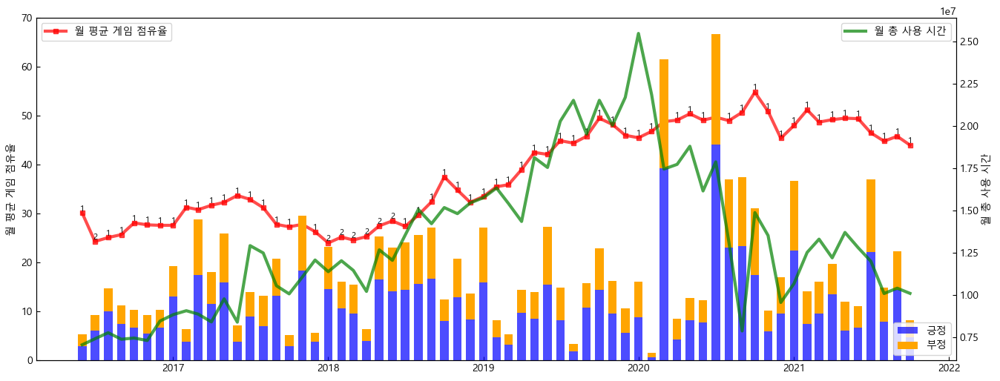

In [471]:
plt.style.use('default')
plt.rc("font", family="Malgun Gothic")

fig, ax1 = plt.subplots(figsize=(16,6))

ax1.plot(date, game_share, '-s', color='red', markersize=4, linewidth=3, alpha=0.7, label='월 평균 게임 점유율')
ax1.set_ylim(0, 70)
ax1.set_ylabel('월 평균 게임 점유율')
ax1.tick_params(axis='both', direction='in')
ax1.legend(loc='upper left')

ax2 = ax1.twinx()
ax2.plot(date, user_count, color='green', markersize=4, linewidth=3, alpha=0.7, label='월 총 사용 시간')
ax2.set_ylabel('월 총 사용 시간')
ax2.tick_params(axis='y', direction='in')
ax2.legend(loc='upper right')

ax3 = ax1.twinx()
ax3.bar(date, positive, color='blue', label='긍정', alpha=0.7, width=np.timedelta64(20, 'D'))
ax3.bar(date, negative, color='orange', label='부정', width=np.timedelta64(20, 'D'), bottom=positive)
ax3.axis('off')
ax3.legend(loc='lower right')

ax2.set_zorder(ax3.get_zorder() + 10)
ax2.patch.set_visible(False)

for i, v in enumerate(date):
    ax1.text(v, game_share[i], round(rank[i]),                 # 좌표 (x축 = v, y축 = y[0]..y[1], 표시 = y[0]..y[1])
             fontsize = 8, 
             color='black',
             horizontalalignment='center',  # horizontalalignment (left, center, right)
             verticalalignment='bottom')    # verticalalignment (top, center, bottom)

plt.show()

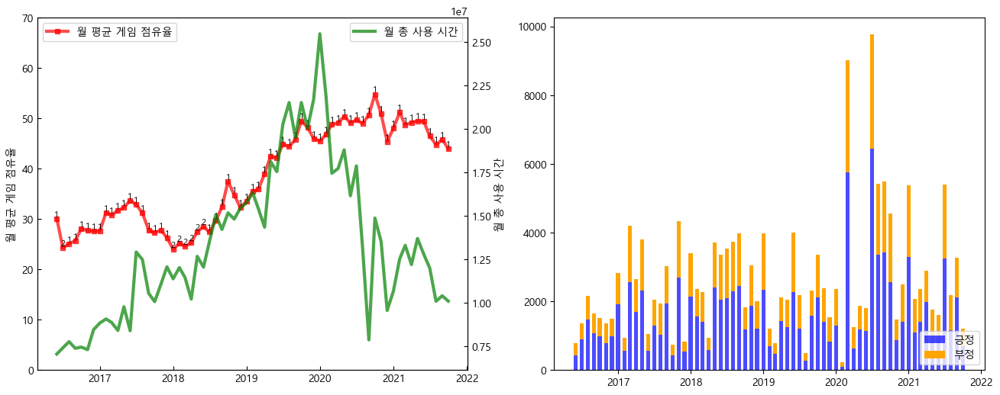

In [472]:
plt.style.use('default')
plt.rc("font", family="Malgun Gothic")

fig, ax = plt.subplots(nrows=1, ncols= 2, figsize=(16,6))

ax[0].plot(date, game_share, '-s', color='red', markersize=4, linewidth=3, alpha=0.7, label='월 평균 게임 점유율')
ax[0].set_ylim(0, 70)
ax[0].set_ylabel('월 평균 게임 점유율')
ax[0].tick_params(axis='both', direction='in')
ax[0].legend(loc='upper left')

ax2 = ax[0].twinx()
ax2.plot(date, user_count, color='green', markersize=4, linewidth=3, alpha=0.7, label='월 총 사용 시간')
ax2.set_ylabel('월 총 사용 시간')
ax2.tick_params(axis='y', direction='in')
ax2.legend(loc='upper right')

ax[1].bar(date, positive, color='blue', label='긍정', alpha=0.7, width=np.timedelta64(20, 'D'))
ax[1].bar(date, negative, color='orange', label='부정', width=np.timedelta64(20, 'D'), bottom=positive)
ax[1].legend(loc='lower right')


for i, v in enumerate(date):
    ax[0].text(v, game_share[i], round(rank[i]),                 # 좌표 (x축 = v, y축 = y[0]..y[1], 표시 = y[0]..y[1])
             fontsize = 8, 
             color='black',
             horizontalalignment='center',  # horizontalalignment (left, center, right)
             verticalalignment='bottom')    # verticalalignment (top, center, bottom)

plt.show()

### 함수화
- '리그 오브 레전드' 게임 시각화 예시를 활용하여 게임이름을 받아 그래프를 나타내는 함수 제작

In [518]:
def draw_plot_1(game_name):
    
    #데이터 선택
    game_date = game_data[game_data['GameName'] == game_name]['date'].values
    comment_date = comment_data[comment_data['GameName'] == game_name]['date'].values

    #리그 오브 레전드의 순위, 점유율, 사용 시간
    rank = game_data[game_data['GameName'] == game_name]['BestGameRank'].values
    game_share = game_data[game_data['GameName'] == game_name]['AverageGameShare'].values
    user_count = game_data[game_data['GameName'] == game_name]['UserCountTotal'].values

    #리그 오브 레전드의 인벤, 유튜브 댓글

    inven_positive = comment_data[comment_data['GameName'] == game_name]['Inven_positive'].values
    inven_negative = comment_data[comment_data['GameName'] == game_name]['Inven_negative'].values

    steam_positive = comment_data[comment_data['GameName'] == game_name]['Steam_positive'].values
    steam_negative = comment_data[comment_data['GameName'] == game_name]['Steam_negative'].values

    youtube_positive = comment_data[comment_data['GameName'] == game_name]['Youtube_positive'].values
    youtube_negative = comment_data[comment_data['GameName'] == game_name]['Youtube_negative'].values
    
    
    for i in range(len(inven_positive)):
        if np.isnan(inven_positive[i]):
            inven_positive[i] = 0
        if np.isnan(inven_negative[i]):
            inven_negative[i] = 0
            
        if np.isnan(steam_positive[i]):
            steam_positive[i] = 0
        if np.isnan(steam_negative[i]):
            steam_negative[i] = 0
            
        if np.isnan(youtube_positive[i]):
            youtube_positive[i] = 0
        if np.isnan(youtube_negative[i]):
            youtube_negative[i] = 0

    positive = [x + y + z for x, y, z in zip(inven_positive, steam_positive, youtube_positive)]
    negative = [x + y + z for x, y, z in zip(inven_negative, steam_negative, youtube_negative)]
    
    #그래프 작성
    plt.style.use('default')
    plt.rc("font", family="Malgun Gothic")

    fig, ax1 = plt.subplots(figsize=(16,6))

    ax1.plot(game_date, game_share, '-s', color='red', markersize=4, linewidth=3, alpha=0.7, label='월 평균 게임 점유율')
    ax1.set_ylabel('월 평균 게임 점유율')
    ax1.tick_params(axis='both', direction='in')
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    ax2.plot(game_date, user_count, color='green', markersize=4, linewidth=3, alpha=0.7, label='월 총 사용 시간')
    ax2.set_ylabel('월 총 사용 시간')
    ax2.tick_params(axis='y', direction='in')
    ax2.legend(loc='upper right')

    ax3 = ax1.twinx()
    ax3.bar(comment_date, positive, color='blue', label='긍정', alpha=0.7, width=np.timedelta64(20, 'D'))
    ax3.bar(comment_date, negative, color='orange', label='부정', width=np.timedelta64(20, 'D'), bottom=positive)
    ax3.axis('off')
    ax3.legend(loc='lower right')

    ax2.set_zorder(ax3.get_zorder() + 10)
    ax2.patch.set_visible(False)

    for i, v in enumerate(game_date):
        ax1.text(v, game_share[i], round(rank[i]),                 # 좌표 (x축 = v, y축 = y[0]..y[1], 표시 = y[0]..y[1])
                 fontsize = 8, 
                 color='black',
                 horizontalalignment='center',  # horizontalalignment (left, center, right)
                 verticalalignment='bottom')    # verticalalignment (top, center, bottom)

    plt.show()

In [519]:
def draw_plot_2(game_name):
    
    #데이터 선택
    game_date = game_data[game_data['GameName'] == game_name]['date'].values
    comment_date = comment_data[comment_data['GameName'] == game_name]['date'].values

    #리그 오브 레전드의 순위, 점유율, 사용 시간
    rank = game_data[game_data['GameName'] == game_name]['BestGameRank'].values
    game_share = game_data[game_data['GameName'] == game_name]['AverageGameShare'].values
    user_count = game_data[game_data['GameName'] == game_name]['UserCountTotal'].values

    #리그 오브 레전드의 인벤, 유튜브 댓글

    inven_positive = comment_data[comment_data['GameName'] == game_name]['Inven_positive'].values
    inven_negative = comment_data[comment_data['GameName'] == game_name]['Inven_negative'].values

    steam_positive = comment_data[comment_data['GameName'] == game_name]['Steam_positive'].values
    steam_negative = comment_data[comment_data['GameName'] == game_name]['Steam_negative'].values

    youtube_positive = comment_data[comment_data['GameName'] == game_name]['Youtube_positive'].values
    youtube_negative = comment_data[comment_data['GameName'] == game_name]['Youtube_negative'].values
    
    
    for i in range(len(inven_positive)):
        if np.isnan(inven_positive[i]):
            inven_positive[i] = 0
        if np.isnan(inven_negative[i]):
            inven_negative[i] = 0
            
        if np.isnan(steam_positive[i]):
            steam_positive[i] = 0
        if np.isnan(steam_negative[i]):
            steam_negative[i] = 0
            
        if np.isnan(youtube_positive[i]):
            youtube_positive[i] = 0
        if np.isnan(youtube_negative[i]):
            youtube_negative[i] = 0

    positive = [x + y + z for x, y, z in zip(inven_positive, steam_positive, youtube_positive)]
    negative = [x + y + z for x, y, z in zip(inven_negative, steam_negative, youtube_negative)]
    
    #그래프 작성
    plt.style.use('default')
    plt.rc("font", family="Malgun Gothic")

    fig, ax = plt.subplots(nrows=1, ncols= 2, figsize=(16,6))

    ax[0].plot(game_date, game_share, '-s', color='red', markersize=4, linewidth=3, alpha=0.7, label='월 평균 게임 점유율')
    ax[0].set_ylabel('월 평균 게임 점유율')
    ax[0].tick_params(axis='both', direction='in')
    ax[0].legend(loc='upper left')

    ax2 = ax[0].twinx()
    ax2.plot(game_date, user_count, color='green', markersize=4, linewidth=3, alpha=0.7, label='월 총 사용 시간')
    ax2.set_ylabel('월 총 사용 시간')
    ax2.tick_params(axis='y', direction='in')
    ax2.legend(loc='upper right')

    ax[1].bar(comment_date, positive, color='blue', label='긍정', alpha=0.7, width=np.timedelta64(20, 'D'))
    ax[1].bar(comment_date, negative, color='orange', label='부정', width=np.timedelta64(20, 'D'), bottom=positive)
    ax[1].legend(loc='lower right')


    for i, v in enumerate(game_date):
        ax[0].text(v, game_share[i], round(rank[i]),                 # 좌표 (x축 = v, y축 = y[0]..y[1], 표시 = y[0]..y[1])
                 fontsize = 8, 
                 color='black',
                 horizontalalignment='center',  # horizontalalignment (left, center, right)
                 verticalalignment='bottom')    # verticalalignment (top, center, bottom)

    plt.show()

65


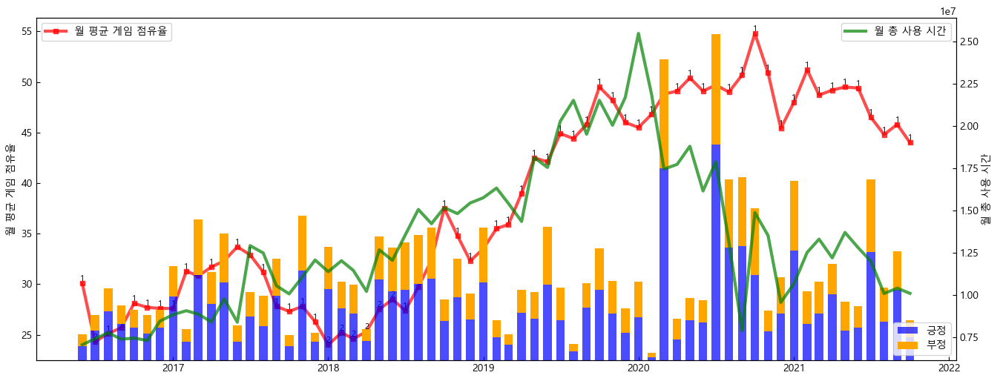

In [511]:
draw_plot_1('리그 오브 레전드')

65


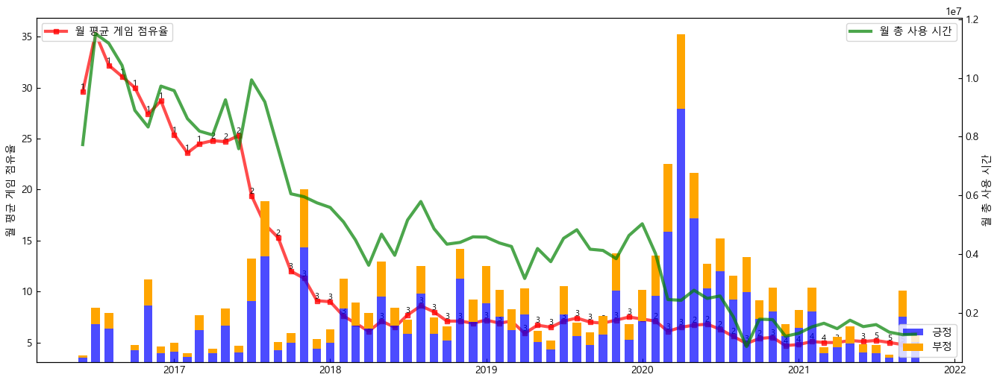

In [513]:
draw_plot_1('오버워치')

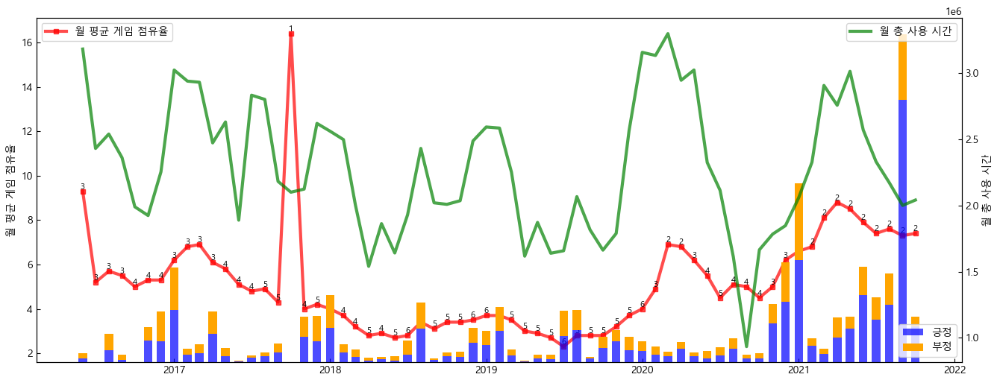

In [522]:
draw_plot_1('서든어택')

65


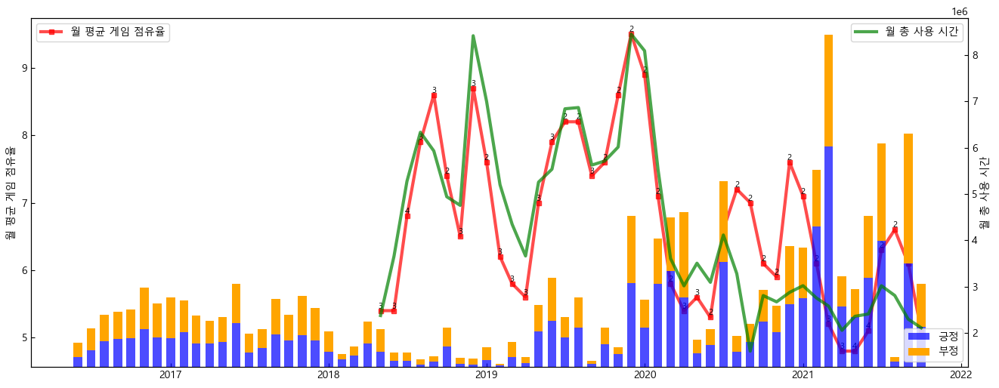

In [515]:
draw_plot_1('FIFA 온라인 4')

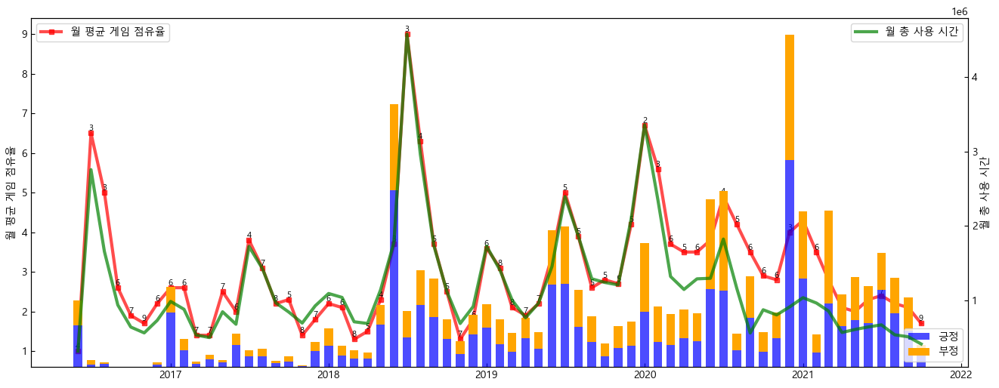

In [523]:
draw_plot_1('메이플스토리')

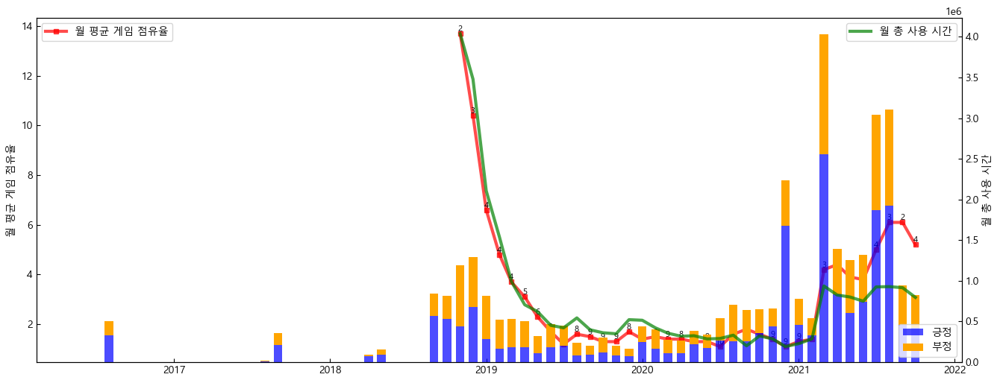

In [520]:
draw_plot_1('로스트아크')

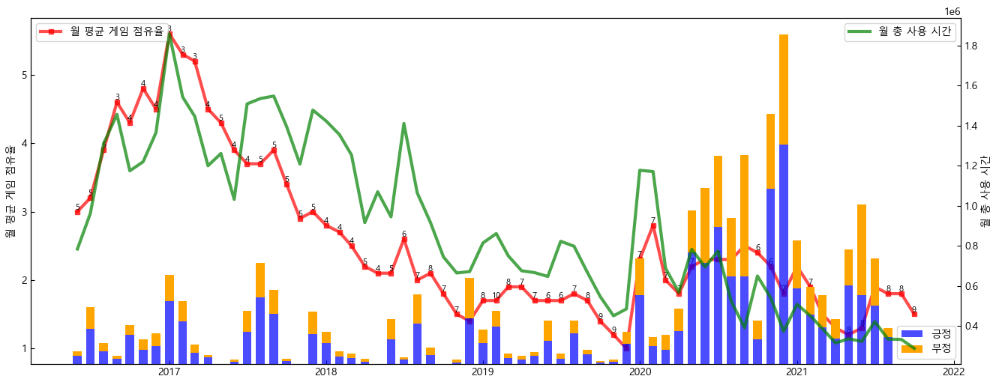

In [525]:
draw_plot_1('던전앤파이터')

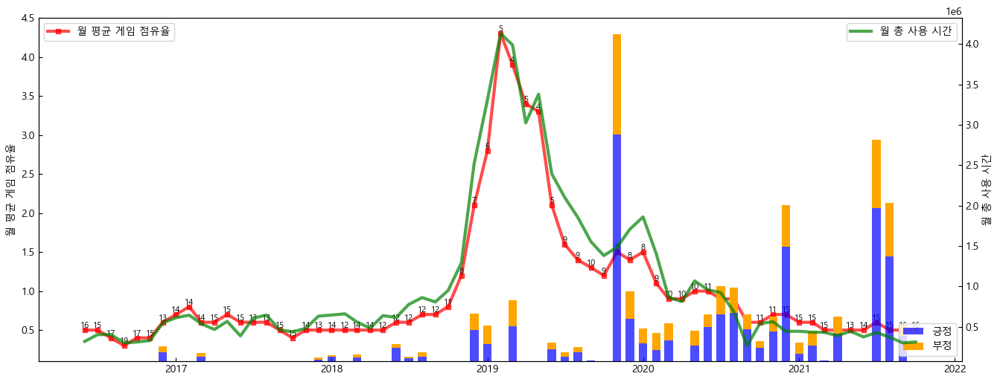

In [526]:
draw_plot_1('카트라이더')

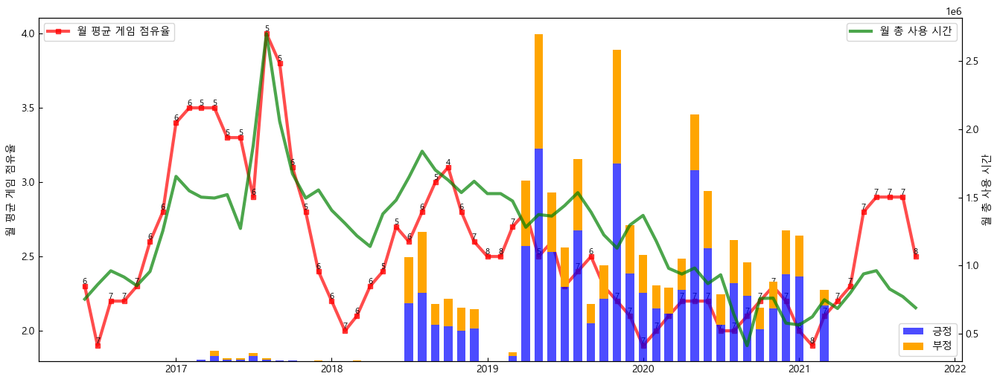

In [527]:
draw_plot_1('스타크래프트 리마스터')

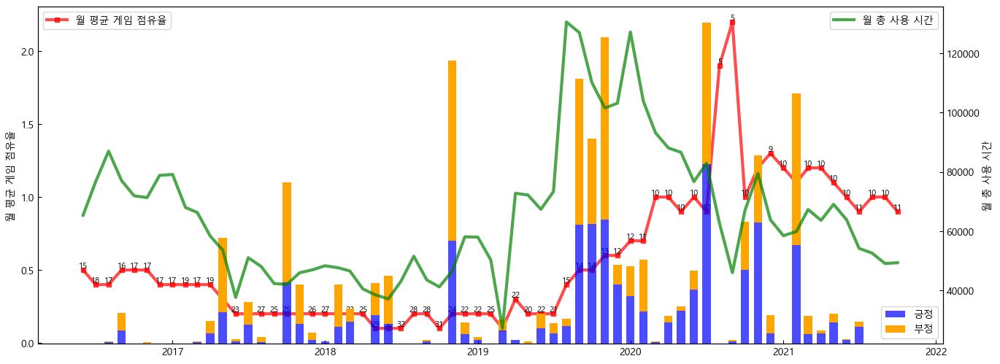

In [528]:
draw_plot_1('리니지2')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


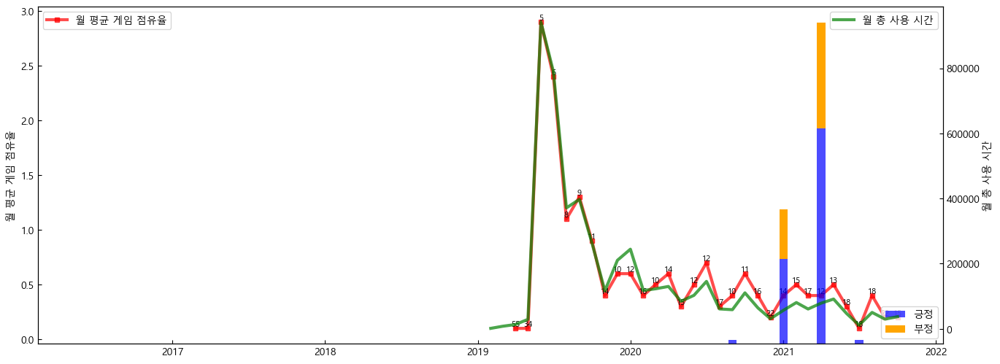

In [529]:
draw_plot_1('패스 오브 엑자일')

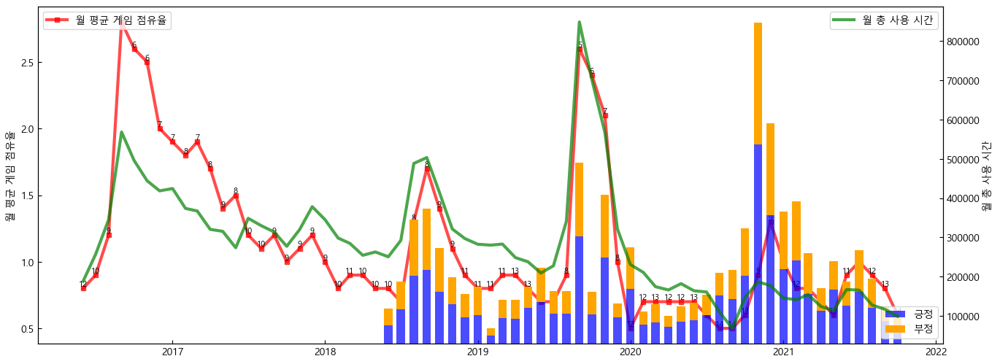

In [530]:
draw_plot_1('월드 오브 워크래프트')

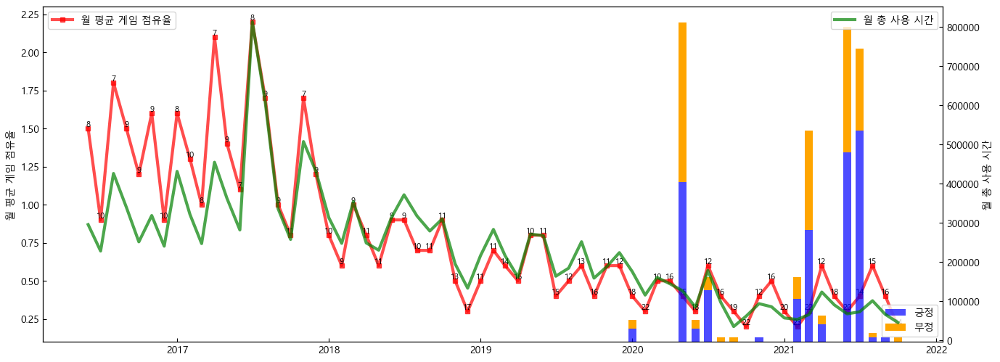

In [531]:
draw_plot_1('디아블로3')

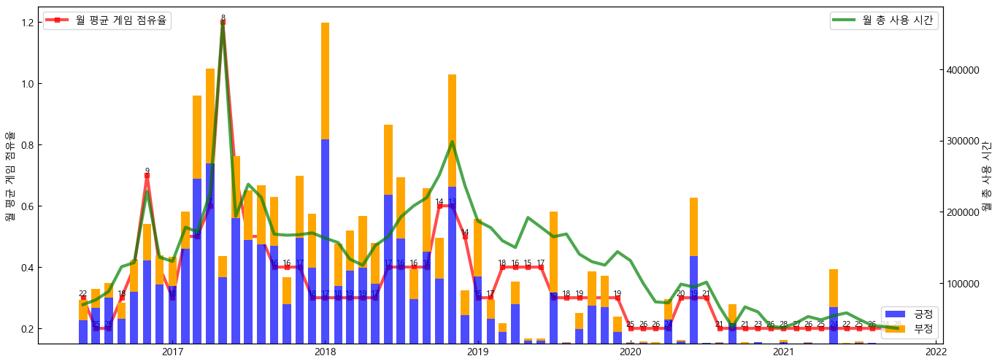

In [532]:
draw_plot_1('히어로즈 오브 더 스톰')

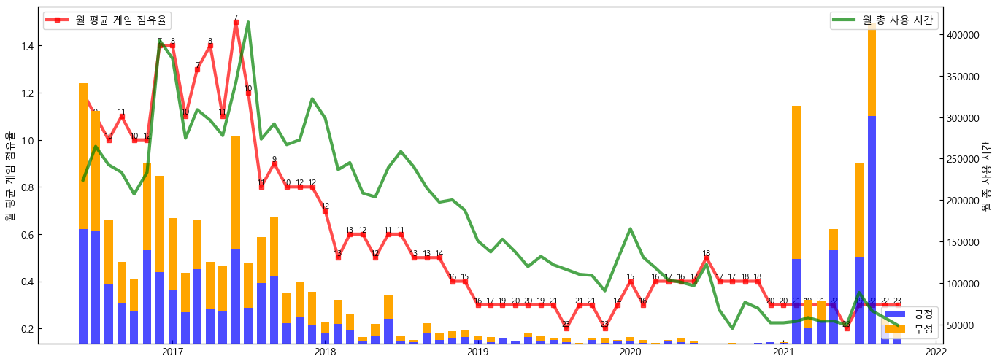

In [533]:
draw_plot_1('블레이드 & 소울')

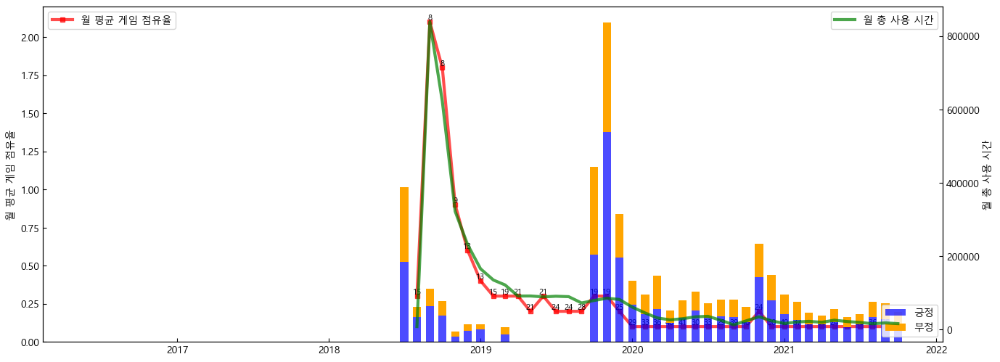

In [534]:
draw_plot_1('Destiny: Guardians')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


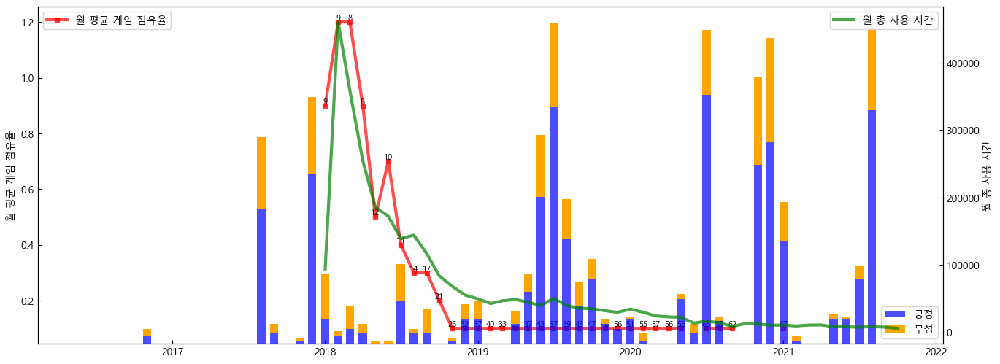

In [536]:
draw_plot_1('천애명월도')

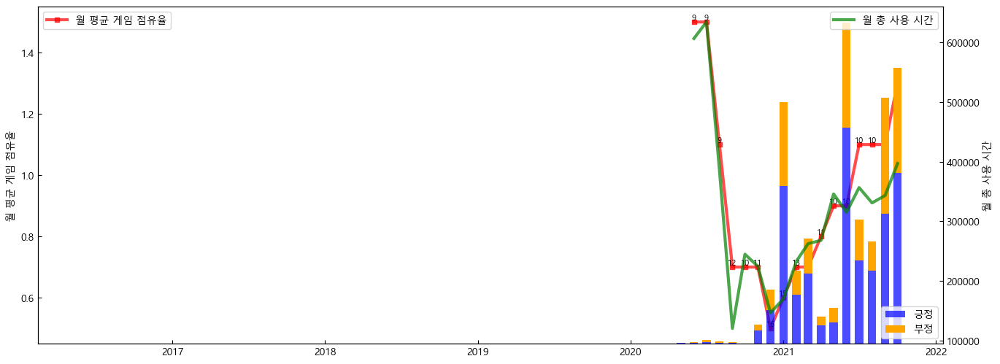

In [537]:
draw_plot_1('발로란트')

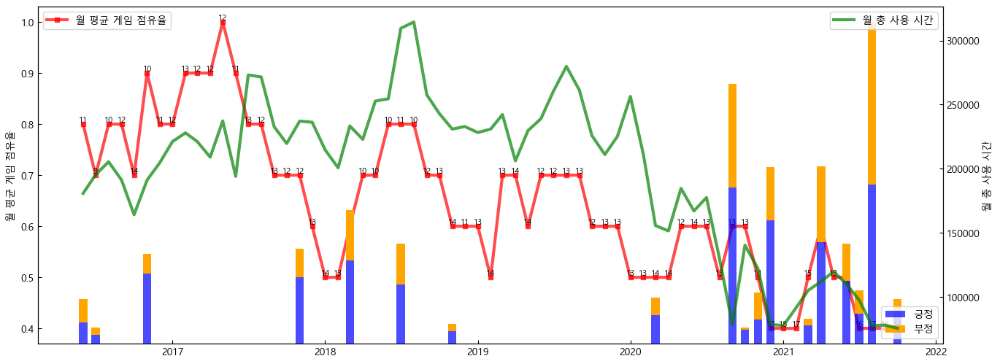

In [538]:
draw_plot_1('사이퍼즈')

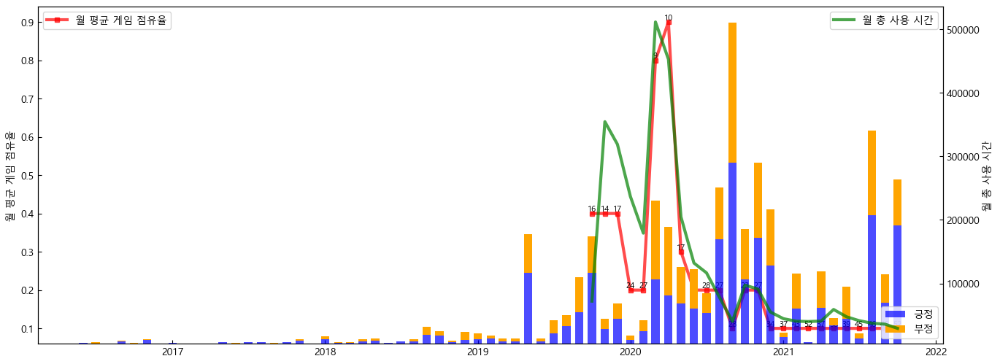

In [540]:
draw_plot_1('콜 오브 듀티: 모던 워페어')

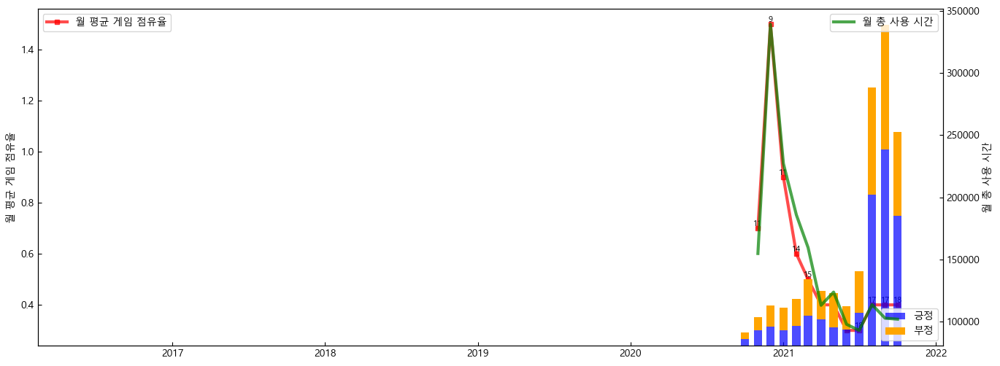

In [541]:
draw_plot_1('이터널 리턴')

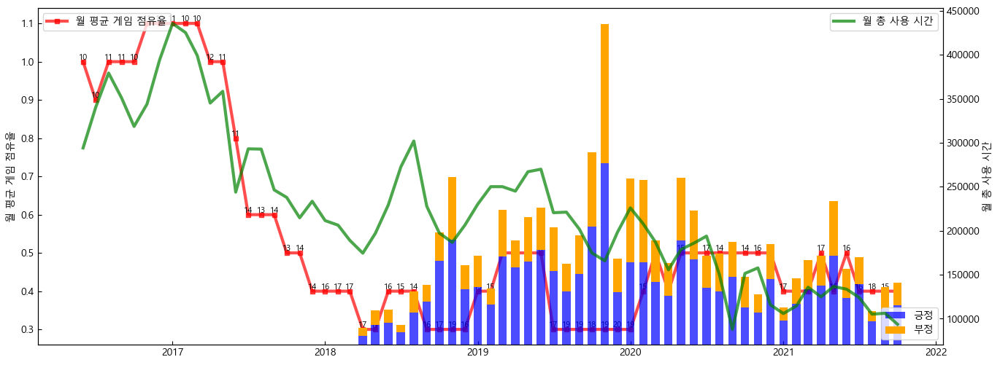

In [542]:
draw_plot_1('워크래프트3 리포지드')

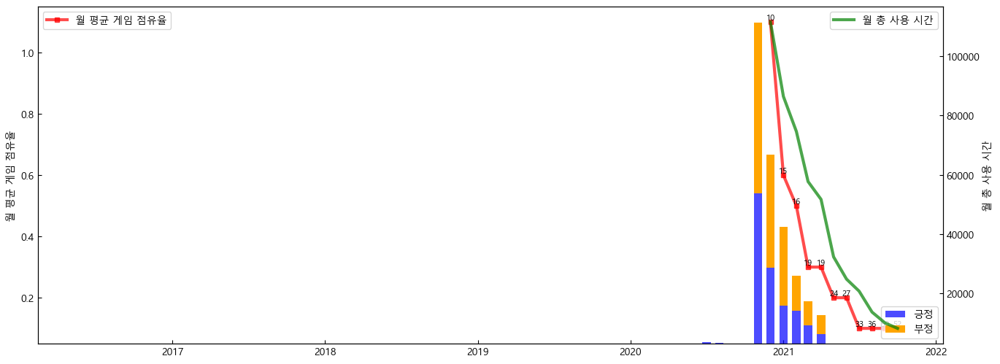

In [543]:
draw_plot_1('엘리온')

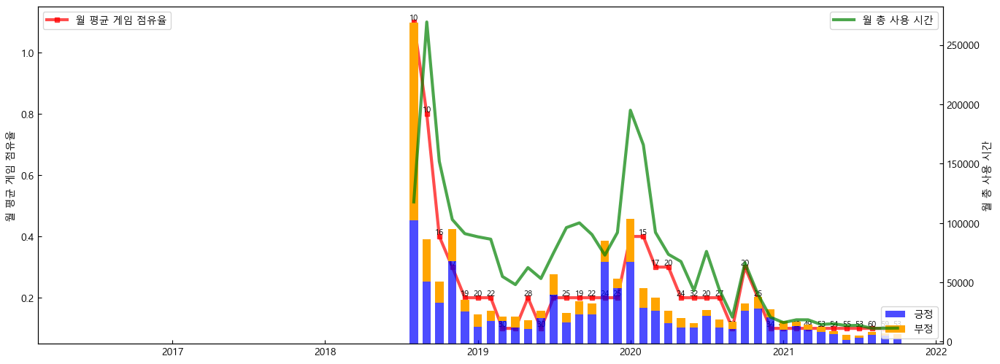

In [544]:
draw_plot_1('Monster Hunter : World')

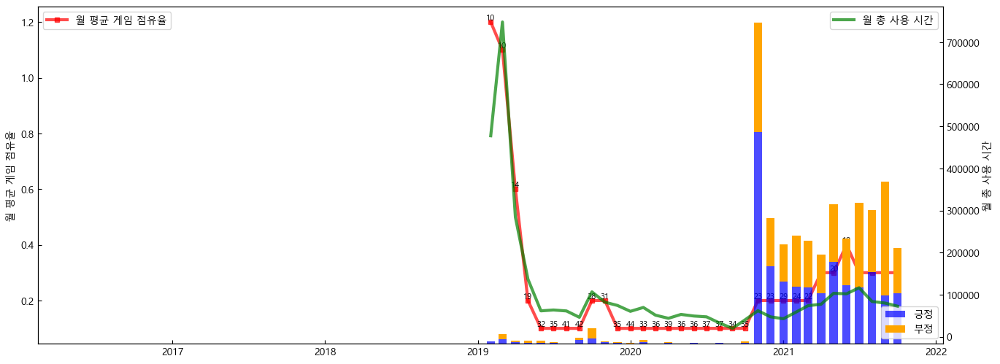

In [545]:
draw_plot_1('APEX LEGENDS')

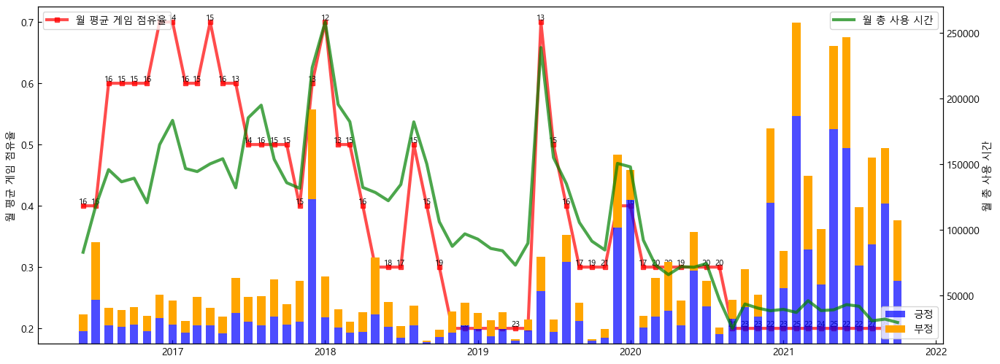

In [547]:
draw_plot_1('검은사막')

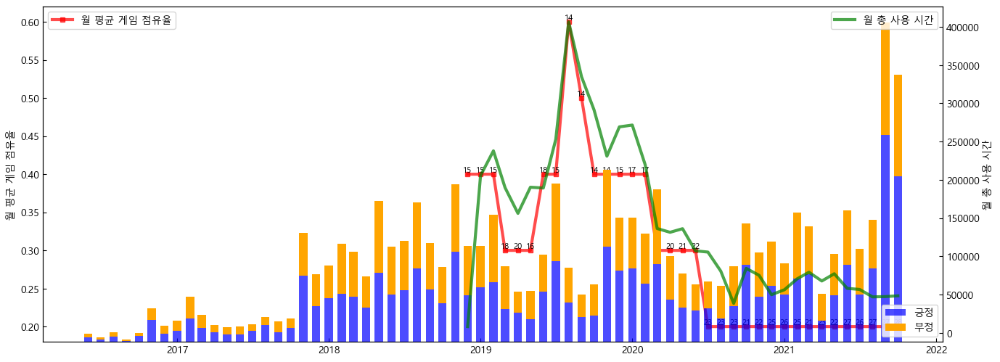

In [548]:
draw_plot_1('레인보우식스 시즈')

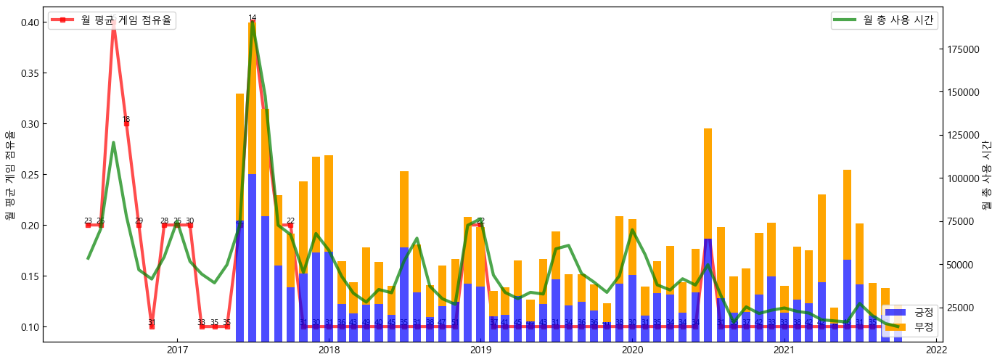

In [549]:
draw_plot_1('마비노기 영웅전')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

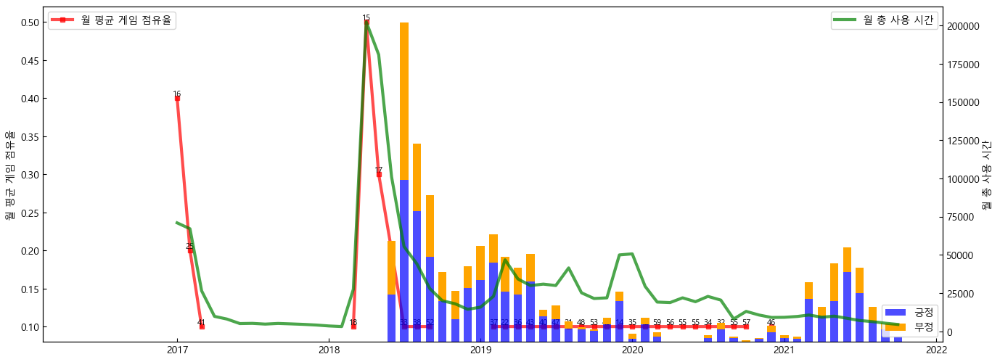

In [550]:
draw_plot_1('소울워커')

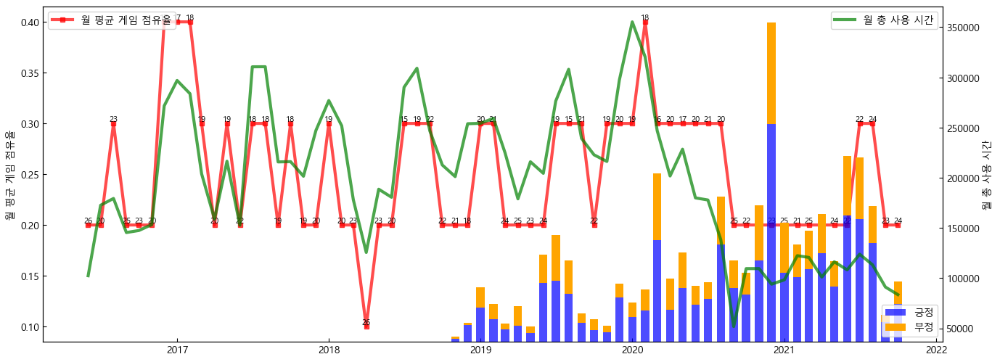

In [551]:
draw_plot_1('테일즈런너')

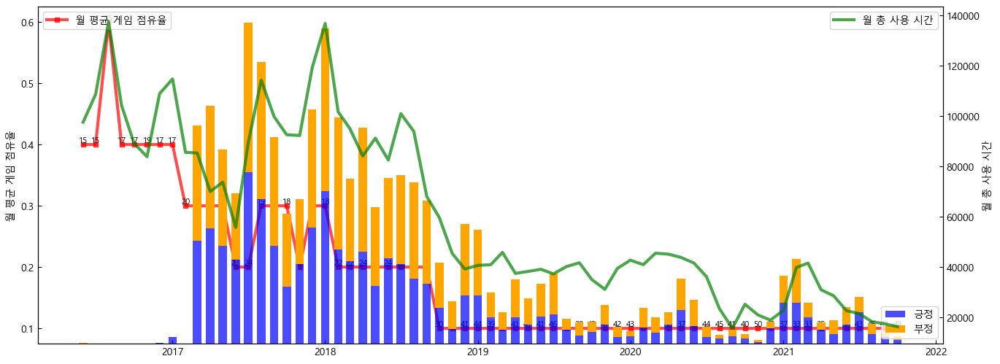

In [552]:
draw_plot_1('테라')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


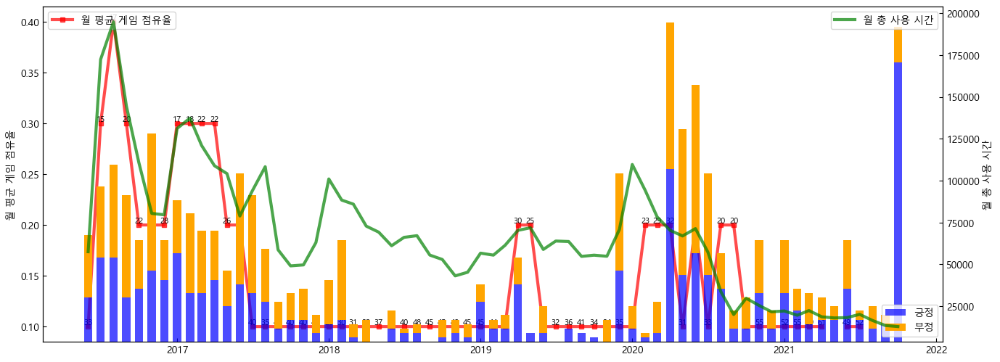

In [553]:
draw_plot_1('아키에이지')

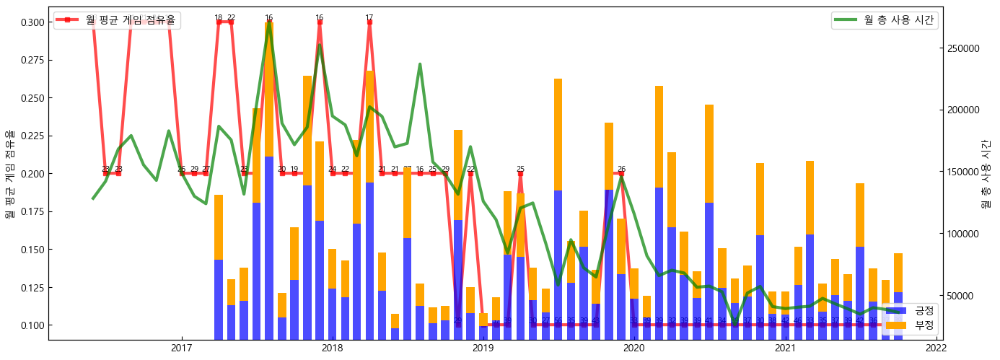

In [554]:
draw_plot_1('하스스톤')

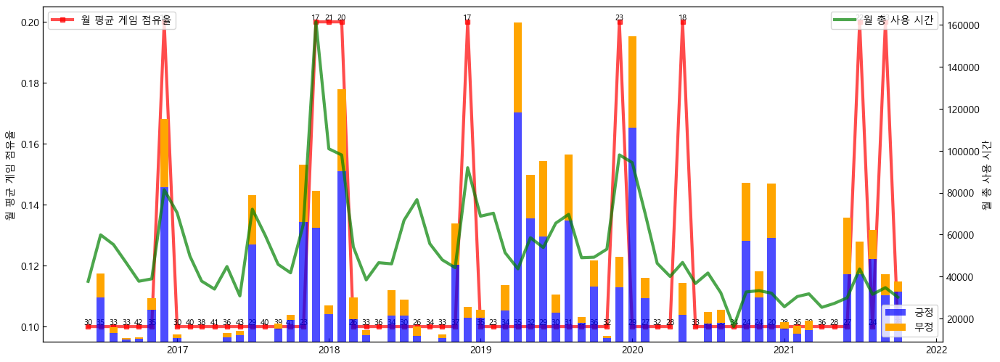

In [555]:
draw_plot_1('엘소드')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

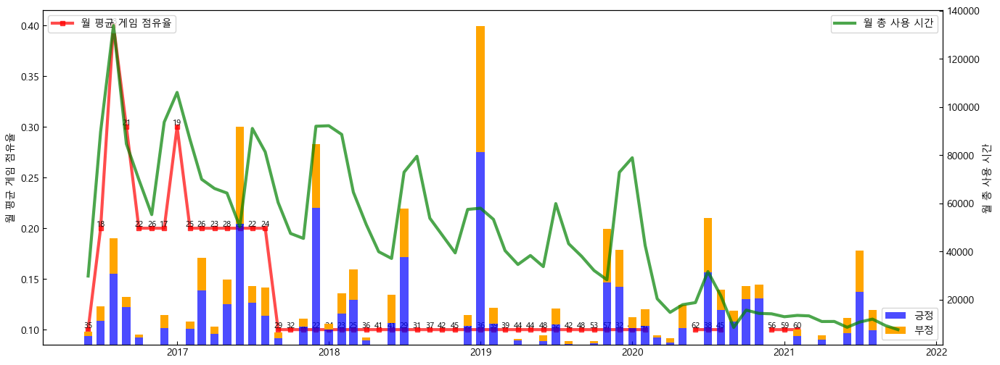

In [556]:
draw_plot_1('클로저스')

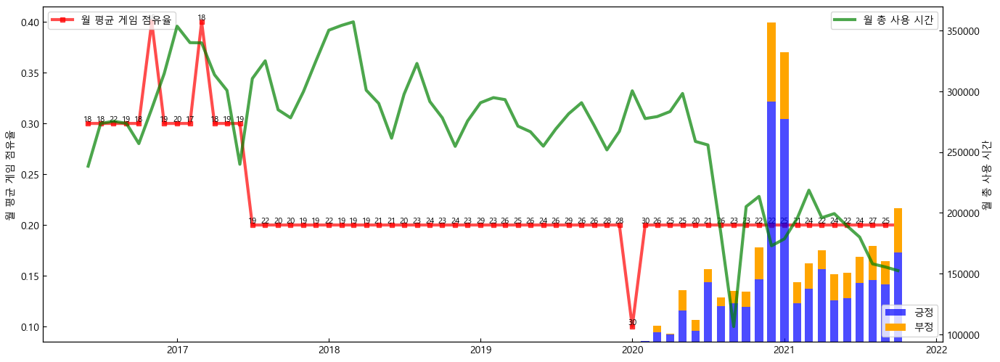

In [557]:
draw_plot_1('한게임 로우바둑이')

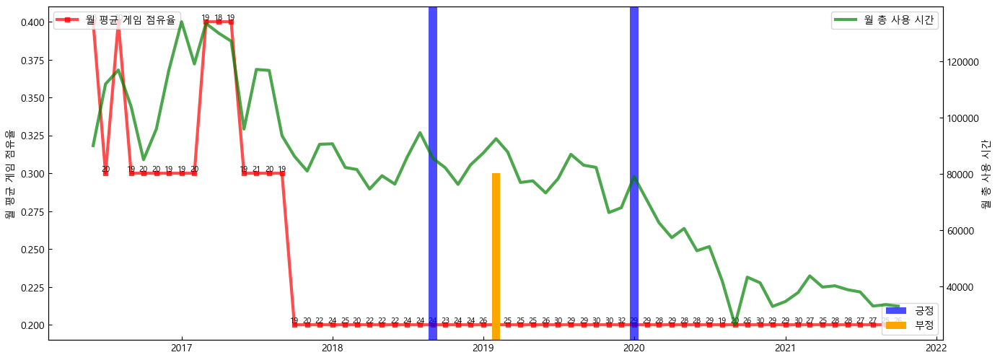

In [558]:
draw_plot_1('스페셜포스')

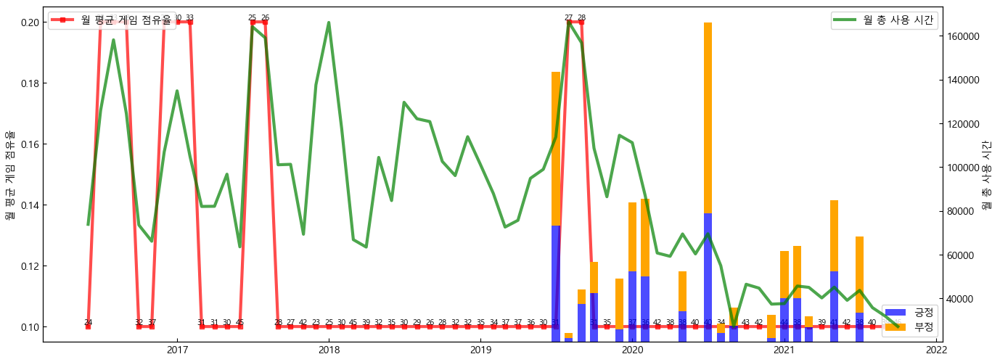

In [559]:
draw_plot_1('카운터-스트라이크 온라인')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


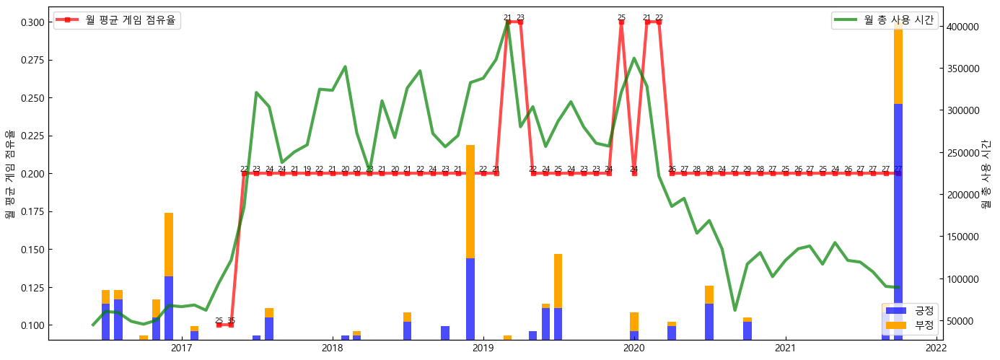

In [560]:
draw_plot_1('크레이지아케이드')

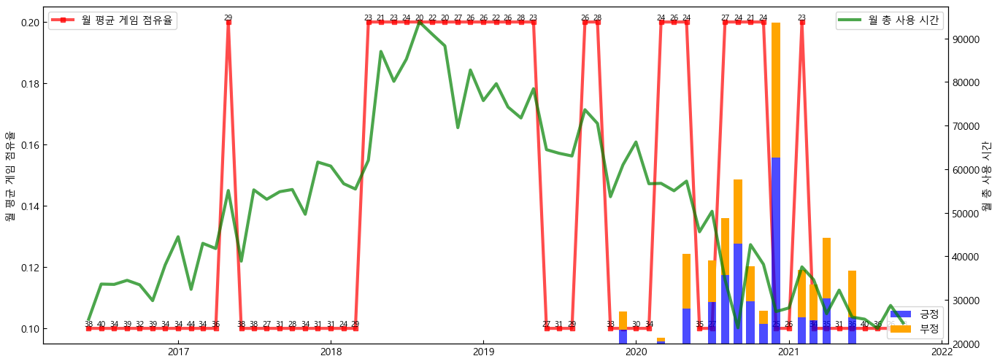

In [561]:
draw_plot_1('거상')

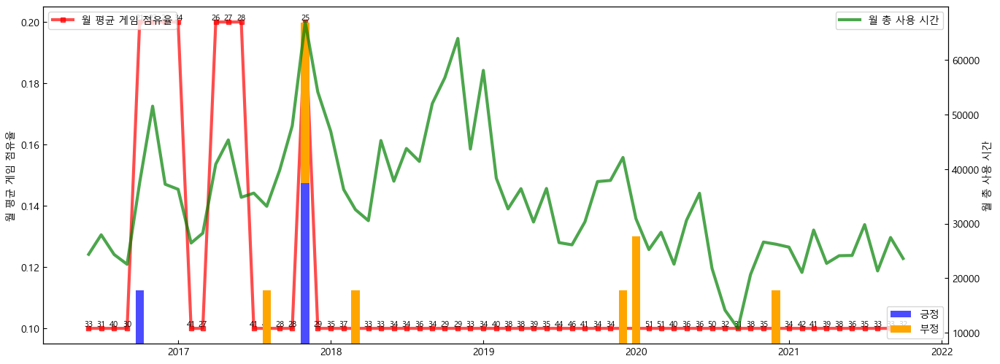

In [562]:
draw_plot_1('R2')

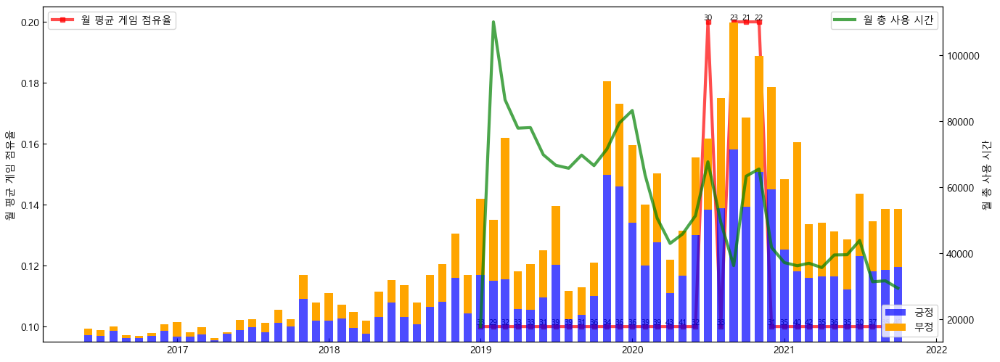

In [563]:
draw_plot_1('Dead by Daylight')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


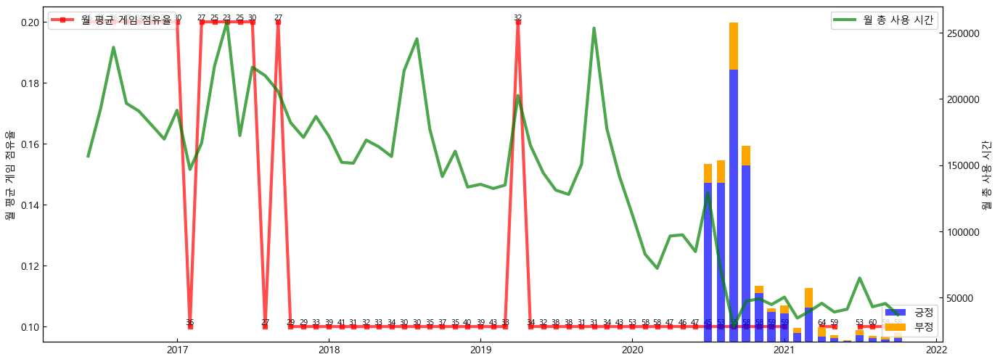

In [564]:
draw_plot_1('마구마구')

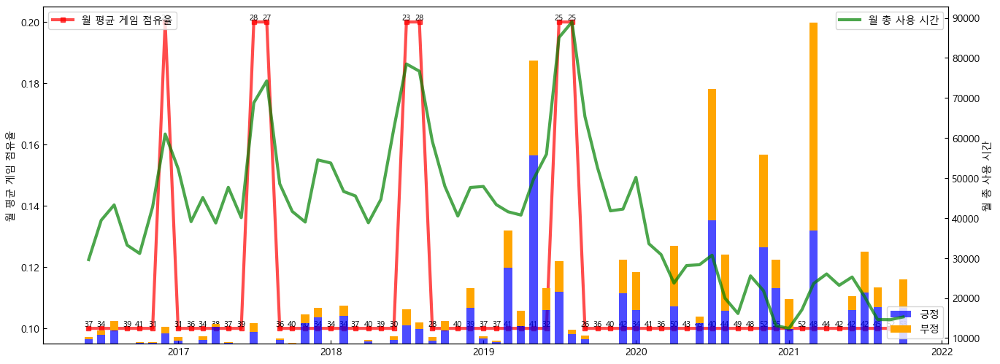

In [565]:
draw_plot_1('마비노기')

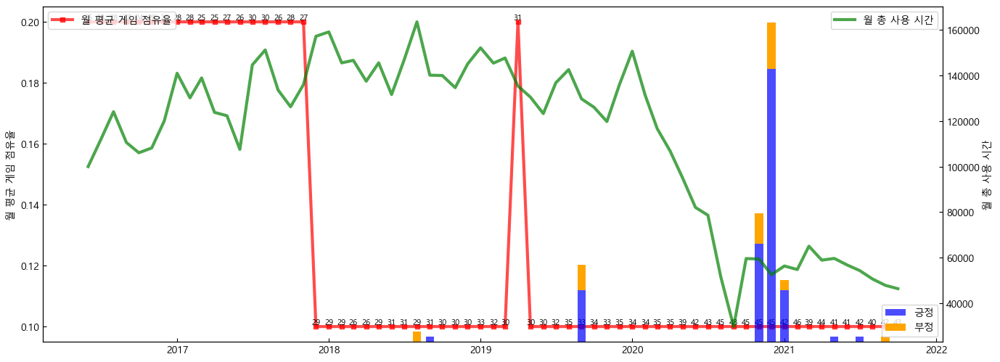

In [566]:
draw_plot_1('한게임 신맞고')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


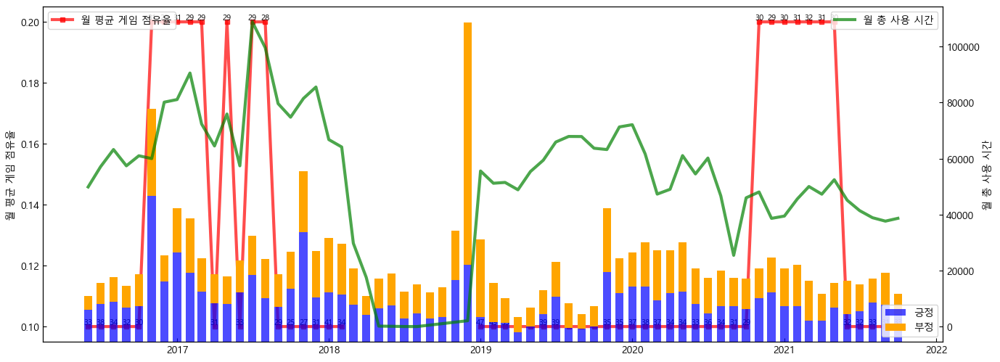

In [568]:
draw_plot_1('Counter-Strike : Global Offensive')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

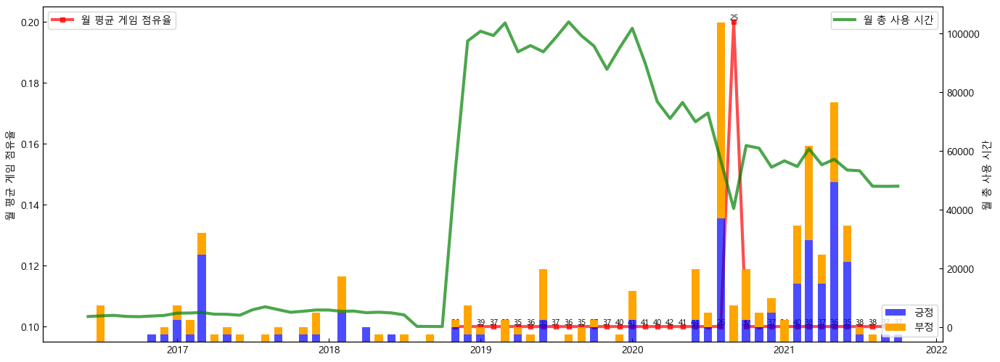

In [569]:
draw_plot_1('피망 고스톱')

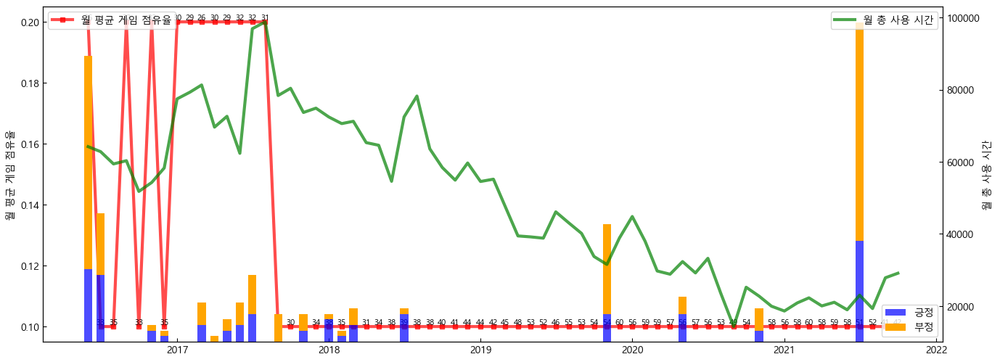

In [570]:
draw_plot_1('아바')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

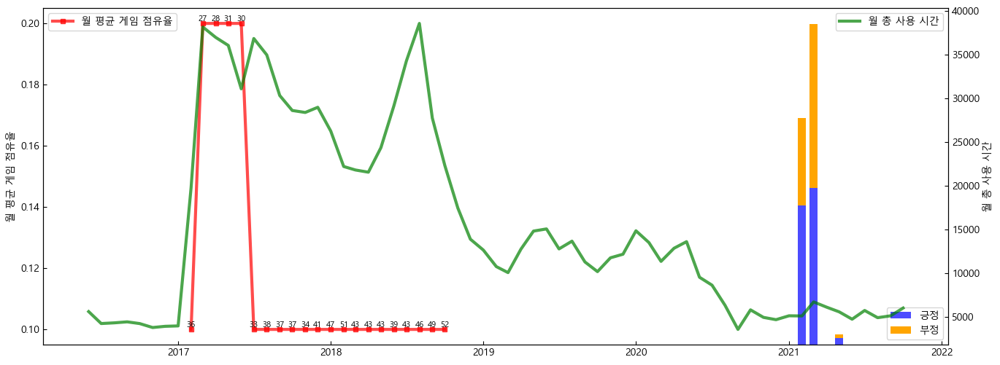

In [571]:
draw_plot_1('이카루스')

posx and posy should be finite values
posx and posy should be finite values


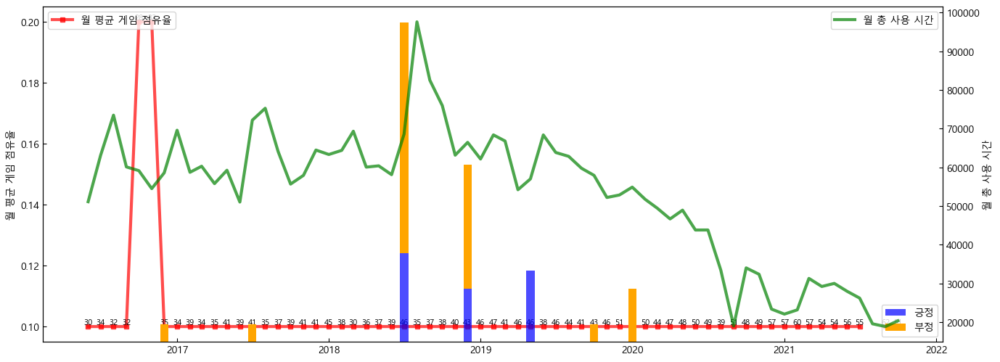

In [572]:
draw_plot_1('오디션')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


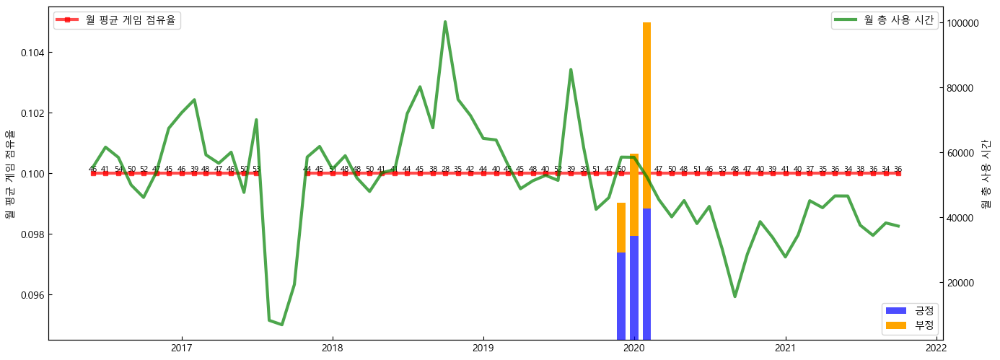

In [573]:
draw_plot_1('겟앰프드')

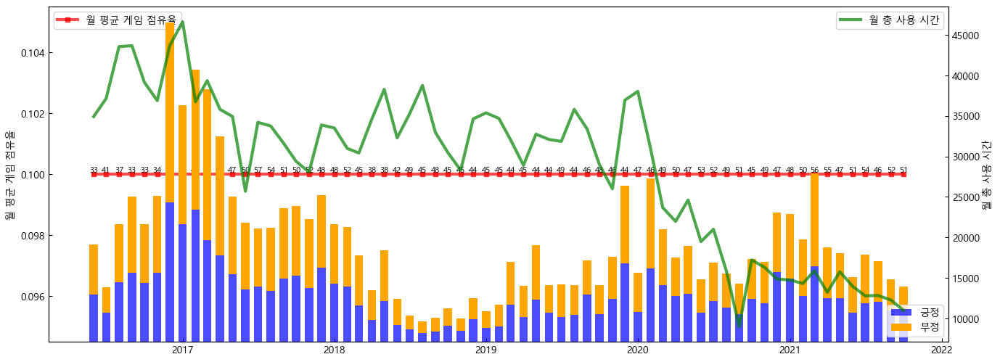

In [574]:
draw_plot_1('월드 오브 탱크')

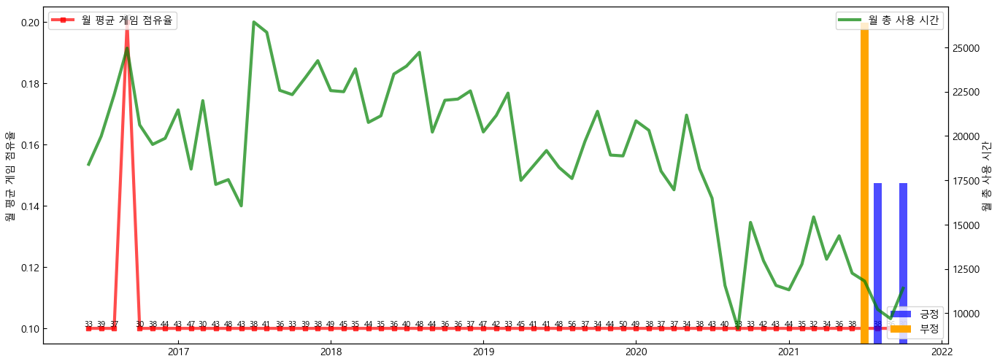

In [575]:
draw_plot_1('뮤 온라인')

posx and posy should be finite values
posx and posy should be finite values


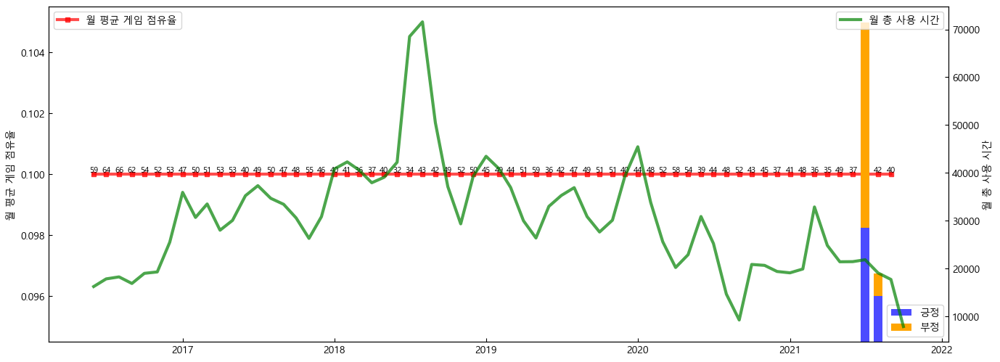

In [576]:
draw_plot_1('디아블로2')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


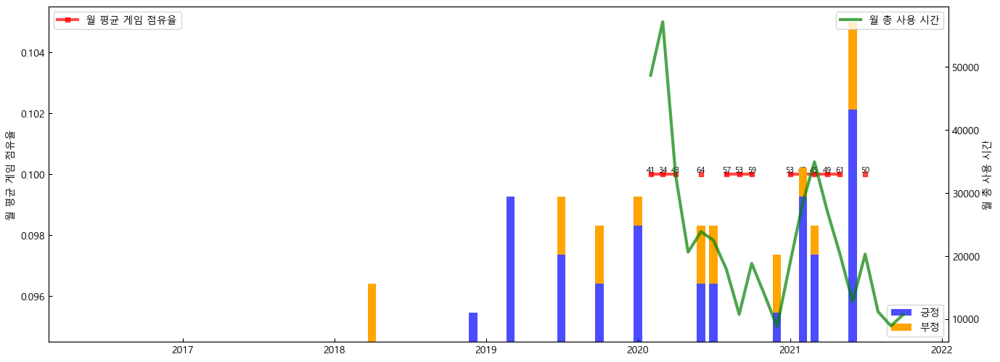

In [577]:
draw_plot_1('Escape from Tarkov')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


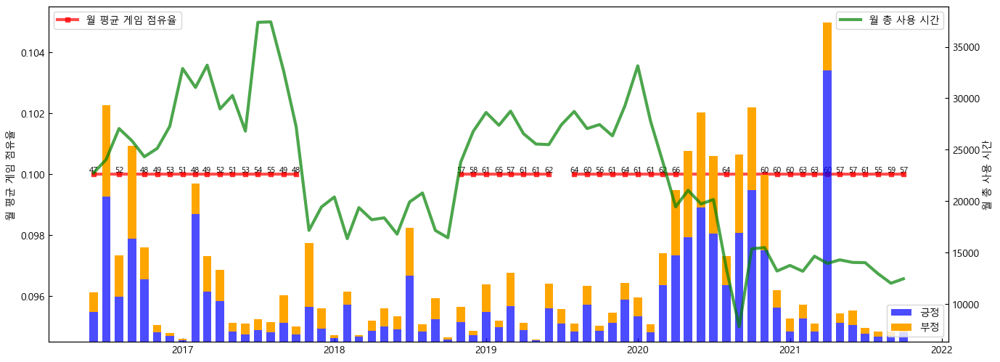

In [578]:
draw_plot_1('넷마블 바둑')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

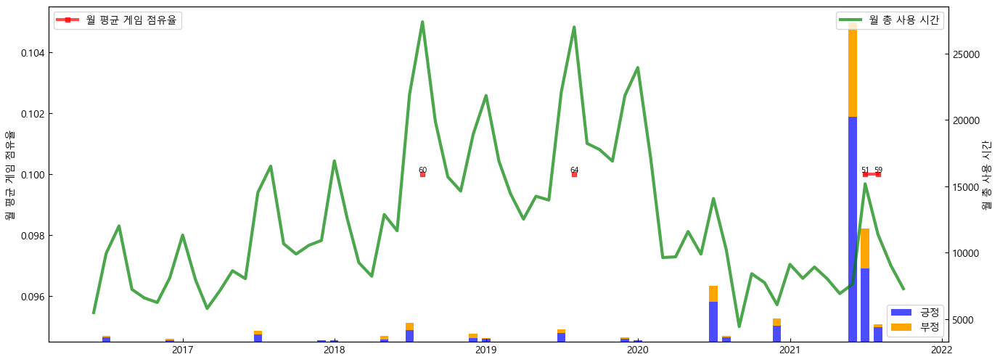

In [579]:
draw_plot_1('라테일')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

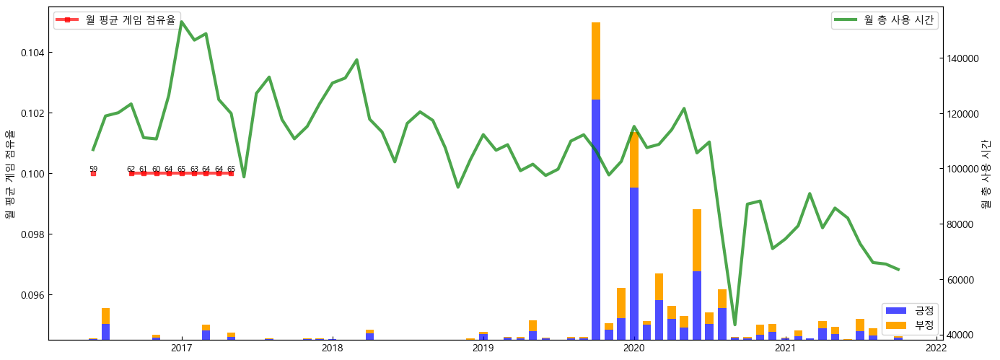

In [580]:
draw_plot_1('한게임 라스베가스 포커')

C:\Users\nsw20\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be fin

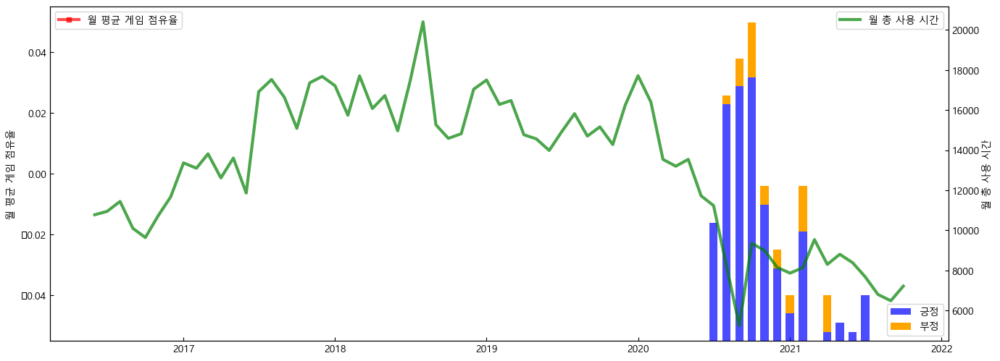

In [581]:
draw_plot_1('오로바둑')

C:\Users\nsw20\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be fin

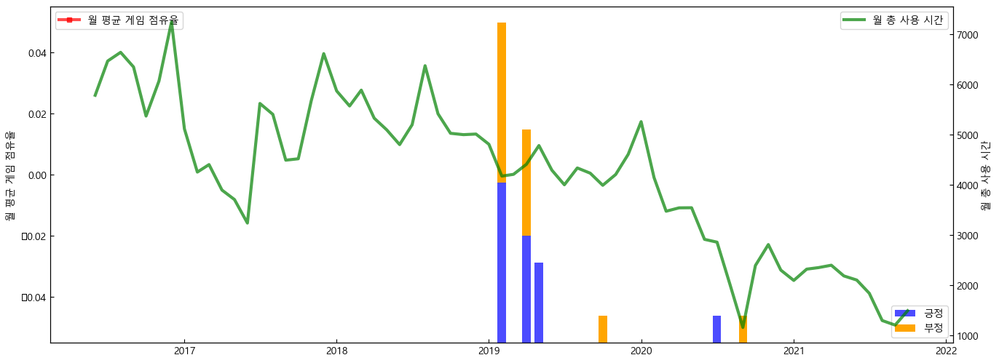

In [582]:
draw_plot_1('카발온라인')

C:\Users\nsw20\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be fin

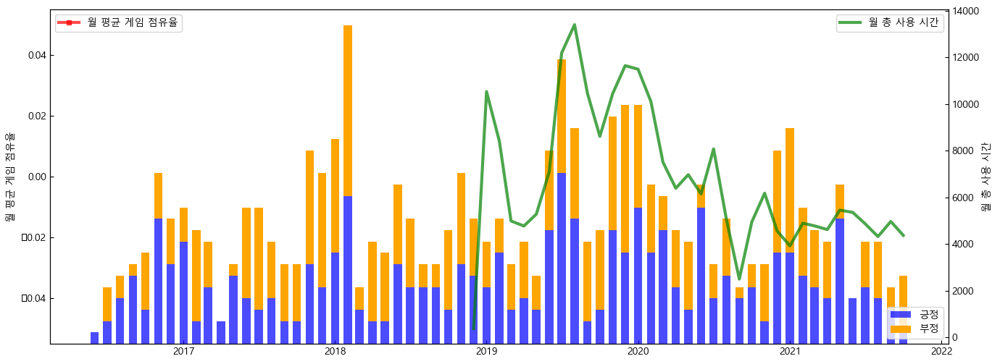

In [583]:
draw_plot_1('Rust')

C:\Users\nsw20\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be fin

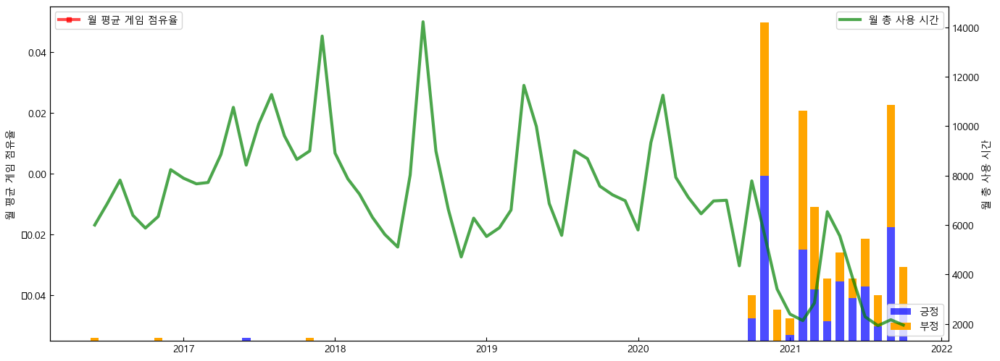

In [584]:
draw_plot_1('라그나로크')

C:\Users\nsw20\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be fin

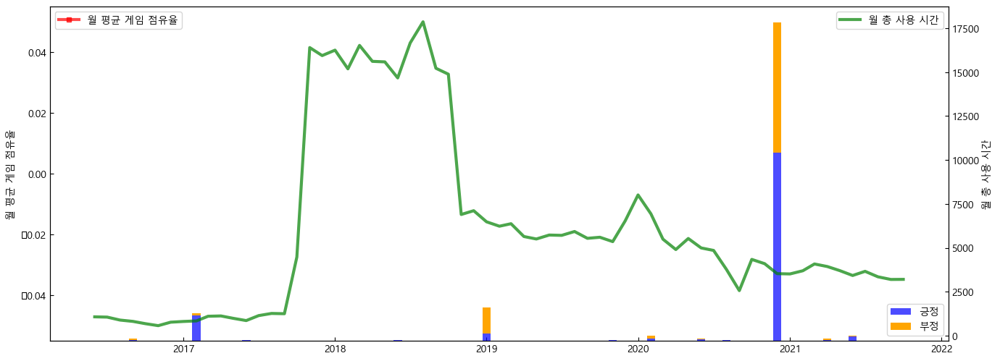

In [585]:
draw_plot_1('넷마블 바둑nTV')

C:\Users\nsw20\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
C:\Users\nsw20\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
posx

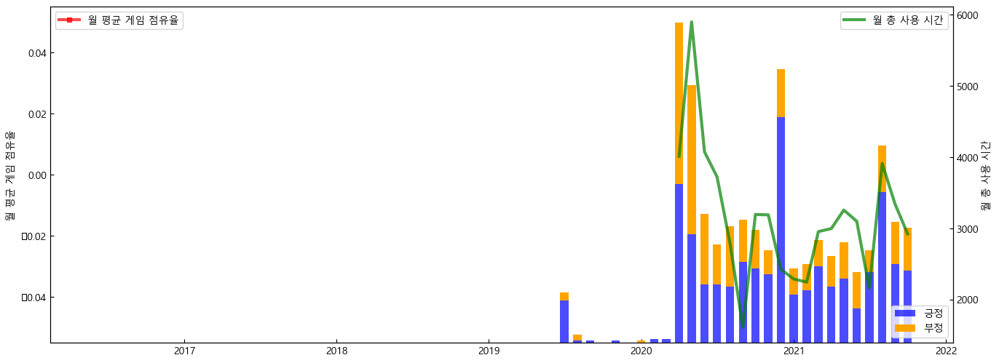

In [586]:
draw_plot_1('Conqueror\'s Blade')

C:\Users\nsw20\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be fin

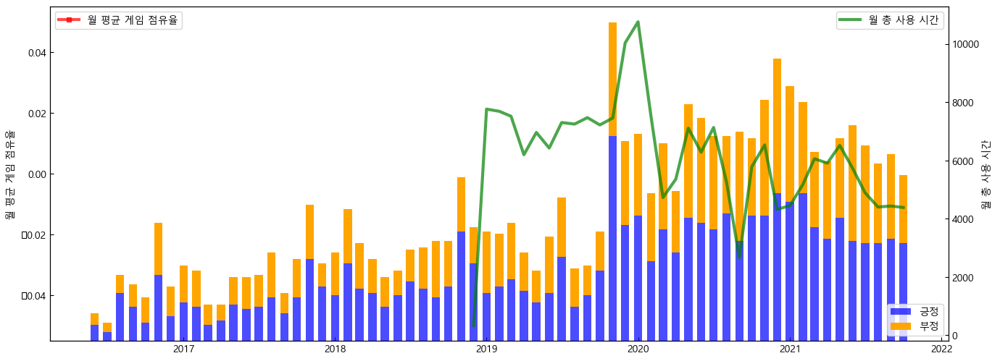

In [587]:
draw_plot_1('War Thunder')

C:\Users\nsw20\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
C:\Users\nsw20\Anaconda3\lib\site-packages\matplotlib\backends\ba

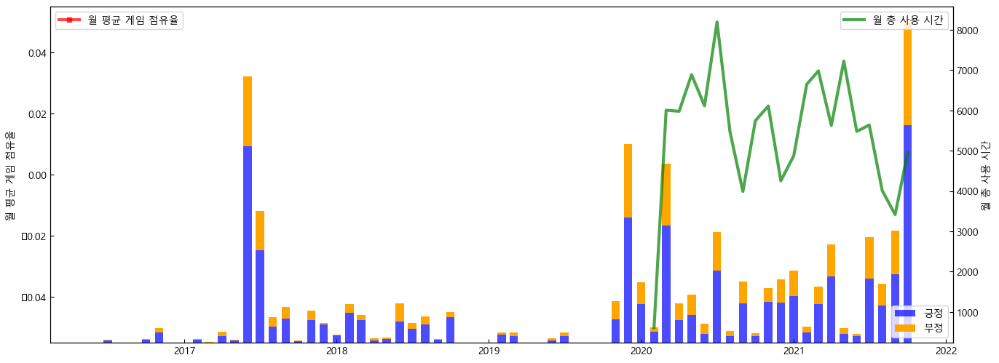

In [588]:
draw_plot_1('DJMAX RESPECT V')